In [1]:
import os
import sys
import math
import pandas as pd
import numpy as np
from collections import Counter
from tqdm import tqdm
tqdm.pandas(desc="progress-bar")
import time
import datetime
import spacy

mypath = './msk-redefining-cancer-treatment/'

import pandas as pd

from gensim.models import Doc2Vec
from sklearn import utils
from sklearn.model_selection import train_test_split
import gensim
from sklearn.linear_model import LogisticRegression
from gensim.models.doc2vec import TaggedDocument
import re
import seaborn as sns
import matplotlib.pyplot as plt

import multiprocessing

cores = multiprocessing.cpu_count()

import swifter
#pd.DataFrame.swifter.progress_bar(enable=True)
import dask.dataframe as dd
from dask.multiprocessing import get

from dask import dataframe as dd
from dask.multiprocessing import get
from multiprocessing import cpu_count

nCores = multiprocessing.cpu_count()
print('nCores', nCores)


/usr/local/lib/python3.6/dist-packages/tqdm/autonotebook/__init__.py:14: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  " (e.g. in jupyter console)", TqdmExperimentalWarning)


nCores 8


In [2]:
train_variants_df = pd.read_csv(mypath+"training_variants")
test_variants_df = pd.read_csv(mypath+"test_variants") # header added to data file
train_text_df = pd.read_csv(mypath+"training_text", sep="\|\|", engine="python", skiprows=1, names=["ID", "Text"])
test_text_df = pd.read_csv(mypath+"test_text", sep="\|\|", engine="python", skiprows=1, names=["ID", "Text"])

print(train_variants_df.columns)
print(test_variants_df.columns)
print(train_text_df.columns)
print(test_text_df.columns)

train_full_df = train_variants_df.merge(train_text_df, how="inner", left_on="ID", right_on="ID")
test_full_df = test_variants_df.merge(test_text_df, how="inner", left_on="ID", right_on="ID")

train_full_df = train_full_df.dropna()
test_full_df = test_full_df.dropna()

Index(['ID', 'Gene', 'Variation', 'Class'], dtype='object')
Index(['ID', 'Gene', 'Variation', 'Class'], dtype='object')
Index(['ID', 'Text'], dtype='object')
Index(['ID', 'Text'], dtype='object')


In [3]:
c = Counter()

def do_thing(x):
    if isinstance(x, float):
        print('float')
        print(x)
        return(0)
    x = x.split()
    c.update(x)
    return len(x)
train_full_df.loc[:, 'Text_count']  = train_full_df["Text"].apply(lambda x: do_thing(x))
train_full_df.head()

,ID,Gene,Variation,Class,Text,Text_count
0,0,FAM58A,Truncating Mutations,1,Cyclin-dependent kinases (CDKs) regulate a var...,6089
1,1,CBL,W802*,2,Abstract Background Non-small cell lung canc...,5722
2,2,CBL,Q249E,2,Abstract Background Non-small cell lung canc...,5722
3,3,CBL,N454D,3,Recent evidence has demonstrated that acquired...,5572
4,4,CBL,L399V,4,Oncogenic mutations in the monomeric Casitas B...,6202


In [4]:
for x in c.most_common():
    print(x)

('the', 1341176)
('of', 1234267)
('and', 922905)
('in', 826165)
('to', 526310)
('a', 402167)
('with', 386704)
('that', 287418)
('were', 261031)
('for', 254567)
('is', 213023)
('was', 212982)
('by', 209751)
('mutations', 192156)
('as', 176655)
('The', 173921)
('or', 156791)
('are', 146212)
('cells', 135883)
('from', 127055)
('at', 113479)
('on', 108262)
('et', 104253)
('not', 100470)
('cell', 99991)
('be', 98040)
('this', 94268)
('we', 90917)
('an', 86282)
('In', 84641)
('these', 83691)
('mutation', 81396)
('have', 80824)
('which', 76858)
('al.,', 70418)
('patients', 68015)
('protein', 64153)
('been', 63982)
('expression', 63334)
('also', 62987)
('cancer', 62070)
('mutant', 59971)
('using', 59342)
('activity', 58826)
('(Fig.', 56334)
('tumor', 56326)
('kinase', 54786)
('1', 53430)
('Figure', 53247)
('variants', 51987)
('We', 49802)
('gene', 48992)
('domain', 47955)
('other', 47885)
('has', 47031)
('may', 45863)
('but', 45118)
('BRCA1', 44956)
('DNA', 44889)
('all', 43634)
('wild-type', 

('1C).', 1557)
('phosphorylation,', 1557)
('exclude', 1556)
('19,', 1556)
('2005;', 1556)
('panel).', 1555)
('gatekeeper', 1555)
('HIF-1��', 1555)
('basic', 1554)
('inflammatory', 1554)
('system,', 1553)
('dissociation', 1552)
('resolution', 1551)
('IDH', 1551)
('SNP', 1549)
('STAT5', 1549)
('called', 1548)
('network', 1548)
('ligands', 1548)
('mixture', 1547)
('KB)', 1546)
('(the', 1546)
('ubiquitylation', 1546)
('allelic', 1543)
('representing', 1543)
('conservation', 1542)
('1998).', 1542)
('CRAF', 1542)
('Notch1', 1541)
('true', 1537)
('c', 1537)
('upregulation', 1537)
('strategies', 1537)
('female', 1536)
('closely', 1536)
('BAC', 1536)
('Center', 1535)
('complementation', 1534)
('forward', 1532)
('vitro.', 1531)
('Comparison', 1531)
('poorly', 1529)
('enhance', 1528)
('14,', 1528)
('translocations', 1527)
('ETS', 1526)
('exist', 1525)
('rapidly', 1524)
('strand', 1523)
('pediatric', 1523)
('neurofibromin', 1522)
('perhaps', 1521)
('abrogated', 1520)
('head', 1520)
('notion', 1519

('5),', 585)
('uterine', 585)
('valine', 585)
('agonist', 585)
('p63', 585)
('tumorigenesis,', 584)
('population,', 584)
('information���', 584)
('oncogenesis', 584)
('accumulated', 584)
('tended', 584)
('accuracy', 583)
('constitutes', 583)
('organ', 583)
('Smad2,', 583)
('SMAD4,', 583)
('MathJax', 583)
('anti-Flag', 582)
('automated', 582)
('underlie', 582)
('L3', 582)
('scale', 582)
('rely', 582)
('coordinated', 582)
('Rad51', 582)
('Q', 581)
('[Web', 581)
('��],', 581)
('��,', 580)
('esophageal', 580)
('Tau', 580)
('aim', 579)
('tagged', 579)
('reminiscent', 579)
('techniques', 579)
('care', 579)
('examined.', 579)
('methionine', 579)
('formalin-fixed,', 579)
('tumorigenicity', 579)
('written', 579)
('Exome', 579)
('myeloma', 579)
('Scholar]', 579)
('neighboring', 578)
('Abstract', 578)
('washing', 578)
('acral', 578)
('RBM10', 578)
('withdrawal', 577)
('unfolding', 577)
('adrenal', 577)
('G,', 577)
('bioinformatic', 577)
('800', 577)
('PI(3)K', 577)
('annealing', 576)
('performing

('2008),', 341)
('synthase', 341)
('adenine', 341)
('1991;', 341)
('1997', 341)
('BAF180', 341)
('trial,', 341)
('(wt)', 340)
('unclear,', 340)
('hematopoiesis', 340)
('argues', 340)
('dish', 340)
('homologue', 340)
('testing.', 340)
('S3),', 340)
('NGS', 340)
('WT.', 340)
('fitted', 340)
('activated,', 340)
('second,', 340)
('vital', 340)
('translocated', 340)
('association.', 340)
('first-degree', 340)
('HR.', 340)
('F).', 340)
('African', 340)
('cross-linking', 340)
('loops.', 340)
('PDX', 340)
('MEN', 340)
('JMR', 340)
('finding,', 339)
('implications.', 339)
('child', 339)
('Potential', 339)
('PVDF', 339)
('counting', 339)
('2009].', 339)
('Technology', 339)
('eosin', 339)
('consequently', 339)
('indication', 339)
('RNA-Seq', 339)
('Mechanisms', 339)
('mutagenesis,', 339)
('genome,', 339)
('DSB', 339)
('portions', 339)
('0.7', 339)
('hamster', 339)
('W1718C', 339)
('exerted', 338)
('milk', 338)
('damaged', 338)
('intervals', 338)
('Differences', 338)
('invariably', 338)
('(41).', 

('Dicer1', 247)
('therapeutically', 247)
('crosstalk', 247)
('regressions', 247)
('begin', 247)
('(100)', 247)
('fusion-positive', 247)
('Chromatin', 247)
('CCT', 247)
('(open', 247)
('5��', 247)
('assumes', 247)
('SF3B1WT', 247)
('hamartoma', 247)
('(0%)', 247)
('RAS-dependent', 247)
('anti-PTEN', 247)
('E545K,', 247)
('KITWT', 247)
('fashion,', 246)
('18),', 246)
('affected.', 246)
('rapamycin,', 246)
('pointing', 246)
('169', 246)
('viruses', 246)
('receptor;', 246)
('Preparation', 246)
('unsupervised', 246)
('peritoneal', 246)
('injection.', 246)
('dissected', 246)
('outlier', 246)
('co-segregation', 246)
('Y,', 246)
('October', 246)
('indeed,', 246)
('Reactions', 246)
('sources.', 246)
('correlating', 246)
('1.5%', 246)
('pre-clinical', 246)
('hypoxia-inducible', 246)
('Author:', 246)
('Smoking', 246)
('Conclusions:', 246)
('(4%)', 246)
('BCR-ABL,', 246)
('n.a.', 246)
('apo', 246)
('Crenolanib', 246)
('enzalutamide', 246)
('Moss��', 246)
('enzymes.', 245)
('cells/well', 245)
('was

('Y32', 180)
('Myr', 180)
('G697C', 180)
('R669G', 180)
('HEAT-like', 180)
('RAC1P29S', 180)
('P70R', 180)
('TNRC6B', 180)
('MYOD1', 180)
('dry', 179)
('atmosphere', 179)
('mounting', 179)
('asparagine', 179)
('rhabdomyosarcoma', 179)
('terms.', 179)
('step,', 179)
('132', 179)
('conditionally', 179)
('2007)', 179)
('TruSeq', 179)
('(on', 179)
('angles', 179)
('software,', 179)
('(18%)', 179)
('supportive', 179)
('decade', 179)
('leukemia-associated', 179)
('crystallized', 179)
('2D),', 179)
('diffraction', 179)
('--', 179)
('Ministry', 179)
('(Amersham).', 179)
('tractable', 179)
('chemopreventive', 179)
('TM,', 179)
('Pathways', 179)
('inactivation,', 179)
('reactions.', 179)
('NHLBI', 179)
('8.0', 179)
('shrinkage', 179)
('Xenograft', 179)
('(17%)', 179)
('PM', 179)
('intrachromosomal', 179)
('(Cho', 179)
('antiandrogen', 179)
('AT-hook', 179)
('R273H,', 179)
('KRASG12D', 179)
('vismodegib-resistant', 179)
('JAK2s', 179)
('TrkAIII', 179)
('**P', 178)
('formal', 178)
('Expressing', 1

('0.06', 136)
('stated', 136)
('possibilities.', 136)
('(Pierce).', 136)
('SMAD3.', 136)
('variables.', 136)
('87%', 136)
('infiltrate', 136)
('contradictory', 136)
('A4', 136)
('rows', 136)
('Ras-driven', 136)
('Sf3b1+/K700E', 136)
('months),', 136)
('Europe,', 136)
('BH3-only', 136)
('Pilot', 136)
('located.', 136)
('ARID2', 136)
('deviate', 136)
('Transformants', 136)
('VEGFR-2', 136)
('CD74���ROS1', 136)
('oligomer', 136)
('SaOS-2', 136)
('.33', 136)
('hCdc4', 136)
('C��-helix', 136)
('L785F', 136)
('cell-injected', 136)
('L52R,', 136)
('FGFR2���PPHLN1', 136)
('KNSTRN', 136)
('Y130C', 136)
('HD-N', 136)
('Caucasians', 135)
('c-Kit,', 135)
('Healthcare,', 135)
('eliminates', 135)
('65,', 135)
('c-KIT,', 135)
('Sigma.', 135)
('dispersed', 135)
('plotted.', 135)
('(16%)', 135)
('bronchial', 135)
('43%', 135)
('(discussed', 135)
('Pearson', 135)
('John', 135)
('III).', 135)
('end.', 135)
('Discussion).', 135)
('considered,', 135)
('non-pathogenic', 135)
('P-values', 135)
('palpable', 1

('Gray', 111)
('on-target', 111)
('simplest', 111)
('helices,', 111)
('precedes', 111)
('altered,', 111)
('235', 111)
('segregate', 111)
('data;', 111)
('Rad50S/S', 111)
('opening', 111)
('linearized', 111)
('R2', 111)
('Regardless', 111)
('helped', 111)
('Sun,', 111)
('Joint', 111)
('Kingdom.', 111)
('high-penetrance', 111)
('(Memorial', 111)
('GCC', 111)
('[9],', 111)
('2.1.', 111)
('Methods),', 111)
('submissions', 111)
('disproportionately', 111)
('1,200', 111)
('Vmax', 111)
('(23%)', 111)
('Surgery', 111)
('OCI-Ly3', 111)
('offspring', 111)
('(VHL)', 111)
('npg@nature.coma', 111)
('33),', 111)
('(range)', 111)
('constitutive,', 111)
('2+', 111)
('7.1', 111)
('1.58', 111)
('G735S,', 111)
('pro-tumorigenic', 111)
('(deletion', 111)
('weakening', 111)
('BAD', 111)
('Biolabs,', 111)
('ERCC1', 111)
('(2005)', 111)
('K-RAS', 111)
('mean.', 111)
('Czech', 111)
('digesting', 111)
('co-activators', 111)
('TIP60', 111)
('Smad3-binding', 111)
('(SDM)', 111)
('Bim', 111)
('conjugation', 111)


('medulloblastoma,', 91)
('Contrary', 91)
('[11,', 91)
('digestive', 91)
('vitamin', 91)
('26.', 91)
('1c,', 91)
('microenvironment.', 91)
('compartment.', 91)
('(Aricescu', 91)
('search,', 91)
('tablet', 91)
('approached', 91)
('Basis', 91)
('TSC1/2', 91)
('Combination', 91)
('inhibitors)', 91)
('nascent', 91)
('investigated,', 91)
('���10', 91)
('Defects', 91)
('Large-scale', 91)
('ataxia', 91)
('dideoxy', 91)
('(a,', 91)
('Upstream', 91)
('SE', 91)
('methionine;', 91)
('His;', 91)
('(*,', 91)
('disappearance', 91)
('Ras-mediated', 91)
('accumulation.', 91)
('position;', 91)
('5.9', 91)
('(blue).', 91)
('Exposure', 91)
('calculation.', 91)
('disequilibrium', 91)
('gradual', 91)
('Pooled', 91)
('counting.', 91)
('(70%)', 91)
('Truncated', 91)
('T32', 91)
('@', 91)
('2.28', 91)
('alterations;', 91)
('subset.', 91)
('arrive', 91)
('moving', 91)
('purposes,', 91)
('gathered', 91)
('purified,', 91)
('(normal', 91)
('employed.', 91)
('[Tavtigian', 91)
('EC.', 91)
('metaplasia', 91)
('infec

('BRAFi', 80)
('pT308', 80)
('(Weber', 80)
('981', 80)
('K-RasV14I', 80)
('Co-occurrence', 80)
('encircled.', 80)
('demanding,', 80)
('TIR', 80)
('SADDAN', 80)
('A266_S267ins', 80)
('enteric', 80)
('EML4-ALKL1196M', 80)
('FLT3-JM-PMs', 80)
('CX,', 80)
('F39V', 80)
('WZ4002', 80)
('I204T', 80)
('_ATRX_', 80)
('Ciona', 80)
('E157G,', 80)
('N48K,', 80)
('D252G', 80)
('V600K', 80)
('Pathogenic*', 80)
('TOLERATED', 80)
('(HBOC),', 80)
('(Evidence-based', 80)
('c.5266dupC', 80)
('[Caligo', 80)
('Brca1185stop', 80)
('PAPSS1-BRAF', 80)
('p61', 80)
('G466VB-RAF', 80)
('GlaB', 80)
('Delta-like', 80)
('DN-��p85', 80)
('Dll4', 80)
('NTM*', 80)
('DDRs', 80)
('8l', 80)
('PEBP2��/CBF��', 80)
('RUNX1-EVI1', 80)
('(SNVs)', 79)
('id:', 79)
('field.', 79)
('Pharma', 79)
('karyotyping', 79)
('Commonly', 79)
('dismal', 79)
('PA,', 79)
('Left,', 79)
('subsequently,', 79)
('Healthcare', 79)
('kinase-independent', 79)
('mutant-transduced', 79)
('phenotypical', 79)
('lens', 79)
('f,', 79)
('GTPase,', 79)
('cor

('APCFZR1', 70)
('anti-RAS', 70)
('GIST-derived', 70)
('AS���PCR', 70)
('KITV560G', 70)
('KITL576P', 70)
('nicastrin', 70)
('MDS-RAEB', 70)
('AML1-S291fs', 70)
('phenocopies', 69)
('consistency', 69)
('IR,', 69)
('pale', 69)
('prevailing', 69)
('Diagnostics', 69)
('delineation', 69)
('hyperproliferative', 69)
('69).', 69)
('56).', 69)
('type-', 69)
('Cbl-70Z', 69)
('opinion,', 69)
('L4', 69)
('cell-derived', 69)
('stenosis,', 69)
('frequent,', 69)
('TBP', 69)
('hepatocytes,', 69)
('[46]', 69)
('69,', 69)
('analysing', 69)
('re-activation', 69)
('7900HT', 69)
('reactivated', 69)
('trimmed', 69)
('cBioPortal', 69)
('2C;', 69)
('Graphs', 69)
('��8', 69)
('microenvironments', 69)
('engraftment', 69)
('Predicting', 69)
('Spleen', 69)
('broad,', 69)
('evaluation,', 69)
('near-UV', 69)
('zero.', 69)
('V2', 69)
('Reveals', 69)
('HNSCCs', 69)
('HEK-293T,', 69)
('90,', 69)
('Free', 69)
('Chong-Kopera', 69)
('companion', 69)
('accumulation,', 69)
('(50,', 69)
('Poor', 69)
('piece', 69)
('AI', 69)

('���10:1', 64)
('deleterious���12', 64)
('���300:1,', 64)
('so.Although', 64)
('more-powerful', 64)
('37The', 64)
('���prior���', 64)
('caution.Although', 64)
('assays.What', 64)
('100:1)', 64)
('>0.99,', 64)
('BRCA-truncating', 64)
('neutral,���', 64)
('provider?', 64)
('���uncertain���', 64)
('and4;4;', 64)
('IVS2-14', 64)
('Tnfa', 64)
('WM278-NIC-GFP,', 64)
('WM278-GFP,', 64)
('Notch/MAML', 64)
('NTM,', 64)
('NTM*,', 64)
('MAXF1162', 64)
('KRASY71H', 64)
('MKP-2', 64)
('manufacturers���', 63)
('��g/mL)', 63)
('imported', 63)
('direction.', 63)
('Millipore)', 63)
('each).', 63)
('anti-STAT5', 63)
('phospho-tyrosine', 63)
('(40),', 63)
('stains', 63)
('domain).', 63)
('heterozygosity,', 63)
('Receptors', 63)
('blastic', 63)
('engendered', 63)
('2.5,', 63)
('hormones,', 63)
('cytidine', 63)
('purification.', 63)
('tongue', 63)
('y,', 63)
('IDH1/2,', 63)
('27.', 63)
('2a)', 63)
('loses', 63)
('methods).', 63)
('1e).', 63)
('rather,', 63)
('(SNPs)', 63)
('Transcripts', 63)
('nodules.', 

('engineering', 55)
('318', 55)
('(SSA)', 55)
('dimensional', 55)
('Richter', 55)
('(FCS)', 55)
('(41%)', 55)
('20.9', 55)
('(61)', 55)
('11.7', 55)
('18���21)', 55)
('(phosphorylation)', 55)
('ppm', 55)
('5);', 55)
('extension.', 55)
('gene).', 55)
('G724S', 55)
('blockade.', 55)
('IN),', 55)
('paraffin,', 55)
('(dotted', 55)
('4-day', 55)
('determined;', 55)
('CA);', 55)
('deserve', 55)
('Culture,', 55)
('Roche)', 55)
('S784F', 55)
('electropherogram', 55)
('popupTable', 55)
('70���80%', 55)
('DEL19', 55)
('WT-EGFR', 55)
('noncovalently', 55)
('Ectodomain', 55)
('Trial', 55)
('1047', 55)
('social', 55)
('compendium', 55)
('2012a).', 55)
('(PDGFRA', 55)
('kcal/mol,', 55)
('(SI)', 55)
('electrospray', 55)
('Concentration', 55)
('reduction-sensitive', 55)
('reported:', 55)
('buffer:', 55)
('cancer-relevant', 55)
('(0.5%', 55)
('(Dako,', 55)
('Amplicon', 55)
('(PRC2)', 55)
('LSM', 55)
('non-essential', 55)
('S7A).', 55)
('complementarity', 55)
('left-handed', 55)
('immunopositive', 55)
(

('LSDB-centric', 49)
('chair,', 49)
('Governance', 49)
('HVP', 49)
('Mutalyzer50', 49)
('method25.', 49)
('Registry16,', 49)
('analysis15,', 49)
('comment,', 49)
('meeting),', 49)
('phenotype53', 49)
('data54', 49)
('collation.', 49)
('Project54', 49)
('attendee', 49)
('curator', 49)
('J.-P.P.', 49)
('attendees', 49)
('summaries,', 49)
('meetings,', 49)
('reviewer;', 49)
('guidelines;', 49)
('clarity;', 49)
('discussion;', 49)
('rules-based', 49)
('teleconferences)', 49)
('deletions);', 49)
('elsewhere34.', 49)
('data55', 49)
('(PMID)', 49)
('e-mail', 49)
('ORCID', 49)
('classification���namely,', 49)
('(mandatory),', 49)
('nanopublication', 49)
('methods16,', 49)
('data16,', 49)
('analysis27', 49)
('derived���i.e.,', 49)
('relatives���which', 49)
('phenotype16.', 49)
('variants34', 49)
('variants13)', 49)
('(1/(1���prior)))/(prior', 49)
('(1/(1', 49)
('prior))', 49)
('H0:', 49)
('(one-sided)', 49)
('0.95.', 49)
('(Walker', 49)
('HNPCC-related', 49)
('DD', 49)
('CREBBP,', 49)
('0.005).

('[72]', 44)
('virally', 44)
('hypoplasia', 44)
('89,', 44)
('MI', 44)
('BC.', 44)
('Drs.', 44)
('multinodular', 44)
("Wilms'", 44)
('11].', 44)
('Mg-1', 44)
('Mg-2', 44)
('0.43', 44)
('prepared.', 44)
('Insert', 44)
('OCDfl/fl', 44)
('4d', 44)
('cyst', 44)
('3���-untranslated', 44)
('derepression', 44)
('miR-17-92', 44)
('cousin', 44)
('type-I', 44)
('dosage,', 44)
('margins', 44)
('8.6%', 44)
('1.3%', 44)
('nm).', 44)
('Dickinson)', 44)
('BCL11B', 44)
('M2),', 44)
('IDT', 44)
('diameter)', 44)
('mean��s.d.', 44)
('RHEB,', 44)
('snRNA', 44)
('(CNAs)', 44)
('HOX', 44)
('prevalence,', 44)
('SKY', 44)
('1983;', 44)
('1982).', 44)
('interspersed', 44)
('prolines', 44)
('cAMP-dependent', 44)
('(CDK4', 44)
('stain,', 44)
('(Kato', 44)
('(Quelle', 44)
('characteristic,', 44)
('1092', 44)
('PD98059,', 44)
('Numbering', 44)
('episode', 44)
('���12', 44)
('upregulation,', 44)
('family)', 44)
('Dundee,', 44)
('Cambridge', 44)
('Loeys-Dietz', 44)
('bifid', 44)
('five,', 44)
('147,', 44)
('1987', 

('(MM)', 40)
('Nagoya,', 40)
('gefitinib-refractory', 40)
('BCR-ABL-dependent', 40)
('-refractory', 40)
('LREA,', 40)
("drug's", 40)
('L747-S752,', 40)
('Y1092-specific', 40)
('former,', 40)
('lay', 40)
('12.3', 40)
('8.3%', 40)
('52.4%', 40)
('nonsmoker', 40)
('factoring', 40)
('[View', 40)
('delL747_P753insS', 40)
('troughs', 40)
('Notwithstanding', 40)
('yearly', 40)
('Ser768', 40)
('0��001', 40)
('Patients.', 40)
('47),', 40)
('(0/1', 40)
('pathologists,', 40)
('AAC)', 40)
('failed,', 40)
('Achilles', 40)
('part)', 40)
('Armonk,', 40)
('R776H', 40)
('Molecules', 40)
('(STAT)', 40)
('BT474-m1', 40)
('MDA-MB-175', 40)
('underphosphorylation', 40)
('homodimerization,', 40)
('58.0', 40)
('21(L861Q)', 40)
('931', 40)
('24.0', 40)
('changed.', 40)
('Cohen', 40)
('cell���derived', 40)
('144,', 40)
('submucosal', 40)
('anaerobic', 40)
('AktS473', 40)
('logarithmic', 40)
('al.27', 40)
('TTA', 40)
('Gong', 40)
('Eugene,', 40)
('ABL1,', 40)
('Oncogenes', 40)
('pace', 40)
('sealed', 40)
('���2

('Brca1S1598F/+', 37)
('p53LSL-R270H/+/Wapcre/+,', 37)
('Brca1flex2/flex2/Wapcre/+,', 37)
('0.4543).', 37)
('Brca1S1598F', 37)
('(KrasLSL-G12D/p53flex7/flex7/Brca1flex2/S1598F/Pdx1-cre;', 37)
('(KrasLSL-G12D/p53flex7/flex7/Pdx1-cre', 37)
('0.2632).', 37)
('68.1%)', 37)
('(Bach1WT-FH)', 37)
('(PC-Brca1+/+;', 37)
('(PC-Brca1', 37)
('Brca1-,', 37)
('Bard1-,', 37)
('Brca1/Bard1-null', 37)
('BRCA1/BARD1.', 37)
('(Abraxas/CCDC98,', 37)
('discovered),', 37)
('Y179C,', 37)
('AKAP9-BRAF,', 37)
('H-RASG12V', 37)
('AGK-BRAF', 37)
('Q472H', 37)
('PCI-35', 37)
('Miettinen', 37)
('LNR', 37)
('Flt3ITD/+', 37)
('������������RAD51B', 37)
('[Gremer', 37)
('Sos.', 37)
('Colclough,', 37)
('RET-associated', 37)
('lane)', 36)
('mixture,', 36)
('pseudogene', 36)
('X100,', 36)
('discernable', 36)
('NRAS)', 36)
('shown:', 36)
('(CMML),', 36)
('(nCBL)', 36)
('40,000', 36)
('CBL-E2-S', 36)
('(involving', 36)
('483', 36)
('Antibodies.', 36)
('endocytosis,', 36)
('deionized', 36)
('WBC,', 36)
('v2.0', 36)
('Prolon

('L576,', 34)
('(Kolch,', 34)
('(Brose', 34)
('(MacNicol', 34)
('PDE4D', 34)
('studies.5', 34)
('splicing.4', 34)
('C-cell', 34)
('NAD(P)H', 34)
('quinine', 34)
('oxidoreductase-1', 34)
('(NQO1)', 34)
('(LK2', 34)
('EBC1)', 34)
('Keap1-DC.', 34)
('ETGE)', 34)
('(23LxxQDxDLG31)', 34)
('S508', 34)
('(E79K,', 34)
('L30F)', 34)
('(t��', 34)
('Nrf2-pathway', 34)
('MCDB153', 34)
('50/M', 34)
('59/F', 34)
('mastocytoma', 34)
('KITV560G,', 34)
('Mastermind-like', 34)
('SMC1A', 34)
('Tyr71', 34)
('Ras��Sos', 34)
('KrasLA2', 34)
('HNF4A', 34)
('MP-CMML', 34)
('CPP-ACP', 34)
('NCI-H2286-DR', 34)
('I852M', 34)
('erythroblastosis', 33)
('Na', 33)
('African-American', 33)
('(USB', 33)
('reverse-transcriptase', 33)
('(Ub)', 33)
('Autoradiography', 33)
('mol���1', 33)
('0.78', 33)
('delicate', 33)
('pre-B-cell', 33)
('anti-phospho-AKT', 33)
('topic', 33)
('Heights,', 33)
('GM-CSF,', 33)
('Proteasomal', 33)
('6.8),', 33)
('mM;', 33)
('(1:200;', 33)
('Amounts', 33)
('trafficking.', 33)
('(lower)', 33)
(

('G12R,', 31)
('Q79K,', 31)
('VX-11e', 31)
('1,507', 31)
('two-stranded', 31)
('FLT3-tyrosine', 31)
('hepatoblasts', 31)
('(Zender', 31)
('TEAD1', 31)
('218,', 31)
('(Amaxa', 31)
('PI(3,4,5)P3', 31)
('in-', 31)
('(VEGFA)', 31)
('road', 31)
('(MAPK', 31)
('RasGAP,', 31)
('repaired,', 31)
('constructs)', 31)
('brivanib,', 31)
('Noonan���s', 31)
('Parikh', 31)
('NQO1', 31)
('MIA', 31)
('carp', 31)
('sutures', 31)
('TNBC,', 31)
('FGFR2)', 31)
('PAs.', 31)
('Otx2', 31)
('Matsui', 31)
('(mother,', 31)
('Lys650', 31)
('unglycosylated', 31)
('Cul4', 31)
('drops,', 31)
('AR-FL,', 31)
('E565G,', 31)
('Joseph', 31)
('95�����C', 31)
('BTC', 31)
('pMD.G', 31)
('(Stratagene', 31)
('Vi-CELL', 31)
('regrowth.', 31)
('(numbers', 31)
('R167Q,', 31)
('reduced-intensity', 31)
('���This', 31)
('S838,', 31)
('CEP-701', 31)
('CALM', 31)
('SH2-kinase', 31)
('G:C>T:A', 31)
('FG', 31)
('angioimmunoblastic', 31)
('enchondromas', 31)
('��-KG', 31)
('2H)', 31)
('(BCR-ABL1),', 31)
('prednisolone,', 31)
('Bicalutami

('(plasmid', 28)
('(>10', 28)
('t-tests', 28)
('2009],', 28)
('tEGF)', 28)
('CBLWT-expressing', 28)
('(PTB)', 28)
('Edition', 28)
('Flt3-ITD.', 28)
('Flt3-WT,', 28)
('395', 28)
('columns).', 28)
('mutation���driven', 28)
('(Mb)', 28)
('asterisks.', 28)
('tibias', 28)
('follicles,', 28)
('necessitating', 28)
('agitation', 28)
('flow.', 28)
('scalp', 28)
('P704S', 28)
('Dermatology,', 28)
('339', 28)
('(45%', 28)
('33;', 28)
('formulate', 28)
('medulloblastoma.', 28)
('83,', 28)
('excessively', 28)
('vaccination', 28)
('+2', 28)
('CRISPR/Cas9', 28)
('DKO172', 28)
('filtered,', 28)
('lanes.', 28)
('bulky,', 28)
('32].', 28)
('prospect', 28)
('NEJM.org.', 28)
('Trans', 28)
('well-conserved', 28)
('1a,b).', 28)
('megakaryocytes,', 28)
('pores', 28)
('bypassed', 28)
('(OMIM)', 28)
('apparent,', 28)
('(8.5', 28)
('Haploinsufficiency', 28)
('radiograph', 28)
('M2)', 28)
('CD40', 28)
('MC38', 28)
('8a).', 28)
('conveyed', 28)
('8b,', 28)
('antigen-specific', 28)
('Aricescu', 28)
('(RT)', 28)
('

('(Benedito', 27)
('Phng', 27)
('Gerhardt,', 27)
('(Noguera-Troise', 27)
('(Hoey', 27)
('DLL4-blocking', 27)
('hypoxia)', 27)
('2011c),', 27)
('Notch-ligand', 27)
('NOTCH1-expressing', 27)
('presenilin/��-secretase', 27)
('(Aster', 27)
('Ferrando,', 27)
('���on-target���', 27)
('GSI,', 27)
('GSI-induced', 27)
('Alpha-secretase', 27)
('(ASI)', 27)
('ICN1/2', 27)
('pan-Notch', 27)
('(Funahashi', 27)
('Moellering', 27)
('cell-permeable,', 27)
('(SAHM1)', 27)
('NOTCH-CSL', 27)
('NOTCH1-driven', 27)
('SAHM1', 27)
('NOTCH-specific', 27)
('which-in', 27)
('turn-is', 27)
('CyclinD:CDK4/6', 27)
('(Sawai', 27)
('thienodiazepine', 27)
('Such,', 27)
('���epigenetically���-targeted', 27)
('���anti-Notch���', 27)
('silenced),', 27)
('(Stockhausen', 27)
('Notch-targeted', 27)
('(Notch-focused)', 27)
('anti-DLL4', 27)
('Avastin', 27)
('(Lobov', 27)
('Noguera-Troise', 27)
('Notch-interacting', 27)
('genes/proteins', 27)
('(Yatim', 27)
('genome/transcriptome', 27)
('(RNA-seq,', 27)
('NOTCH2-HES1', 27)
(

('dissemination.', 25)
('deactivated', 25)
('Her2,', 25)
('Selecting', 25)
('summing', 25)
('Leu747', 25)
('57)', 25)
('splits', 25)
('[70],', 25)
('tem', 25)
('(Day', 25)
('Confers', 25)
('members;', 25)
('Ras-GTP,', 25)
('3,4,5-trisphosphate,', 25)
('Nishikawa', 25)
('diversification', 25)
('(allele', 25)
('4A���B).', 25)
('chromothriptic', 25)
('enumerate', 25)
('studies:', 25)
('(already', 25)
('exons;', 25)
('ultrasonography', 25)
('pruritus', 25)
('CT.', 25)
('E746V', 25)
('18],', 25)
('safety.', 25)
('studies;', 25)
('precedence', 25)
('shrink', 25)
('[24,25].', 25)
('pan-caspase', 25)
('[33,34].', 25)
('BIBW', 25)
('MTD,', 25)
('scored,', 25)
('MiGR1-EGFRvIII', 25)
('N-termini', 25)
('filament,', 25)
('going', 25)
('reaction).', 25)
('kinase/signal', 25)
('stained.', 25)
('13.6', 25)
('oxide', 25)
('immunolabeling', 25)
('Janus-activated', 25)
('tolerance.', 25)
('S102', 25)
('animal,', 25)
('wk.', 25)
('Characterized', 25)
('activation:', 25)
('graph),', 25)
('18.1', 25)
('all

('ATGCTCTGCTTCTGTACTGCC', 24)
('CAGAGCCTAAACATCCCCTTA', 24)
('K11', 24)
('��C/56.2', 24)
('CTGCACAAATGGTCCTTCAA', 24)
('CAAAAAGCACAACTGGCAAAC', 24)
('CATCAGTTTGCCAGTTGTGC', 24)
('CTCACCTTCTTTCTAACCTTTTCTT', 24)
('CCCATGAACTGCCTGTCAAC', 24)
('K15', 24)
('GACCCATGAGTGCCCTTCT', 24)
('TCTCTGTAAAGTTACTCTTGGTTG', 24)
('K16', 24)
('AGTGATCTGCCTGCAAGTTCACATTAG', 24)
('GCTCTAAAATGCTCTGTTCTC', 24)
('TGTATTCACAGAGACTTGGC', 24)
('GGATTTACATTATGAAAGTCACAGG', 24)
('TTCTGTTCAATTTTGTTGAGCTTC', 24)
('GCAGGACACCAATGAAACTT', 24)
('K19', 24)
('GCAAACTGTGTCTCAGGAAGC', 24)
('CCCTCAACATCTGGGTTTCT', 24)
('AAAACAAGCTGAGGGCATTG', 24)
('TGGGAGAAGGGGGATTCTAT', 24)
('K21', 24)
('TGTTCGTTGTAGGGACTGCT', 24)
('AACCATCATGGAAGCCAAAG', 24)
('��C/62.0', 24)
('��C/59.7', 24)
('CCATCTCCTAACGGCTTTTG', 24)
('CAGGACATGGGTCTTTCCAT', 24)
('ACCTGATGATTTCCTGCTGC', 24)
('CGTCCACACTCCACTCACTG', 24)
('TGAAGGAGGATGAGCCTGAC', 24)
('��C/61.6', 24)
('TGCTGTGGATCATCAGTGAGT', 24)
('TTCCTTCCAGTGGTGTTTCA', 24)
('CAATGCACTGAGCGTTTGTT', 24)
(

('colleague', 22)
('(heterozygous)', 22)
('transfection)', 22)
('p21���/���/TRAMP', 22)
('lentigo', 22)
('gaa', 22)
('r1', 22)
('triangles),', 22)
('regenerative', 22)
('Immunologic', 22)
('6.0;', 22)
('MENX', 22)
('metastasize.', 22)
('predisposition;', 22)
('pigmentary', 22)
('sunlight,', 22)
('RefSeq:', 22)
('hamster,', 22)
('cat,', 22)
('(Align', 22)
('Evry,', 22)
('Google', 22)
('T77,', 22)
('566', 22)
('4/8,', 22)
('predictor.', 22)
('concordances', 22)
('[Su', 22)
('Goldstein', 22)
('phenocopy.', 22)
('Le,', 22)
('esophagus;', 22)
('Ghiorzo', 22)
('Asn71Ser', 22)
('(Chompret', 22)
('ribbon,', 22)
('maculatus,', 22)
('Medema', 22)
('DMF,', 22)
('(N,', 22)
('WGD', 22)
('permuted', 22)
('phospho-protein', 22)
('senesce', 22)
('ant-tagged', 22)
('internalize', 22)
('Package', 22)
('10q,', 22)
('11q13.3', 22)
('���0.9', 22)
('500K', 22)
('1p12', 22)
('C-reactive', 22)
('���off', 22)
('Maps', 22)
('granulocyte/macrophage', 22)
('Operon,', 22)
('extension;', 22)
('constraining', 22)
('

('Srsf2+/+', 21)
('NSD', 21)
('described27.', 21)
('Kane', 21)
('Gorilla', 21)
('prophylaxis,', 21)
('Woodgett,', 21)
('nonpathogenic)', 21)
('......', 21)
('(2HG)', 21)
('(Kranendijk', 21)
('Arg172', 21)
('5-formylcytosine', 21)
('KDM2B', 21)
('��KG-dependent', 21)
('CCL3', 21)
('Crebbp��flox/��flox;Ep300��flox/��flox', 21)
('(N=13),', 21)
('(TCF3-PBX1),', 21)
('(MLL-AF4),', 21)
('NALM-6', 21)
('hydroxyflutamide,', 21)
('T/DHT', 21)
('MDV3100.', 21)
('ARE-containing', 21)
('LNCaP-C4-2', 21)
('(35.7)', 21)
('20��l', 21)
('(pMEK),', 21)
('mDia', 21)
('T37A', 21)
('RhoGDI', 21)
('GTPase-deficient', 21)
('seromucinous', 21)
('PPP2R5D', 21)
('MALT1,', 21)
('another).', 21)
('raptor,', 21)
('TORKi', 21)
('Whole-Exome', 21)
('C49Y,', 21)
('��ID,', 21)
('L244P', 21)
('self-antigens', 21)
('Friedman', 21)
('Goodnow', 21)
('Card11', 21)
('right-tailed', 21)
('IMAGE:', 21)
('Ser37,', 21)
('meloxicam', 21)
('arylamine', 21)
('MEK(DD)', 21)
('D67,', 21)
('articulate', 21)
('Phe53', 21)
('97.9', 21

('Pongo', 20)
('pygmaeus', 20)
('SSNVs', 20)
('(R)-2HG,', 20)
('(5fC)', 20)
('5-carboxylcytosine', 20)
('5caC.', 20)
('IDH1wt,', 20)
('(glutamine', 20)
('dPCR', 20)
('SCEs', 20)
('BRFF-HPC1', 20)
('ARVs,', 20)
('CWR22Rv1', 20)
('AR-V7.', 20)
('AKR1C3', 20)
('(equal', 20)
('RAC,', 20)
('impaired-activity', 20)
('p.S214/RAF1', 20)
('8.4),', 20)
('(pMEK)', 20)
('PLD,', 20)
('Y-27632', 20)
('Cdc42Hs.', 20)
('(Richter', 20)
('(Nihon', 20)
('Alberts', 20)
('Lamarche', 20)
('ROCK-I.', 20)
('C20R/F39L,', 20)
('C20R', 20)
('PKN.', 20)
('ROCK-I(348���1018),', 20)
('C20R/F39L', 20)
('E.Sahai,', 20)
('R.Treisman', 20)
('E40N,', 20)
('SRF.', 20)
('(Ishizaki', 20)
('(350', 20)
('R182', 20)
('yr),', 20)
('ANKRD28', 20)
('H114Y', 20)
('pT288', 20)
('(Crasta', 20)
('AU1-mTOR', 20)
('pcDNA3-AU1-mTOR', 20)
('Molecules.', 20)
('tet-regulated', 20)
('MRTs', 20)
('Mut10���expressing', 20)
('(Compagno', 20)
('Ser615Phe', 20)
('Glu626Lys', 20)
('CABIN1,', 20)
('Y69H,', 20)
('E77K,', 20)
('Y201X', 20)
('MEF2A'

('knocked-down', 18)
('SW837', 18)
('rotator.', 18)
('.05,', 18)
('2-nucleotide', 18)
('Bristol,', 18)
('topologically', 18)
('following,', 18)
('separate,', 18)
('synchronization', 18)
('12.3%', 18)
('B3', 18)
('found;', 18)
('aa,', 18)
('41-bp', 18)
('T100', 18)
('in-gel', 18)
('mispaired', 18)
('HT55,', 18)
('PARK2', 18)
('15q,', 18)
('Database.', 18)
('Burlington,', 18)
('(Novagen,', 18)
('NPV', 18)
('���0.01', 18)
('0.016', 18)
('Applications', 18)
('[A', 18)
('inherited,', 18)
('(PMS2', 18)
('costly', 18)
('generations,', 18)
('triangle', 18)
('appendix', 18)
('computer-based', 18)
('practices.', 18)
('<60', 18)
('up.', 18)
('979', 18)
('(77)', 18)
('0.006),', 18)
('bacteriophages', 18)
('MNNG', 18)
('���b���', 18)
('tritium', 18)
('42%,', 18)
('10���11', 18)
('selection;', 18)
('resins', 18)
('FPLC', 18)
('withthe', 18)
('Vos', 18)
('bending,', 18)
('A���', 18)
('(1991)', 18)
('65.1', 18)
('73.2', 18)
('Table2).2).', 18)
('(Fig.5).5).', 18)
('911', 18)
('1335', 18)
('(MS)', 18)


('education', 17)
('sinuses', 17)
('occupational', 17)
('downward', 17)
('self-reported', 17)
('tooth', 17)
('chart.', 17)
('method)', 17)
('tested),', 17)
('redundant.', 17)
('Multipoint', 17)
('(50%,', 17)
('12Department', 17)
('1b;', 17)
('(n=20)', 17)
('59%)', 17)
('Killela', 17)
('P<0.0001', 17)
('NHP2', 17)
('55].', 17)
('2/12', 17)
('(12.5%)', 17)
('soundly', 17)
('cysts.', 17)
('microcephaly,', 17)
('[108].', 17)
('Eye', 17)
('Testicular', 17)
('FISH:', 17)
('naevus', 17)
('limiting,', 17)
('exhaustion', 17)
('5a)', 17)
('7g).', 17)
('MicroRNAs', 17)
('(DMEM)/F12', 17)
('phosphor', 17)
('S6A),', 17)
('Cyclins', 17)
('(COSMIC),', 17)
('here)', 17)
('(85%', 17)
('average.', 17)
('dimer)', 17)
('8���10,', 17)
('sites;', 17)
('Deciphering', 17)
('stem-loop', 17)
('cofactor,', 17)
('TO', 17)
('under-expression', 17)
('would,', 17)
('committees.', 17)
('ABI3730', 17)
('Maffucci', 17)
('herald', 17)
('cytospins', 17)
('mortar', 17)
('DCs,', 17)
('74%,', 17)
('.05)', 17)
('erythropoies

('A634D', 17)
('Pseudokinase', 17)
('595,', 17)
('(hinge', 17)
('TEL-JAK3', 17)
('t(8;9)(p22;p24)', 17)
('Tampa,', 17)
('LKB1/STK11', 17)
('C459S', 17)
('LS-causing', 17)
('7):', 17)
('Ra', 17)
('(RAS-GTP)', 17)
('(R89L)', 17)
('glutathionine', 17)
('402C>G', 17)
('OSU', 17)
('(BRCA2', 17)
('engines', 17)
('LYS::GAL1-HIS3,', 17)
('(UAS),', 17)
('N,N-dimethylformamide)', 17)
('0.0002.', 17)
('5���-CGGAATTCGAGGGAACCCCTTACCTG-3���;', 17)
('(G1738R)', 17)
('Ab4', 17)
('�����tubulin', 17)
('GAL4)', 17)
('SFY526,', 17)
('PMI', 17)
('imatinib-insensitive', 17)
('G12VKRAS', 17)
('8-9', 17)
('CB-17', 17)
('B-Raf)', 17)
('[Gelb', 17)
('2007a].', 17)
('218040),', 17)
('Alex', 17)
('G2/M).', 17)
('BVS', 17)
('pollutants,', 17)
('phase-2', 17)
('thiol-active', 17)
('foods', 17)
('nonstressed', 17)
('Keap1-Cullin', 17)
('3-Roc1-dependent', 17)
('peroxiredoxins', 17)
('(PRDX),', 17)
('(HO1-U1)', 17)
('(14/115,', 17)
('(12/14)', 17)
('(12/60,', 17)
('(LK-40)', 17)
('LCNEC,', 17)
('[shown', 17)
('(tumo

('Myc-Ubiquitin', 16)
('G197C', 16)
('(15.6%)', 16)
('(DZ)', 16)
('16-mer', 16)
('tBHQ', 16)
('C481S', 16)
('2222', 16)
('G��q', 16)
('t(1;14)-positive', 16)
('GNAQQ209L', 16)
('27.3%', 16)
('DanaFarber', 16)
('dual-labeled', 16)
('KITmutant', 16)
('SCFD2', 16)
('LNX', 16)
('submitted.', 16)
('CD117-', 16)
('K642E)', 16)
('(32���', 16)
('Hodi', 16)
('elastosis', 16)
('(Vectashield,', 16)
('KITWK557-8del', 16)
('(SCF).', 16)
('rmIL-3', 16)
('rmSCF', 16)
('������Exon', 16)
('DCM', 16)
('D572A', 16)
('KITM541L', 16)
('Week', 16)
('WM3211', 16)
('HMC-1.2V560G', 16)
('D5-D5', 16)
('(Ikk2),', 16)
('KrasG12DPdx1-cre', 16)
('Ppar��.', 16)
('(PDACs),', 16)
('(PanINs),', 16)
('(Ikk)', 16)
('Ikk3', 16)
('Nemo)', 16)
('Ikk2,', 16)
('(I��B),', 16)
('p65/p50', 16)
('(NICD).', 16)
('Rbp-j.', 16)
('Ppar��,', 16)
('Pancreas-specific', 16)
('KrasG12D)', 16)
('Kras+/LSL-G12DIkk2fl/flPdx1-cre', 16)
('(KrasG12DIkk2��Pdx)', 16)
('Kras+/LSL-G12DTnfafl/flPdx1-cre', 16)
('(KrasG12DTnfa��Pdx)', 16)
('10.1172/JC

('NOESY-HSQC', 15)
('13C/15N-labeled', 15)
('(Grzesiek', 15)
('HN(CO)CA', 15)
('(Wishart', 15)
('boiling;', 15)
('Approaches', 15)
('p16-cdk4', 15)
('(Pace,', 15)
('P114L;', 15)
('Constructions', 15)
('deoxyribonucleoside', 15)
('R124H', 15)
('malian', 15)
('mam-', 15)
('Mori', 15)
('lb).', 15)
('imposing', 15)
('pOPI3CAT', 15)
('Ka/(Ka+Ks)', 15)
('pCR-Script', 15)
('DNA-synthesis', 15)
('clients,', 15)
('methylcytosine', 15)
('CpG-rich', 15)
('6p,', 15)
('19p,', 15)
('(x2', 15)
('Howell-Jolly', 15)
('granulocytic/monocytic', 15)
('H3K4me3.', 15)
('leukemia.32', 15)
('Tet2fl/fl', 15)
('WT).', 15)
('(week', 15)
('1/63', 15)
('2/112', 15)
('ERBB2-mutated', 15)
('B���E).', 15)
('phospho-ERBB2', 15)
('neratinib-treated', 15)
('whole-genome���amplified', 15)
('approach;', 15)
('TCCSUP,', 15)
('amplification���negative', 15)
('kinase���specific', 15)
('HER3)', 15)
('del.', 15)
('4B).Figure', 15)
('Y835F', 15)
('Y772', 15)
('(HER3', 15)
('D769H/Y', 15)
('(Y835F),', 15)
('(I767M),', 15)
('muta

('Grouped', 14)
('sites).', 14)
('vouch', 14)
('nonrearranged', 14)
('(Kiapp', 14)
('SMG', 14)
('MLL4,', 14)
('IMTs', 14)
('esophagus.', 14)
('(MEK1),', 14)
('NCI-H3122', 14)
('apo,', 14)
('sample),', 14)
('TRIO', 14)
('cystadenocarcinoma', 14)
('novel;', 14)
('PRKACA', 14)
('Microarray-based', 14)
('S4C),', 14)
('(reads', 14)
('<1.0', 14)
('Z-score', 14)
('methanol:acetic', 14)
('Composite', 14)
('1450', 14)
('long-distance', 14)
('unmodified,', 14)
('(31%', 14)
('(Sorting', 14)
('Invasiveness', 14)
('elucidated.7,8', 14)
('52.9', 14)
('14.5%', 14)
('Amplification.', 14)
('(families', 14)
('capsules', 14)
('Roy', 14)
('gene-based', 14)
('Gastroenterology', 14)
('variation;', 14)
('SNV,', 14)
('(Agilent),', 14)
('(CEL)', 14)
('Gene.', 14)
('first.', 14)
('2A):', 14)
('Surveillance', 14)
('2���4)', 14)
('exon)', 14)
('redundancy,', 14)
('AD1:', 14)
('TAD:', 14)
('FOXO3a,', 14)
('[96],', 14)
('[108],', 14)
('[145].', 14)
('relaxes', 14)
('Promega.', 14)
('mMNaCl,', 14)
('acetyltransferas

('V582A,', 14)
('E596QS,', 14)
('E684Y,', 14)
('N731)', 14)
('(L551P,', 14)
('E684Q),', 14)
('(V582A,', 14)
('E596Q,', 14)
('G652E', 14)
('N731Y)', 14)
('autodimerization26.', 14)
('JH126,34', 14)
('(L902M,', 14)
('Y931F,', 14)
('E1080K)', 14)
('(D840N,', 14)
('N924T,', 14)
('Q853P,', 14)
('D976N,', 14)
('N981S,', 14)
('L1001W,', 14)
('E1006K)', 14)
('hyper-activating', 14)
('(M181R,', 14)
('FERM/JH2', 14)
('Y966E,', 14)
('N986Y,', 14)
('E987D,', 14)
('E1046K)', 14)
('SwissDock35', 14)
('930,', 14)
('981.', 14)
('3a)���as', 14)
('911,', 14)
('929,', 14)
('855,', 14)
('882,', 14)
('Leu932,', 14)
('933,', 14)
('935,', 14)
('980,', 14)
('L932F', 14)
('V911L,', 14)
('G935R,', 14)
('(Y931C,', 14)
('E930G,', 14)
('L932F,', 14)
('P933A,', 14)
('E985K),', 14)
('(N981I/T)', 14)
('(D994N)', 14)
('(R971G,', 14)
('L1001W', 14)
('8A���C),', 14)
('(TEL-JAK2)', 14)
('loops36.', 14)
('(L983F', 14)
('conformation73.', 14)
('residues37,', 14)
('(AZD1840,', 14)
('CYT-387,', 14)
('fedratinib).', 14)
('AZD

('ERBB2-transformed', 13)
('insYVMA.', 13)
('S310,', 13)
('NCI-H1781,', 13)
('refute;', 13)
('K645E', 13)
('C299-C311', 13)
('310F', 13)
('310Y', 13)
('Y274', 13)
('F279', 13)
('nitrosoethylurea-induced', 13)
('(MMR).', 13)
('al.20', 13)
('HT1376,', 13)
('97-1,', 13)
('Guided', 13)
('Thr202/Tyr204,', 13)
('intermixed', 13)
('BAG4', 13)
('(PIK3CA', 13)
('GitHub', 13)
('(mut)', 13)
('Corp).', 13)
('Pinkas-Kramarski', 13)
('vector-', 13)
('Neu,', 13)
('abrogated.', 13)
('ErbBs', 13)
('ClustalX', 13)
('pN0,', 13)
('(d,e)', 13)
('equivocal,', 13)
('schedules.', 13)
('(IGF1R)', 13)
('66(4):', 13)
('[1%', 13)
('(LY)', 13)
('routinely.', 13)
('14],', 13)
('U6', 13)
('S4C���S4E).', 13)
('(Horn', 13)
('Paik', 13)
('A-C,', 13)
('liposome', 13)
('(C-loop),', 13)
('cuboidal', 13)
('down-regulated.', 13)
('monoamine', 13)
('Y878', 13)
('Fig),', 13)
('HR6', 13)
('pRL-SV40', 13)
('X-100/PBS', 13)
('caspase-9,', 13)
('KY)', 13)
('(C���E)', 13)
('KITT670I,', 13)
('Medicine)', 13)
('therapeutic.', 13)
('

('[cx32P]', 13)
('GTP.Lysis', 13)
('contain��', 13)
('pelleting', 13)
('O.OSo/o', 13)
('dode��', 13)
('cyl', 13)
('��Iof', 13)
('super��', 13)
('natants', 13)
('��lof', 13)
('Yl3-2S9', 13)
('SOO', 13)
('MgC12,and', 13)
('O.OOSo/o', 13)
('elut��', 13)
('heat��', 13)
('LiCI.', 13)
('uti��', 13)
('lized', 13)
('Califor��', 13)
('nia,', 13)
('dl2.S', 13)
('embryon��', 13)
('supple��', 13)
('Ras;', 13)
('(http://rsbweb.nih.gov/ij/).', 13)
('deem', 13)
('���300-fold', 13)
('p74Raf-1.', 13)
('pp60Src', 13)
('p2lRasGTP.', 13)
('pp60Src.', 13)
('5-fold;', 13)
('Tyr340/341,', 13)
('activation/plasma', 13)
('membrane/Raf-', 13)
('1/Ras/tyrosine', 13)
('Ras/Raf/ERK', 13)
('ELK-I', 13)
('Janknecht', 13)
('PHAS-1,', 13)
('(Haystead', 13)
('(CR1,', 13)
('(Heidecker', 13)
('p2lRasGTP,', 13)
('(Wane', 13)
('Kikuchi', 13)
('Freed', 13)
('IRas', 13)
('Wartmann', 13)
('Epitope-tagged', 13)
('(v-Ras)', 13)
('(Y527FSrc;', 13)
("'pull", 13)
("down'", 13)
('25-fold,', 13)
('Arg89Leu', 13)
('(R89LRaf-', 13)
('

('Glu339,', 12)
('Glu346,', 12)
('(Q331H,', 12)
('R342Q,', 12)
('G356W)', 12)
('(R342Q)', 12)
('(G356W)', 12)
('intraprotein', 12)
('R342Q', 12)
('E346A)', 12)
('(47,���49).', 12)
('(R47S,', 12)
('R72P,', 12)
('G360A).', 12)
('P47S', 12)
('(50,���54).', 12)
('309G', 12)
('(obesity,', 12)
('(Fig.1),1),', 12)
('Monti', 12)
('classi��ed', 12)
('(Gorgoulis', 12)
('173,', 12)
('1995a).', 12)
('Norway)', 12)
('cool', 12)
('(selection', 12)
('retard', 12)
('charge.', 12)
('HAP1', 12)
('Q104L,', 12)
('(IMCE)', 12)
('(Hyclone', 12)
('7b)', 12)
('4-8', 12)
('H19', 12)
('Laboratoire', 12)
('completion.', 12)
('densitometer,', 12)
('R181', 12)
('interaction-impaired', 12)
('right:', 12)
('ChIP-PCR.', 12)
('Inset:', 12)
('EL/RE', 12)
('EL.', 12)
('3E;', 12)
('p21CDNK1A', 12)
('FDXR', 12)
('6G', 12)
('BPDE', 12)
('monomer���monomer', 12)
('preferences,', 12)
('purchased.', 12)
('(158', 12)
('unfolds', 12)
('steep', 12)
('unfolding.', 12)
('5.0.', 12)
('triple-resonance', 12)
('180��', 12)
('denatura

('120436)', 12)
('MutL��,', 12)
('d(GATC)', 12)
('microsatellites,', 12)
('accession:', 12)
('86.5%', 12)
('[Nystr��m-Lahti', 12)
('STEP3,', 12)
('UCB', 12)
('53���62%', 12)
('LexA.', 12)
('recurrently,', 12)
('Flag-MLH1', 12)
('���false-positive���', 12)
('44],', 12)
('600259)', 12)
('controversy.', 12)
('IgIII', 12)
('G370C,', 12)
('co-activation,', 12)
('toxicology', 12)
('FGFR1-3', 12)
('asthenia', 12)
('investigators,', 12)
('A-3���', 12)
('fgf-4', 12)
('(review', 12)
('MLLT10/AF10', 12)
('MEF2A,', 12)
('(Krivtsov', 12)
('Bellacosa', 12)
('R25C', 12)
('(F2),', 12)
('GSK690693,', 12)
('���PH-out���', 12)
('35-fold', 12)
('calmodulin', 12)
('adeno.', 12)
('LETTER', 12)
('LOF+nnMS', 12)
('bootstrapping.', 12)
('ONS-76', 12)
('(Plexxikon,', 12)
('C77F', 12)
('MCF-7PIK3CAWT', 12)
('P42T', 12)
('Akt1WT', 12)
('(discovery', 12)
('���hubs���', 12)
('FOP-FGFR1.', 12)
('retrospect,', 12)
('Extranodal', 12)
('Monocytosis', 12)
('starry', 12)
('t(2;8)(q37;p11)', 12)
('MYM', 12)
('t(8;22)(p11;

('Glu942', 12)
('GAPs5,', 12)
('(Sw', 12)
('colony���stimulating', 12)
('RA2(Y2176L)', 12)
('(Abankwa', 12)
('Kras+/���', 12)
('MNU', 12)
('K5N', 12)
('isoleucines', 12)
('nanodisc-tethered', 12)
('20020408', 12)
('GR300', 12)
('G60E,', 12)
('I24', 12)
('major:minor', 12)
('non-injected', 12)
('Eekelen', 12)
('Ser233', 12)
('GST-C-RAF220-268S259D', 12)
('HRasWT', 12)
('PMA2', 12)
('66:', 12)
('LAMP2-positive', 12)
('A276D,', 12)
('G47E,', 12)
('R131W,', 12)
('R271W,', 12)
('N6,', 12)
('Klupa', 12)
('RARa', 12)
('>T:A', 12)
('RAS-effectors', 12)
('RAF-effectors', 12)
('Ha-ras-p21', 12)
('L481F', 12)
('UACC257', 12)
('anti-MAP', 12)
('SH2-mediated', 12)
('SH3-mediated', 12)
('Arg621Cys', 12)
('Arg698Trp', 12)
('RB1-deficient', 12)
('C-33', 12)
('pRB/E2F/DNA', 12)
('pRB��ex22,', 12)
('S795,', 12)
('CDK4:cyclin', 12)
('S807/S811', 12)
('��480,', 12)
('MyoD-AD', 12)
('L7a', 12)
('pDM22', 12)
('RIP-TRKA', 12)
('NTRK1-fusions.', 12)
('per-nucleotide', 12)
('BCAN-NTRK1', 12)
('NGF/TrkA-downstr

('cerebrooculofacioskeletal', 11)
('(COFS2;', 11)
('(fs)', 11)
('[p.(Val77fs),', 11)
('p.(Ser746fs)],', 11)
('(c.1903-2A>G),', 11)
('(c.2150C>G)', 11)
('p.(Lys751Gln)', 11)
('p.(Asp312Asn)', 11)
('(PhyloP)', 11)
('592,', 11)
('HD1', 11)
('(Arch,', 11)
('XPD-causing', 11)
('(TTD,', 11)
('both���catalytic', 11)
('BC/OC-associated', 11)
('746],', 11)
('[21]]', 11)
('(Figs1B1B', 11)
('p.(Phe568Tyrfs)', 11)
('p.(Arg631Cys)]', 11)
('p.(Leu461Val),', 11)
('p.(Asp513Tyr),', 11)
('p.(Val536Met),', 11)
('p.(Arg601Gln),', 11)
('p.(Ser746fs)]', 11)
('p.(Arg487Trp)', 11)
('sharing.', 11)
('p.(Arg487Trp):', 11)
('p.(Asp423Asn):', 11)
('8x', 11)
('CZ,', 11)
('0x', 11)
('population-enriched', 11)
('sharing:', 11)
('c.1381C>G', 11)
('(rs121913016)', 11)
('c.2150C>G', 11)
('(rs144564120),', 11)
('[9,16,22].', 11)
('c.1758+32C>G', 11)
('(rs238417).', 11)
('NGS-reads', 11)
('(ExAC).', 11)
('p.(Asp423Asn),', 11)
('ExAC,', 11)
('(de-)validation', 11)
('cohorts���as', 11)
('be���are', 11)
('���regionally', 1

('94,', 10)
('Transitional', 10)
('[121]', 10)
('(0.85)', 10)
('[120]', 10)
('[125]', 10)
('Alveolar', 10)
('AA)', 10)
('margins,', 10)
('intraindividual', 10)
('sensibility', 10)
('novo)', 10)
('vaccines', 10)
('ALM', 10)
('prevented,', 10)
('PAC,', 10)
('clone;', 10)
('5/7', 10)
('abundances', 10)
('[P', 10)
('examinations.', 10)
('Graz,', 10)
('RelB', 10)
('D1709,', 10)
('(Fluidigm;', 10)
('E1813', 10)
('c.5438A���>���G', 10)
('S7A', 10)
('ie', 10)
('metric.', 10)
('CDC25A,', 10)
('33],', 10)
('50000', 10)
('forms)', 10)
('Giardia', 10)
('overhang,', 10)
('PAZ', 10)
('F1706', 10)
('(motif', 10)
('20.7', 10)
('spheres,', 10)
('Metal', 10)
('folate', 10)
('RNASEN', 10)
('HCT-15,', 10)
('BACKGROUND', 10)
('chromatograms.', 10)
('sisters,', 10)
('tumor���s', 10)
('professionals', 10)
('CCAAT/enhancer-binding', 10)
('Laboratory)', 10)
('Ter119.', 10)
('ND-1000', 10)
('Rodent', 10)
('Cebpa', 10)
('instructed', 10)
('(Lin���)', 10)
('CMPs,', 10)
('macrophages.', 10)
('Micrographs', 10)
('h

('WIF', 10)
('SFRP1', 10)
('DNAdamage', 10)
('DAC', 10)
('RLGS', 10)
('arena', 10)
('Paz', 10)
('(2006),', 10)
('2p21', 10)
('Nsp', 10)
('Ampure', 10)
('Spain).', 10)
('Biotec).', 10)
('119.', 10)
('UKE1', 10)
('(histone', 10)
('(H3K4me3)', 10)
('(Vav-cre', 10)
('examined).', 10)
('g/dl', 10)
('conditional,', 10)
('BrdU-APC', 10)
('(64%,', 10)
('CCNU', 10)
('(http://www.sanger.ac.uk/genetics/CGP/cosmic/),', 10)
('42,43.', 10)
('0.068,', 10)
('ARF)', 10)
('RTK/RAS/PI3K', 10)
('voluminous', 10)
('(CellTiter', 10)
('4446', 10)
('Lys-753', 10)
('p-nitrophenyl', 10)
('erbB-2', 10)
('3C���D).', 10)
('GenePharma', 10)
('polarized,', 10)
('manipulation.', 10)
('P-Akt,', 10)
('GFP-fused', 10)
('EGFR/ErbB2-KD', 10)
('ErbB2-(712-1255)', 10)
('immunoprecipitants', 10)
('G778D,', 10)
('G776S/G778D,', 10)
('HRG-��1', 10)
('sticks,', 10)
('���addiction���', 10)
('(MutSigCV', 10)
('(14.0%)', 10)
('Myc/DDK', 10)
('Sliwkowski', 10)
('(Slamon', 10)
('ERBB3-ERBB2', 10)
('MUC4', 10)
('anti-ERBB', 10)
('can

("NF1-GAP's", 10)
('date.Materials', 10)
('PreparationThe', 10)
('19993', 10)
('pGBT9-NF1-GRD,', 10)
('(GAP)-related', 10)
('[NM_000267]', 10)
('3538���4512),', 10)
('pcDNA3.2/V5-DEST', 10)
('Paisley).', 10)
('5���-GGGACAAGTTTGTACAAA-AAAGCAGGCTCATGGAAGTTCTGACAAAAATCCTTC-3���', 10)
('5���-GGGGACCACTTTGTACAAGAAAGCTGGGTCAAT-TGGGCAGTATCTTTCCAGCAAC-3���.', 10)
('5���-TAATACGACTCACTATAGGG-3���', 10)
('(rBGH)', 10)
('5���-TAGAAGGCACAGTCGAGG-3���.Identification', 10)
('MutationsSequencing', 10)
('[Trov��', 10)
('c.4173A>T', 10)
('http://medgen.ugent.be/LOVD2/home.php?select_db=NF1_germline.', 10)
('[MPNST])', 10)
('1997).Table', 10)
('GAP-Related', 10)
('Assessed', 10)
('AnalysisVariant', 10)
('MutationTaster)', 10)
('identified/novelThe', 10)
('���in-silico', 10)
('consensus���', 10)
('MutationTaster.', 10)
('���CONTROL.���', 10)
('blot.c.3610C>G', 10)
('10-14)', 10)
('(0.11)', 10)
('2000]c.3610C>T', 10)
('(4.49', 10)
('1997]c.3827G>A', 10)
('(2.36', 10)
('0.0404)', 10)
('2000]c.3902T>G', 10)

('trial:', 9)
('DDK', 9)
('BD),', 9)
('BD).', 9)
('0.228', 9)
('L866M', 9)
('press).', 9)
('interventional', 9)
('pre-implantation', 9)
('(Mannheim,', 9)
('morphometric', 9)
('2008a).', 9)
('dots.', 9)
('87.6', 9)
('Expressiona', 9)
('1964,', 9)
('MADS-box', 9)
('Krivtsov', 9)
('Schwieger', 9)
('Minna', 9)
('(8)]', 9)
('non-SCLC', 9)
('combinatorially', 9)
('���7%', 9)
('~22', 9)
('(totaling', 9)
('siRNA;', 9)
('EGFR-Initiated', 9)
('ROR1,', 9)
('4G),', 9)
('(Yano', 9)
('TX', 9)
('tall-cell', 9)
('(Chemicon', 9)
('disease).', 9)
('swelling,', 9)
('(index', 9)
('1.98', 9)
('11.5%', 9)
('nding', 9)
('(MAF', 9)
('(HMTs)', 9)
('(fusion', 9)
('(h).', 9)
('series),', 9)
('Carcinoma,', 9)
('Epidemiologic', 9)
('Lemon', 9)
('(QIAGEN),', 9)
('(96K)', 9)
('(86K)', 9)
('Beckwith���Wiedemann', 9)
('Nck', 9)
('RFC-140,', 9)
('SK+', 9)
('TET-inducible', 9)
('63��', 9)
('bromodomain.', 9)
('Si1', 9)
('42��C,', 9)
('retrovirus-infected', 9)
('nuclei;', 9)
('anaphase.', 9)
('polyploidization', 9)
('SPA

('(SU11274)', 9)
('283-9)', 9)
('Y1349/Y1356', 9)
('endophilin-mediated', 9)
('HGF/Met', 9)
('TPR-Met,', 9)
('26���', 9)
('OA-5D5,', 9)
('OH);', 9)
('��-glucuronidase', 9)
('(GUS),', 9)
('(=2�����Ct).', 9)
('5���-TGGTTGGAGAGCTCATTTGGA-3���;', 9)
('5���-GCACTCTCGTCGGTGACTGTT-3���;', 9)
('5���-(VIC)-TTTGCCGATTTCATGACT-(MGBNFQ)-3���.', 9)
('5���-CATTAAAGGAGACCTCACCATAGCTAAT-3���;', 9)
('5���-CCTGATCGAGAAACCACAACCT-3���;', 9)
('5-(FAM)-CATGAAGCGACCCTCTGATGTCCCA-(BHQ-1)-3���.', 9)
('DL-21', 9)
('Karen', 9)
('Ervin', 9)
('WT-V5/His', 9)
('Y1003F-V5/His', 9)
('QuikChange,', 9)
('NheI,', 9)
('religating.', 9)
('autocloned', 9)
('preclearance', 9)
('(I-19;', 9)
('Boiled', 9)
('(Ralph', 9)
('Schwall,', 9)
('Cbl-flag,', 9)
('hemagglutinin-ubiquitin,', 9)
('pRK5TKneo', 9)
('(P4D1,', 9)
('(Genentech)', 9)
('(Y1230/Y1234/Y1235,', 9)
('Biosource),', 9)
('(DL-21),', 9)
('(E10,', 9)
('(587F11,', 9)
('(LICOR,', 9)
('rhuHGF.', 9)
('(��/6)(A)(B)(B),', 9)
('NM_000245.2).', 9)
('unspliced;', 9)
('��40;', 9)

('���,44', 9)
('HIV1-LTR', 9)
('���(Figure3).3).', 9)
('SLIIB', 9)
('719*', 9)
('���(Figure4A,4A,', 9)
('MMS22L,', 9)
('NEK9,', 9)
('ORC3L', 9)
('Cdk12-dependent,', 9)
('���(Figure4E4E', 9)
('Cdk13,', 9)
('Cdk13/CycK', 9)
('CDK13.', 9)
('CDK13', 9)
('S9B),', 9)
('S9C,', 9)
('6.1-fold', 9)
('7.6-fold', 9)
('55.7-fold', 9)
('15.7-fold', 9)
('13.2),', 9)
('3.2-fold.', 9)
('14.0),', 9)
('Cdk12-depleted', 9)
('���(Figure5B5B', 9)
('S9D', 9)
('21.3)', 9)
('12.3)', 9)
('���(Figure5B,5B,', 9)
('13.5)', 9)
('���(Figure5C,5C,', 9)
('(39,40),', 9)
('Cdk12-siRNA', 9)
('���2.3-fold', 9)
('Cdk8/CycC', 9)
('Cdk9/CycT', 9)
('Karnitz', 9)
('non-KD', 9)
('(8,44),', 9)
('(46���49).', 9)
('Mdc1', 9)
('Rad51D,', 9)
('(6,39,40),', 9)
('equips', 9)
('(22,39,40).', 9)
('A-coated', 9)
('positivity;', 9)
('B-cell-derived', 9)
('pSTAT1', 9)
('vaccination,', 9)
('tyrosinase,', 9)
('(Irby', 9)
('anti-CD4,', 9)
('TAL1-mediated', 9)
('AMKL,', 9)
('syndrome���like', 9)
('BARD1-��Ank', 9)
('BARD1-��BRCT', 9)
('iGFP', 

('exon21', 8)
('mutations.10,', 8)
('contentious.14,', 8)
('NSCLC.15', 8)
('identified.18,', 8)
('established.16,', 8)
('treatment.21', 8)
('qPCR-determined', 8)
('interchangeably.21', 8)
('East-Asians', 8)
('EGFR-TKIs.23,', 8)
('Sanyo', 8)
('1.3���106.4', 8)
('<66', 8)
('���66', 8)
('14/46', 8)
('2/3/4', 8)
('25/10/3', 8)
('(TBLB),', 8)
('TBLB', 8)
('reports.28,', 8)
('29EGFR', 8)
('RV6', 8)
('70:30),', 8)
('CA-SSR', 8)
('5���-CTCCTCAAAACCCGGAGACTT-3���;', 8)
('5���-CACTTGAACCAGGGACAGCA-3���', 8)
('5���-GAGCTAGACGTCCGGGCAG-3���;', 8)
('5���-CTGTCGTCCGGTCTGGG-3���', 8)
('to158', 8)
('bufferI', 8)
('POP4', 8)
('polymer,', 8)
('Ver.3.7', 8)
('spectrumOrange/CEP7', 8)
('spectrumGreen', 8)
('al.15;', 8)
('(disomy,', 8)
('StatView��', 8)
('34.6%', 8)
('0.064).', 8)
('1.8���58.5', 8)
('L858R,9', 8)
('���drug-sensitive', 8)
('mutations,���;', 8)
('patients.30,', 8)
('31EGFR', 8)
('disomy;', 8)
('Adsq,', 8)
('1Response', 8)
('75.0%.', 8)
('2Response', 8)
('71.4%.', 8)
('3Death.', 8)
('75.01', 

('lineage���', 8)
('(Methocult', 8)
('GBMs)', 8)
('indistinguishable,', 8)
('Screen,', 8)
('CAN-genes', 8)
('68%,', 8)
('3���8.', 8)
('fragmentary,', 8)
('(http://tcga-data.nci.nih.gov/docs/TCGA_Data_Primer.pdf).', 8)
('(n=234)', 8)
('(n=147),', 8)
('re-sequencing.', 8)
('p=0.2)9���12.', 8)
('algorithms13���15', 8)
('alterations3,13,14,', 8)
('Abundances', 8)
('~76%', 8)
('(1.1��0.1', 8)
('http://tcga-data.nci.nih.gov/docs/somatic_mutations/tcga_mutations.htm).', 8)
('p<10���21),', 8)
('16,17,', 8)
('7��10���8),', 8)
('<10���3)', 8)
('19,20.', 8)
('mutations���R1391S', 8)
('R1513*', 8)
('e25', 8)
('e29', 8)
('Q1966*', 8)
('(26)���have', 8)
('NF1���s', 8)
('���vIII', 8)
('mutant���)27', 8)
('28.29.', 8)
('V777A,', 8)
('GBM32,33.', 8)
('34���36.', 8)
('(���L10del���', 8)
('���P17del���).', 8)
('38,39,', 8)
('iSH2)', 8)
('3-basepair', 8)
('p110��37,', 8)
('(D560Y', 8)
('N564K).', 8)
('18-basepair', 8)
('S565', 8)
('(DKRMNS)', 8)
('(R574del,', 8)
('W583del)', 8)
('2,305', 8)
('(n=13),', 8)

('attenuates,', 8)
('(Murakami', 8)
('TCC97-7', 8)
('(S249C>Y375C>K652E),', 8)
('(Agazie', 8)
('Bernard-Pierrot', 8)
('Bonaventure', 8)
('ligand-dependence', 8)
('(Bonaventure', 8)
('Liboi,', 8)
('Y762.', 8)
('PLC��1-dependent.', 8)
('without),', 8)
('speech/language', 8)
('(Lys650Glu)', 8)
('.99', 8)
('der(14)t(4;14)', 8)
('Colombo', 8)
('Mattioli', 8)
('discriminator', 8)
('Greipp', 8)
('Robbiani', 8)
('Ely', 8)
('calvaria', 8)
('(370-375)', 8)
('ras-like', 8)
('myeloma;', 8)
('ONCOGENE', 8)
('Raslike', 8)
('Wnt�����-catenin', 8)
('����-T', 8)
('(F1)', 8)
('SIAH2,', 8)
('FGFR3/G375C', 8)
('fgf1,', 8)
('R3b1.3)', 8)
('(PY).', 8)
('(Neo1.5,', 8)
('(S249C1.1,', 8)
('(R3b1.1,', 8)
('R3b', 8)
('K2', 8)
('more-severe', 8)
('primed,', 8)
('candidate-based', 8)
('U.S.A.).', 8)
('8],', 8)
('bands;', 8)
('mineralization', 8)
('WT/A391E', 8)
('L-glutamine;', 8)
('Zoran', 8)
('(ZFN)', 8)
('GA)', 8)
('(essentially', 8)
('inverted)', 8)
('ABCC4,', 8)
('SPOP-F102C', 8)
('recruitment)', 8)
('SBC)', 

('one-year', 8)
('EWS���ETS', 8)
('postganglionic', 8)
('mGluR', 8)
('opioid', 8)
('anti-ROS1', 8)
("'Figure", 8)
('IL-27,', 8)
('1614', 8)
('uncorrelated', 8)
('CAMA-1', 8)
('GRB7.', 8)
('PRKAB2', 8)
('(5���15', 8)
('PRDM1.', 8)
('Non-GCB', 8)
('STAT5-activating', 8)
('STAT-recruiting', 8)
('TriPure', 8)
('3EYH),21', 8)
('Y652H', 8)
('(S646F,', 8)
('Val658', 8)
('JH1-located', 8)
('(K1026E,', 8)
('S1043I)', 8)
('JAK1-mutated', 8)
('M-RAS', 8)
('Aut(V658F)', 8)
('CMP6,', 8)
('V658F/F958C', 8)
('V617F/Y931C', 8)
('Pro960,', 8)
('OX40.', 8)
('OX40-induced', 8)
('N2C', 8)
('OX40+', 8)
('TIDCs', 8)
('TIDC', 8)
('(4.1/ezrin/radixin/moesin)', 8)
('pBabepuro-hJAK1', 8)
('pEYK3.1-hJAK1', 8)
('against:', 8)
('629���630,', 8)
('Tyr1035,', 8)
('Val617', 8)
('JAK1-V658F.', 8)
('JAK1-V658F-expressing', 8)
('IRF-1', 8)
('7(A)', 8)
('��5-strand', 8)
('[14,23].', 8)
('Arg879', 8)
('Dusa', 8)
('JAK1-mutant', 8)
('PTPN2.', 8)
('Sigma-Aldrich);', 8)
('PTPN2-deleted', 8)
('Ptpn2-targeting', 8)
('JAK/Stat'

('processivity', 7)
('one-nucleotide', 7)
('ARS-CEN', 7)
('canavanine', 7)
('GAL10', 7)
('forthe', 7)
('msh2-GD693p���Msh6p', 7)
('examples).', 7)
('Repl', 7)
('Wagner,', 7)
('unmethylated,', 7)
('cro', 7)
('mutS:', 7)
(':TnJO', 7)
('Eadie-Hofstee', 7)
('band-shift', 7)
('artefact', 7)
('DNA���', 7)
('(pmol', 7)
('(GibcoBRL)', 7)
('(Higuchi', 7)
('HiTrap', 7)
('buffers,', 7)
('MS-stable', 7)
('(Fig.1,1,', 7)
('(Fig.3,3,', 7)
('T17', 7)
('��mol/l', 7)
('Chapelle', 7)
('23%)', 7)
('668', 7)
('pathogenic.29', 7)
('d���Etude', 7)
('TGFBRII', 7)
('(Vector),', 7)
('western-blot', 7)
('phospho-Histone', 7)
('(76.9%)', 7)
('40%).', 7)
('MSI-H)', 7)
('keen', 7)
('IGFIIR', 7)
('hM', 7)
('tetraacetic', 7)
('genomicDNA', 7)
('(1:', 7)
('well-differentiated,', 7)
('60%).', 7)
('GASTRIC', 7)
('histogenesis.', 7)
('(83.3%)', 7)
('IGFIIR,', 7)
('(GS),', 7)
('J40', 7)
('nucleotide)', 7)
('legend.', 7)
('deter', 7)
('abolishment', 7)
('UTX)', 7)
('Ataxia-telangiectasia', 7)
('(qPCR).', 7)
('(penicillin'

('means��s.d.', 7)
('perinuclear,', 7)
('Mitra,', 7)
('phospho-FAK', 7)
('(Murphy', 7)
('96.6', 7)
('98.8', 7)
('1TSR', 7)
('3.9).', 7)
('surfaces).', 7)
('3.2),', 7)
('energetics', 7)
('48-well', 7)
('H-RasV12,', 7)
('bit', 7)
('ATF3,', 7)
('cMyc', 7)
('(Figure1C;1C;', 7)
('(Figure3B)3B)', 7)
('(Figure11', 7)
('sterilized', 7)
('tap', 7)
('(CTL)', 7)
('Clontech)', 7)
('Wnt-1', 7)
('Friend', 7)
('1984,', 7)
('1984)', 7)
('di��erentiated', 7)
('in��uence', 7)
('(Hsu', 7)
('Murphy', 7)
('(Hupp', 7)
('CSB,', 7)
('��broblast', 7)
('(Strasser', 7)
('di��erentiation.', 7)
('(Kaelin,', 7)
('energy-dependent', 7)
('Stratton', 7)
('Recipient', 7)
('HIV,', 7)
('(10);', 7)
('2/15', 7)
('Leroy', 7)
('(83%,', 7)
('buttock', 7)
('Uterus', 7)
('p73��(G264W)', 7)
('SAOS-2,', 7)
('(������', 7)
('wild-types', 7)
('Non-func.', 7)
('co-transfection,', 7)
('daily;', 7)
('amounts.', 7)
('irritability', 7)
('anti-sheep', 7)
('(proximal', 7)
('(M1),', 7)
('(Vectastain', 7)
('[C]', 7)
('Turnover', 7)
('P���<��

('Stokes', 7)
('SMT', 7)
('218040)2,', 7)
('syndrome8.', 7)
('(NC_000011),', 7)
('(NC_000012)', 7)
('(NC_000001),', 7)
('(178Gright', 7)
('CFC73', 7)
('(458Aright', 7)
('arrowT)', 7)
('CFC8', 7)
('CFC91', 7)
('http://www.sanger.ac.uk/cosmic).', 7)
('Asp154', 7)
('CFC91.', 7)
('dots13.', 7)
('apoptosis8,', 7)
('(NC_000007)', 7)
('(1406Gright', 7)
('CFC81,', 7)
('CFC114).', 7)
('N581D', 7)
('(1741Aright', 7)
('CFC95', 7)
('CFC110.', 7)
('(1455Gright', 7)
('CFC83,', 7)
('(1495Aright', 7)
('CFC79,', 7)
('(1501Gright', 7)
('CFC77', 7)
('E501G', 7)
('(1502Aright', 7)
('CFC90', 7)
('CFC105.', 7)
('(736Gright', 7)
('(770Aright', 7)
('CFC77,', 7)
('CFC96,', 7)
('CFC103', 7)
('CFC114)', 7)
('cells9.', 7)
('NM_004985;', 7)
('NM_00433)', 7)
('pFA2-ELK1', 7)
('(RLA).', 7)
('(A246P', 7)
('Q257R)', 7)
('(L485S', 7)
('condition2,', 7)
('(94.7%),', 7)
('(24���35%),', 7)
('(50���67%)', 7)
('(2���27%)2.', 7)
('nevi9,', 7)
('(L485F', 7)
('cancer9.', 7)
('activity9.', 7)
('domain14.', 7)
('carcinoma8.', 7)

('TAP.', 7)
('DSS1', 7)
('(largest', 7)
('U14680', 7)
('599.', 7)
('(PolyPhen),', 7)
('[Miki', 7)
('[Grantham,', 7)
('[Abkevich', 7)
('carrier[Blackwood', 7)
('[Osorio', 7)
('(AIRC).', 7)
('Galli,', 7)
('Terapia', 7)
('Genica', 7)
('Molecolare,', 7)
('IFC,', 7)
('CNR,', 7)
('Moruzzi', 7)
('56125', 7)
('alvaro.galli@ifc.cnr.it', 7)
('assay������', 7)
('(HIS3', 7)
('recombination).', 7)
('Pisa.', 7)
('(o50', 7)
('Applera-Applied', 7)
('(PolyPhen;', 7)
('http://tux.embl-heidelberg.de/', 7)
('ramensky/polyphen.cgi).', 7)
('U14680.1),', 7)
('������c������', 7)
('U14680.1,', 7)
('uracil-transformed', 7)
('YCpGAL::BRCA1', 7)
('[UCLA],', 7)
('MATa/MATa', 7)
('ura3-52/', 7)
('leu2-3,112/leu2-D98', 7)
('trp5-27/TRP5', 7)
('ade2-40/ade', 7)
('2-101', 7)
('ilv1-', 7)
('92/ilv1-92', 7)
('arg4-3/ARG4', 7)
('his3D50', 7)
('-pRS6-his3D30', 7)
('/his3-D200', 7)
('LYS2/', 7)
('lys2-801.', 7)
('[Gietz', 7)
('(SC���URA).', 7)
('aliquots:', 7)
('chemostatin,', 7)
('Kimmerly', 7)
('[1988].', 7)
('[Del', 7)


('(table���1���).', 6)
('(37.5���85.4)���yrs.', 6)
('stage-IIIB', 6)
('lobectomies.', 6)
('stage-IV', 6)
('bi-lobectomies.', 6)
('50.5%.', 6)
('(767���769', 6)
('P771_H773insYNP+H773Y,', 6)
('K860I+L861Q', 6)
('52.5%', 6)
('p���=���0.742),', 6)
('(p���=���0.746)', 6)
('(54.7%', 6)
('p���=���0.348;', 6)
('table���1���).', 6)
('(table���2���).', 6)
('(28.7���90.6)���yrs.', 6)
('68.4%.', 6)
('G719A+S720F,', 6)
('G719A+S768I,', 6)
('E746V+L747P,', 6)
('767���769', 6)
('768���770', 6)
('R776H+L861Q.', 6)
('(64.2%', 6)
('p���=���0.396),', 6)
('(p���=���0.734)', 6)
('63.4%', 6)
('p���=���0.413;', 6)
('table���2���).', 6)
('(68.5%)', 6)
('(68.5%', 6)
('68.4%).', 6)
('50.5%;', 6)
('p���=���0.007;', 6)
('(23.5%', 6)
('25.3%).', 6)
('(36.8%', 6)
('20.9%;', 6)
('p���=���0.011;', 6)
('250���mg��day���1', 6)
('150���mg��day���1).', 6)
('(G719A+S720F;', 6)
('table���4���).', 6)
('21.4���months,', 6)
('17.9���24.9���months', 6)
('11.5���months,', 6)
('7.4���15.6���months;', 6)
('p���=���0.005', 6)
('(

('(2Fo���Fc', 6)
('236���250)', 6)
('H1���', 6)
('M243', 6)
('(IIIb),', 6)
('superposing', 6)
('(pRL-TK).', 6)
("reporter's", 6)
('(R249S/H168R)', 6)
('(wt);', 6)
('(notation', 6)
('WIG1', 6)
('(P6522)', 6)
('aliquoted,', 6)
('cryoprotectant.', 6)
('REFMAC5', 6)
('mg/well', 6)
('non-relevant', 6)
('mg/well.', 6)
('ng/well)', 6)
('behaviour,', 6)
('tumbling', 6)
('possible:', 6)
('2(a))', 6)
('FL-CDB3.', 6)
('studies.11', 6)
('(colour', 6)
('probes)', 6)
('anisotropic', 6)
('Software)', 6)
('R15,', 6)
('p53S.', 6)
('29-year', 6)
('fold;', 6)
('10���5;', 6)
('(6.6', 6)
('equivalent]).', 6)
('DPBS,', 6)
('Mediatech', 6)
('Ethanol', 6)
('Corning', 6)
('hemocytometer,', 6)
('store', 6)
('5��)', 6)
('(cAMP)', 6)
('interferon,', 6)
('(15;', 6)
('(Trevigen,', 6)
('nonirradiated', 6)
('(three-', 6)
('Crawford,', 6)
('Linzer', 6)
('$15.00', 6)
('(Caron', 6)
('Oliner', 6)
('T:A', 6)
('��broblasts,', 6)
('G2.', 6)
('a��ecting', 6)
('p15)', 6)
('addressed:', 6)
('MPNSTs,', 6)
('Immunohistochemistry

('(ATA)', 6)
('impediment', 6)
('EWS-ETS', 6)
('ligase)', 6)
('glycosyltransferase', 6)
('[45];', 6)
('olive', 6)
('TC71', 6)
('shA673-B5M3', 6)
('SELECTED', 6)
('p53/p14ARF', 6)
('7/27', 6)
('LINES', 6)
('These,', 6)
('extrasomatic', 6)
('Spindly', 6)
('CD21', 6)
('CD68,', 6)
('17-year-old', 6)
('pseudopapillary,', 6)
('(C3)', 6)
('pLXSN-EWS/WT1(+KTS)', 6)
('MIS.', 6)
('���1938SRYP', 6)
('(Tropix)', 6)
('72�����C.', 6)
('primates', 6)
('neuroepithelioma', 6)
('poly(deoxyinosinic-deoxycytidylic', 6)
('(1KTS)', 6)
('264,', 6)
('nephrogenic', 6)
('Pax6', 6)
('GERMLINE', 6)
('urethral', 6)
('inconsistent,', 6)
('[178]', 6)
('G401,', 6)
('orthologues,', 6)
('198,', 6)
('diaphragm', 6)
('gelatinized', 6)
('ontologies', 6)
('EWS/WT1���+���KTS,', 6)
('9th', 6)
('Silent,', 6)
('ID2.', 6)
('Hawkins,', 6)
('E.B.,', 6)
('S.P.,', 6)
('J.M.', 6)
('advice.', 6)
('v4)', 6)
('pCDH511b', 6)
('(NSC)', 6)
('O4', 6)
('(GenePattern;', 6)
('ConsensusClusterPlus;', 6)
('Viewer,', 6)
('research).', 6)
('incis

('(T1151,', 6)
('L1152,', 6)
('C1156)', 6)
('(D1203', 6)
('E1210),', 6)
('(F1174,', 6)
('Y1278)', 6)
('(13,20,21).', 6)
('ALK-based', 6)
('(Ardini', 6)
('2E,F).', 6)
('ALK-TKD.', 6)
('mutations13,', 6)
('K2100-11,', 6)
('sc-2004', 6)
('214010,', 6)
('Chamber,', 6)
('22-h', 6)
('TTC,', 6)
('ALK-transfected', 6)
('NPM1-ALK,', 6)
('(BID)', 6)
('COG-N-453x', 6)
('NB-1643,', 6)
('QD),', 6)
('excretion,', 6)
('log10(inhibitor)', 6)
('Repository.', 6)
('NB-1,', 6)
('IMR-32,', 6)
('3T3/F1174L', 6)
('6���nm', 6)
('48���nm', 6)
('(G349S)', 6)
('(93).', 6)
('Thanks', 6)
('manners', 6)
('fertility,', 6)
('(NPM1)', 6)
('Gaal', 6)
('(7.9%)', 6)
('CapSure', 6)
('Me', 6)
('thods', 6)
('esult', 6)
('pleural-effusion', 6)
('1737', 6)
('matters,', 6)
('ONCOGENIC', 6)
('ASCO', 6)
('L1196Q-ALK', 6)
('MYCN���', 6)
('phenotype),', 6)
('(Alk)', 6)
('Interesting', 6)
('A6A', 6)
('S163P', 6)
('Cascon', 6)
('justified,', 6)
('-D),', 6)
('hydroxylases,', 6)
('build-up', 6)
('Rad54B', 6)
('AA-3���', 6)
('N616S,', 

('proB', 6)
('V617F-expressing', 6)
('F595W/V617F,', 6)
('K539L/F595A,', 6)
('F595V/V617F', 6)
('R683G.', 6)
('V617L,', 6)
('cc-EpoR', 6)
('V617,', 6)
('JAK2V617F.', 6)
('(AKAADGY694VKPQIKQVV)', 6)
('luc-CD19', 6)
('pRL-null', 6)
('ImmunoResearch).', 6)
('PAX5-C20orf112+', 6)
('(cHL)', 6)
('(B-ALL),', 6)
('experiment),', 6)
('NScHL', 6)
('(rich', 6)
('CR/alive', 6)
('cHL;', 6)
('t(4;9)', 6)
('ROOSBROECK', 6)
('WD40-JAK2', 6)
('SEC31A-ALK,', 6)
('WD40-like', 6)
('SEC31A-JAK2���associated', 6)
('Results),', 6)
('C4.', 6)
('MAC-1', 6)
('(Biometra,', 6)
('5���-phosphosulfate', 6)
('JAK2-translocation', 6)
('syndromes/myeloproliferative', 6)
('Ehrentraut', 6)
('M/47', 6)
('M/42', 6)
('M/32', 6)
('M/44', 6)
('MDS/MPN-U', 6)
('2��4', 6)
('F/12', 6)
('lymphoid-myeloid', 6)
('(Patterer', 6)
('B-ALLa', 6)
('M/14', 6)
('Baso', 6)
('Bellesso', 6)
('inv(9p)', 6)
('JAK2-PAX5', 6)
('Nodular', 6)
('[6]���[8].', 6)
('Osm', 6)
('Socs2', 6)
('chromosome���like', 6)
('TSLP,', 6)
('ETV6���NTRK3', 6)
('BCR�

('Lehner,', 5)
('C��lbe,', 5)
('beads;', 5)
('DMIRE2', 5)
('(CBL', 5)
('Densities', 5)
('mock)', 5)
('60-min', 5)
('2010];', 5)
('mock-transfection', 5)
('RAF-MAPK', 5)
('flux.', 5)
('Gab2,', 5)
('1004', 5)
('(TBS', 5)
('32D-Flt3-WT', 5)
('synergism.', 5)
('(B,C)', 5)
('CrkL', 5)
('4197', 5)
('supervisory', 5)
('3[H]-thymidine', 5)
('nothing,', 5)
('BANDI', 5)
('2B-C).', 5)
('DP70', 5)
('activated)', 5)
('AMLs.', 5)
('postoperatively', 5)
('germinoma', 5)
('c.1111T>C', 5)
('non-hematological', 5)
('Sorted', 5)
('vasculitis', 5)
('BaF3-EpoR', 5)
('cbl.2364', 5)
('guardians,', 5)
('Histopaque', 5)
('(Cold', 5)
('described46.', 5)
('mutants3,', 5)
('CFU,', 5)
('4A>G', 5)
('subnetwork', 5)
('A-to-G', 5)
('thin,', 5)
('voice', 5)
('(LRR)', 5)
('heterodimerize,', 5)
('detaching', 5)
('cuticle', 5)
('descendant', 5)
('cognition', 5)
('(75%).', 5)
('hygroma', 5)
('trimester', 5)
('Apgar', 5)
('Motor', 5)
('Nervous', 5)
('grooved', 5)
('placed.', 5)
('creases,', 5)
('Mexican', 5)
('tortuosity',

('S15B).', 5)
('previously)', 5)
('(Vitari', 5)
('GUS,', 5)
('noninvading', 5)
('flip.', 5)
('RWPE-ERG,', 5)
('trans-splicing.', 5)
('(ARE)', 5)
('5Vend', 5)
('anti-digoxigenin', 5)
('(distal', 5)
('(>99%)', 5)
('21q22.3,', 5)
('Preservation', 5)
('cycler,', 5)
('cancer.5', 5)
('androgen-receptor', 5)
('fluorescent-based', 5)
('(P���<���0.001).', 5)
('1.907', 5)
('(22.4%)', 5)
('Oncomine,', 5)
('MET26-LN', 5)
('anti-smooth', 5)
('M.O.M.', 5)
('pAD/CMV/LACZ', 5)
('RWPE-GUS', 5)
('(OCM,', 5)
('(GSE2109)', 5)
('backbones,', 5)
('obstacle.', 5)
('Joshi', 5)
('SPT6', 5)
('<0.1).', 5)
('mimic,', 5)
('methyltransferase.', 5)
('DNase,', 5)
('Pollack', 5)
('(ALT).', 5)
('(23/26)', 5)
('#3)', 5)
('2���85', 5)
('S4D,', 5)
('(R132H)', 5)
('G34,', 5)
('Seminal', 5)
('DAXX)', 5)
('(Germany).', 5)
('(Hilden,', 5)
('1d;', 5)
('plants,', 5)
('0.0016),', 5)
('(PanNETs),', 5)
('(K27M', 5)
('P���<���0.001).', 5)
('HiSeq.', 5)
('dbSNP131,', 5)
('centre.', 5)
('mT��R-II���108/+56(X/A)', 5)
('B/X', 5)
('pCMV

('(Doherty', 5)
('tryptone,', 5)
('0.5���0.6', 5)
('(rt)],', 5)
('paste.', 5)
('paste).', 5)
('Suspension', 5)
('NaCl-,', 5)
('(rt)]', 5)
('YM-10', 5)
('Centriprep-10', 5)
('MEPSADWLATA', 5)
('coefficients:���', 5)
('��220', 5)
('(rt).', 5)
('Isotope-Labeled', 5)
('d-glucose-13C6,', 5)
('ampicillin,', 5)
('0.5���0.6,', 5)
('rifampicin', 5)
('Baleja', 5)
('([15N]Leu', 5)
('[13C���]Val,', 5)
('[15N]Gly', 5)
('[13C���]Leu)', 5)
('(Muchmore', 5)
('INK4B.', 5)
('52���137)', 5)
('1���51)', 5)
('ACG.', 5)
('(Shpaer,', 5)
('49���53', 5)
('(p15/��130���137)', 5)
('���megaprimer���,', 5)
('119���127', 5)
('p15/��130���137,', 5)
('CG)', 5)
('pET17b', 5)
('pET-MTS2', 5)
('(Kunkel,', 5)
('RZ-1032', 5)
('R408', 5)
('mutations:���', 5)
('GTD', 5)
('TCG;', 5)
('C72A,', 5)
('A127G', 5)
('GCY', 5)
('pGA-MTS1', 5)
('pET-MTS1/����9���1441', 5)
('pGA-MTS1/��145���156.', 5)
('pGA-MTS1/��1���51', 5)
('pGA-MTS1/����52���144,1', 5)
('BspHI', 5)
('pET-MTS1/����9���144,', 5)
('pGA-MTS1,', 5)
('pET-cdk4', 5)
('(w

('probemix', 5)
('(T70)', 5)
('placebo),', 5)
('low),', 5)
('19.7%', 5)
('81.3%', 5)
('cystadenomas,', 5)
('intercrosses,', 5)
('Ser473)', 5)
('3���-phosphoinositide', 5)
('positionally', 5)
('described.27', 5)
('33.2%', 5)
('head.', 5)
('tonic-clonic', 5)
('criteria.25', 5)
('plaque,', 5)
('impairment;', 5)
('mood', 5)
('online:', 5)
('half-intensity', 5)
('4B2', 5)
('342-bp', 5)
('Pulsed', 5)
('SM6', 5)
('78.3', 5)
('41.3,', 5)
('fs>', 5)
('comigrating', 5)
('Familial,', 5)
('25.3', 5)
('center)', 5)
('0.21%', 5)
('(AF)', 5)
('(SNP', 5)
('AF.', 5)
('amplicons)', 5)
('Daejeon,', 5)
('Yamashita', 5)
('mutation-related', 5)
('Wnt-stimulated', 5)
('Cowden���s', 5)
('-catenin-dependent', 5)
('(Gilbertsville,', 5)
('(Charlottesville,', 5)
('Tsc2/', 5)
('fluoride]', 5)
('kidneys.', 5)
('constructs:', 5)
('complex.24', 5)
('regulate,', 5)
('Ser939', 5)
('thermophilum,', 5)
('(z', 5)
('phosphatidylcholine;', 5)
('E75G', 5)
('R261W', 5)
('PI(3,5)P2', 5)
('sucrose.', 5)
('(membrane', 5)
('thing

('HNPCC-linked', 5)
('Mlh1p,', 5)
('mlh1-deleted', 5)
('Pms1p', 5)
('Pms1p.', 5)
('replication.37', 5)
('apoptosis,49', 5)
('earlier.16', 5)
('systems.46', 5)
('40-kilodalton', 5)
('R265H,33', 5)
('R217C,29', 5)
('V326A,24', 5)
('HNPCC.29', 5)
('possible29', 5)
('reported.30', 5)
('(Pierre', 5)
('(265),', 5)
('al.,47', 5)
('R261H', 5)
('MMR.47', 5)
('blotting,53', 5)
('conversion.54', 5)
('[Fan', 5)
('wi', 5)
('0.351', 5)
('(0.83)', 5)
('A870G', 5)
('builds', 5)
('[Kohonen-Corish', 5)
('gDNA-based', 5)
('NFMP-HPLC', 5)
('(6.5%).', 5)
('unnecessary.', 5)
('collaboration.', 5)
('(5/37)', 5)
('pathogenicities', 5)
('p.K616del', 5)
('(57%),', 5)
('RC.', 5)
('desirable,', 5)
('55���64%', 5)
('52���61%', 5)
('51���60%', 5)
('DGGE,', 5)
('pcDNA3.1/V5-His', 5)
('I68N,', 5)
('Q542L,', 5)
('MutL.', 5)
("Mann-Whitney's", 5)
('AseI.', 5)
('(Schr��dinger', 5)
('(<30%', 5)
('cells/dish)', 5)
('owed', 5)
('cdc25,', 5)
('mispairs.', 5)
('catalase', 5)
('SNU-213,', 5)
('SNU-494)', 5)
('Cetus,', 5)
('hO

('(Weckwerth,', 5)
('(Bajad', 5)
('Exactive', 5)
('dioxygenases,', 5)
('Randomization', 5)
('(m).', 5)
('AGI-6780', 5)
('CD3��', 5)
('(1���100', 5)
('deterministic', 5)
('3i).', 5)
('exemplars', 5)
('removed;', 5)
('Intolerance', 5)
('7-day', 5)
('HCC15,', 5)
('RanGTP', 5)
('XPO1-mediated', 5)
('EPICS', 5)
('51Cr-release', 5)
('F2,', 5)
('NFKB', 5)
('AML-M5', 5)
('NOTCH1-mutated', 5)
('LYSA', 5)
('Civils', 5)
('Karpas1106', 5)
('IPI,', 5)
('PTPN1', 5)
('tests:', 5)
('L-1236', 5)
('Carry', 5)
('IRBs', 5)
('Rad51-related', 5)
('C/H2', 5)
('GST���p300', 5)
('YF,', 5)
('midst', 5)
('triamcinolone,', 5)
('casodex.', 5)
('[3H]cortisol', 5)
('mineralocorticoid', 5)
('��g/well.', 5)
('Supplementation', 5)
('neglected,', 5)
('CaP,', 5)
('LH,', 5)
('[seven', 5)
('Quigley', 5)
('RIA', 5)
('p.Y91H', 5)
('vendor���s', 5)
('androgen-deprived', 5)
('DHT)', 5)
('primer-probe', 5)
('PLZF,', 5)
('mouse/rat', 5)
('BCL11A,', 5)
('re-ligation', 5)
('AR4', 5)
('antiandrogen.', 5)
('2-wk', 5)
('diversify', 5

('(shCtrl)', 5)
('BCL6-specific', 5)
('(shBCL6).', 5)
('shCtrl-transduced', 5)
('���BLIMP1', 5)
('Rickert', 5)
('Casola', 5)
('(Blimp1CD19KO)', 5)
('(Blimp1C��1KO),', 5)
('CD23+CD21���', 5)
('Disorders(A)', 5)
('CD21/CD23', 5)
('B220/PNA', 5)
('(B220+PNAhi)', 5)
('extra-follicular,', 5)
('(CD21+CD23���)', 5)
('spleen/body', 5)
('(<0.05).', 5)
('34/38)', 5)
('���68%', 5)
('26/38)', 5)
('(MZBCH;', 5)
('follicles;', 5)
('(LPD)', 5)
('LPDs', 5)
('MZBCHs', 5)
('Lymphomagenesis(A)', 5)
('Lymphomagenesis', 5)
('Irf4', 5)
('6/7)', 5)
('CD138)', 5)
('post-GC,', 5)
('pre-plasmablastic', 5)
('(Tnfaip3/A20,', 5)
('Cd79b)', 5)
('bronchus-associated', 5)
('(BALT)', 5)
('(79%,', 5)
('30/38)', 5)
('BALT', 5)
('(BALT-H),', 5)
('21/30)', 5)
('9/30)', 5)
('Pax5+', 5)
('B-T', 5)
('lymphoproliferation.', 5)
('Blimp1-deleted,', 5)
('models).', 5)
('IRF4-mediated', 5)
('Juszczynski', 5)
('SPIB', 5)
('Mora-Lopez', 5)
('Schmidlin', 5)
('Leucci', 5)
('Blimp1-null', 5)
('anonymized/deidentified', 5)
('(Hans', 5)

('p3.1+', 4)
('plasmid9', 4)
('CA).10', 4)
('(Q-PCR)���based', 4)
('stature;', 4)
('elfin', 4)
('stricture;', 4)
('penis;', 4)
('back;', 4)
('palms;', 4)
('ridged', 4)
('fingernails;', 4)
('avascular', 4)
('hips;', 4)
('infiltrates;', 4)
('Circles,', 4)
('C2110T)', 4)
('(P704S).', 4)
('C1234T', 4)
('(H412Y),', 4)
('(199.2),', 4)
('(199.3),', 4)
('A2537G', 4)
('(Y846C)', 4)
('C2628G', 4)
('(H876Q).', 4)
('(284.2)', 4)
('(284.4),', 4)
('(284.3)', 4)
('impairing,', 4)
('families.12', 4)
('Codominant', 4)
('mutations,13', 4)
('light���induced', 4)
('C>T;', 4)
('(GGAA,', 4)
('0.61;', 4)
('[to', 4)
('C250T.', 4)
('Susanne', 4)
('Christine', 4)
('Iris', 4)
('cancerprone', 4)
('(HTS)', 4)
('gender-related', 4)
('Oncologia,', 4)
('49-bp', 4)
('(23%,', 4)
('(IPATIMUP),', 4)
('4050-313', 4)
('Polytechnic', 4)
('146-', 4)
('thyroiditis,', 4)
('adenomas).', 4)
('Mann���', 4)
('Nevi', 4)
('guarded', 4)
('two-tailed),', 4)
('a%', 4)
('(n=263)', 4)
('(n=56)', 4)
('(n=39)', 4)
('(n=64)', 4)
('al.1,', 4

('c.117-34A���>���T', 4)
('midwestern', 4)
('cancers.10', 4)
('(Dr', 4)
('Crohn-like', 4)
('2).13', 4)
('BASIS', 4)
('postmeiotic', 4)
('X;', 4)
('epimutation', 4)
('(c.1799T.A)', 4)
('Guidelines,', 4)
('heterodimer;', 4)
('Task', 4)
('c.1277���1180_1386+2226del3516insCATTCTCTTTGAAAA', 4)
('non-Sardinian', 4)
('Turin.', 4)
('Sardinia.', 4)
('forward/reverse', 4)
('11170', 4)
('LR-PCR,', 4)
('NM_000251.1', 4)
('rs3924917,', 4)
('rs6736039', 4)
('SNPs:', 4)
('MSH6).', 4)
('4���kb', 4)
('2.7-kb', 4)
('S.1', 4)
('c.1277���1180_1386+2226del3516ins15', 4)
('(c.1276+198_1386+3761del19280)', 4)
('southwestern', 4)
('Geographical', 4)
('drift.', 4)
('Syndrome-associated', 4)
('(Colon', 4)
('(n=67)', 4)
('Mate', 4)
('1/50;', 4)
('(any', 4)
('(alpha', 4)
('(1.0%;', 4)
('Self-reported', 4)
('MMRpredict', 4)
('modality.', 4)
('kin.', 4)
('Melbourne)', 4)
('(MLPA,', 4)
('Assign', 4)
('Non-mucinous', 4)
('<30', 4)
('(83.9)', 4)
('0.035).', 4)
('MSI-based', 4)
('114500)', 4)
('patient:', 4)
('leupepti

('6C���6E).', 4)
('stage.Validation', 4)
('CohortsWe', 4)
('translocations/inversions', 4)
('S6G���S6I).', 4)
('S6D;', 4)
('S6F).DiscussionIn', 4)
('cases.Variant', 4)
('(TRAD@,', 4)
('TRB@)', 4)
('Nguyen-Khac', 4)
('Katsumata', 4)
('2005).NKX2-1', 4)
('before:', 4)
('(Kusy', 4)
('2008).In', 4)
('cluster.The', 4)
('MEF2A-D', 4)
('Grounds,', 4)
('Coustan-Smith', 4)
('LIM-domain', 4)
('HHEX.', 4)
('LMO2.', 4)
('MEF2C-deregulated', 4)
('LYL1-homolog', 4)
('alone.MEF2C', 4)
('(Stehling-Sun', 4)
('(Wilker', 4)
('(Schwieger', 4)
('MEF2D-DAZAP1', 4)
('Prima', 4)
('Hunger,', 4)
('2007).Many', 4)
('(Rothenberg,', 4)
('ZEB2,', 4)
('(SMAD1).', 4)
('cases.In', 4)
('CD1.', 4)
('MEF2C-associating', 4)
('T-ALL.Experimental', 4)
('ProceduresPatient', 4)
('SamplesViably', 4)
('Co-operative', 4)
('Rotterdam.', 4)
('May-Gr��nwald-Giemsa-stained', 4)
('TAL2,', 4)
('SET-NUP214,', 4)
('Inv(7)(p15;q34)),', 4)
('SIL-TAL1,', 4)
('SET-NUP214', 4)
('Grotel', 4)
('2008b).4C4C', 4)
('de-crosslinked', 4)
('cutter',

('Tecan', 4)
('Cryopreserved', 4)
('HeNe', 4)
('tudor', 4)
('(CSR)', 4)
('concanavalin', 4)
('15-month-old', 4)
('CD8.', 4)
('IgM+', 4)
('Thymomas', 4)
('(33;', 4)
('phospho-H2AX', 4)
('34.5%', 4)
('(Ser10)', 4)
('tv-a', 4)
('phase),', 4)
('(pH3)', 4)
('Pem1-Ad2-EGFP', 4)
('U251-TGL', 4)
('Smad3;', 4)
('TGF-��RII.', 4)
('SNU-1197)', 4)
('SNU-16)', 4)
('(Intron', 4)
('TGF-��1)', 4)
('(sensitive', 4)
('[��-32P]dCTP.', 4)
('AG-3���;', 4)
('D18S363', 4)
('D18S46', 4)
('(pflag-Smad3R373H)', 4)
('(Gibco-BRL),', 4)
('SNU-61', 4)
('(SNU-175,', 4)
('���T���', 4)
('int6/ex7', 4)
('(R321Q).', 4)
('(R373H).', 4)
('pCS2-flagSmad3)', 4)
('(MT:', 4)
('pflag-Smad3R373H)', 4)
('arginine-to-tryptophan', 4)
('HECT', 4)
('WW3,', 4)
('S2a).', 4)
('NMR-derived', 4)
('Unable', 4)
('15�����C', 4)
('20�����C', 4)
('WW12���S7PY', 4)
('formin', 4)
('coupling.', 4)
('angular', 4)
('factor-', 4)
('(Smad2', 4)
('mice.7', 4)
('(DakoCytomation,', 4)
('cells.10', 4)
('fi-', 4)
('(DP).', 4)
('3b.', 4)
('(arrow),', 4)
(

('Interstrand', 4)
('Douwel', 4)
('ICL,', 4)
('McNeil', 4)
('secure', 4)
('(Niedernhofer', 4)
('telangiectasia,', 4)
('(Bogliolo', 4)
('(Kashiyama', 4)
('sunburns', 4)
('glycosylase,', 4)
('glycosylase-like', 4)
('(0K)', 4)
('base/base', 4)
('T/U', 4)
('alkali', 4)
('beta-mercaptoethanol,', 4)
('(Schizosaccharomyces', 4)
('(83),', 4)
('65),', 4)
('anti-ERCC4', 4)
('heart;', 4)
('substrate)', 4)
('35.6', 4)
('RAD1,', 4)
('GRB2-SOS', 4)
('STAT5A/B', 4)
('Y177F', 4)
('v-Abl,', 4)
('(Woodring', 4)
('Plattner', 4)
('Superti-Furga,', 4)
('(Hantschel', 4)
('Tyr412', 4)
('(Ting', 4)
('mitogenesis.', 4)
('Rac/JNK', 4)
('Boureux', 4)
('inducer,', 4)
('Rac-specific', 4)
('Pendergast,', 4)
('Abi', 4)
('(rearranged', 4)
('(21���23)', 4)
('SFPQ-ABL1', 4)
('Episomes', 4)
('1143', 4)
('transcript)', 4)
('18-month-old', 4)
('(106).', 4)
('(115).', 4)
('t(9;22)(q34;q11),', 4)
('(13/40)', 4)
('Sains', 4)
('Malaysia)', 4)
('(Bioline,', 4)
('2.0.12', 4)
('(10.4%)', 4)
('V289F', 4)
('(CP),', 4)
('G251E', 4)

('2.3.2', 4)
('demethylase)', 4)
('intra-chromosomal,', 4)
('cancer7,8,', 4)
('cancers23.', 4)
('KRT14,', 4)
('KRT5)', 4)
('uroplakins', 4)
('dendrogram,', 4)
('HSP90AA1', 4)
('hub,', 4)
('antibodies).', 4)
('Ninety-nine', 4)
('OncoPanel', 4)
('#9102),', 4)
('(SouthernBiotech,', 4)
('CD1a+', 4)
('(0.15)', 4)
('epitope-containing', 4)
('(Lange-Carter', 4)
('piggyBac', 4)
('BRAF-independent', 4)
('(v-ras)', 4)
('MAGI2,', 4)
('Transposon', 4)
('Magi2', 4)
('Implicates', 4)
('insertionally', 4)
('harnessed', 4)
('(MAP3K)', 4)
('MAP3Ks.', 4)
('��-actinin', 4)
('endometroid', 4)
('Undoubtedly,', 4)
('oligodontia', 4)
('APC;', 4)
('mesothelioma1.', 4)
('urban', 4)
('1a,b', 4)
('3p21.1.', 4)
('chrysotile', 4)
('homes', 4)
('asbestos-containing', 4)
('~310', 4)
('1-5', 4)
('T4.', 4)
('(n=66).', 4)
('(DUBs)', 4)
('degradation)', 4)
('DUB.', 4)
('(Figure22).', 4)
('40],', 4)
('rise.', 4)
('unusual,', 4)
('(BAP1),', 4)
('formation50.', 4)
('unstructured.', 4)
('biology;', 4)
('300���mM', 4)
('DNA-

('abnormalities),', 4)
('Costello,', 4)
('LR08-018,', 4)
('BDP1', 4)
('p.Gly373Arg', 4)
('p.Glu453del', 4)
('carried-out', 4)
('(v0.1.7)', 4)
('(NM_005465.4', 4)
('NM_181690.1),', 4)
('8-mer', 4)
('iProof', 4)
('75mM', 4)
('1,540', 4)
('N230,', 4)
('Lu139,', 4)
('SBC5)', 4)
('Electrograms', 4)
('SCLC-R1', 4)
('Lu130', 4)
('Lu139', 4)
('[23])', 4)
('473)/total', 4)
('PIK3CA-wild', 4)
('Tricribine-treated', 4)
('(brain', 4)
('PI3K-mutated', 4)
('PIK3CA(E542K)', 4)
('unreported,', 4)
('CAL-33', 4)
('(E542K)', 4)
('���mutator���', 4)
('TENN', 4)
('GFDS,', 4)
('pFKHR', 4)
('LY294002-induced', 4)
('wellcharacterized', 4)
('poly(ADP', 4)
('ribose)', 4)
('Down-Regulation', 4)
('PIK3CA-inducible', 4)
('siRNA:', 4)
('Model.', 4)
('(p.o.)', 4)
('unabated', 4)
('9-nucleotide', 4)
('i.p.,', 4)
('p53DD,', 4)
('D910A', 4)
('p110��-induced', 4)
('Leghorn', 4)
('(B.V.,', 4)
('RCAS.Sfi,', 4)
('P<0.01,', 4)
('94080.', 4)
('(mTORC2)', 4)
('PIK3CB-activating', 4)
('GDC-0032,', 4)
('Rat-2,', 4)
('SUM-52PE',

('DHL-LR150,', 4)
('DHL1-CR500-2)', 4)
('Figure1B).1B).', 4)
('cytokine-dependence', 4)
('oncogene-dependence', 4)
('(Figure2C;2C;', 4)
('crizotinib-selected', 4)
('fusion-specific,', 4)
('(Figure2E;2E;', 4)
('Table4).4).', 4)
('Figure2E2E', 4)
('Figure2C).2C).', 4)
('(growing', 4)
('EML4-ALK-I117S', 4)
('NPM-ALK-I1171S', 4)
('high-profile', 4)
('on-target,', 4)
('41���46].', 4)
('ASP3026-sensitive', 4)
('(F-helix),', 4)
('49���52].', 4)
('1174,', 4)
('[7���10,', 4)
('[55���57],', 4)
('0.4846;', 4)
('Table4;4;', 4)
('Figure2E;2E;', 4)
('60],', 4)
('ASP2036', 4)
('T1151K', 4)
('1151,', 4)
('T1151K,', 4)
('and2D;2D;', 4)
('0.2090)', 4)
('0.0169;', 4)
('atom).', 4)
("alanine's", 4)
('(1.35-fold', 4)
('1.52-fold', 4)
('0.0495),', 4)
('Fontana', 4)
('fusion-cancers.', 4)
('isopropylsulfone', 4)
("ASP3026's", 4)
('carbon),', 4)
('(T1151M', 4)
('R1192P)', 4)
('���novel���', 4)
('(lorlatinib),', 4)
('JH-VIII-157-02,', 4)
('progressive;', 4)
('TAE6844.', 4)
('TUNEL-labeling.', 4)
('gene5.', 4)


('chickens3,', 4)
('(D-Raf)', 4)
('(lin-45),', 4)
('vertebrates5.', 4)
('(CR1', 4)
('(CR3),', 4)
('tissues6,', 4)
('tissues8,', 4)
('RAF-isoforms,', 4)
('S621.', 4)
('pink).', 4)
('Y341,', 4)
('(Y302),', 4)
('D448', 4)
('(S299', 4)
('(T452', 4)
('T455)', 4)
('S601).', 4)
('defects9.', 4)
('post-coitum.', 4)
('PROTEINS,', 4)
('proteins14.', 4)
('bound-2', 4)
('G-PROTEIN-COUPLED', 4)
('mutations-8,', 4)
('SOC2;', 4)
('clear-2),', 4)
('approx15%', 4)
('cancers16.', 4)
('(30���60%),', 4)
('(approx30%),', 4)
('(1���3%)', 4)
('oncogene15.', 4)
('approx90%', 4)
('termini1,', 4)
('CYSTEINE-RICH', 4)
('LEAFLET', 4)
('membrane20,', 4)
('(H-RAS,', 4)
('K-RASA,', 4)
('K-RASB)', 4)
('proteins21.', 4)
('microdomains20,', 4)
('ADAPTOR/scaffold', 4)
('manner22', 4)
('RAS23,', 4)
('vitro25,', 4)
('(PP2A)27,', 4)
('(R89LC-RAF)', 4)
('RAS���GTP30,', 4)
('RAS-dependent31,', 4)
('(PAK),', 4)
('RAS-independent33,', 4)
('manner35.', 4)
('RAS36.', 4)
('23,37���40).', 4)
('cells40', 4)
('AKT/protein', 4)
('(AK

('Escot', 4)
('15-fold)', 4)
('Con��rmation', 4)
('(Cline', 4)
('Lidereau', 4)
('1992a,b;', 4)
('Roux-Dosseto', 4)
('Harada,', 4)
('(1992a)', 4)
('(17.1%;', 4)
('ampli��cation)', 4)
('43-', 4)
('ampli��cation).', 4)
('medain', 4)
('receptor-positivity', 4)
('DFS=1.4', 4)
('cuto��', 4)
('RouxDosseto', 4)
('(Locker', 4)
('Mimori', 4)
('su��er', 4)
('��ndings.', 4)
('(1998b)', 4)
('cmyc-mediated', 4)
('c-myc+ras', 4)
('G0?S', 4)
('Convincing', 4)
('(Nupponen', 4)
('bHLH-ZIP', 4)
('Luscher,', 4)
('Kuczyk', 4)
('dual-speci��city', 4)
('Vlietstra', 4)
('Whang', 4)
('3008', 4)
('con��icting', 4)
('(1998a)', 4)
('(Feilotter', 4)
('Orikasa', 4)
('Pesche', 4)
('(Liaw,', 4)
('(Schreiber-Agus', 4)
('(Erisman', 4)
('Finley', 4)
('Masramon', 4)
('(Rodriguez-Alfageme', 4)
('Penisi,', 4)
('APC-colon', 4)
('b-catenin-mediated', 4)
('Coste', 4)
('Tcf-4.', 4)
('(Hajdu', 4)
('(Chana', 4)
('(Skopelitou', 4)
('polyribosomes.', 4)
('su��ered', 4)
('polysomes.', 4)
('(Alitalo', 4)
('Asker', 4)
('Fugazza', 4)


('epigenic', 4)
('loop-negative.', 4)
('(F635V,', 4)
('V658I/L/F),', 4)
('patients,10,11,23', 4)
('Tyr652', 4)
('conformation.24', 4)
('localization.21', 4)
('(F958V,', 4)
('F958L)', 4)
('(D895H,', 4)
('E897K', 4)
('T901R)', 4)
('��-strand-3', 4)
('(L910Q).', 4)
('STAT5.14', 4)
('upregulation.16', 4)
('(Glu71Lys),', 4)
('JAK1/STAT5-activating', 4)
('phospho-substrates.', 4)
('Aut(V658I)', 4)
('CMP6.', 4)
('Aut(V658I),', 4)
('V658I', 4)
('-therapeutic', 4)
('M-RAS.', 4)
('Aut(V658)', 4)
('F958V,', 4)
('F958-', 4)
('P960-targeting', 4)
('active26', 4)
('patients.10,11', 4)
('F958C-positive', 4)
('target.8', 4)
('MPNs.27', 4)
('(INCB018424', 4)
('JAK2-phosphorylation', 4)
('JAK1-activating', 4)
('MPNs.12', 4)
('CML.13', 4)
('patients13,29,30', 4)
('here.31', 4)
('property.32', 4)
('ABL.13,33', 4)
('Tyr931,', 4)
('inhibitor.21', 4)
('Val/Cys/Ser/Leu', 4)
('T970M', 4)
('F317L/I', 4)
('Y652H,', 4)
('L783F)', 4)
('EGFR,31', 4)
('OX40-sufficient', 4)
('GITR', 4)
('OX40-triggering', 4)
('AH1', 

('preassembled', 4)
('domain[14].', 4)
('L460,', 4)
('L420,', 4)
('H479', 4)
('L320', 4)
('E445)', 4)
('W355,', 4)
('M410,', 4)
('M410', 4)
('���top���', 4)
('W355', 4)
('M450,', 4)
('pY551', 4)
('R544,', 4)
('R544.', 4)
('E445:R544', 4)
('Src:Csk', 4)
('Csk[33].', 4)
('27-gene', 4)
('p-BTK', 4)
('s1', 4)
('idelalisib', 4)
('C481', 4)
('ABSENCE', 4)
('T7-Btk', 4)
('Lyn-deficient', 4)
('(EDA-ID)', 4)
('AD-EDA-ID.', 4)
('IL-18', 4)
('EDA-ID,', 4)
('plate-bound', 4)
('PMA/Ionomycin,', 4)
('hypopituitarism', 4)
('I��B-��-S36A', 4)
('G��11', 4)
('G��s', 4)
('cells22', 4)
('(immortalized,', 4)
('CAG���CTA', 4)
('guanine-to-adenine', 4)
('GNA11).', 4)
('83.0%', 4)
('ciliochoroidal', 4)
('Gnaq', 4)
('VEGF-E', 4)
('(Seetharam', 4)
('Zachary,', 4)
('(Pajusola', 4)
('CNGs.', 4)
('VEGF-mediated', 4)
('VEGF-dependent', 4)
('integrin-like', 4)
('NFATc1', 4)
('hemEC17B(VEGFR2)', 4)
('HUTS-21', 4)
('Amish,', 4)
('rs10050046', 4)
('host-driven', 4)
('���2455A', 4)
('VG2', 4)
('tSNPs', 4)
('PROMO', 4)
(

('normal.26', 4)
('leukemia.29Blood', 4)
('protocols.Linkage', 4)
('analysisGenotype', 4)
('21q22.1���3', 4)
('family.Mutation', 4)
('analysesAll', 4)
('sequencer.RT-PCRFirst-strand', 4)
('V:2,', 4)
('AML1RTF3', 4)
('5���-CTGCTCCGTGCTGCCTACGCACTG-3���)', 4)
('AMLRTR1', 4)
('(5���-CGCAGCTGCTCCAGTTCACTGAGC-3���)', 4)
('(F2AMLmF4,', 4)
('5���-TAATGACCTCAGGGAAAAGCTTC-3���)', 4)
('(F2AMLF1,', 4)
('5���-TGTCGGTCGAAGTGGAAGAGG-3���)', 4)
('AML1RTR1', 4)
('cDNA.Fig.', 4)
('pedigrees.Electropherograms', 4)
('(IVS4���+���3delA,', 4)
('4���exon', 4)
('junction.Electrophoretic', 4)
('assayAmino', 4)
('pQE9-RUNX1', 4)
("Strategene's", 4)
('���quick', 4)
('change���', 4)
('sequencing.Affinity', 4)
('RUNX1-PEBP2��/CBF��', 4)
('associationThe', 4)
('MagExtractor', 4)
('tagless', 4)
('nickel-coated', 4)
('described.11Subcellular', 4)
('localizationFor', 4)
('(1-453)', 4)
('pEF-BOS', 4)
('megaprimers', 4)
('method,30', 4)
('(H58N,', 4)
('visualized.Transactivation', 4)
('assaysThe', 4)
('(pEF-AML1),', 4)

('6,503,', 3)
('5,377,', 3)
('6,369', 3)
('HCT8/HCT15', 3)
('(54.4%', 3)
('56.6%),', 3)
('COLO201/COLO205,', 3)
('DLD1/HCT8/HCT15', 3)
('SW480/SW620', 3)
('CX-1/HT29', 3)
('6.6%,', 3)
('HCT8/HCT15,', 3)
('(87.9%)', 3)
('nonhypermutated,', 3)
('exonuclease-mutant', 3)
('WRN.', 3)
('MUTYH-mediated', 3)
('Park2', 3)
('���96%', 3)
('���6.6%', 3)
('9,034', 3)
('4,266', 3)
('replications,', 3)
('common-place', 3)
('stock-keeping', 3)
('���88%', 3)
('trendline', 3)
('log���log', 3)
('subclones)', 3)
('33:488���494,', 3)
('120436).', 3)
('[Peltom��ki', 3)
('EXO1.', 3)
('75-��g', 3)
('(NE).', 3)
('HinDIII.', 3)
('���half���', 3)
('final,', 3)
('���joining���', 3)
('vitro-produced', 3)
('(IVTT),', 3)
('Sf9-expressed', 3)
('Sixma,', 3)
('NM_000179.2)', 3)
('Biolegio', 3)
('Enhancer��.', 3)
('pCITE4A', 3)
('(H300,', 3)
('Calbiochem/Merck,', 3)
('Optiquant', 3)
('pCITE4A),', 3)
('Polymerase.', 3)
('cutting.', 3)
('MMR-mediated', 3)
('vitro-expression', 3)
('MSH2-P622L,', 3)
('MSH6-T1219I', 3)
('MSH

('missing24.', 3)
('527/530', 3)
('activation14,', 3)
('colony���formation', 3)
('focus���formation', 3)
('v���src���associated', 3)
('531���associated', 3)
('1times105', 3)
('I.V.', 3)
('metalloproteinases26', 3)
('phenotype27,', 3)
('DTM', 3)
('S5D),', 3)
('NCI-H3255GR', 3)
('LTM,', 3)
('invitation', 3)
('edition)', 3)
('Linkou', 3)
('NHI', 3)
('(ORRs)', 3)
('39.7', 3)
('���Never', 3)
('66.5%', 3)
('DCRs', 3)
('0.009),', 3)
('63.6%', 3)
('1.43,', 3)
('S768I)', 3)
('75.5', 3)
('41.6', 3)
('95.6', 3)
('0.016),', 3)
('reimbursement', 3)
('(66.5%)', 3)
('type-kinase', 3)
('type-EGFR', 3)
('sensitive.2;', 3)
('treatment.5', 3)
('report.6', 3)
('assay.7', 3)
('dead.5', 3)
('manner.5', 3)
('(PAA).', 3)
('R&D,', 3)
('WZ-4002)', 3)
('MiGR1/EGFRvIII', 3)
('p-EGFR-Tyr845', 3)
('Biotechnoloy,', 3)
('pAkt-Ser473', 3)
('EGFR.5', 3)
('eGFP-positive', 3)
('oncogene-transduced', 3)
('(transduction', 3)
('���20%),', 3)
('ATP.12', 3)
('treatment.13', 3)
('kinase.14', 3)
('future.15', 3)
('Ba/F3-EGFRvII

('1:7', 3)
('dodecylsulfate', 3)
('antip21', 3)
('PC10', 3)
('chemiluminiscent', 3)
('resuming', 3)
('RPMI-8226', 3)
('p53-reactivating', 3)
('radio-sensitivity', 3)
('Simpson', 3)
('(Daniotti', 3)
('sham-treated', 3)
('(P<0.01).', 3)
('-defective', 3)
('clade', 3)
('NHM16', 3)
('(Poon', 3)
('MDM2-p53', 3)
('(Gould', 3)
('Papp', 3)
('Goding,', 3)
('MITF-low', 3)
('oncogene-transformed', 3)
('Soo', 3)
('Puma,', 3)
('Noxa)', 3)
('BH2,', 3)
('Moll', 3)
('(9661;', 3)
('(A1978;', 3)
('Hsp60', 3)
('Fibroblasts,', 3)
('ViaCount', 3)
('Mutagenesis���The', 3)
('quick-coupled', 3)
('(Ab-6,', 3)
('gateways', 3)
('debilitates', 3)
('PERP,', 3)
('(Green,', 3)
('HBO1,', 3)
('MORF.', 3)
('telangiectasia-mutated).', 3)
('Tyteca', 3)
('p21(Berns', 3)
('(K120)', 3)
('MYST-mediated', 3)
('PCAF/hGCN5', 3)
('(p53-9K/R)', 3)
('(Ard', 3)
('hMOF.', 3)
('TIP60-mediated', 3)
('��LC-MS/MS.', 3)
('��LC-MS/MS', 3)
('273���332', 3)
('(hMOF��HAT)', 3)
('hMOF���s', 3)
('3H-acetyl-CoA.', 3)
('(1���19)', 3)
('camptothe

('���Mouse', 3)
('Frontiers', 3)
('Scatterplot', 3)
('C57', 3)
('AKR', 3)
('Bak,', 3)
('routes.', 3)
('IdI-BMP', 3)
('(BRE-Luc)', 3)
('8���30%', 3)
('Luria', 3)
('Burtani', 3)
('(HEK-293T),', 3)
('G-streptomycin', 3)
('(LARII)', 3)
('1244-47,', 3)
('D415EfsX20),', 3)
('1081.', 3)
('non-sense:', 3)
('(P203HfsX38,', 3)
('(P346LfsX38,', 3)
('1162C', 3)
('(E388X,', 3)
('1193G', 3)
('(W398X,', 3)
('(D415EfsX20,', 3)
('(Q448QfsX37,', 3)
('(R530TfsX7,', 3)
('missense:', 3)
('989A', 3)
('(E330G,', 3)
('1081C', 3)
('(R361S,', 3)
('1393G', 3)
('(V465M,', 3)
('1525T', 3)
('(W509R,', 3)
('30%���60%', 3)
('59%reduction', 3)
('8%���30%.', 3)
('(E330G)', 3)
('(R361S)', 3)
('(V465M)', 3)
('(W509R)', 3)
('Urist', 3)
('1965', 3)
('receptor-SMADs', 3)
('(R-SMADs)', 3)
('common-SMAD', 3)
('(Co-SMAD),', 3)
('Thawani', 3)
('post-development,', 3)
('(BRE)', 3)
('Korchynskyi', 3)
('(Id1)', 3)
('Logeart-Avramoglou', 3)
('BMP-6', 3)
('activin-BMP', 3)
('non-sense-mediated', 3)
('Moren', 3)
('R-SMADs,', 3)
('Id1

('(WCE),', 3)
('1529���1863);', 3)
('c23', 3)
('[P1749R]', 3)
('[M1775R]', 3)
('(GSSH)', 3)
('([P1749R]', 3)
('[M1775R])', 3)
('AA397978,', 3)
('R16443,', 3)
('AI218496).', 3)
('Helicases(A)', 3)
('1���888.', 3)
('888���1063', 3)
('(1���888)', 3)
('(HsBACH1),', 3)
('(HsCHL1),', 3)
('(HsXPD),', 3)
('(ScRad3).', 3)
('Vermeulen', 3)
('helicase-specific', 3)
('gel-excised', 3)
('Brca1-Associated', 3)
('Helicase).', 3)
('D17S791', 3)
('Genemap', 3)
('(Clonetech),', 3)
('Zabludoff', 3)
('647���1043)', 3)
('(NFKPSPSKNKGMFPGFK).', 3)
('Region(A)', 3)
('Immunoprecipitates,', 3)
('(MS110;', 3)
('��BACH1', 3)
('(2G7;', 3)
('��BARD1', 3)
('(c20;', 3)
('IB4', 3)
('IG5.', 3)
('MS13', 3)
('c20', 3)
('(��BARD1),', 3)
('HCC1937���/���', 3)
('2/panel', 3)
('PCNA-containing', 3)
('(HCC1937)', 3)
('2/lane', 3)
('BARD1/BACH1', 3)
('Carboxy-Terminal', 3)
('S35-labeled', 3)
('(1529���1863)', 3)
('GSSH', 3)
('888���1063,', 3)
('Snouwaert', 3)
('Cleaver', 3)
('(DSBR).', 3)
('(K52R).', 3)
('(��C', 3)
('888���12

('(Arlington', 3)
('wg', 3)
('pGEX-2TK', 3)
('all-trans-retinoic', 3)
('51���53', 3)
('Corp', 3)
('butylated', 3)
('(IPTG),', 3)
('(Pittsburgh,', 3)
('Hydroxylapatite', 3)
('304���554', 3)
('175���595', 3)
('1���595', 3)
('[wild���type/mutant]', 3)
('3���4-fold', 3)
('denaturants', 3)
('ER���E2', 3)
('17)],', 3)
('reoriented', 3)
('(Y537)', 3)
('open-pocket', 3)
('dimeric,', 3)
('incubations.', 3)
('���window���', 3)
('uncompensated', 3)
('EST14-ETV1,', 3)
('SMARTer', 3)
('ETV4_AS', 3)
('P522T', 3)
('Exon-level', 3)
('203)', 3)
('G59,', 3)
('G268', 3)
('G210', 3)
('1���12', 3)
('spreads,', 3)
('pcDNA3-ETV1', 3)
('pWPXLd-GFP', 3)
('(EST14),', 3)
('Kwast', 3)
('reverse).', 3)
('Didier', 3)
('pWPXLd-ETV1,', 3)
('Trono)', 3)
('FOXP1-ETV1', 3)
('chromosomes:', 3)
('HERVK17.', 3)
('342)', 3)
('5���-LTR', 3)
('21���', 3)
('s.e.).', 3)
('HNRPA2B1���ETV1', 3)
('1.5-Mb', 3)
('C4-2B,', 3)
('(si)RNA', 3)
('inv(3)(q21q26)', 3)
('(ecotropic', 3)
('hormone-driven', 3)
('Microarrays.', 3)
('anemia.1,2

('DDK-tagged', 3)
('(pCMV6-Entry', 3)
('PS100001)', 3)
('CA-630', 3)
('#14���420,', 3)
('GST-MAP', 3)
('1/ERK2', 3)
('PV3314)', 3)
('SDS-Sample', 3)
('9121S,', 3)
('#4370S),', 3)
('Anti-rabbit-HRP', 3)
('anti-Mouse-HRP', 3)
('Pico,', 3)
('S2673).', 3)
('Q347_A348del/F351L,', 3)
('samplesa', 3)
('(0.21)', 3)
('T799fs', 3)
('(0.13)', 3)
('(0.10)', 3)
('(0.09/0.10)', 3)
('(0.37)', 3)
('13b', 3)
('Q347_A348del/F351L', 3)
('(0.15)c', 3)
('(0.33)', 3)
('(0.39)', 3)
('Q56_G61del>R', 3)
('(0.22)', 3)
('chr15_g.66727450CAGAAGCAGAAGG', 3)
('TGG>C', 3)
('(p.56_61QKQKVG>R),', 3)
('chr15_g.66729153T>A', 3)
('(p.C121S),', 3)
('chr15_g.66729154G>C', 3)
('(p.C121S)', 3)
('chr15_g.66729175G>A', 3)
('(p.G128D).', 3)
('chr5_g.56177067TG>T', 3)
('(p.T779fs),', 3)
('chr5_g.56189410TA>T', 3)
('(p.L1481fs),', 3)
('chr5_g.', 3)
('56180528A>T', 3)
('(p.E1286V).', 3)
('1,243���1,508)', 3)
('many-fold', 3)
('gathering', 3)
('(Immunoreactive', 3)
('chain.)', 3)
('(Waterfall', 3)
('(chr15_g.66729153T>A).', 3)
('C1

('Immunostains', 3)
('2H,', 3)
('(Overholtzer', 3)
('MiT', 3)
('frankly', 3)
('subependymomas', 3)
('subjective,', 3)
('(Robertson,', 3)
('subependymoma', 3)
('(SP-SE),', 3)
('Pomeroy,', 3)
('PF-EPN-B.', 3)
('PTEN-TAS2R1', 3)
('EPHB2', 3)
('rtPCR', 3)
('Fishers', 3)
('C11orf95-YAP1', 3)
('RFP+', 3)
('non-sequential', 3)
('Marque,', 3)
('4967;', 3)
('control-transduced', 3)
('logarithm.', 3)
('gained,', 3)
('528T)', 3)
('8p23.2', 3)
('CSMD1', 3)
('(3p', 3)
('IGROV-1', 3)
('CAOV-3', 3)
('under-reporting', 3)
('20/23', 3)
('18p,', 3)
('8q24.21,', 3)
('19q12', 3)
('59.9', 3)
('20p13', 3)
('RP11���491D6', 3)
('29.2', 3)
('17p12', 3)
('3q28', 3)
('8p11.21', 3)
('2.60', 3)
('91.6', 3)
('RP11���489N6', 3)
('RP11���328P13', 3)
('35.0', 3)
('3b);', 3)
('non-normal', 3)
('5q31.1', 3)
('SRO', 3)
('OVCAR-3).', 3)
('EMS1', 3)
('Lovell,', 3)
('retransplantation', 3)
('(Block', 3)
('Resemble', 3)
('Akt-', 3)
('hepatomas', 3)
('Akt-driven', 3)
('(Imoto', 3)
('amplicon-containing', 3)
('(Conze', 3)
('Du

('Glu681', 3)
('glycol.', 3)
('5q31-35.3', 3)
('(>twofold)', 3)
('FGFR4:Fc', 3)
('(TNFR1)', 3)
('protein-treated', 3)
('nucleosome,', 3)
('Xp11.2,', 3)
('acting,', 3)
('92��', 3)
('DNA-associated', 3)
('rare)', 3)
('jumonji', 3)
('manifestatio', 3)
('haploinsuf���ency', 3)
('manifestations;', 3)
('147920', 3)
('300867)', 3)
('riginally', 3)
('Kuroki', 3)
('1981]', 3)
('���ve', 3)
('ifestations,', 3)
('typi', 3)
('anomal', 3)
('intell', 3)
('ectual', 3)
('sabili', 3)
('ty,', 3)
('e���ciency', 3)
('disord', 3)
('imated', 3)
('wh', 3)
('ereas', 3)
('1/86,000', 3)
('[White', 3)
('(OMIM602113)', 3)
('56���78%', 3)
('(KDM6A;', 3)
('OMIM300128)', 3)
('2013a,b;', 3)
('Lederer', 3)
('4-speci���c', 3)
('27-speci���c', 3)
('[Agger', 3)
('modi���cation', 3)
('[Aziz', 3)
('exten-', 3)
('sively', 3)
('conditio', 3)
('CXorf36,', 3)
('FUNDC1', 3)
('switch/sucrose', 3)
('Silibinin,', 3)
('Kawauchi', 3)
('Ogasawara', 3)
('Yasuyama', 3)
('2009;9:550���559.', 3)
('Platanias', 3)
('2003;101:4667���4679.', 

('TCGA-A6-4105-01', 3)
('TCGA-CJ-4887-01', 3)
('SNU1196_BILIARY', 3)
('S2231W', 3)
('KMH2_HAEMATOPOIE', 3)
('T2232I', 3)
('CW2_LARGE_INTEST', 3)
('G2238D', 3)
('W2239C', 3)
('W2239Ffs*39', 3)
('DS-bla-084', 3)
('MSKCC-0296_R', 3)
('(DFARBER_MSKCC', 3)
('TCGA-DK-A6B6-01', 3)
('TCGA-97-7554-01', 3)
('R2251Q', 3)
('HEC1A_ENDOMETRIUM', 3)
('R2254M', 3)
('SNU520_STOMACH', 3)
('H2265P', 3)
('TCGA-75-5126-01', 3)
('R2266P', 3)
('TCGA-34-5239-01', 3)
('A2272S', 3)
('TCGA-EB-A3Y7-01', 3)
('A2272V', 3)
('P-0005309-T01-IM5', 3)
('Q2282P', 3)
('TCGA-BR-8363-01', 3)
('T2294A', 3)
('P-0001171-T01-IM3', 3)
('D2298H', 3)
('DS-bla-037', 3)
('E2311K', 3)
('MSK', 3)
('A2325V', 3)
('P-0003529-T01-IM5', 3)
('V2330I', 3)
('TCGA-AA-3666-01', 3)
('I2333M', 3)
('TCGA-B0-5691-01', 3)
('L2334V', 3)
('TCGA-HU-A4GU-01', 3)
('R2339_splice', 3)
('L540_HAEMATOPOIE', 3)
('H2340R', 3)
('TCGA-HB-A43Z-01', 3)
('S2342Y', 3)
('NCIH446_LUNG', 3)
('M2345V', 3)
('ESCC-148T', 3)
('sq', 3)
('G2351E', 3)
('LUAD-FH5PJ', 3)
('H235

('reclassifying', 3)
('pIS-ER��-1', 3)
('RPL-19', 3)
('Calcein-AM', 3)
('2A2A).).', 3)
('0.12-fold', 3)
('4B4B,,', 3)
('MCF-7-empty', 3)
('11).).', 3)
('3.491', 3)
('6.12', 3)
('3.503', 3)
('0.000)', 3)
('E13.5,', 3)
('Hoxa3,', 3)
('E10.5.', 3)
('Yagi', 3)
('E14.1', 3)
('mitomycin-treated', 3)
('Ying', 3)
('EBs.', 3)
('dUTP-biotin', 3)
('IgG-Sepharose', 3)
('Muramatsu,', 3)
('SSEA1-specific', 3)
('(AIF),', 3)
('(Susin', 3)
('(Daugas', 3)
('Parp1', 3)
('Embryoid', 3)
('NF-M', 3)
('ATR+/���;', 3)
('(ATR+/���),', 3)
('(Longthorne', 3)
('(Woo', 3)
('(Cimprich', 3)
('Hasty', 3)
('2.9-kb', 3)
('pPNT', 3)
('isopropanol.', 3)
('1-containing', 3)
('(Elledge,', 3)
('Teixeira', 3)
('Lengauer,', 3)
('(Harfe', 3)
('Jinks-Robertson,', 3)
('ATR-targeting', 3)
('B24', 3)
('APH-induced', 3)
('cross)', 3)
('Atr+/���Mlh1+/���', 3)
('substratification', 3)
('Ambiguous', 3)
('GenomeLab', 3)
('pilocytic,', 3)
('p.G34R', 3)
('1769', 3)
('118;', 3)
('ATRX-deficient', 3)
('Likewise', 3)
('26951', 3)
('Neoplasm

('23��9', 3)
('Erythroleukaemia', 3)
('6��7', 3)
('11��4', 3)
('M/30', 3)
('M/40', 3)
('Ad��la��de', 3)
('F/48', 3)
('31��2', 3)
('Dargent', 3)
('Dunlap', 3)
('F/22', 3)
('29��9', 3)
('>2��5', 3)
('Prochorec-Sobieszek', 3)
('M/29', 3)
('67��1', 3)
('Masselli', 3)
('MPN-unclassified,', 3)
('(basophils', 3)
('Saba', 3)
('Safah', 3)
('F/31', 3)
('(myelofibrosis', 3)
('21��6', 3)
('Rumi', 3)
('M/73', 3)
('>222', 3)
('51��4', 3)
('109/l;', 3)
('8��5%', 3)
('3��5%', 3)
('Precup', 3)
('erythroleukaemia.', 3)
('PCM1-JAK2���.', 3)
('PCM1-JAK2-associated', 3)
('(Rumi', 3)
('Torsten', 3)
('Haferlach,', 3)
('under-reported.', 3)
('haematologist', 3)
('JAK2-inhibitor', 3)
('12)(p24;p13)', 3)
('(yearsb)', 3)
('count.When', 3)
('1��7%', 3)
('M/19', 3)
('Precursor-B', 3)
('(common)', 3)
('t(9;12)(p24;p13),t(13;', 3)
('21)c', 3)
('>31', 3)
('M/26', 3)
('t(3;12)(q26;p13),t(9;15;', 3)
('12)(p24;q15;p13)', 3)
('M/4', 3)
('F/80', 3)
('t(3;9)(q12;p24)der(3)i(3)(q10),t(9;12)(p24;p13��1)', 3)
('47,XY,t(9;12)(

('Services)', 3)
('Turner)', 3)
('Yuasa,', 3)
('l-KIAA1549:BRAF,', 3)
('ECL+', 3)
('45-��m', 3)
('RP11-543P6,', 3)
('(66%;', 3)
('GSE11263', 3)
('PA2', 3)
('RP11-543P6.', 3)
('AM989467', 3)
('(PC4578)', 3)
('(PC4579)', 3)
('(PC4644', 3)
('PC4645)', 3)
('(KEx16BEx9;', 3)
('(KEx15BEx9;', 3)
('(KEx16BEx11;', 3)
('(PC4645)', 3)
('(PC4644)', 3)
('PA25', 3)
('transilluminator', 3)
('(UVP', 3)
('(Ambion);', 3)
('���ve,', 3)
('mRNA/proteins', 3)
('ENST00000242365)', 3)
('Ensembl-annotated', 3)
('Eponine', 3)
('GT/AG', 3)
('XM_935390', 3)
('(s-KIAA1549)', 3)
('(ex20b', 3)
('ex20a).', 3)
('(l-)', 3)
('(s-)', 3)
('(KEx16BEx9),', 3)
('KEx16BEx9', 3)
('s-KEx16BEx9.', 3)
('BRAFV600E;', 3)
('l-KB,', 3)
('s-KB,', 3)
('(s-KB)', 3)
('���2-Mb', 3)
('astrocytic/oligodendroglial', 3)
('98.5%),', 3)
('105���215', 3)
('(cause', 3)
('N-RAS.', 3)
('(PA7', 3)
('PA25)', 3)
('AKAP9:BRAF', 3)
('short-latency,', 3)
('(PA19,', 3)
('PA41,', 3)
('PA42)', 3)
('(PLX4032,', 3)
('61kd', 3)
('DNS).', 3)
('p61BRAF(V600E),',

('(convergence)', 3)
('(extension)', 3)
('(Solnica-Krezel,', 3)
('krox20-positive', 3)
('rhombomeres', 3)
('hgg1', 3)
('Hertog,', 3)
('myod-specific', 3)
('(P���0.001)', 3)
('mediolateral', 3)
('(Concha', 3)
('bluntness', 3)
('I24N,', 3)
('���,4)4)', 3)
('PI3K-PKB/AKT', 3)
('RalGDS-Ral', 3)
('representatives,', 3)
('welfare', 3)
('sputum.', 3)
('(ENSG00000213281)', 3)
('NRAS-1-F', 3)
('5���-CGCCAATTAACCCTGATTAC-3���;', 3)
('NRAS-1-R', 3)
('5���-AGAGAC-AGGATCAGGTCAGC-3���;', 3)
('NRAS-2-F', 3)
('5���-ATAGCATTGCA-TTCCCTGTG-3���;', 3)
('NRAS-2-R', 3)
('5���-CACAAAGATCATCCTT-TCAGAG-3���;', 3)
('NRAS-3-F', 3)
('5���-CCACTGTACCCAGCCTAATC-3���;', 3)
('NRAS-3-R', 3)
('5���-AAACTCTTGCACAAATGCTG-3���;', 3)
('NRAS-4-R', 3)
('5���-CCTCCAAATTGCCCAATAC-3���;', 3)
('NRAS-4-F', 3)
('5���-ATTTG-GATTGTGTCCGTTG-3���.', 3)
('(ATCC)]', 3)
('CMV-promoter-driven', 3)
('N-Ras-specific', 3)
('phospho-MAPK-specific', 3)
('tubulin-specific', 3)
('MAPK-specific', 3)
('[protein-tyrosine', 3)
('PTPN11].', 3)
('RASo

('transcriptase;', 2)
('P1-derived', 2)
('Neuroblastomas,', 2)
('13/50', 2)
('celll', 2)
('(12p13)', 2)
('2���60', 2)
('ANLL', 2)
('Myeloblastic', 2)
('TERT/5qSTS', 2)
('HMECs(33)', 2)
('unpublished,', 2)
('Horikawa', 2)
('Soder', 2)
('4/73', 2)
('(CEP3)', 2)
('hTR,', 2)
('5���16', 2)
('Cairney', 2)
('B80-TERT1', 2)
('Bcl-2���dependent', 2)
('lengthening.', 2)
('vTR', 2)
('(MCC),', 2)
('0.7419,', 2)
('0.0024).', 2)
('[3-5],', 2)
('MCCs', 2)
('31/33', 2)
('CC242-243TT,', 2)
('UV-exposed', 2)
('copies/cell)', 2)
('25/35', 2)
('MCV+', 2)
('de-repressing', 2)
('fresh-frozen.', 2)
('MKL-1', 2)
('MCC14/2', 2)
('C228T,', 2)
('(HEK)-293', 2)
('Tulsa,', 2)
('TERT)', 2)
('Non-canonical', 2)
('Fn14', 2)
('TWEAK-mediated', 2)
('3e,f).', 2)
('p52-binding', 2)
('11-base-pair', 2)
('2b���area', 2)
('3���4),', 2)
('(p100/p52)', 2)
('(HIV)', 2)
('33,34).', 2)
('3f,g', 2)
('6b,c),', 2)
('(P=0.0017;', 2)
('4e,f).', 2)
('Picture', 2)
('endonuclease-induced', 2)
('5g)', 2)
('TACO', 2)
('7e),', 2)
('cancer5

('COX-2-independent', 2)
('3-phosphoinositidedependent', 2)
('NO-aspirin-induced', 2)
('Celecoxib', 2)
('126].', 2)
('Salicylates', 2)
('salicylates,', 2)
('sulindac', 2)
('(CDK1,', 2)
('Ibuprofen:', 2)
('NSAID,', 2)
('800�����M,', 2)
('133���135].', 2)
('COX-independent', 2)
('ibuprofen.', 2)
('136���138].', 2)
('141],', 2)
('400�����M', 2)
('apoptotic-related', 2)
('(24���h)', 2)
('S-related', 2)
('E2F1-regulated', 2)
('NSAIDs,', 2)
('innovative,', 2)
('T7-MDM2', 2)
('1���73', 2)
('144���228)', 2)
('RYBP-binding', 2)
('null),', 2)
('S4C,D', 2)
('(MSSE,', 2)
('OMIM132800)', 2)
('(FSD)', 2)
('(Ferguson-Smith,', 2)
('1934;', 2)
('first-identified', 2)
('non-Scottish', 2)
('(SRH)', 2)
('(p.G52R),', 2)
('(p.N45S', 2)
('p.R414X).', 2)
('D9S197', 2)
('D9S1809', 2)
('then-known', 2)
('(hg18),', 2)
('FAM120A,', 2)
('PHF2,', 2)
('C9orf3,', 2)
('~2.2Mb', 2)
('S2-3).', 2)
('(c.1059_1062delACTGinsCAATAA)', 2)
('(Wakabayashi', 2)
('AliBaba2.1.', 2)
('(http://genome.ucsc.edu/ENCODE/).', 2)
('(97309

('(Stata,', 2)
('cancer���patients', 2)
('26���92', 2)
('(63.3', 2)
('(25.7%,', 2)
('7.62;', 2)
('2.17���26.75).', 2)
('0.078,', 2)
('Fig.22B).', 2)
('histologies)', 2)
('Fig.22C).', 2)
('(118', 2)
('92.9%).', 2)
('17.1%)', 2)
('6.14;', 2)
('1.44���26.11).', 2)
('1319', 2)
('1524.', 2)
('MSH6���mutations', 2)
('(evident', 2)
('immunodetectable', 2)
('MSI-positive:', 2)
('(1269)', 2)
('60.9%).', 2)
('(1335)', 2)
('(C���A', 2)
('1257.', 2)
('1269,', 2)
('Arg1024Gln', 2)
('Arg772Trp', 2)
('1442', 2)
('480.', 2)
('474.', 2)
('(Arg911Stop)', 2)
('SSCV.', 2)
('(1064,', 2)
('1335,', 2)
('1389,', 2)
('1497,', 2)
('(1331', 2)
('1442)', 2)
('(1269).', 2)
('1389),', 2)
('Methylation.', 2)
('(1110)', 2)
('+39,', 2)
('+37,', 2)
('���12,', 2)
('���27,', 2)
('somatic),', 2)
('mistmatch', 2)
('12%.2', 2)
('earlier.2', 2)
('Summarising', 2)
('Gurin', 2)
('outnumbering', 2)
('repeats.12���14', 2)
('9-25%', 2)
('region.9', 2)
('transcript.22', 2)
('re-evaluated.', 2)
('>50%).', 2)
('deparaYnised', 2)
('R

('MSKCC36', 2)
('identified.35,36', 2)
('[CML])', 2)
('[GIST]).37', 2)
('deletion���EGFR,', 2)
('T790M.35,38', 2)
('L858R-EGFR.39', 2)
('(H3255)', 2)
('(HCC827).36,38,40', 2)
('deletions.35,40', 2)
('apoptosis.38,40,41', 2)
('(H3255', 2)
('PC-9)', 2)
('T790M,40,42', 2)
('erlotinib.43', 2)
('progression.40,44-46', 2)
('Receptor���Mutated', 2)
('speculated,', 2)
('gefitinib.35', 2)
('L858R-EGFR.47', 2)
('L858R-T790M-EGFR', 2)
('inhibitors.47', 2)
('���acquisition���', 2)
('preprogression', 2)
('erlotinib.35,36', 2)
('techniques.29,48,49', 2)
('DFHCC', 2)
('method.50', 2)
('time.50', 2)
('patients.50', 2)
('resistance.51', 2)
('KIT.44', 2)
('lesion.44', 2)
('L858R-T790M.44', 2)
('L858R-EGFR���mutated', 2)
('L747S.16', 2)
('L858R-T790M.', 2)
('D761Y54,55', 2)
('L747S56', 2)
('gefitinib.16', 2)
('herein.57', 2)
('L858R.39', 2)
('patients,44,45,58', 2)
('���Kinase', 2)
('Switch���', 2)
('pathways.59', 2)
('resistance.60,61', 2)
('cancers62,63', 2)
('NSCLC.64-67', 2)
('NSCLC.66', 2)
('erlotin

('solid-tumor', 2)
('(WES', 2)
('interpretative', 2)
('microarray)', 2)
('Gallen', 2)
('mining,', 2)
('(few', 2)
('(cetuximab,', 2)
('panitumumab)', 2)
('labels.', 2)
('Toxicity,���', 2)
('open/close', 2)
('counselor,', 2)
('makeup,', 2)
('0.22),', 2)
('alemtuzumab', 2)
('generate,', 2)
('portraits', 2)
('Recommendation', 2)
('29-fold,', 2)
('DCLRE1C', 2)
('(PIK3R1', 2)
('INPPL1', 2)
('P0015', 2)
('chr7:55233009G���>���C)', 2)
('report).', 2)
('P596', 2)
('G598', 2)
('p.D587H,', 2)
('panel-based', 2)
('respond)', 2)
('expectations.', 2)
('workflows', 2)
('decline,', 2)
('(19.5', 2)
('22.6%', 2)
('chordoma.', 2)
('Monophasic', 2)
('DFSP,', 2)
('protuberans;', 2)
('GCTTS,', 2)
('sheath.', 2)
('dilutions:', 2)
('4���,6-diamidine-2���-phenylindole', 2)
('amplification���;', 2)
('���protein', 2)
('4.18', 2)
('3.86', 2)
('2.86', 2)
('2.88', 2)
('High,', 2)
('Low,', 2)
('chordoma', 2)
('3.3.1.', 2)
('3.3.2.', 2)
('(29.0%', 2)
('MFH;', 2)
('3.3.3.', 2)
('chordoma,', 2)
('(61.5%),', 2)
('2589',

('DKFZ.', 2)
('11,551),', 2)
('(dbSNP132', 2)
('Common)', 2)
('CpG-site', 2)
('24,536),', 2)
('9,993).', 2)
('438,370', 2)
('CpG-sites', 2)
('0.71���1.00).', 2)
('package:', 2)
('clusterCons)', 2)
('Wilkerson', 2)
('iterations)', 2)
('iterations.', 2)
('methylated/expressed', 2)
('AB9610;', 2)
('ab18259;', 2)
('HPA001906;', 2)
('(R132H;', 2)
('dianova,', 2)
('H09).', 2)
('(Heaphy', 2)
('Pfaff', 2)
('(5���9),', 2)
('NF-Y,', 2)
('(34���38).', 2)
('55���57).', 2)
('mT��R-II���108/+56(X/X),', 2)
('mT��R-II���108/+56(B/X),', 2)
('pCMV-Tag2a-FlagEts1,', 2)
('Hassell', 2)
('5���-GGA(A/T)-3���', 2)
('mT��R-II���108/+56(X/A),', 2)
('B-site,', 2)
('A-site,', 2)
('mT��R-II���108/+56(X/A).', 2)
('PU.1.', 2)
('Cells���Given', 2)
('Pu.1,', 2)
('��gofmT��R-II���108/+56(B/A)', 2)
('mT��R-II���108/+56(B/A).', 2)
('mb-1', 2)
('stromelysin', 2)
('PEA3.', 2)
('type-dependent.', 2)
('not?', 2)
('���57%', 2)
('CBF-��2', 2)
('ERBB1', 2)
('complement-mediated', 2)
('(RNAseq).', 2)
('Gefitinib-resistant', 2)
(

('N345S)', 2)
('A347,', 2)
('L350', 2)
('(M340K', 2)
('M340R)', 2)
('(L344M)', 2)
('(A347', 2)
('A347', 2)
('(L348W', 2)
('L348F)', 2)
('(L350R)', 2)
('L350.', 2)
('L344Q,', 2)
('(F341L', 2)
('L344M).', 2)
('(R333,', 2)
('R342,', 2)
('E343,', 2)
('E349,', 2)
('K351,', 2)
('A353', 2)
('(R333P,', 2)
('E349K', 2)
('E349V)', 2)
('R342', 2)
('E349', 2)
('(E343K,', 2)
('E343Q,', 2)
('E343A,', 2)
('E343V', 2)
('E343D)', 2)
('E343', 2)
('(E346K,', 2)
('E346Q,', 2)
('E346V)', 2)
('Q354.', 2)
('alpha-helix.', 2)
('(Q331P,', 2)
('(accidental', 2)
('(Srivastava', 2)
('(Marchenko', 2)
('Mihara', 2)
('Kakudo', 2)
('oligomerization���transactivation', 2)
('N345Y,', 2)
('E349K)', 2)
('F328S,', 2)
('I332T,', 2)
('F338S,', 2)
('F338C)', 2)
('(N345D,', 2)
('A347D,', 2)
('L348W,', 2)
('K351E)', 2)
('F338C,', 2)
('L348W)', 2)
('transactivity.', 2)
('G334,', 2)
('E339,', 2)
('L350)', 2)
('E339)', 2)
('p300/CBP,3', 2)
('381,', 2)
('325���356,', 2)
('340���351,', 2)
('interlinked', 2)
('tetramers;', 2)
('Mdm2

('(p.Ala197Thr)', 2)
('cyclin-E', 2)
('Cdk6-null', 2)
('self-injurious', 2)
('circumference.', 2)
('10.47)', 2)
('SNP_A-1844880', 2)
('(rs17159934,', 2)
('SNP_A-1990585', 2)
('(rs42511,', 2)
('1g3n).', 2)
('197)', 2)
('spheres);', 2)
('sticks:', 2)
('(CDK6', 2)
('2203', 2)
('CDKs;', 2)
('���75%,', 2)
('dbSNP;', 2)
('protein-changing', 2)
('CDK6:p.Ala197Thr', 2)
('Disturbed', 2)
('Microsystem', 2)
('lite.', 2)
('centrosomes;', 2)
('hypophosphorylation.', 2)
('���21%', 2)
('15.3%', 2)
('polarize.', 2)
('S7F', 2)
('S7H).', 2)
('E15.5.', 2)
('(VZ)', 2)
('(SVZ)', 2)
('(35,36).', 2)
('SVZ,', 2)
('cyclin-D2', 2)
('subgranular', 2)
('(SGZ)', 2)
('6-fold.', 2)
('(PTCL', 2)
('KARPAS-299,', 2)
('SR-786,', 2)
('ALCL)', 2)
('(7p14���15)', 2)
('(7q35)', 2)
('unaccompanied', 2)
('SU-DHL-1.', 2)
('SRI,', 2)
('(threefold),', 2)
('line.18', 2)
('(fivefold)', 2)
('Hybridizing', 2)
('(approx1%)', 2)
('1/44', 2)
('samples.9', 2)
('reported.29', 2)
('(RSS)', 2)
('(SLVL)', 2)
('(V��)', 2)
('SLVL,', 2)
('L-PC

('FAB-classification', 2)
('II-inhibitors', 2)
('t(10;16)', 2)
('(Lavau', 2)
('Champagne', 2)
('(Redner', 2)
('HAT-domain', 2)
('RTS-patients.', 2)
('HAT-activity', 2)
("'classic'", 2)
('(GDP),', 2)
('Recklinghausen,', 2)
('(Rasmussen', 2)
('Friedman,', 2)
('Misawa', 2)
('(PEBP2),', 2)
('(CBFalpha1/PEBP2A/AML3/Runt', 2)
('(RUNX2)/osteoblast', 2)
('(OSF2),', 2)
('CBFalpha2/AML1/RUNX1', 2)
('CBFalpha3/AML2/RUNX3)', 2)
('(CBFbeta/PEBP2B).', 2)
('AML1-EV11,', 2)
('AML1-MDS1', 2)
('(Nucifora', 2)
('AML1-ETV6', 2)
('McLean', 2)
('Cave', 2)
('Niki', 2)
('CBFbeta-knockout', 2)
('(Horwitz', 2)
('leukemogenic,', 2)
('(C/EBPalpha)', 2)
('(Rana', 2)
('(Maytin', 2)
('myelopoiesis;', 2)
('(Timchenko', 2)
('Porse', 2)
('(WT-1)', 2)
('(Gashler', 2)
('(Hewitt', 2)
('(Englert', 2)
('(Rb)-associated', 2)
('Lys-Thr-Ser,', 2)
('nephroblastomas', 2)
('(Gessler', 2)
('Gessler', 2)
('intersexual', 2)
('Coppes', 2)
('(Murata', 2)
('-KTS,', 2)
('+KTS,', 2)
('Algar', 2)
('Pritchard-Jones,', 2)
('(AUL)', 2)
('(Ho

('arrest���specific', 2)
('GAS1', 2)
('SATB1-overexpressed', 2)
('double-knockdown', 2)
('BRIP1-depleted', 2)
('Ordinario', 2)
('SATB1-induced', 2)
('SATB', 2)
('1,212', 2)
('2,081', 2)
('(MREC/01/2/18).', 2)
('(43K)', 2)
('40.3%', 2)
('0.43).', 2)
('0.29).', 2)
('mutations8,', 2)
('Icelanders,', 2)
('656).', 2)
('(0.41%', 2)
('8.13,', 2)
('6/927', 2)
('0.0079).', 2)
('225,000', 2)
('average2.', 2)
('cancer3,4,', 2)
('cases5,6.', 2)
('1,768', 2)
('2,354', 2)
('2q31,', 2)
('1.22)7���9.', 2)
('1.008', 2)
('300,000���1,000,000', 2)
('Thorunn', 2)
('Rafnar1,21,', 2)
('Gudbjartsson1,21,', 2)
('Sulem1,21,', 2)
('Aslaug', 2)
('Asgeir', 2)
('Sigurdsson1,', 2)
('Adalbjorg', 2)
('Soren', 2)
('Besenbacher1,', 2)
('P��r', 2)
('Lundin1,', 2)
('Stacey1,', 2)
('Julius', 2)
('Gudmundsson1,', 2)
('Olafur', 2)
('Magnusson1,', 2)
('Louise', 2)
('Roux1,', 2)
('Gudbjorg', 2)
('Orlygsdottir1,', 2)
('Hafdis', 2)
('Helgadottir1,', 2)
('Hrefna', 2)
('Johannsdottir1,', 2)
('Arnaldur', 2)
('Gylfason1,', 2)
('Lau

('Tbx18', 2)
('4A)(Airik', 2)
('E13.5���E15.5', 2)
('3E���G', 2)
('4H���J', 2)
('4K���M),', 2)
('4O���Q).', 2)
('4N),', 2)
('4S).', 2)
('(Badea', 2)
('ROSA26CreER/CreER', 2)
('ROSA26-CreER.', 2)
('(Tam,', 2)
('+/���7.2%),', 2)
('ROSA26R-lacZ', 2)
('ROSA26CreER/RlacZ', 2)
('Tam-treatment,', 2)
('5D���I).', 2)
('1mm', 2)
('CD117/Kit.', 2)
('5K���N).', 2)
('6L),', 2)
('PLC��1/PKC', 2)
('+/K', 2)
('(Ostman', 2)
('Tam-induced', 2)
('PDGFR��+/+', 2)
('INK4a/ARF,', 2)
('(Sabah', 2)
('PDGFR��+/+;Ink4a/Arf���/���', 2)
('PDGFR��+/K;Ink4a-Arf���/���', 2)
('7C���E', 2)
('TMEM16A', 2)
('post-Tam', 2)
('7F���I).', 2)
('Meox2-Cre,', 2)
('onward', 2)
('overgrowths.', 2)
('��K-driven', 2)
('(Sharp', 2)
('PDGF-PDGFR', 2)
('autostimulation', 2)
('Hesselager', 2)
('accelerated.', 2)
('Kit-negative', 2)
('scarred', 2)
('matrix-producing', 2)
('p16/Rb.', 2)
('(Krizhanovsky', 2)
('KIT-del557-558/T670I', 2)
('autophosporylation', 2)
('9KIT-D816V', 2)
('amplification.12', 2)
('FIPL1-PDGFR��', 2)
('(N-benzoyl-s

('(ESP,', 2)
('[ExAc,', 2)
('http://exac.broadinstitute.org/]', 2)
('(European,', 2)
('Asian)', 2)
('STRUCTURE38', 2)
('SNPs.12,', 2)
('(pair-end', 2)
('bambino41', 2)
('-min-quality', 2)
('-min-flanking-quality', 2)
('-min-alt-allele-count', 2)
('-min-minor-frequency', 2)
('-broad-min-quality', 2)
('-mmf-max-hq-mismatches', 2)
('-mmf-max-hq-mismatches-xt-u', 2)
('-mmf-min-quality', 2)
('-mmf-max-any-mismatches', 2)
('-unique-filter-coverage', 2)
('3.1)42', 2)
('polyphen2,', 2)
('assessor,', 2)
('COSMIC43,', 2)
('genes44),', 2)
('HGMD45,', 2)
('ClinVar46),', 2)
('inheritance:', 2)
('dual-indexed', 2)
('NimbleGene', 2)
('2��101', 2)
('>20��', 2)
('described.14,', 2)
('(CADD,', 2)
('v1.0)47', 2)
('���ALL-related���', 2)
('P9900', 2)
('(P9904,', 2)
('demographics.32-35', 2)
('���with', 2)
('���without���.', 2)
('[ETV6-RUNX1,', 2)
('rearrangements],', 2)
('[DNA', 2)
('���1.16],', 2)
('[<', 2)
('50��109/l])', 2)
('Firth', 2)
('model48.', 2)
('0.01%33-35,', 2)
('GW,', 2)
('MQ,', 2)
('XC,', 2

('observed.14', 2)
('dermis/subcutis,', 2)
('bone.8', 2)
('entity.1,', 2)
('pericapsular', 2)
('(���pseudoangiomatoid���', 2)
('spaces).', 2)
('histogenesis/line', 2)
('plump', 2)
('histiocytoid-to-myoid', 2)
('literature.1,', 2)
('difficult/atypical', 2)
('t(12;16)(q13;p11).4,', 2)
('fusion.6,', 2)
('(DDIT3)(12q13)', 2)
('liposarcomas.17,', 2)
('Terra', 2)
('histiocytomas.9', 2)
('factors.10', 2)
('~72%', 2)
('~93%', 2)
('histiocytoma������previous', 2)
('histiocytoma--previous', 2)
('translocation/gene', 2)
('76���93%', 2)
('EWSR1).', 2)
('overtreatment', 2)
('(DSRCT),', 2)
('��ngers.', 2)
('WT1;', 2)
('(Karnieli', 2)
('WTs', 2)
('retardation)', 2)
('(Pelletier', 2)
('oncogeneic', 2)
('EWS/WT1(7KTS).', 2)
('pLXSN,', 2)
('(KTS).', 2)
('(Larsson', 2)
('*50', 2)
('(JK', 2)
('EWS/WT1(+KTS),', 2)
('EWS/WT1(���KTS)', 2)
('magni��cation', 2)
('pLXSN-EWS/', 2)
('26105', 2)
('C-2', 2)
('g/10', 2)
('*2.0', 2)
('pseudohermaphroditism,', 2)
('gene-1', 2)
('theMis', 2)
('Mis', 2)
('CMV-��gal', 2)

('(Alter', 2)
('(FAA���FAG)', 2)
('(Joenje', 2)
('Anaemia/', 2)
('Strathdee', 2)
('Waisfisz', 2)
('Saar', 2)
('GarciaHiguera', 2)
('Siddique', 2)
('Medhurst', 2)
('mono-ubiquitination', 2)
('Verlander', 2)
('60%���65%', 2)
('(Afrikaner', 2)
('(Jakobs', 2)
('Tipping', 2)
('Balta', 2)
('Ianzano', 2)
('(Levran', 2)
('(2172���', 2)
('2173', 2)
('insG,', 2)
('belong,', 2)
('children;', 2)
('physicians;', 2)
('pigmentations', 2)
('living.', 2)
('kinship', 2)
('Genethon', 2)
('16q24.3.', 2)
('D16S520-', 2)
('D16S498-D16S3123-D16S3026-D16S3121-D16S303', 2)
('MgCl2,1U', 2)
('8.8)', 2)
('������hot-start������', 2)
('96C', 2)
('42C', 2)
('poly(AC)', 2)
('[dCTPa-', 2)
('(Ianzano', 2)
('(RTTable', 2)
('TF,', 2)
('north,', 2)
('investigated).', 2)
('Non-consanguineous', 2)
('TFA10', 2)
('SFA1a', 2)
('SFA2a', 2)
('2-5-5-3', 2)
('SFA3a', 2)
('2-3-4-5', 2)
('SFA4a', 2)
('SFA5', 2)
('SFA6a', 2)
('SFA7', 2)
('SFA8', 2)
('SFA9', 2)
('3-5-2-2', 2)
('SFA10b', 2)
('3-5-5-5', 2)
('2-5-4-5', 2)
('SFA14', 2)
('

('phospho-c-JunS73', 2)
('��SE;', 2)
('(1-sided', 2)
('adenomyoepithelioma', 2)
('AME', 2)
('lowest.', 2)
('keratin-positive', 2)
('pik3caH1047R', 2)
('MMTV-HER2', 2)
('DOX-induced', 2)
('Accelerate', 2)
('(CSCs).', 2)
('Twist1,', 2)
('Bmi1,', 2)
('CSCs,', 2)
('mammosphere-forming', 2)
('Therapies.', 2)
('BKM120.', 2)
('trastuzumab/lapatinib', 2)
('BKM120-induced', 2)
('virulent', 2)
('papillomavirus-associated', 2)
("HNSCC's.", 2)
('etiologic,', 2)
('HNSCC3,4', 2)
('(n=172/279,', 2)
('62%),', 2)
('(n=33/279,', 2)
('(n=72/279,', 2)
('(n=203/279,', 2)
('HPV(���).', 2)
('S1.2).', 2)
('non-oropharyngeal', 2)
('S1.1-S1.3).', 2)
('S1.3,', 2)
('S1.4-5).', 2)
('HPV(���),', 2)
('11q13/CCND1', 2)
('(LUSCs)', 2)
('(chromosomal', 2)
('coverage���', 2)
('S2.1,2).', 2)
('3q26/28,', 2)
('(LUSC,', 2)
('358),', 2)
('(CESC,', 2)
('114).', 2)
('(n=5/36,', 2)
('(n=3/36,', 2)
('(TRAF3)', 2)
('S2.3,4,', 2)
('S2.1).', 2)
('anti-viral', 2)
('Epstein-Barr,', 2)
('11,12,', 2)
('CTTN)', 2)
('(BIRC2,', 2)
('YAP1

('(Yaffe,', 2)
('aberrations)', 2)
('MAPKKK,', 2)
('(Maertens', 2)
('Whittaker', 2)
('Ras��GDP.', 2)
('105-fold', 2)
('12q24', 2)
('Kontaridis', 2)
('(LOH,', 2)
('genes/isoforms', 2)
('cascade(s)', 2)
('withdrawal���induced', 2)
('(ALPS)', 2)
('����+B220+CD4���CD8���', 2)
('(����+-DNT)', 2)
('lymphocytes.2,3', 2)
('cause.4���7', 2)
('patients.8���12', 2)
('(93-I-0063', 2)
('95-I-0066).', 2)
('pCEFL-KZ-AU5-KRAS-wt', 2)
('pCEFL-KZ-AU5-KRAS-V12', 2)
('AU5-tagged', 2)
('(MirusBio)', 2)
('c.37G', 2)
('c.35G', 2)
('plasmid-encoding', 2)
('adenoidectomy', 2)
('Splenomegaly,', 2)
('plasmacytosis', 2)
('bronchitis,', 2)
('lymphadenitis,', 2)
('Serologies', 2)
('Parvovirus', 2)
('B19', 2)
('painful,', 2)
('ankles', 2)
('swimming', 2)
('beach', 2)
('hypergammaglobulinemia,', 2)
('anticardiolipin', 2)
('anti-��2-glycoprotein-I', 2)
('antineutrophil', 2)
('antiplatelet', 2)
('currently.', 2)
('vasculopathy', 2)
('antiphospholipid', 2)
('apoptosis,15', 2)
('ALPS-FAS', 2)
('NRAS.13', 2)
('models.15',

('analysers.', 2)
('BondMax', 2)
('pMSCV6-PGK/GFP', 2)
('pMSCV6-Myr-AKT1-PGK/GFP', 2)
('pMSCVneo37.', 2)
('Ecotropic', 2)
('desorption/ionization,', 2)
('(MAPKAP', 2)
('K2)', 2)
('G-sepharose.', 2)
('anti-pPRAS40', 2)
('(Thr���246).', 2)
('��63���magnification', 2)
('DMI6000B', 2)
('C57BL/6J��������C57BL/6JTg(IgH���Myc)22Bri/J', 2)
('Co-crystals', 2)
('(pH���7.5)', 2)
('(pH���4.6),', 2)
('poly(ethylene', 2)
('glycol)���3350,', 2)
('Industrial', 2)
('17-ID.', 2)
('(AC-15);', 2)
('(Ser���473);', 2)
('P-FKHRL1', 2)
('(Thr���32);', 2)
('(TU-02).', 2)
('BRAFi+MEKi)', 2)
('trial).', 2)
('2.9,', 2)
('(vemurafenib),', 2)
('72h,', 2)
('gefitnib,', 2)
('re-sensitized', 2)
('general)', 2)
('(3,4,5)-triphosphate', 2)
('Q79K)', 2)
('doxycycline-repressible', 2)
('generation).', 2)
('p-AKT),', 2)
('(followed', 2)
('BRAFi+AKTi', 2)
('BKM120;', 2)
('(22���24)', 2)
('vegetable', 2)
('(Aperio)', 2)
('(Definiens).', 2)
('(ROI),', 2)
('(GLUT4),', 2)
('acutely,', 2)
('Sigma���Aldrich.', 2)
('anti-IRS1', 2)

('4.3-', 2)
('UBF1,', 2)
('B23,', 2)
('rDNA.', 2)
('Fgf2,', 2)
('Fgf2.', 2)
('p-ERK1,2', 2)
('P38-MAPK,', 2)
('NoLS-FGFR2WT', 2)
('CX-5461', 2)
('UBF1-binding', 2)
('pMr1930-BH', 2)
('10.3-fold', 2)
('UCE,', 2)
('Ubf1.', 2)
('rDNA,', 2)
('preosteoblasts.', 2)
('Preosteoblasts', 2)
('RUNX2-mediated', 2)
('Runx2-mediated', 2)
('6XOSE2-luciferase', 2)
('7-fold.', 2)
('Gli.', 2)
('(44,45)', 2)
('anti-B23', 2)
('1:2000)', 2)
('anti-RUNX2', 2)
('(FGFR2/Fgfr2)', 2)
('FGFR2M391R-pcDNA3.1,', 2)
('serum-starved,', 2)
('FRS2a', 2)
('000).', 2)
('(29,30)', 2)
('(ERMS).', 2)
('(<30%)', 2)
('SIX1', 2)
('EZRIN', 2)
('(FGFR4),', 2)
('(13���17).', 2)
('10.1172/JCI39703DS1)', 2)
('non-ARMS', 2)
('10���9).', 2)
('(Figure1D;1D;', 2)
('9.17;', 2)
('(Figure1E;1E;', 2)
('Sub-analyses', 2)
('0.0127,', 2)
('RH30.', 2)
('(IVVM)', 2)
('RMS33', 2)
('(Figure3F;3F;', 2)
('RMSs', 2)
('4.7%���10.2%;', 2)
('R529Q', 2)
('R-group', 2)
('RMS772,', 2)
('Stat,', 2)
('Mapk/Erk', 2)
('mTor,', 2)
('S6k,', 2)
('4Ebp1,', 2)
('G

('SRSF2).5', 2)
('drivers)', 2)
('genes.6', 2)
('NRAS/KRAS', 2)
('leukemia.7-9', 2)
('RAS.10,11', 2)
('10.1182/blood-2013-01-476473.', 2)
('H.P.', 2)
('54th', 2)
('8-11,', 2)
('exclusive.5', 2)
('N676,', 2)
('(N676D', 2)
('N676S),', 2)
('(ITD)-expressing', 2)
('(karyotype:', 2)
('XY,inv(16)(p13;q22)[10]).', 2)
('AMLCG-1999', 2)
('(NCT00266136),', 2)
('(,5%', 2)
('RT-PCR).', 2)
('fusion���positive,', 2)
('`', 2)
('(NEBNext).', 2)
('Exon-coding', 2)
('59-TGCAGATTGACTCTG', 2)
('AGCTG-39', 2)
('59-CACTGTGACTGAGAAAAGACAA', 2)
('AG-39,', 2)
('327-bp', 2)
('NM_004119).', 2)
('CBFB/MYH11-', 2)
('RUNX1T1-rearranged,', 2)
('(CSSDNEYFYVDFREYEYDLK', 2)
('WEFPRENL)', 2)
('FLT3-ITDNPOS', 2)
('Kit.16', 2)
('(9351)', 2)
('(sc-480),', 2)
('(sc-7020),', 2)
('CD135-PE', 2)
('(IM2234U)', 2)
('IgG1-PE', 2)
('(A07796)', 2)
('previously.17,18', 2)
('GSE37642)', 2)
('(http://www.xlab.unimo.it/GA_CDF/).21', 2)
('Harvard)', 2)
('levels.23', 2)
('(MsigDB', 2)
('viewer.24', 2)
('symbolize', 2)
('(NM_004119.2:c.20

('KPT-185���enforced', 2)
('KPT-251.', 2)
('fludarabine.', 2)
('d/wk', 2)
('4���5).', 2)
('KPT-SINEs', 2)
('(Puente', 2)
('technologies:', 2)
('pooled-sequencing', 2)
('KLHL6,', 2)
('P2515Rfs*4', 2)
('AML-5', 2)
('kelch-like', 2)
('IGHV-mutated.', 2)
('pathway12', 2)
('NOTCH1-unmutated', 2)
('gray-zone', 2)
('(SINE)', 2)
('28/117', 2)
('GEP-defined', 2)
('kinase-signal', 2)
('(JAK-STAT)', 2)
('(exportin', 2)
('Glu571Lys', 2)
('(R/R)', 2)
('FOXO.', 2)
('Becquerel', 2)
('monocentric', 2)
('experimented', 2)
('PMBL-derived', 2)
('MedB-1,', 2)
('Ulm,', 2)
('(U-2940', 2)
('Technologies���),', 2)
('(unclassified)', 2)
('2.14.0)', 2)
('CyAn���', 2)
('selinexor', 2)
('0/89', 2)
('2p15', 2)
('REL.', 2)
('cytoplasmic)', 2)
('19���56', 2)
('14���74', 2)
('Arbor', 2)
('(76/85,', 2)
('(15/32,', 2)
('WES-based', 2)
('courtesy', 2)
('physiopathology', 2)
('entity.2', 2)
('chemotherapy),', 2)
('(SINE),', 2)
('patients.22', 2)
('(N��', 2)
('RCB', 2)
('(NGS).', 2)
('(Kendall���s', 2)
('cfDNA.', 2)
('PGM

('(SH).', 2)
('Asp65���Leu72', 2)
('11602', 2)
('Glu116', 2)
('Rho/Ras', 2)
('Lys51', 2)
('Asp54', 2)
('Lys51���Asp54', 2)
('Lys51���Asp45', 2)
('rPLDl', 2)
('(Tyr42),', 2)
('Glu52', 2)
('(MUC6,', 2)
('gland-forming', 2)
('subgroups1.', 2)
('samples1,', 2)
('84��,', 2)
('���8��', 2)
('(1.99', 2)
('17,901', 2)
('(23.7', 2)
('non-diffuse-type', 2)
('(342', 2)
('demethylation;', 2)
('5)3,', 2)
('(pfg043T)', 2)
('(42.7', 2)
('p.Lys302Thr)', 2)
('mutations6,', 2)
('TpT', 2)
('CGT,', 2)
('types9', 2)
('0.250,', 2)
('1.65)', 2)
('8c,d).', 2)
('antrum-localized', 2)
('genes12', 2)
('CGC.', 2)
('intron);', 2)
('hypermethylation;', 2)
('outlier;', 2)
('UE,', 2)
('mucoprotective', 2)
('MUC6-MS5', 2)
('minisatellite', 2)
('expression13,', 2)
('VWFD,', 2)
('inhibitory-like', 2)
('CTCK,', 2)
('LGR5+', 2)
('receptors16.', 2)
('(62.5%', 2)
('loop16.', 2)
('PNT,', 2)
('9aaTAD,', 2)
('9-amino-acid', 2)
('(354', 2)
('development17', 2)
('(ZASC1)18.', 2)
('ZIC4,', 2)
('process20,', 2)
('Zic4', 2)
('pathwa

('Snf5inv-derived', 2)
('CD4+:CD8+', 2)
('J:', 2)
('Advantages', 2)
('pMC-Cre', 2)
('high-percentage', 2)
('(#', 2)
('Early-onset', 2)
('Figure2A2A', 2)
('(Kingston', 2)
('(Holstege', 2)
('(SNF2��)', 2)
('SNF5���lacZ', 2)
('SNF5+/lacZ', 2)
('SNF5+/LacZ', 2)
('decidua', 2)
('Nullizygous', 2)
('129/Sv).', 2)
('(Figure4A;4A;', 2)
('wall).', 2)
('SNF5-associated', 2)
('heterozygousity', 2)
('hbrm', 2)
('(MRTs)', 2)
('(N-((4,6-dimethyl-2-oxo-1,2-dihydropyridin-3-yl)methyl)-5-(ethyl(tetrahydro-2H-pyran-4-yl)amino)-4-methyl-4���-(morpholinomethyl)-[1,1���-biphenyl]-3-carboxamide)', 2)
('EPZ-6438,', 2)
('EPZ-6438���mediated', 2)
('SMARCB1-regulated', 2)
('ATRTs', 2)
('methyltransferases)', 2)
('de-represses', 2)
('SJCRH30', 2)
('KYM-1', 2)
('compound/media', 2)
('(Qiagen;', 2)
('ViiA', 2)
('(AB;', 2)
('(whichever', 2)
('385)', 2)
('294),', 2)
('Buhl,', 2)
('���1745', 2)
('E1501;', 2)
('sc-8410;', 2)
('NexES', 2)
('SW13,', 2)
('SW13', 2)
('mid-G1', 2)
('FIG.3.', 2)
('Davies,', 2)
('Z.-K.', 2)
(

('6.2-,', 2)
('5.5-', 2)
('rAxin', 2)
('time���course', 2)
('reproducible)', 2)
('4a���f).', 2)
('(PARP).', 2)
('5c);', 2)
('1.05,', 2)
('0.69.', 2)
('Catnb,', 2)
('D32-S33-G34-I35-S37', 2)
('immuno-blotted', 2)
('and3c).3c).', 2)
('presented),', 2)
('b);', 2)
('TCF-4/��-catenin-dependent', 2)
('band(s),', 2)
('D32Y).', 2)
('D32G.', 2)
('D32N.', 2)
('Hakai.', 2)
('pGEX5���and', 2)
('pGEX3���.', 2)
('rAxin,', 2)
('298���506', 2)
('pMALC-2', 2)
('Kikuchi),', 2)
('EcoRI/NotI', 2)
('Micro-FastTrack', 2)
('pGEX-5x-2,', 2)
('rAxin.', 2)
('poly-D-lysine-coated', 2)
('Gassen', 2)
('proteolysis;', 2)
('5���100', 2)
('(RLB,', 2)
('r.p.m', 2)
('Bright���Glo', 2)
('Galacto-Star', 2)
('(Berthold),', 2)
('Dashwood', 2)
('(15���20', 2)
('Amido', 2)
('Alphalnnotech', 2)
('��-catenin:', 2)
('labs),', 2)
('anti-p��-catenin-41/45', 2)
('pThr41,', 2)
('pSer45,', 2)
('anti-p��-catenin', 2)
('Thr41;', 2)
('(��-active', 2)
('��-catenin),', 2)
('antipoly(ADP-ribose)', 2)
('GST-rAxin,', 2)
('GST-GSK-3��', 2)
(

('samse', 2)
('(MAPQ>0).', 2)
('MergeSamFiles', 2)
('MarkDuplicates.', 2)
('1.6-7', 2)
('IndelRealigner.', 2)
('recalibrated.', 2)
('covariates:', 2)
('ReadGroupCovariate,', 2)
('QualityScoreCovariate,', 2)
('CycleCovariate,', 2)
('DinucCovariate,', 2)
('MappingQualityCovariate,', 2)
('MinimumNQSCovariate.', 2)
('TableRecalibration.', 2)
('INDELs.', 2)
('LowQual', 2)
('1/1).', 2)
('AD_ALT>1)', 2)
('(AD_REF>1)', 2)
('(NRAF)', 2)
('NRAF_TUMOR>NRAF_NORMAL+0.10;', 2)
('NRAF', 2)
('normals),', 2)
('OM,', 2)
('CLN,', 2)
('PMC,', 2)
('1.4.0)', 2)
('header', 2)
('(-d', 2)
('2.3.2)', 2)
('mpileup2snp.', 2)
('(DP_RNA+DP_EXOME>=10)', 2)
('(JAF)', 2)
('Omaha', 2)
('(JB)', 2)
('RMS559', 2)
('J.A.F.),', 2)
('CT-TC', 2)
('Hajime', 2)
('Hosoi)', 2)
('SMS-CTR', 2)
('Barr).', 2)
('���time-of-flight/mass', 2)
('(MALDI-TOF/MS).', 2)
('MS-278-P)', 2)
('XT.', 2)
('(CC1),', 2)
('(ATCC#CRL-1772)', 2)
('(hTERT)-expressing', 2)
('Shinya', 2)
('(1:40;', 2)
('DSHB,', 2)
('(4=,6-diamidino-2-phenylin-dole;', 2)
('p

('G/IL-7SUx', 2)
('Scientifique', 2)
('5���-CCTCCCTGGTCTCCGTGTA-3���;', 2)
('5���-TGTCACCTGAGCTGGCATTAC-3���;', 2)
('5���-CCAGATAGCAAAGATATAACAG-3���;', 2)
('Bmi', 2)
('(NanoDrop).', 2)
('Mol��culaire', 2)
('Cellulaire', 2)
('polycistronic', 2)
('5���-GCCC-3���,', 2)
('FOS.', 2)
('Myb,', 2)
('(GATA1', 2)
('DS-AMKL.', 2)
('expression.26', 2)
('MKs,', 2)
('mice.38', 2)
('embryonic/fetal', 2)
('erythroleukemia-like', 2)
('GATA1.05', 2)
('Fli-1', 2)
('Remarkably', 2)
('GATA6,', 2)
('FOG', 2)
('RUNX1)', 2)
('GATA2.', 2)
('(GATA', 2)
('Chongqing,', 2)
('peers,', 2)
('space-occupying', 2)
('Audiological', 2)
('hypoparathyroidism', 2)
('hypoparathyroidism.', 2)
('529dupC', 2)
('syndrome.15', 2)
('syndrome.17', 2)
('proteins5,', 2)
('BRCA1.The', 2)
('tumour-suppressing', 2)
('(BACH1;', 2)
('(UIM)-containing', 2)
('(RAP80;', 2)
('complex36,', 2)
('RAP80���abraxas���BRCA1', 2)
('(ATM)���ataxia', 2)
('(UBC13;', 2)
('CHEK1)', 2)
('repertoire,', 2)
('(NBS1;', 2)
('��-tubulin62.', 2)
('BRCC', 2)
('me

('(PTK6,', 2)
('SRMS,', 2)
('PRPF6)', 2)
('PIAS3,', 2)
('Gistic2', 2)
('PPP1R1B.', 2)
('FAK/PTK2,', 2)
('ERRBB2,', 2)
('r���=���0.8', 2)
('12���20.', 2)
('(PDE4DIP,', 2)
('S100A11,', 2)
('S100A9,', 2)
('S100A8)', 2)
('(DCUN1D1', 2)
('PRKCI)', 2)
('(TERC,', 2)
('SKIL,', 2)
('SOX2).', 2)
('(r���=���0.9),', 2)
('(r���=���1.0),', 2)
('PPFIA1,', 2)
('laryngeal/pharyngeal', 2)
('0.31.', 2)
('r���=���0.3', 2)
('r<0.5', 2)
('(NOTCH2,', 2)
('APH1A),', 2)
('(NDUFC2,', 2)
('PRKAB2),', 2)
('(DCUN1D1),', 2)
('(BCL9),', 2)
('(ERC1,', 2)
('IKBKB),', 2)
('(PIAS3),', 2)
('GRB7),', 2)
('IGF1R),', 2)
('(RAD51AP1,', 2)
('RAD52,', 2)
('GTPBP4),', 2)
('correlation���).', 2)
('correlation���', 2)
('PRPF6,', 2)
('NDUFC2,', 2)
('GTPBP4,', 2)
('17���19%', 2)
('(p���=���0.001', 2)
('ERBB2/GRB7', 2)
('anti-Her-2', 2)
('(SCCRO),', 2)
('Nsd3)', 2)
('H-1703', 2)
('Nsd3),', 2)
('Nsd3).', 2)
('non-NSD3-amplified', 2)
('NEK7.', 2)
('APH1A.', 2)
('anti-Notch', 2)
('signature,���', 2)
('(r���=���0.8)', 2)
('subtype(s)', 

('G332,', 2)
('C333)', 2)
('T59.', 2)
('T59', 2)
('R362,', 2)
('N-SH2���', 2)
('N58', 2)
('Q510E.', 2)
('4141', 2)
('4OHH,', 2)
('PTP1B.', 2)
('C���F.', 2)
('EGFR(Y992)-peptide��VO4', 2)
('4OHI,', 2)
('4OHD,', 2)
('4OHE,', 2)
('WPD-loop.', 2)
('4OHL,', 2)
('4142', 2)
('PTP-catalyzed', 2)
('intermediate.46', 2)
('(C459', 2)
('thiophosphoryl', 2)
('(E-P).47,48', 2)
('(D425', 2)
('group.49,50', 2)
('D425,', 2)
('phosphate.51,52', 2)
('(Q506', 2)
('hydrolysis.53,54', 2)
('pentacoordinated', 2)
('(C459SAGIGR465).55���58', 2)
('pocket.59', 2)
('catalysis.36', 2)
('(Q-loop)', 2)
('moiety.53,54,60', 2)
('3I8O),60', 2)
('SHP2/', 2)
('PTP1B��EGFR/pY992-peptide��VO4', 2)
('3I7Z),60', 2)
('SHP2/Q510E', 2)
('oxyanion', 2)
('motif���', 2)
('CXAGXGR', 2)
('C459', 2)
('E-loop.', 2)
('PTP1B��EGFR/pY992-peptide��', 2)
('VO4', 2)
('SHP2/A461T', 2)
('(Q262', 2)
('464.', 2)
('W423,', 2)
('EGFR/pY992-peptide��VO4', 2)
('SHP2/T468M', 2)
('(W179', 2)
('acid/base', 2)
('D425.', 2)
('4143', 2)
('Conformation.',

('S2e).', 2)
('DO4', 2)
('ARAF-depleted', 2)
('SB590885-treated', 2)
('homodimers,16', 2)
('(Scr),', 2)
('C���20;', 2)
('(ARAF1,', 2)
('ARAF2)', 2)
('HA-CRAF', 2)
('HA-ARAF', 2)
('(159K)', 2)
('cells,25', 2)
('inhibitors,26', 2)
('activation.27', 2)
('1795GTT', 2)
('Jerome', 2)
('Bennasroune', 2)
('(Xing,', 2)
('phosphate-binding-loop', 2)
('(Dibb', 2)
('uninodular', 2)
('thyrodectomy.', 2)
("'American", 2)
("Cancer'", 2)
('vector-containing', 2)
('Knauf,', 2)
('Cincinnati),', 2)
('GGTGATTTTGGTCTAGCTGTTACAGTGAAATCTCGATGG,', 2)
('CCATCGAGATTTCACTGTAACAGCTAGACCAAAATCACC).', 2)
('(#9344),', 2)
('anti-p90RSK', 2)
('(#9347),', 2)
('(#9122)', 2)
('(sc-9002)', 2)
('462���471)', 2)
('492���506).', 2)
('593���622.', 2)
('3a���b', 2)
('1uwh,', 2)
('1uwj)', 2)
('(Barman', 2)
('Insight-II', 2)
('Insight-II,', 2)
('601���612', 2)
('(Fiser', 2)
('Sali,', 2)
('598���599.', 2)
('Solvate', 2)
('v.1.0', 2)
('(Grubm��ller,', 2)
('chlorine', 2)
('counter-balance', 2)
('(Kal��', 2)
('Spherical', 2)
('Shake

('me��decine,', 2)
('Provencher', 2)
('recherche', 2)
('Nolet', 2)
('Gaboury', 2)
('1650', 2)
('sequence-negative', 2)
('[2���4],', 2)
('R1443X', 2)
('BRCA1:L246V', 2)
('1443', 2)
('5221delTG', 2)
('1529', 2)
('1771', 2)
('0.50).', 2)
('Br33', 2)
('1522', 2)
('Br35', 2)
('Br60', 2)
('Br46;', 2)
('Br43;', 2)
('Br63', 2)
('Br41', 2)
('Br60,', 2)
('Br51*,', 2)
('Br39', 2)
('Br51;', 2)
('Br59,', 2)
('Br57', 2)
('Br51', 2)
('Br45,', 2)
('Br52', 2)
('Br38,', 2)
('Br34', 2)
('Br50', 2)
('Br56', 2)
('Br47,', 2)
('-0.20', 2)
('97;', 2)
('BRCA2?', 2)
('BRCA?', 2)
('(48.0)', 2)
('44.0', 2)
('<36', 2)
('36-40', 2)
('41-45', 2)
('51-55', 2)
('56-60', 2)
('61-65', 2)
('NEGATIVE', 2)
('BRCA2+', 2)
('R1443X,', 2)
('45.1%', 2)
('\\66', 2)
('\\36', 2)
('\\41', 2)
('Mizuta', 2)
('CAPAN-1,', 2)
('shading)', 2)
('pCBASce,', 2)
('(Morimatsu', 2)
('Brca2lex', 2)
('Dronkert', 2)
('p59xDR-GFP6', 2)
('p59xDR-GFP4', 2)
('Morimatsu', 2)
('Rad51-IRIF', 2)
('facilitators', 2)
('S988', 2)
('macro-complex', 2)
('coll

('IPLEX', 2)
('Spectrochip', 2)
('nanodispenser', 2)
('(Samsung).', 2)
('doses),', 2)
('equamolar', 2)
('contributions.', 2)
('10.0+', 2)
('(44.4%).', 2)
('Gangnam-gu,', 2)
('Palliative', 2)
('240.0.', 2)
('(c.1727', 2)
('cyst-like', 2)
('(557/8)', 2)
('C2030T', 2)
('\x04g', 2)
('(145-kilodalton)', 2)
('(125-kilodalton)', 2)
('ultrasonography,', 2)
('reoperation', 2)
('Welfare.', 2)
('field),', 2)
('acid(s),', 2)
('V������', 2)
('63/71', 2)
('Curability', 2)
('Imatinib-acquired', 2)
('KIT-acquired', 2)
('mechanics/Poisson', 2)
('extent:', 2)
('imatinib-acquired', 2)
('(Glivec���,', 2)
("phenomenon'", 2)
('proteic', 2)
('Tumori-Milan,', 2)
('clinical/radiological', 2)
('(Delta557���558', 2)
('cellulated', 2)
('KIT/V654A,', 2)
('phopshorylated', 2)
('KIT/V564A', 2)
('(KIT/T670I', 2)
('KIT/V654A).', 2)
('T1982', 2)
('Na4P2O7and', 2)
('Cocktail,', 2)
('vortexing,', 2)
('Ab-3', 2)
('(K45)', 2)
('KIT/Delta559/TV654A', 2)
('Delta559/KIT', 2)
('(DeltaDeltaEMM=-5.87', 2)
('snug', 2)
('D810,', 2

('Ras(156L)-induced', 2)
('(Boriack-Sjodin,', 2)
('Margarit,', 2)
('(1998)Nature', 2)
('337���343).', 2)
('2-Sos', 2)
('Glu942)', 2)
('displacement.', 2)
('Tyr40)', 2)
('(GEFs)1;', 2)
('(Son', 2)
('sevenless)', 2)
('sos', 2)
('genes,sos1', 2)
('sos2,', 2)
('relatedM', 2)
('GRF/CDC25Mm.', 2)
('Ras��nucleotide��GEF', 2)
('Ras��GEF', 2)
('GEFs:', 2)
('25���40),', 2)
('57���75),', 2)
('100���110', 2)
('(20���32).', 2)
('��-I),', 2)
('1���188),', 2)
('564���1049).', 2)
('andEcoRI,', 2)
('pET-28', 2)
('andXhoI,', 2)
('coliBL21', 2)
('Disrupter', 2)
('1:10,000;', 2)
('Novagen)', 2)
('Thermoshaker.', 2)
('30�����C,', 2)
('HAWPO2500),', 2)
('Scintiverse', 2)
('fluid/filter.', 2)
('curve-fitted', 2)
('Aillustrates', 2)
('Ile825,', 2)
('(Y64A).', 2)
('(F929A)', 2)
('F929A', 2)
('Tyr64mediates', 2)
('(Sos).', 2)
('25���40', 2)
('57���75)', 2)
('752���1044)', 2)
('ingreen,', 2)
('code1BKD', 2)
('Midas', 2)
('ribbonjr', 2)
('��-D,', 2)
('822���827,', 2)
('870���875,', 2)
('927���933)', 2)
('inyellow

('RASAL1),', 2)
('SynGAP', 2)
('(DAB2IP,', 2)
('RASAL3,', 2)
('SynGAP)', 2)
('IQGAPs', 2)
('[6���8],', 2)
('RASA2', 2)
('protein)),', 2)
('p120RasGAP,', 2)
('(Pleckstrin', 2)
('(Calcium-dependent', 2)
('malformation-arteriovenous', 2)
('(CM-AVM),', 2)
('Asides', 2)
('p.Tyr472His', 2)
('(Y472H)', 2)
('p.Leu481Phe', 2)
('(L481F)', 2)
('P135', 2)
('(P135S', 2)
('E510K)', 2)
('(R245H)', 2)
('(P130L,', 2)
('K468N,', 2)
('S509N,', 2)
('R913Q)', 2)
('(Randomization', 2)
("(Clark's)", 2)
('(15/34)', 2)
("Clark's", 2)
('(21/63)', 2)
('(4/35)', 2)
('(1/29)', 2)
('(TCC)', 2)
('(Figure3A;3A;', 2)
('0.938,', 2)
('0.961;', 2)
('1.319).', 2)
('0.863;', 2)
('0.445', 2)
('1.674).', 2)
('(Figure3C;3C;', 2)
('0.898).', 2)
('S2C.', 2)
('(WM1366', 2)
('(shRASA1c', 2)
('#764', 2)
('#766', 2)
('123.9', 2)
('shRASA1c.', 2)
('0.036).', 2)
('(Figure5A5A', 2)
('and5B),5B),', 2)
('WM983C.', 2)
('SKmel28', 2)
('149.4', 2)
('16.12', 2)
('479.3', 2)
('95.63', 2)
('256.0', 2)
('27.63', 2)
('SH2-SH3-SH2-PH', 2)
('p.Gl

('63.9��������109/L.', 2)
('(Auer', 2)
('seen)', 2)
('del(5q)���associated', 2)
('NSD1.30We', 2)
('NUP98-NSD1junction.', 2)
('3).30', 2)
('andNSD1-NUP98', 2)
('RT-PCR.RT-PCR', 2)
('remission)', 2)
('135-bp', 2)
('theNSD1-NUP98', 2)
('PhiX174HaeIII', 2)
('cDNA.(A)', 2)
('andNSD1', 2)
('ofNSD1.', 2)
('3505', 2)
('FISH/RT-PCR', 2)
('(M-FISH', 2)
('abnormalities.32', 2)
('rearrangements.34', 2)
('over-55-year', 2)
('loss.35', 2)
('(+8)', 2)
('effect.36', 2)
('t(11;19)(q23;p13)', 2)
('less-than-optimal', 2)
('t(11;19).', 2)
('MLL/11q23', 2)
('prognosis.37', 2)
('chromosome.26', 2)
('5q33-q34.38', 2)
('3-19', 2)
('t(11;20)', 2)
('poisons.25', 2)
('remission),', 2)
('BFM-98', 2)
('date.2', 2)
('G-band),', 2)
('painting.26', 2)
('11p.', 2)
('���docking���', 2)
('NSD1.30', 2)
('NUP98.30', 2)
('(Marcucci', 2)
('prognosis-associated', 2)
('2002a,b,c).', 2)
('Nakamura,', 2)
('(Hollink', 2)
('patients.MATERIALS', 2)
('SamplesFrom', 2)
('FAB-M3', 2)
('(Kudo', 2)
('Tsukimoto', 2)
('[4-year', 2)
('79.

('c-Cbl.31', 1)
('activity,6,41,42', 1)
('proteins.43-45', 1)
('proteins.39,46,47', 1)
('Tsg101)', 1)
('[125I]-labeled', 1)
('1009', 1)
('mice.48', 1)
('oncogene.5', 1)
('V-Cbl', 1)
('proteins.5,38', 1)
('Cblmediated', 1)
('phenotype,5,49', 1)
('Cool-1,', 1)
('protooncogenic)', 1)
('Cbl-Cool-1-tyrosine', 1)
('complexes.50,51', 1)
('activation.52', 1)
('c-Cbl.53-55', 1)
('Rap1.', 1)
('signaling.56-58', 1)
('K.13,52,56,59', 1)
('domain.5,15', 1)
('mutant���mediated', 1)
('near-universal', 1)
('Cbl-associated', 1)
('R420Q)', 1)
('(SCF)���induced', 1)
('2009;114:4197-4208)', 1)
('protein.5,6', 1)
('Cbl-b,7', 1)
('Cbl-c.8', 1)
('motif.9', 1)
('substrates.10-12', 1)
('lysosomes.2,13,14', 1)
('RTKs.15-17', 1)
('V-Cbl,', 1)
('lymphoma.17', 1)
('receptor.19', 1)
('patients.20-24', 1)
('termination;', 1)
('kinases.25,26', 1)
('domain.27-29', 1)
('leukemia.27,30,31', 1)
('17.32-34', 1)
('10.1182/blood-2008-12-190934.', 1)
('*S.R.B.', 1)
('directly35', 1)
('Grb2.36', 1)
('(SFKs)37,38', 1)
('ubiqui

('tumour-naive', 1)
('IFN-��/STAT1-signature', 1)
('OVA-stimulated', 1)
('(Dicer1���/���);', 1)
('(Dicer1lox/lox);', 1)
('(Dicer1+/+).', 1)
('CT���,', 1)
('(BMDM', 1)
('macrophages);', 1)
('CT+,', 1)
('iEC', 1)
('clone).', 1)
('Irf8', 1)
('(126', 1)
('6g)', 1)
('D���/���mice.', 1)
('6h)', 1)
('anti-IFN-��', 1)
('6i)', 1)
('non-cell-autonomously', 1)
('IFN-��-producing', 1)
('TargetScan-assigned', 1)
('score35)', 1)
('miR-155', 1)
('neutrophils36,', 1)
('strategy37,', 1)
('miRNA-Seq', 1)
('(miRNA/mRNA', 1)
('signatures)', 1)
('6e���g).', 1)
('CI���', 1)
('logFC', 1)
('LVs.', 1)
('LV-control;', 1)
('(j,m)', 1)
('LV-LIN28A.', 1)
('U6,', 1)
('(MFI', 1)
('isotype;', 1)
('(398', 1)
('backbone38.', 1)
('(SFFV)', 1)
('(OFP;', 1)
('miRNA-rescue', 1)
('cells20', 1)
('(iECs)', 1)
('quasi-physiological', 1)
('(HS/PCs)', 1)
('haematochimaeric', 1)
('post-HS/PC', 1)
('7f)', 1)
('Itgax', 1)
('(CD11c),', 1)
('7h,', 1)
('non-exhaustive', 1)
('LV-transduced', 1)
('Let7-5p', 1)
('LIN28A,', 1)
('miRNAs39.

('349��107', 1)
("(Welch's", 1)
('(Pearson-Rho���=���0.125,', 1)
('p���=���0.560)', 1)
('p���=���0.514).', 1)
('Hamburg-Eppendorf', 1)
('category:', 1)
('p.S241P', 1)
('(c.94+7G>C)', 1)
('GREM1', 1)
('septation', 1)
('Proangiogenic', 1)
('(VEGF-A)', 1)
("Gremlin's", 1)
('consequentially', 1)
('Maciel', 1)
('BMPR2', 1)
('adventitial', 1)
('����(TGF-����)-mediatedcell', 1)
('(T����R-I)', 1)
('(T����R-II)genes', 1)
('associ', 1)
('m����tastases.No', 1)
('m����tastasescarried', 1)
('(S387Y)', 1)
('TGF-����-dependent', 1)
('T����R-I.S387Y', 1)
('m����tastasesin', 1)
('TGF-����4is', 1)
('TGF-����seems', 1)
('TGF-����probably', 1)
('ev', 1)
('idence', 1)
('TGF-����plays', 1)
('forma', 1)
('T����R-IImutant', 1)
('cornReceived', 1)
('8/31/98:', 1)
('9/25/98.', 1)
('USPHS', 1)
('CA41556', 1)
('DAMD17-96-1-6024', 1)
('Defense.', 1)
('Cell-Matrix', 1)
('Manchester.', 1)
('Road.', 1)
('9PT.', 1)
('1To', 1)
('NS29I,', 1)
('Haven.', 1)
('06520-8032.', 1)
('785-6221', 1)
('785-7531:', 1)
('michael.rei

('hydrochloride-positive', 1)
('flow-sorting', 1)
('Flow-Sorted', 1)
('6-HEX,', 1)
("(5'-GTTTCTT)", 1)
('4-capillary', 1)
('construct,30', 1)
('anti���p-SMAD2', 1)
('#3101;', 1)
('18/Smad2/3;', 1)
('namely:', 1)
('TLGLN2,', 1)
('TNFA,', 1)
('BAMBI,', 1)
('COL1A2,', 1)
('COL3,', 1)
('COL4.', 1)
('TGF��3.', 1)
('(Macherey-Nagel', 1)
('Myeloblastosis', 1)
('pcDNA3-Myc', 1)
('anti-TGFBR2', 1)
('(L-21;', 1)
('Myc-TGFBR2', 1)
('Myc-TGFBR2-Nluc', 1)
('polyethylenimine/��g', 1)
('Polysciences,', 1)
('NanoLuc-reporter', 1)
('SC-789)', 1)
('(anti-FLAG,', 1)
('0.266;', 1)
('CRC,32', 1)
('0.230;', 1)
('0.333;', 1)
('Relate', 1)
('One-nucleotide', 1)
('genotypes)', 1)
('concomitant.', 1)
('peridiploid,', 1)
('polyclonal)', 1)
('TGFBR2-Mutated', 1)
('AVCR2A', 1)
('(CAGA)12-luciferase-reporter', 1)
('TGF��/SMAD', 1)
('(LS180', 1)
('SW48),', 1)
('exona', 1)
('(A)6,', 1)
('post-test).', 1)
('Ser465/467', 1)
('(Genzyme,', 1)
('TGFBR2-mutant', 1)
('1���amino', 1)
('(A8)', 1)
('A9mut', 1)
('(A9mut)', 1)
(

('Mats', 1)
('(yesassociated', 1)
('PDZbinding', 1)
('homologues).', 1)
('contact),', 1)
('cell-proliferative', 1)
('Lats-mediated', 1)
('Yap/', 1)
('Tead', 1)
('cellproliferative', 1)
('Tao-1/', 1)
('TAOK,', 1)
('Willin/FRMD6', 1)
('Rassf,', 1)
('Ajuba,', 1)
('Angiomotin/Amot', 1)
('Boggiano', 1)
('Kamikubo', 1)
('poisons),', 1)
('(apoptosis-stimulating', 1)
('p53-1)', 1)
('Mst2-Rassf1A', 1)
('(Matallanas', 1)
('(Toji', 1)
('[amplification', 1)
('(PCM)', 1)
('centrioles],', 1)
('Ndr1,', 1)
('Lats1/2-related', 1)
('(Hergovich', 1)
('-knockdown', 1)
(',700', 1)
('(budding', 1)
('Dbf2/20', 1)
('Sid2)', 1)
('(Cdc2,', 1)
('(Mob1,', 1)
('Kibra', 1)
('Lats1/2).', 1)
('Cdc2/cyclin', 1)
('(S613', 1)
('NUAK1', 1)
('PKCd', 1)
('(S83', 1)
('Chk1/2', 1)
('(S408', 1)
('Lats2),', 1)
('(S909', 1)
('T1079', 1)
('S872', 1)
('T1041', 1)
('Lats2).', 1)
('(Morisaki', 1)
('Humbert', 1)
('LCD1s', 1)
('12���167', 1)
('(aa);', 1)
('1���160', 1)
('aa]', 1)
('(ubiquitin-associated)', 1)
('LCD2s', 1)
('(Lats1,',

('(EGFRwt)', 1)
('non-mitotic', 1)
('(54/76)', 1)
('(23/76)', 1)
('(28/76)', 1)
('G63K,', 1)
('1A���D', 1)
('(BT325', 1)
('BT340)', 1)
('(SNS)', 1)
('(~0.01x)', 1)
('~0.01x):', 1)
('over-amplification', 1)
('metric)', 1)
('unevenness', 1)
('30x.', 1)
('935kb', 1)
('multi-probe', 1)
('Heterogeneities', 1)
('535kb', 1)
('7.6kb', 1)
('EGFRvII-extended.', 1)
('17���28,', 1)
('14���15.', 1)
('non-vII', 1)
('vII).', 1)
('4A���B', 1)
('(5:1295228,', 1)
('G->A)', 1)
('5A���H', 1)
('7A���7C,', 1)
('circles);', 1)
('(loss-of-heterogeneity)', 1)
('(~1x)', 1)
('BT325,', 1)
('1.25Mb', 1)
('8A���E).', 1)
('Subpopulations', 1)
('~0.61', 1)
('Zooming', 1)
('9A���E).', 1)
('non-integer', 1)
('6p11.2,', 1)
('(27.1���30.9', 1)
('31.8���32', 1)
('9p21.1.', 1)
('(2.1).', 1)
('(9/44)', 1)
('(35/44)', 1)
('~0.70.', 1)
('~19%', 1)
('(~19%', 1)
('~20%).', 1)
('Nucleus-by-nucleus', 1)
('25���28)', 1)
('26���28),', 1)
('(39/44)', 1)
('EGFRvII-ext.,', 1)
('(del25���28),', 1)
('(del25���26).', 1)
('TCGA-19-2624,',

('Aright', 1)
('arrowC', 1)
('1,474,', 1)
('exitus', 1)
('(IgG1),', 1)
('IgG2.', 1)
('cetuximab7,', 1)
('(S768I),', 1)
('(Iressa��,', 1)
('Stanhope', 1)
('(Tarceva��,', 1)
('(2���18).', 1)
('>85%;', 1)
('smatic', 1)
('cT1N0M1b.', 1)
('Non-cancer', 1)
('EGR���TKIs', 1)
('(12,14).', 1)
('(PS3),', 1)
('747���753insS),', 1)
('L838V', 1)
("Kancha's", 1)
('���sensitive', 1)
('nondrinkers.2', 1)
('HNSCC.4', 1)
('nonsmokers.5', 1)
('infection.4;', 1)
('nonsmoking,', 1)
('QIA', 1)
('amp', 1)
('GPd5+/d6+', 1)
('L1),', 1)
('CHIP��,', 1)
('(Women', 1)
('(HPV-16,', 1)
('HPV-18,', 1)
('HPV-26,', 1)
('HPV-30,', 1)
('HPV-31,', 1)
('HPV-33,', 1)
('HPV-35,', 1)
('HPV-39,', 1)
('HPV-45,', 1)
('HPV-51,', 1)
('HPV-52,', 1)
('HPV-53,', 1)
('HPV-56,', 1)
('HPV-58,', 1)
('HPV-59,', 1)
('HPV-61,', 1)
('HPV-66,', 1)
('HPV-68,', 1)
('HPV-70,', 1)
('HPV-73', 1)
('HPV-74)', 1)
('(HPV-6,', 1)
('HPV-7,', 1)
('HPV-11,', 1)
('HPV-32,', 1)
('HPV-34,', 1)
('HPV-40,', 1)
('HPV-42,', 1)
('HPV-44,', 1)
('HPV-55).', 1)
('(P

('Susceptibility;', 1)
('T790M;', 1)
('(EGFR).1;', 1)
('cancer.6,7', 1)
('���first', 1)
('(AG1478);', 1)
('nonsmokers.', 1)
('groups,10;', 1)
('pCMV6-Entry-wt', 1)
('V843I-3T3,', 1)
('V843I/L858R-3T3,', 1)
('Myc-positive', 1)
('trypsin-ethylenediaminetetraacetic', 1)
('(Beckton', 1)
('Technologies)-conjugated', 1)
('(pY1068;', 1)
('(pT202/pY204;', 1)
('(pY694;', 1)
('permeabilization/wash', 1)
('(http://design.RNAi.jp).', 1)
('CTT-3���', 1)
('CCU-3���', 1)
('(Saitama,', 1)
('Duplexes,', 1)
('(KCI-PLA1,', 1)
('NCI-H1975,', 1)
('672���964)', 1)
('simulations.19', 1)
('function.20', 1)
('0.107,', 1)
('0.828', 1)
('0.286,', 1)
('0.686', 1)
('0.333,', 1)
('0.569', 1)
('(pEGFR;', 1)
('(pSTAT5;', 1)
('(pAkt;', 1)
('(pEGFR),', 1)
('(pSTAT5),', 1)
('(NIH-3T3)', 1)
('(vector-3T3,', 1)
('V843I/L858R-3T3).', 1)
('wtEGFR-3T3.', 1)
('L858R-3T3.', 1)
('(pSTAT5:', 1)
('pERK1/2:', 1)
('V843I/L858R-3T3', 1)
('V843I),', 1)
('T790M),', 1)
('assay.8', 1)
('2C).21', 1)
('AG1478.', 1)
('annexin-positive', 1)

('CCDC27,', 1)
('LOC388588,', 1)
('LRRC47,', 1)
('KIAA0562,', 1)
('LOC100133612,', 1)
('LOC284661', 1)
('���(Figure2B,2B,', 1)
('���(Figure2B2B).', 1)
('Cytoband', 1)
('���(Figure3)3)', 1)
('H502,', 1)
('VAMP3,', 1)
('PER3,', 1)
('UTS2,', 1)
('TNFRSF9,', 1)
('PARK7,', 1)
('SLC45A1,', 1)
('RERE,', 1)
('ENO1,', 1)
('CA6,', 1)
('SLC2A7', 1)
('SLC2A5', 1)
('15/430', 1)
('���(Figure3B3B).', 1)
('���(Figure4A4A).', 1)
('pCMV-6-entry-ERRFI1', 1)
('2.0Mb', 1)
('TMEM129,', 1)
('LETM1,', 1)
('TMEM129', 1)
('���(Figure6A,6A,', 1)
('(TACC)', 1)
('TACC2,', 1)
('(AZU-1)', 1)
('���(Figure7).7).', 1)
('Grade-specific', 1)
('[35-37].', 1)
('0.76),', 1)
('���(Figure6C6C).', 1)
('[19,38-42].', 1)
('1p36.23,', 1)
('ERRFI1.', 1)
('glioblastomas[38,42,46].', 1)
('STX8,', 1)
('ERRFI1-deficient', 1)
('(p.E680K)', 1)
('[27,52].', 1)
('[52-54].', 1)
('[27,55-57].', 1)
('[35,58-60].', 1)
('kinase/TACC', 1)
('synergetically', 1)
('(Hayward,', 1)
('www.digitalkaryotyping.org', 1)
('SageGenie', 1)
('DKView', 1)
('(

('005163-26;', 1)
('NCT00428558),', 1)
('ELAM02', 1)
('(Treating', 1)
('Interleukin-2;', 1)
('NCT00149162).', 1)
('trial14', 1)
('Gemtuzumab', 1)
('Ozogamicin', 1)
('Daunorubicine', 1)
('Aged', 1)
('Old]).', 1)
('Nimes', 1)
('1153��', 1)
('p.R741EfsX15', 1)
('p.L823X', 1)
('ASXL1,15', 1)
('cooccurrences', 1)
('.046),', 1)
('RUNX1-mutant', 1)
('(9/35', 1)
('16/75,', 1)
('.6;', 1)
('cells/��L,', 1)
('.029)', 1)
('4A-C),', 1)
('.226;', 1)
('[MRD2])', 1)
('MRD2,', 1)
('.128;', 1)
('.00005).', 1)
('whole-exome/genome', 1)
('AML17-21', 1)
('MRD2', 1)
('t(8;21).13', 1)
('ASXL2,22', 1)
('ASLX2', 1)
('(DGC);', 1)
('(A298T,', 1)
('W409R,', 1)
('R732Q).', 1)
('(IGC).2', 1)
('permeates', 1)
('used.4', 1)
('susceptibility.5', 1)
('(,20%', 1)
('(.90%', 1)
('survival1', 1)
('(LBC).6', 1)
('age.7', 1)
('LCIS,', 1)
('backgrounds.9', 1)
('adhesion.11', 1)
('20/43', 1)
('Haida,', 1)
('French-Canadian,', 1)
('rehydration.', 1)
('ddH2O.', 1)
('(http://www-genome.', 1)
('wi.mit.edu/cgi-bin/primer/primer3_ww

('p.Pro531Leu),', 1)
('(p.Ala530Val)', 1)
('pheochromocytoma/paraganglioma', 1)
('(p.Ile533_Pro534del,', 1)
('p.Asp539Tyr).', 1)
('(4/167)', 1)
('(p.Pro531Thr,', 1)
('p.Pro531Leu)', 1)
('SDHX', 1)
('somatic/mosaic', 1)
('somatostatinoma)', 1)
('pheochromocytoma/paraganglioma.', 1)
('HIF2A-mutated', 1)
('anti-HIF', 1)
('(podVhl', 1)
('(RPGN),', 1)
('anti-neutrophil', 1)
('(ANCA).', 1)
('(Hif)', 1)
('(pVHL).', 1)
('hydroxylated;', 1)
('HIF1B', 1)
('SDF1/CXCL12', 1)
('(AHR)', 1)
('ARNT/AHR', 1)
('Vhl.', 1)
('Vhl-Hif', 1)
('Toronto.', 1)
('podocin', 1)
('flox/+,', 1)
('breedings,', 1)
('(Vhl', 1)
('Nphs2-Cre).', 1)
('pod-rtTA/tetO-Cre', 1)
('(pod-rtTA/tetO-Cre,', 1)
('flox/flox)', 1)
("Jr.'s", 1)
('Billy', 1)
('Urinalysis.', 1)
('dipsticks', 1)
('(Chemstrip', 1)
('5L;', 1)
('(KGE005,', 1)
('Hif1a,', 1)
('Hif2a,', 1)
('5���-GAAAGCGCAAGTCCTCAAAG-3���,', 1)
('5���-TGGGTAGGAGATGGAGATGC-3���;', 1)
('5���-GAAATCAGCTTCCTGCGAAC-3���,', 1)
('5���-TCATGAAGAAGTCCCGCTCT-3���.', 1)
('Acid-Schiff', 1)
(

('R273Cmutant', 1)
('rate)and', 1)
('beexpected', 1)
('Thereason', 1)
('andprostate', 1)
('largesystematic', 1)
('moderateDNE', 1)
('DNE[Dearth', 1)
('thismutant', 1)
('exceptionof', 1)
('investigated.CONCLUSIONThe', 1)
('functionalimpact', 1)
('providesa', 1)
('genotype/phenotypeassociations.', 1)
('withthese', 1)
('areshaped', 1)
('TAwith', 1)
('currentlyavailable', 1)
('itthus', 1)
('hasan', 1)
('Nontranscriptional', 1)
('inapoptosis', 1)
('notbe', 1)
('available.The', 1)
('thisactivity', 1)
('mutations,influencing', 1)
('tumors.Thus,', 1)
('ofgermline', 1)
('somaticmutations.', 1)
('anindependent', 1)
('butthat', 1)
('amongpatients', 1)
('mutationsprecluding', 1)
('mutationsoccurring', 1)
('DNA-bindingsurface', 1)
('leastin', 1)
('Zn(2+)-p53', 1)
('p53-Zn(2+)', 1)
('apoptosis.2', 1)
('(NaB),', 1)
('vein.3', 1)
('manner.4,5', 1)
('death.8', 1)
('growth.11,12', 1)
('���215', 1)
('butyrate-dependent', 1)
('manner.13', 1)
('ATM/ZBP-89/p300', 1)
('multi-molecular', 1)
('expression.13,15

('Brash', 1)
('(Brash', 1)
('14/24', 1)
('CC?TT', 1)
('double-base', 1)
('G:C4A:T.', 1)
('G:C?A:T', 1)
('(17p13).', 1)
('(Benchimol', 1)
('McBride', 1)
('292).', 1)
('356)', 1)
('393).', 1)
('Amino-terminal', 1)
('optimally.', 1)
('(Horikoshi', 1)
('RP-A', 1)
('(Yew', 1)
('Momand', 1)
('7624', 1)
('TATA-associated', 1)
('Ago��', 1)
('(Sakamuro', 1)
('Co��no,', 1)
('c-abl.', 1)
('(Venot', 1)
('E6-', 1)
('(HPV)-induced', 1)
('modi��cations,', 1)
('7625', 1)
('subtilisin', 1)
('(Ruppert', 1)
('Stillman,', 1)
('Gorina', 1)
('loop-based', 1)
('bsheets', 1)
('b-strands,', 1)
('headto-tail', 1)
('(LSH', 1)
('217)', 1)
('(Yewdell', 1)
('(appr.', 1)
('318)', 1)
('356).', 1)
('(Je��rey', 1)
('(Asp324', 1)
('Gly325),', 1)
('(Glu326', 1)
('Arg333),', 1)
('(Gly334)', 1)
('(Arg335', 1)
('Gly356).', 1)
('a-helices.', 1)
('faces.', 1)
('(Pietenpol', 1)
('(NLS1,', 1)
('325)', 1)
('375)', 1)
('NLS3', 1)
('Shaulsky', 1)
('1990b).', 1)
('356),', 1)
('(Abarzua', 1)
('Selivanova', 1)
('Horikoshi', 1)
('7626

('pink/', 1)
('respectivelyFull', 1)
('(57K)A', 1)
('(Ser99Phe,', 1)
('Ser99Tyr,', 1)
('Ser314Phe,', 1)
('Arg337Ser)', 1)
('(Leu201stop)', 1)
('Crook).', 1)
('definition),', 1)
('2002:', 1)
('>17', 1)
('alone.Table', 1)
('strain.Table', 1)
('tableTable', 1)
('(14/26)', 1)
('14/22).', 1)
('other(s)', 1)
('(were)', 1)
('(29/35)', 1)
('(43/61)', 1)
('white/light', 1)
('distiguishable', 1)
('dark/pink', 1)
("'no'", 1)
("'yes+',", 1)
("'yes',", 1)
('authorPhenotype', 1)
('(4)Full', 1)
('(176K)It', 1)
('3).Influence', 1)
('activityIt', 1)
('(Marin', 1)
('(158,', 1)
('(72P)', 1)
('(72R))', 1)
('same:', 1)
('mut::p53WT;', 1)
('mut::p73betaWT)', 1)
('system.Table', 1)
('72R/P', 1)
('[times]', 1)
('72R//P', 1)
('tableTop', 1)
('pageDiscussionUsing', 1)
('p21-responsive', 1)
('isogenic)', 1)
('pathway.Which', 1)
('p73beta?', 1)
('P<0.04),', 1)
('interference:', 1)
('interfering);', 1)
('noninterfering', 1)
('mutants.How', 1)
('interact?', 1)
('DNA::protein', 1)
("(L1-S2/S2'-L2,", 1)
('S10-H2)', 1

('L301)', 1)
('N-vector', 1)
('(N9;', 1)
('(L281,', 1)
('embryonally', 1)
('pregastrulation', 1)
('Hex.', 1)
('E6.0', 1)
('Apc580D', 1)
('APC(��)', 1)
('Smad2(��)', 1)
('heterozygoes', 1)
('Smad2(+/���)Apc(+/+);', 1)
('Smad2(+/+)Apc(+/+);', 1)
('Smad2(+/���)Apc(+/���);', 1)
('Smad2(+/+)Apc(+/���).', 1)
('Apc(+/���)', 1)
('Smad2(+/+)', 1)
('Smad3-targeted', 1)
('TGF-��/activin', 1)
('Apc/Smad4-', 1)
('(TGF��', 1)
('(TGF��RII).', 1)
('(co-activators', 1)
('co-repressors)', 1)
('[1,2]', 1)
('TGF��RII/TGF��RI', 1)
('[10-12]', 1)
('reduction/loss', 1)
('[19-22];', 1)
('Smad2/APC', 1)
('(Smad2+/-)', 1)
('(K5.Smad2-/-)', 1)
('(K5.Smad2+/-)', 1)
('[23,26,33,34].', 1)
('Smad-2,', 1)
('Smad4/CBP/p300', 1)
('15q21-q22', 1)
('[44-46].', 1)
('v-rasHa', 1)
('induced-hepatocellular', 1)
('[51-54].', 1)
('deletion-mediated', 1)
('[57,59];', 1)
('(JPS)', 1)
('[61-63].', 1)
('51.2%', 1)
('67.8%', 1)
('61.12%', 1)
('[63,70,71].', 1)
('K5.Cre', 1)
('ingestion.', 1)
('[70,72].', 1)
('Smad4-deleted', 1)
('[

('Polymenis', 1)
('later-acting', 1)
('arises:', 1)
('progression?', 1)
('Perhaps.', 1)
('Cdk4/6;', 1)
('(Pignoni', 1)
('Zipursky,', 1)
('(h.p.i.),', 1)
('and55', 1)
('Datar,', 1)
('Cdk4.', 1)
('cdd470f1', 1)
('(AED)', 1)
('cdd470f2', 1)
('AED),', 1)
('eclosion.', 1)
('cdd470f5', 1)
('Cdk4D175N-myc', 1)
('h.p.i.,', 1)
('180%', 1)
('cdd470f4', 1)
('Flip-out', 1)
('AED', 1)
('115.5', 1)
('veination,', 1)
('bristle', 1)
('trichome', 1)
('(Datar,', 1)
('2D���K).', 1)
('ommatidia,', 1)
('2H���K)', 1)
('sev-Gal4', 1)
('Freeman,', 1)
('bulged', 1)
('ominous', 1)
('GMR-Gal4,', 1)
('UAS-CycD,', 1)
('UAS-Cdk4', 1)
('rhabdomeres,', 1)
('(Cdk4D175N;', 1)
('cdd470f3', 1)
('GMR-Gal4-driven', 1)
('UAS-CycD���Cdk4', 1)
('UAS-CycE', 1)
('(GFP+', 1)
('cyclin���Cdk', 1)
('cdd470f6', 1)
('wing,', 1)
('h.p.i.).', 1)
('h.p.i.),', 1)
('throttled', 1)
('RBF���CycD', 1)
('UAS-linked', 1)
('F4-Gal4', 1)
('wing.', 1)
('F4-Gal4-driven', 1)
('oversized', 1)
('endoreduplicated', 1)
('Cdk4D175N.', 1)
('ey-Gal4,', 1)

('z-stacks', 1)
('Metamorph.', 1)
('Entrez-Protein', 1)
('NP_361014;', 1)
('mulata,', 1)
('XP_001084190;', 1)
('EDM00812;', 1)
('AAH85184;', 1)
('XP_420447;', 1)
('NP_001089186.', 1)
('NP_476530', 1)
('NP_002728;', 1)
('PKC��I,', 1)
('NP_997700;', 1)
('PKC��II,', 1)
('NP_002729;', 1)
('NP_997704;', 1)
('NP_005391;', 1)
('NP_002735.', 1)
('EMBL-EBI', 1)
('PKC��-interacting', 1)
('Nell2', 1)
('���clone', 1)
('down-regulate,', 1)
('Fbw7-SBD', 1)
('p53/T-antigen', 1)
('(���T/L),', 1)
('(���T/L/H)', 1)
('(���T/L/H/A/X),', 1)
('adenine;', 1)
('X-��-gal.', 1)
('GFP���Fbw7-SBD', 1)
('(GFP-19)', 1)
('GST���PKC��', 1)
('PKC��;', 1)
('��R,', 1)
('Fbw7/PKC', 1)
('co-immunoprecipitations.', 1)
('phosphoresidue', 1)
('PKC�����GST.', 1)
('Pulling', 1)
('FLAG���Fbw7', 1)
('auto-ubiquitination).', 1)
('co-depletion', 1)
('[HEK-293', 1)
('40)],', 1)
('Fbw7).', 1)
('siFbw7,', 1)
('GFP���Fbw7��.', 1)
('co-depleted', 1)
('degradation).', 1)
('1(g),', 1)
('phospho-PKC', 1)
('Fbw7-knockdown,', 1)
('PMA-stimu

('0.84���0.92);', 1)
('Sheffield', 1)
('Study10', 1)
('0.97).', 1)
('12,13)', 1)
('0.82���0.91),', 1)
('0.89���1.07)', 1)
('0.79���1.01)', 1)
('Korean,', 1)
('(D.K.', 1)
('http://www.hapmap.org/).', 1)
('acid-to-histidine', 1)
('studies14.', 1)
('(rs1045485).', 1)
('(rs1982073).', 1)
('alia,', 1)
('metastasis15,', 1)
('(rs1982073)', 1)
('proline-encoding', 1)
('12,946', 1)
('15,109', 1)
('1.04���1.11);', 1)
('(SEARCH)17', 1)
('acid-activatable', 1)
('TGF-beta18', 1)
('experiments17.', 1)
('secretion)', 1)
('receptor���positive)', 1)
('BCAC,', 1)
('null19,', 1)
('4,021', 1)
('8,253', 1)
('1.01���1.07),', 1)
('(-202C', 1)
('rs2854744),', 1)
('0.87���0.99),', 1)
('analysis25,', 1)
('included27.', 1)
('202C', 1)
('levels27,', 1)
('(rs1800054)', 1)
('1.08���2.04)', 1)
('V301I,', 1)
('A794G),', 1)
('Cancer-Thailand', 1)
('(IARC-Thai)),', 1)
('1.04���1.81)', 1)
('(d.f.)),', 1)
('DCIS)', 1)
('(LRT)', 1)
('(1d.f.)', 1)
('study-specific', 1)
('category-specific', 1)
('60+)', 1)
('III/IV.', 1)
('

('G101.', 1)
('G101', 1)
('(GGGAGG,', 1)
('G101R.', 1)
('perfect;', 1)
('L104', 1)
('D108', 1)
('D108Y,', 1)
('D108E.', 1)
('W110,', 1)
('cdk4/6', 1)
('wisdom.', 1)
('Uniting', 1)
('evolutions', 1)
('(226', 1)
('to0.4(148', 1)
('(0/148)', 1)
('=0���0.2', 1)
('window=1)', 1)
('Ka/(Ka+Ks)=0;', 1)
('Ka/(Ka+Ks)=0���0.4;', 1)
('hotspot;', 1)
('Ka/(Ka+Ks),', 1)
('(summary', 1)
('disease-association:', 1)
('(Ka/[Ka+Ks]', 1)
('=0);', 1)
('(0���0.4),', 1)
('>0.2,', 1)
('versus0.4.', 1)
('p16-induced', 1)
('unevaluated', 1)
('(G101,', 1)
('V106,', 1)
('R107,', 1)
('associated).', 1)
('structure/function/evolution', 1)
('6b.', 1)
('computations,', 1)
("conserved,'", 1)
('67���75%', 1)
('de-emphasized,', 1)
('intermediately-conserved', 1)
("'false", 1)
("positive'", 1)
('PPP2R', 1)
('anticorrelated,', 1)
('alteration1���5.', 1)
('suppressors3,6���12', 1)
('therapeutics13���16.', 1)
('it17���20.', 1)
('rates1,4,5.', 1)
('selection21,22.', 1)
('genome-wide21���25.', 1)
('SCNA���s', 1)
('synergies,',

('(Geneticin;', 1)
("(Kaighn's", 1)
('DMEM/F12.', 1)
('phospho-p70S6K-T389,', 1)
('phospho-Akt-S473,', 1)
('phospho-tuberin-T1462,', 1)
('(MAPK)-T202/Y204,', 1)
('eB1,', 1)
('(Neomarker,', 1)
('phospho-p70S6K-T389', 1)
('captions.', 1)
('Polycarbonate', 1)
('24-well,', 1)
('8-��m-pore', 1)
('stain/PBS', 1)
('Chem,', 1)
('Innotech', 1)
('high-binding', 1)
('Costar)', 1)
('(AF-293-NA;', 1)
('NaN3)', 1)
('(MicroScint-PS;', 1)
('Phospho-mTOR-S2448', 1)
('(Samba', 1)
('Melan,', 1)
('(435)', 1)
('(eB1),', 1)
('K753M,', 1)
('ErbB2-low', 1)
('ErbB2-active', 1)
('(p70S6K-T389-P),', 1)
('p70S6K-T389.', 1)
('(435,', 1)
('K753M),', 1)
('ERK-T202/Y204,', 1)
('tuberin-T1462.', 1)
('tuberin-T1462,', 1)
('K753M;', 1)
('ErbB2-dependent', 1)
('PD98059-treated', 1)
('Akt/tuberin/p70S6K', 1)
('Akt/mTOR/p70S6K,', 1)
('(MDA-MB-435).', 1)
('cells.)', 1)
('Phospho-p70S6K-T389', 1)
('mTOR-S2448', 1)
('mTOR-S2448-P', 1)
('mTOR-S2448-P,', 1)
('Hercep', 1)
('absorbance,', 1)
('E/N,', 1)
('recurrence)/number', 1)


('V762)', 1)
('(I917,', 1)
('Y920,', 1)
('M921,', 1)
('V924,', 1)
('M928)', 1)
('sub-regions.', 1)
('(Y877', 1)
('Y845F', 1)
('[143,144],', 1)
('Y845-phosphorylated', 1)
('Y877-F899,', 1)
('A879-R897', 1)
('[134];', 1)
('Y845-Y867', 1)
('A879-R865.', 1)
('Y845-R812,', 1)
('Y877-unphosphorylated', 1)
('FEP', 1)
('����F', 1)
('(����F', 1)
('G833-H811', 1)
('H-bond)', 1)
('R834-R865', 1)
('[30,31,49]', 1)
('(E685S,', 1)
('G695S,', 1)
('L837Q)', 1)
('(E836K,', 1)
('G936R)', 1)
('L837Q', 1)
('E738.', 1)
('E685G', 1)
('G695S', 1)
('reconfiguring', 1)
('G936R', 1)
('E836K', 1)
('[56,145],', 1)
('(G776YVMA).', 1)
('D861Y', 1)
('D861', 1)
('aspartate),', 1)
('E836', 1)
('E872', 1)
('Multiscale', 1)
('[123,147])', 1)
('NRG-1��)', 1)
('(Gefitinib', 1)
('hall', 1)
('[149,150],', 1)
('Gab-1,', 1)
('[151-155].', 1)
('GAB-1,', 1)
('tail:', 1)
('sees', 1)
('[128,157].', 1)
('(Y1068', 1)
('[159-163].', 1)
('ErbB2-catalyzed', 1)
('[159,162,164].', 1)
('[159,165,166].', 1)
('ErbB2/ErbB3/ErbB4', 1)
('NRG-

('248-531', 1)
('YopH-pCDF', 1)
('duet', 1)
('18��C.', 1)
('��-ME,', 1)
('Avestin', 1)
('C-50', 1)
('p.s.i.', 1)
('mL/L', 1)
('conductivity)', 1)
('20-column', 1)
('QHP)', 1)
('fast-desalting', 1)
('kinase/lactic', 1)
('EAIYAAPFAKKK).', 1)
('(SpectraMax).', 1)
('[S]/Kd),', 1)
('[S]', 1)
('[ATP]', 1)
('Crystallography.', 1)
('1500,', 1)
('3.5)', 1)
('ONO', 1)
('v9.0', 1)
('381-404),', 1)
('HIC-Up', 1)
('Gly227', 1)
('Gln513.', 1)
('unkinked', 1)
('2F4J.', 1)
('Ficoll-Hypaque.', 1)
('electrochemiluminescence.', 1)
('(Asp381)', 1)
('Trp405,', 1)
('C-lobes,', 1)
('N-lobes.', 1)
('3LCK;', 1)
('Phe382).', 1)
('Phe382.', 1)
('(Tyr393)', 1)
('Arg362', 1)
('Arg384,', 1)
('backbone-linked', 1)
('Pro396', 1)
('���174', 1)
('(Arg397)', 1)
('���68', 1)
('PD173955,', 1)
('Gly390)', 1)
('���52.3', 1)
('Abl:PD173955', 1)
('���Y,���', 1)
('(Glu316', 1)
('Met318)', 1)
('(Met318)', 1)
('���hinge', 1)
('cyclopropyl', 1)
('sustituent', 1)
('(Asp381).', 1)
('oxygen-nitrogen', 1)
('Met318.', 1)
('1MQ4;', 1)


('0=damaging', 1)
('1=tolerated),', 1)
('0=benign', 1)
('1=damaging),', 1)
('0.998;', 1)
('(���disease-related���', 1)
('���disease���5;', 1)
('(<���2.5=���deleterious���;>���2.5=���neutral���),', 1)
('���5.798.19,', 1)
('exon-14.', 1)
('small-intestinal', 1)
('respectively,7,', 1)
('GISTs.5,', 1)
('GISTs26', 1)
('polyps.27', 1)
('unreported.28', 1)
('reported.28', 1)
('tools.19,', 1)
('faintly+/negative', 1)
('problematic,29', 1)
('metastasize.9', 1)
('invalidates', 1)
('(CD117���,', 1)
('DOG1���)', 1)
('staining.31,', 1)
('Kim.33', 1)
('location.5,', 1)
('separately)', 1)
('mutations.36', 1)
('mutations5', 1)
('contexts.3,', 1)
('renew', 1)
('polyps.7', 1)
('(���3���mm)', 1)
('kind:9', 1)
('kindred:', 1)
('benign,7,', 1)
('separately;9,', 1)
('indolent,5', 1)
('mutations;26', 1)
('free-of-disease', 1)
('therapy);', 1)
('100���km', 1)
('II-2���s', 1)
('dwelling,', 1)
('compatibility', 1)
('CD34+).', 1)
('lipomas.9,', 1)
('INF/NF3b,', 1)
('���INF���', 1)
('meanings,', 1)
('(INF/NF3b)',

('knots', 1)
('Hendrickson', 1)
('receptor-inhibiting', 1)
('PDGF/VEGF-like', 1)
('(PVFs)', 1)
('PDGF-D)', 1)
('(VEGF-A,', 1)
('VEGF-D;', 1)
('PlGF)', 1)
('(PDGF-AB)', 1)
('(Ekman', 1)
('(Stroobant', 1)
('pdgfa', 1)
('c-Fms,', 1)
('Flt3-ligand,', 1)
('RTKs���', 1)
('2).It', 1)
('elicited,', 1)
('(PVF-1���3),', 1)
('(PVR).', 1)
('(VER-1���4),', 1)
('(PVF-1)', 1)
('Tarsitano', 1)
('PVR/VERs', 1)
('(Ce)PVF-1', 1)
('CePVF-1', 1)
('(Tarsitano', 1)
('PFV-PVR/VER', 1)
('VEGF-A/B/PlGF���VEGFR1/2.', 1)
('spatio-temporally', 1)
('(IL-1��),', 1)
('(FGF-2),', 1)
('however:', 1)
('(OPs)', 1)
('(vSMCs)', 1)
('Kaetzel', 1)
('propeptides.', 1)
('pro-domains', 1)
('(conditionally', 1)
('Reigstad', 1)
('(tPA)', 1)
('(gradients', 1)
('depots)', 1)
('protein���carbohydrate', 1)
('(Afrakhte', 1)
('Andrae,', 1)
('Bostr��m,', 1)
('Betscholtz,', 1)
('Heterodimers', 1)
('Soyombo', 1)
('DiCorleto', 1)
('(HSPGs)', 1)
('protieins', 1)
('[BMPs],', 1)
('Wnts)', 1)
('(Feyzi', 1)
('H��cker', 1)
('N-sulfation', 1)
('N

('HED351Y,', 1)
('OHTversus', 1)
('D351V,', 1)
('charcoal.', 1)
('and5).', 1)
('(HE0)', 1)
('D351Y,', 1)
('D351E', 1)
('and2;', 1)
('HEGO', 1)
('HEO', 1)
('electroporesis.', 1)
('(33,34,', 1)
('HED351A,L536P', 1)
('HED351A,Y537A', 1)
('CMV-Gal', 1)
('ER��-antiestrogen', 1)
('(ERE3-TATA-CAT)', 1)
('(ERE3-tk-CAT,', 1)
('amine-containing', 1)
('HED351E.', 1)
('Mutagenizing', 1)
('(2ME),', 1)
('2ME', 1)
('L536PHEG0.', 1)
('66-', 1)
('68-amino-acid', 1)
('3655', 1)
('Que.', 1)
('1Y6,', 1)
('8498.', 1)
('7452.', 1)
('jwhite@physio.mcgill.ca.', 1)
('4644', 1)
('C656,', 1)
('(leu2-3', 1)
('his3D1', 1)
('trp1-289', 1)
('[Cold', 1)
('Laboratories])', 1)
('pRS313-GAL,', 1)
('GAL1-10', 1)
('ARSH4-', 1)
('CEN6', 1)
('281),', 1)
('490).', 1)
('pSG1-HE0', 1)
('pSG5-EA', 1)
('EcoRI-', 1)
('Klenow-treated', 1)
('281).', 1)
('(b-Gal)', 1)
('100-mg/ml', 1)
('(5-bromo-4-chloro-3-indolylb-D-galactoside),', 1)
('17b-estradiol,', 1)
('(2-ME),', 1)
('qualitatively.', 1)
('minicultures.', 1)
('OD405', 1)
('S15

('{P-value', 1)
('5687', 1)
('aphosphotyrosine', 1)
('IGF2-deprived', 1)
('IGFRI).', 1)
('NTRK3-expressing', 1)
('IGFRI7)', 1)
('IGFRI+)', 1)
('(phospho-Akt)', 1)
('(phosphoMek).', 1)
('5688', 1)
('a-HLH-ETV6', 1)
('a-phosphotyrosine', 1)
('ETV6-NTRK37),', 1)
('NTRK37),', 1)
('ETV6-NTRK3+),', 1)
('ETV6-NTRK3+)', 1)
('P68/p73', 1)
('5689', 1)
('aNTRK3', 1)
('serumstimulation', 1)
('RasMAPK,', 1)
('EN-induced', 1)
('CMN-associated', 1)
('(Vec),', 1)
('(Y594F)', 1)
('EN-Y620F,', 1)
('EN-Y594F,', 1)
('EN-Y560F', 1)
('5690', 1)
('Polychronakos', 1)
('(1995)).', 1)
('IGF/', 1)
('PI3-Akt', 1)
('Grb2/', 1)
('mSos,', 1)
('(Giovannone', 1)
('(PTyr)', 1)
('5691', 1)
('IGFs)', 1)
('(Razzini', 1)
('insulin-expressing', 1)
('IRS-1-independent', 1)
('(Hongo', 1)
('Surmacz', 1)
('IRS-1-independent.', 1)
('(D���Ambrosio', 1)
('Fei', 1)
('display,', 1)
('DBI-1,', 1)
('(Hoff', 1)
('DBI-1', 1)
('DICE-1,', 1)
('(Wieland', 1)
('5692', 1)
('(Fei', 1)
('juxtapositioning', 1)
('cascades),', 1)
('Miknyoczki', 1

('(IKZF1-deleted)', 1)
('BCRABL1���negative', 1)
('wellestablished', 1)
('IKAROS,26', 1)
('develops.27', 1)
('mice.28', 1)
('IKAROS.29', 1)
('ALL.25', 1)
('leukemia.5', 1)
('isoforms.5', 1)
('Ik6', 1)
('(38.8%', 1)
('IKZF1).', 1)
('G158S.', 1)
('development26', 1)
('differentiation.30', 1)
('determined.31', 1)
('CDKN2A/B32,33', 1)
('B-cell���differentiation', 1)
('ALL.34', 1)
('1.13���', 1)
('1.73)', 1)
('t(v;11q23)', 1)
('7p12.2,', 1)
('Wanhua', 1)
('wanhua.zhang@foxmail.com', 1)
('10.1007/s00277-016-2869-6', 1)
('[10���15]', 1)
('[16���19].', 1)
('1.97���2.74)', 1)
('1.75���3.74)', 1)
('(CNKI),', 1)
('Wanfang', 1)
('Bacute', 1)
('leukemia^', 1)
('BPrecursor', 1)
('LeukemiaLymphoma', 1)
('[Mesh]^,', 1)
('BIKZF1^', 1)
('BIKAROS^.', 1)
('BIKZF1-normal^', 1)
('BIKZF1-deletion^;', 1)
('comments,', 1)
('Newcastle-Ottawa', 1)
('ohri.ca/programs/clinical_epidemiology/oxford.asp).', 1)
('items,', 1)
('items),', 1)
('item),', 1)
('items).', 1)
('item,', 1)
('item', 1)
('comparability,', 1)
('u

('exclusive,98', 1)
('uncommon.99,100', 1)
('deletion.52,101', 1)
('survival.98,102-104', 1)
('stage,101,102', 1)
('not.103,104', 1)
('study.103,104', 1)
('tumors,105,106', 1)
('lymphomas,107,108', 1)
('liposarcomas.109', 1)
('growth.110', 1)
('Alterationa', 1)
('2/37', 1)
('100,127', 1)
('7/52', 1)
('6/55', 1)
('103,104', 1)
('4/20b', 1)
('25/227', 1)
('22/105', 1)
('SK-PN-DW', 1)
('RD-ES', 1)
('SCCH-196', 1)
('TC32', 1)
('6647', 1)
('CADO-ES1', 1)
('ATCC:', 1)
('DSMZ:', 1)
('Cultures);', 1)
('JCRB:', 1)
('Bioresources;', 1)
('100,124,127,128', 1)
('Zhao,', 1)
('Layanyi,', 1)
('abysmal', 1)
('oncogenes.111,112', 1)
('(intact)', 1)
('pathway.113,114', 1)
('Kovar', 1)
('vector.115', 1)
('signaling).115', 1)
('���environmental', 1)
('���abnormal���', 1)
('multi-cellular', 1)
('signaling.116', 1)
('Deneen', 1)
('Denny', 1)
('cells.117', 1)
('p16/p19ARF-null', 1)
('reduced.117', 1)
('���toxic���', 1)
('aspect.117b', 1)
('EWS-FLI1-expressing', 1)
('non-senescent,', 1)
('p53.117b', 1)
('resp

('G/G,', 1)
('G/T,', 1)
('2A���F)', 1)
('swath', 1)
('(SNP)309', 1)
('<51', 1)
('(premenopausal).', 1)
('variances).', 1)
('Tumor-type', 1)
('(A-F),', 1)
('<1.0.', 1)
('pales', 1)
('[CN]', 1)
('���2.25)', 1)
('<1.0).', 1)
('Rsf-1,', 1)
('46%���57%', 1)
('SWI1,', 1)
('p270', 1)
('BAF250a),', 1)
('(16���21).', 1)
('non-selectively', 1)
('NM_006015)', 1)
('CMV-T7-hOsa1', 1)
('17986)', 1)
('pCI-neo-BAF250', 1)
('pCDNA6-V5/His.b', 1)
('pLenti-puro,', 1)
('V5/His', 1)
('pLenti6/TR', 1)
('pLenti-puro-LacZ,', 1)
('pLenti6/V5-GW/lacZ', 1)
('shRNALentiviral', 1)
('(TRCN0000059090),', 1)
('CCTCTCTTATACACAGCAGAT,', 1)
('(TRCN0000059091),', 1)
('CCGTTGATGAACTCATTGGTT.', 1)
('(TRCN0000040123),', 1)
('CGCTCTACATCTTCTGCCTTA,', 1)
('(TRCN0000040126),', 1)
('GACAGATTTCTACCACTCCAA.', 1)
('(TRCN0000003754)', 1)
('TCAGACCTATGGAAACTACTT.', 1)
('pSPAX2', 1)
('12259).', 1)
('WWP-Luc', 1)
('(sh1)', 1)
('HEC-1-AARID1A', 1)
('cells/site', 1)
('Institutions).', 1)
('DYNAL', 1)
('ChIP-reChIP,', 1)
('OVISE,', 1)
('

('protein10', 1)
('transcription11', 1)
('Smad3,12', 1)
('nm23,13', 1)
('NF-��B,14', 1)
('families/', 1)
('(HPT,', 1)
('(9/27)', 1)
('(F27', 1)
('ionised', 1)
('sella', 1)
('turcica.', 1)
('(gastrin,', 1)
('glucagon).', 1)
('(NFTs).8', 1)
('methods16', 1)
('nomenclature.18', 1)
('(EZNA', 1)
('OMEGA', 1)
('Bioteck)', 1)
('D11S1883,', 1)
('PYGM', 1)
('D11S913,', 1)
('D11S1889.', 1)
('lesions���', 1)
('F1**', 1)
('1619del25', 1)
('F2**', 1)
('1650del1', 1)
('F3**', 1)
('379del2', 1)
('F8**', 1)
('359del4', 1)
('F11**', 1)
('239del3', 1)
('F13**', 1)
('Q209X', 1)
('F20**', 1)
('1489dup10���', 1)
('F27��', 1)
('1071ins1���', 1)
('1498del5���', 1)
('H139P���', 1)
('738del4���', 1)
('1505del48���', 1)
('F50', 1)
('1780del3', 1)
('F52', 1)
('F59', 1)
('360ins2', 1)
('A49F���', 1)
('F66��', 1)
('F70', 1)
('666del1���', 1)
('F75', 1)
('A337D', 1)
('F82', 1)
('345del1���', 1)
('F83��', 1)
('806del', 1)
('4bp���', 1)
('F84', 1)
('464del', 1)
('F88', 1)
('738del', 1)
('F89', 1)
('R108X', 1)
('���Nu

('ADP-Glo', 1)
('activity��', 1)
('inhibitors���raw', 1)
('performedwithout', 1)
('reactionwithoutinhibitor���raw', 1)
('%-inhibitory', 1)
('112.7', 1)
('190.3', 1)
('z-VAD-fmk,', 1)
('(Vehicle)', 1)
('METdependent', 1)
('(3-(4,5-dimethylthiazol-2-yl)-5-(3-carboxymethoxyphenyl)-2-(4-', 1)
('sulfophenyl)-2H-tetrazolium)', 1)
('annexin-V,', 1)
('pancaspase', 1)
('Annexin-V-positive', 1)
('MKN45-', 1)
('Y1234A', 1)
('Y1234D,', 1)
('Tyr-1234/1235', 1)
('4a���c);', 1)
('(L1213V,', 1)
('SU1174,', 1)
('5a���d);', 1)
('cancerinducing', 1)
('(pMET)', 1)
('(angiogenesis', 1)
('[24���26].', 1)
('Inhibitors).', 1)
('AMG102,', 1)
('AMG102', 1)
('U87H', 1)
('(Y1234/1235),', 1)
('a���e', 1)
('71(15);', 1)
('5255���64.', 1)
('BcrAbl', 1)
('crossresistant', 1)
('California;', 1)
('Degenkolbe:', 1)
('Berlin-Brandenburg', 1)
('(BCRT),', 1)
('Virchow-Klinikum,', 1)
('Ger-', 1)
('many;', 1)
('Buck:', 1)
('BioVex', 1)
('Commerce', 1)
('McCarthy:', 1)
('Evotec', 1)
('Oxfordshire,', 1)
('Hofmann,', 1)
('Klybe

('CRTC1', 1)
('(9/121)', 1)
('gene23,24.', 1)
('(p.Val1088Ala,', 1)
('p.Ile1095Thr', 1)
('p.Phe1218Ile', 1)
('p.Asp153Tyr,', 1)
('(PDB),', 1)
('1R0P', 1)
('1SHY;', 1)
('activating34���36.', 1)
('Asp153Tyr', 1)
('SMIT),', 1)
('Na+/myoinositol', 1)
('cotransporter,', 1)
('Slc5a3', 1)
('chain37,', 1)
('E1��', 1)
('(PDHc)', 1)
('acetyl-CoA38.', 1)
('(E1��)', 1)
('dysfunction39.', 1)
('(p.Phe222fs*35)', 1)
('(p.Arg105Leu)', 1)
('p.Arg105Leu', 1)
('13b)', 1)
('(p.Arg105Gln)', 1)
('acidosis40.', 1)
('dehydrogenase22', 1)
('cancer41,', 1)
('C2CD4C,', 1)
('2c,h', 1)
('2i,j', 1)
('metabolism42.', 1)
('reported43.', 1)
('AMPK43.', 1)
('cystathionine-��', 1)
('14a),', 1)
('PRKAG2,', 1)
('p.Arg531Gln,', 1)
('set44,', 1)
('p.Arg299Gln', 1)
('PRKAG1', 1)
('14c).', 1)
('(GSC)45.', 1)
('Arg531', 1)
('non-exchangeable', 1)
('AMP-binding', 1)
('(CBS4)', 1)
('AMP46,', 1)
('GSC45.', 1)
('Arg531Gly', 1)
('detected47.', 1)
('carcinoma48���50.', 1)
('tube���specific', 1)
('(HIF)-1��', 1)
('glycogen51.', 1)
('

('(R1275Q,', 1)
('R1275L', 1)
('activity4,8,11.', 1)
('neuroblastoma20,21.', 1)
('neuroblastoma22,', 1)
('(PAT1)', 1)
('Screen).', 1)
('723-fold', 1)
('hemizgyous', 1)
('(NB05)', 1)
('5/71', 1)
('18/130', 1)
('43/71', 1)
('structure23.', 1)
('hepatocellular24,', 1)
('breast25,', 1)
('ovarian26,', 1)
('medulloblastoma27,28', 1)
('(HAC)', 1)
('TTF2', 1)
('carcinomas26,', 1)
('tumors29,', 1)
('carcinomas30,', 1)
('bladder31', 1)
('lymphomas32,', 1)
('tumors33,', 1)
('medulloblastomas13,', 1)
('others34���36.', 1)
('old)12', 1)
('analyzed37.', 1)
('monitoring37,', 1)
('levels38,', 1)
('Neuroblastomas*', 1)
('trial39', 1)
('NB2870T,', 1)
('NB2870T', 1)
('NB6321T', 1)
('NB2464T,', 1)
('relapse40.', 1)
('progenitors-specific', 1)
('tumors42', 1)
('genes26,41.', 1)
('neural-progenitor', 1)
('>98%).', 1)
('4.49;', 1)
('1.24���16.33;', 1)
('P=0.0226,', 1)
('ARIDB', 1)
('ARID1B/A', 1)
('6.41;', 1)
('1.93���21.25;', 1)
('P=0.0024,', 1)
('identified43,44', 1)
('cancers13,45.', 1)
('therapeutically-

('H1672,', 1)
('H1607,', 1)
('H1339,', 1)
('H1184,', 1)
('H2171,', 1)
('HCC1772,', 1)
('HCC970,', 1)
('H2195', 1)
('previously44���46', 1)
('(TRC', 1)
('TRCN0000003253)', 1)
('Tet-pLKO-puro', 1)
('21915)', 1)
('protocols47,48.', 1)
('Sequence-verified', 1)
('27485)', 1)
('sc-25778)', 1)
('quad-ruplicate', 1)
('M2e', 1)
('(Hs02719379_cn)', 1)
('RPPH1', 1)
('(LC703,', 1)
('LC802a,', 1)
('LC1009', 1)
('LC10010a)', 1)
('fresh-cut', 1)
('Bond-III', 1)
('SP76,', 1)
('Cellmarque).', 1)
('biotin-free,', 1)
('(Ultra-view,', 1)
('(3))', 1)
('RP11-459K6', 1)
('AG09391', 1)
('(Kreatech)', 1)
('Spot-Light', 1)
('change):', 1)
('(no,', 1)
('1���2),', 1)
('(low,', 1)
('4���5),', 1)
('>5),', 1)
('clusters).', 1)
('NCI-H1092,', 1)
('NCI-H2171', 1)
('(Hs00420495_m1)', 1)
('(Hs00266705_g1)', 1)
('(Pik3cae20H1047R)', 1)
('Pik3caH1047R-driven', 1)
('adenocarinoma', 1)
('class-IA', 1)
('p85��-,', 1)
('p55��-,', 1)
('p50��-,', 1)
('p85��-', 1)
('p55��-regulatory', 1)
('subunits.1,', 1)
('cell-surface-recepto

('PI3K-mutations', 1)
('(453_454insN),', 1)
('PIK3CA(H1047L)].', 1)
('(HPV).', 1)
('(20%;', 1)
('(10/46)', 1)
('HN_63080)', 1)
('0/31', 1)
('portal(13)).', 1)
('(I-III)', 1)
('E545K/G', 1)
('(���hotspot���)', 1)
('HNSCC-PIK3CA', 1)
('helical/kinase', 1)
('(R115L,', 1)
('G363A,', 1)
('C971R,', 1)
('R975S).', 1)
('(R115L;', 1)
('0.1174,', 1)
('G363A;', 1)
('0.9637,', 1)
('C971R;', 1)
('0.6503,', 1)
('R975S;', 1)
('0.0958).', 1)
('(a.a.)', 1)
('(CAL-33', 1)
('562)(20)', 1)
('mTOR/PI3K', 1)
('[SCC-9', 1)
('C12)].', 1)
('HPV-HNSCC', 1)
('25mg/kg/day', 1)
('(P=0.0124),', 1)
('p-S6(S235/236)', 1)
('BEZ-235-treated', 1)
('(HPV-negative)', 1)
('(CAL-33;', 1)
('562)', 1)
('[SCC-9,', 1)
('PE/CA-PJ34', 1)
('C12)]', 1)
('JAK/STAT-mutated', 1)
('JAK/STAT)', 1)
('adenocarcinomas(13).', 1)
('(4.9%,', 1)
('25/507', 1)
('(9.1%,', 1)
('25/276', 1)
('1/323', 1)
('(65.7%,', 1)
('163/248', 1)
('(24.9%,', 1)
('63/253', 1)
('(17.4%,', 1)
('31/178', 1)
('HNSCC.(13', 1)
('(BEZ-235).', 1)
('mutation-guided', 1)


('7/16/02.', 1)
('Ministries', 1)
('113-8510,', 1)
('81-3-5803-5820;', 1)
('81-3-5803-', 1)
('0244l;', 1)
('johinaz.cgen@mri.tmd.ac.jp.', 1)
('FIC,', 1)
('immunocytochemistry;', 1)
('4860', 1)
('(SKG-I,', 1)
('SKG-II,', 1)
('SKG-IIIa,', 1)
('SKG-IIIb,', 1)
('P98AH2,', 1)
('SIHA,', 1)
('Ca-Ski,', 1)
('ME180,', 1)
('HT-3)', 1)
('Kyoundo', 1)
('���General', 1)
('Rules', 1)
('Japan���', 1)
('10-MV', 1)
('posterior-anterior', 1)
('Parametrial', 1)
('(4-cm', 1)
('midplane)', 1)
('overdosage', 1)
('after-loading', 1)
('3.3���77.2', 1)
('1.3���91.9', 1)
('RP11���864G05', 1)
('Southern-,', 1)
('Dot-,', 1)
('Hybridizations.', 1)
('agarose/0.67', 1)
('[32P]dCTP-labeled', 1)
('3908352)', 1)
('FIC.', 1)
('Stabillipan-2', 1)
('(Siemens,', 1)
('formed)/(number', 1)
('plated)', 1)
('(plating', 1)
('3,3', 1)
('/Fisher���s', 1)
('MannWhitney', 1)
('radiation-survived', 1)
('Death.', 1)
('4861', 1)
('(SKG-I', 1)
('ME180)', 1)
('dot-blots,', 1)
('(18.5%;', 1)
('Ferreira', 1)
('(N2', 1)
('864G05', 1)
('(ar

('and���to', 1)
('degree���developmental', 1)
('[9]),', 1)
('(allelic)', 1)
('(SHP-2),', 1)
('[14]:', 1)
('transformation/mesenchymal', 1)
('ErbB3/4)', 1)
('HB-EGF/ErbB1', 1)
('G503R,', 1)
('(���25%)', 1)
('���11%)', 1)
('162200;', 1)
('(N308D', 1)
('(T73I', 1)
('Enzymatic,', 1)
('domain-phosphopeptide', 1)
('Ptpn11D61G/+', 1)
('162200),', 1)
('neurofibromatosis���NS', 1)
('(NFNS;', 1)
('601321)', 1)
('NS-patients', 1)
('[42���46].', 1)
('59���67)', 1)
('mutations���probably', 1)
('effects���emerge', 1)
('Ras��GTP)', 1)
('Q61).', 1)
('K-Ras),', 1)
('(Q22R,', 1)
('P34L,', 1)
('I36M),', 1)
('(mild)', 1)
('(G60R', 1)
('D153V)', 1)
('F156I.', 1)
('de/repalmitoylation', 1)
('Neuro���cardio���facial���cutaneous', 1)
('���neuro���cardio���facial���cutaneous���', 1)
('NF1-NS', 1)
('(M.Z.,', 1)
('(CFC;', 1)
('Ras���MAPK���ERK', 1)
('Tartaglia1).', 1)
('anomalies.2���4', 1)
('features.5���7', 1)
('Erlangen-Nuremberg', 1)
('patients5���7', 1)
('recogned', 1)
('patiens,', 1)
('summared', 1)
('���M

('(476#R26,', 1)
('459#2809', 1)
('412#3342)', 1)
('(476#R26)', 1)
('NFMP-HPLC-based', 1)
('(459#2809),', 1)
('(412#3342)', 1)
('LOC-CNV.', 1)
('(SW48', 1)
('(GDLV-52#II-2', 1)
('83#3103)', 1)
('(360#2916,', 1)
('GDLG-20#II-1,', 1)
('GDLG-31#III-11', 1)
('LCH-27,', 1)
('2.01,', 1)
('2.64,', 1)
('(GDLM-9#II-2', 1)
('334#1170,', 1)
('9.20,', 1)
('c.655AG', 1)
('(rs1799977)', 1)
('(GDLG-31#III-11,', 1)
('83#3103', 1)
('334#1170)', 1)
('GDLM-9#II-2)', 1)
('360#2916,', 1)
('(GDLG-20#II-1,', 1)
('LCH-27', 1)
('GDLV-52#II-2)', 1)
('(360#2916', 1)
('986#3487)', 1)
('7.4-22%).', 1)
('(20.5%).', 1)
('(63/74,', 1)
('(72.6%).', 1)
('(GDLM-7#III-3)', 1)
('(338#1489', 1)
('360#2916)', 1)
('(LCH-4', 1)
('LCH-12)', 1)
('(GDLG-18#III-19)', 1)
('(311#2042', 1)
('LCH-15)', 1)
('(c.731GA', 1)
('c.1918CT,', 1)
('(LCH-59', 1)
('LCH-27)', 1)
('ASE,', 1)
('(1205#BA)', 1)
('LCH-8)', 1)
('GDLV-11#II-9,', 1)
('96#1636', 1)
('TO9913),', 1)
('(370#3105)', 1)
('c.1100_1101delCT', 1)
('(308#1260),', 1)
('c.1145GA', 

('(K14A)', 1)
('(E40A,', 1)
('E40K)', 1)
('E54', 1)
('PLCd.', 1)
('Speci��cally,', 1)
('E41K', 1)
('E54K', 1)
('srcphosphorylation', 1)
('E40A', 1)
('R25E/E40R', 1)
('60a', 1)
('K39A', 1)
('R41A', 1)
('P42A', 1)
('S124A/T450A', 1)
('R25A/S124Db', 1)
('R25A/S124D/T450Db', 1)
('E40K/S124Ac', 1)
('E40K/S124A/T450Ac', 1)
('T308A/S473Ad', 1)
('T308D/S473De', 1)
('[K(-)]', 1)
('myr-D11', 1)
('myr-R25A', 1)
('myr-R25C', 1)
('myr-K(-)', 1)
('myr-T308A', 1)
('myr-T305Af', 1)
('myr-T312Ag', 1)
('a��gMutants', 1)
('R25A.', 1)
('E40K.', 1)
('f,gThese', 1)
('S124A,', 1)
('S124D,', 1)
('T450A,', 1)
('S124.', 1)
('R25A/T450D.', 1)
('S124A/', 1)
('E40A,', 1)
('(activation-associated', 1)
('R25A/T450D)', 1)
('preFigure', 1)
('translocate.', 1)
('K-dependent.', 1)
('PKCa', 1)
('PKCb', 1)
('PKCa,', 1)
('PKCb,', 1)
('8a2,', 1)
('con��rms', 1)
('antiHA11', 1)
('Nonactivatable', 1)
('e��ect,', 1)
('T305,', 1)
('T312.', 1)
('PPIs,', 1)
('E40,', 1)
('PI3-K-independent.', 1)
('PI3-K.', 1)
('Sevenless,', 1)
('c

('(fgfr1b)', 1)
('teleosts,', 1)
('(fgfr1a', 1)
('fgfr1b;', 1)
('Paralogs', 1)
('Embryogenesis', 1)
('Neighbor-joining', 1)
('teleosts.', 1)
('sarcopterygian', 1)
('clade.', 1)
('(dpf).', 1)
('medaka', 1)
('fgfr1a/headfish', 1)
('post-gastrula-stage', 1)
('fgfr1,', 1)
('Underlies', 1)
('Domesticated', 1)
('carpio', 1)
('L.),', 1)
('meat', 1)
('Lent', 1)
('aquaculture,', 1)
('ornamental', 1)
('scale-reduced', 1)
('(fgfr1a1', 1)
('fgfr1a2),', 1)
('(E664K),', 1)
('E670)', 1)
('fgfr1a1,', 1)
('Domestication', 1)
('���ss���', 1)
('fgfr1a2', 1)
('trans-allelic', 1)
('(ss).', 1)
('(Ss).', 1)
('meioses;', 1)
('<0.26', 1)
('Fgfr1-deficient', 1)
('Recombinants/Meioses', 1)
('0/382', 1)
('EK,', 1)
('fgfr1a1;', 1)
('breeders', 1)
('Kirpichnikov', 1)
('Balkashina', 1)
('(Nude,', 1)
('(NnSS,', 1)
('NnSs).', 1)
('(Nnss).', 1)
('fgfr1a1.', 1)
('carps.', 1)
('Fgfr1a', 1)
('Fgfr1a-mediated', 1)
('domestication.', 1)
('Fgfr1-mediated', 1)
('Teleost', 1)
('assemblage', 1)
('26,000', 1)
('domestication���w

('propensities.', 1)
('(UCC)', 1)
('(Holmang', 1)
('Kurth', 1)
('cystoscopy,', 1)
('uncomfortable,', 1)
('(pT2', 1)
('(Billerey', 1)
('(FGFRs1-4).', 1)
('��8-10.', 1)
('(Logie', 1)
('Martinez-Torrecuadrada', 1)
('(Bakkar', 1)
('97-29', 1)
('(K652E).', 1)
('(Sarkar', 1)
('pRS-puro.', 1)
('Ig2-Ig3', 1)
('5637)', 1)
('(bar=100��m).', 1)
('practise.', 1)
('causation,', 1)
('sub-confluence.', 1)
('inter-clone', 1)
('(Trudel', 1)
('gene-silencing.', 1)
('FGFR3-targeted', 1)
('(Intini', 1)
('non-aggressive,', 1)
('(Strausberg', 1)
('(70-80%).', 1)
('merited.', 1)
('97-29,', 1)
('VMCUB3,', 1)
('VMCUB2,', 1)
("JO'N,", 1)
('VMCUB1,', 1)
('T24.', 1)
('(TERT-NHU)', 1)
('(Southgate', 1)
('KFSM', 1)
('-GTTTATTCCGGAAACTAGTTTCAAGAGAACTAGTTTCCGGAATAAACTTTTTGGGCC', 1)
('CAAAAAGTTTATTCCGGAAACTAGTTCTCTTGAAACTAGTTTCCGGAATAAAC', 1)
('-CTTCAGCCGTTACGCTCGGTTCAAGAGACCGAGCGTAACGGCTGAAGTTTTTGGGCC', 1)
('-CAAAAACTTCAGCCGTTACGCTCGGTCTCTTGAACCGAGCGTAACGGCTGAAG', 1)
('pGEM-shRNA-U6.', 1)
('(pRS-puro)', 1)
('pRS-hyg'

('Glycolysis���Although', 1)
('microphysiometry,', 1)
('dehydrogenase-dependent', 1)
('(FGFR2C278F/KD),', 1)
('(FGFR2C278F/PLC��D),', 1)
('Signaling���Does', 1)
('retention?', 1)
('14A).', 1)
('(FGFR2C278F/PLC��D)', 1)
('14B),', 1)
('Crouzon-linked', 1)
('ER/Golgi-resident', 1)
('Frs2-dependent', 1)
('Frs2-/-', 1)
('glycosylation-dependent,', 1)
('(Y340H,', 1)
('S354C)', 1)
('FGFR/Neu', 1)
('glycosylation-dependent', 1)
('Carbohydrate', 1)
('deglycosyolated', 1)
('phosphoinositide,', 1)
('microphysiometric', 1)
('NADH-dependent', 1)
('1930,', 1)
('PLC��-', 1)
('FGFR2IIIc,', 1)
('osteoblast-specific', 1)
('di��erentiation;', 1)
('(Schlessinger', 1)
('myotubes)', 1)
('speci��city,', 1)
('(Amaya', 1)
('Mima', 1)
('Campochiaro', 1)
('dwar��sm,', 1)
('1406', 1)
('(HER-II),', 1)
('Val?Glu', 1)
('Wides', 1)
('Miloso', 1)
('(Sternberg', 1)
('(C382R),', 1)
('(C382D)', 1)
('(V392R).', 1)
('G380R.', 1)
('positon', 1)
('(R2/ATP7),', 1)
('(R2/stop).', 1)
('PRK-5', 1)
('(Mathews', 1)
('Vale,', 1)
('

('1007)', 1)
('unethical', 1)
('OS.27', 1)
('NSCLC.28,29', 1)
('121),', 1)
('combinations.30', 1)
('platinum/pemetrexed,', 1)
('response.30', 1)
('FUTURE:', 1)
('OVERCOMING', 1)
('BCR-ABL.31���33', 1)
('c-MET.34', 1)
('11).35,36', 1)
('L1196M,37���39', 1)
('clinic,40', 1)
('series,36', 1)
('crizotinib.35', 1)
('1151', 1)
('binding.35', 1)
('rearrangement.13', 1)
('crizotiinib,', 1)
('resistance.38', 1)
('(H3122)', 1)
('crizotinib.38', 1)
('studies.35,41', 1)
('upregulated.35', 1)
('specimens,35,36', 1)
('FISH.35', 1)
('patient.35', 1)
('mechanism.36', 1)
('CA)42', 1)
('delay)', 1)
('reinducing', 1)
('clients.38,43', 1)
('Question', 1)
('(ARIAD', 1)
('AF802', 1)
('(Chugai', 1)
('these���LDK378���were', 1)
('Meeting.44', 1)
('C1156Y.37', 1)
('(PF-299804).', 1)
('(IMT).', 1)
('L1196Q-positive', 1)
('11(2);', 1)
('122���32.', 1)
('1,058���1,620),', 1)
('ALK-deregulated', 1)
('YXXXYY', 1)
('transautophosphorylation.', 1)
('JAK3-STAT3', 1)
('(26���29)', 1)
('(NCT01449461),', 1)
('NOVARTIS', 

('[EECs]);', 1)
('growth);', 1)
('nonstatistically', 1)
('V617F���only', 1)
('.14;', 1)
('(BFU-Es', 1)
('CFU-GMs)', 1)
('mutation/WT', 1)
('unit���erythroid;', 1)
('unit���granulocyte-macrophage;', 1)
('(���Patients,', 1)
('31.1%,', 1)
('Myeloid,', 1)
('NK/myeloid,', 1)
('B/NK.', 1)
('B/myeloid', 1)
('B/M/NK', 1)
('CD34+CD38���.', 1)
('culture���derived', 1)
('monopotent', 1)
('B/M,', 1)
('B/NK,', 1)
('M/NK,', 1)
('B/NK/M', 1)
('scattergrams', 1)
('CD56+,', 1)
('CD15+cells,', 1)
('[top]', 1)
('NK/myeloid', 1)
('self-renewal,33', 1)
('nondefined', 1)
('added.34', 1)
('���spontaneously', 1)
('grown���', 1)
('MPL-', 1)
('9.16%', 1)
('0.85%)', 1)
('0.52%)', 1)
('2.42%)', 1)
('.66).', 1)
('1849G>T', 1)
('9.92),', 1)
('7.1),', 1)
('6.31)', 1)
('MPLW515,', 1)
('.73),', 1)
('(TPO50)', 1)
('half-plateau', 1)
('0.72)', 1)
('PMF���,', 1)
('PMF���mutated', 1)
('cells.35', 1)
('HSC-based', 1)
('PMF-like', 1)
('disease.36���42', 1)
('stem-cell/progenitor', 1)
('chronic.', 1)
('���myeloid���', 1)
('�

('FLT3-Ile836del,', 1)
('FLT3-N841,', 1)
('recently.11,12,29,30', 1)
('V825A)', 1)
('DelDIM842-845,', 1)
('DelHDSN845-848P),', 1)
('reported.31,32', 1)
('2/30', 1)
('recently11,12,29,30', 1)
('techniques33', 1)
('survival.3', 1)
('(MDS)4,5', 1)
('(T-ALL).6', 1)
('vivo.8,9', 1)
('potency10-13', 1)
('lifespans', 1)
('receptors.10,14', 1)
('phase-1', 1)
('phosphorylation15-17', 1)
('therapy-refractive', 1)
('AML.17,18', 1)
('(FLT3-N841I),', 1)
('19-89', 1)
('ITD-negative', 1)
('pClneo/FLT3-N841I', 1)
('5���-GATATCATGAGTGATTCCATCTATGTTGTCAGGGGCA-3���', 1)
('5���-TGCCCCTGACAACATAGATGGAATCACTCATGATATC-3���.', 1)
('anti-pTyr,', 1)
('anti-pSTAT5(Tyr694),', 1)
('exon,19', 1)
('(J.G.P.,', 1)
('W.R.S.,', 1)
('(5���-ACGTTGGATGGTAGGAAATAGCAGCCTCAC-3���)', 1)
('(5���-ACGTTGGATGTGTGACTTTGGATTGGCTCG-3���)', 1)
('(N841I,', 1)
('5���-TGCCCCTGACAACATAGT-3���;', 1)
('N841Y,', 1)
('5���-GCCCCTGACAACATAGTT-3���)', 1)
('MassExtend', 1)
('O.21', 1)
('2522A>T', 1)
('2521A>T', 1)
('nonleukemia', 1)
('(MALDI-TOF

('~125,000', 1)
('~160,000', 1)
('Preference', 1)
('(Kolmogorov-Smirnov)', 1)
('C-rich,', 1)
('S4I���J).', 1)
('GGTG', 1)
('depletion���achieved', 1)
('S4K)���caused', 1)
('CCNG/GGNG', 1)
('enriched/depleted', 1)
('SRSF2:RNA', 1)
("5'-uCCAGu-3',", 1)
('3.9���4.5-fold', 1)
('1.2���2.1-fold', 1)
("5'-uGGAGu-3'", 1)
("5'-uGCAGu-3'", 1)
("5'-uCGAGu-3'", 1)
('(2.6���3.4-fold', 1)
('1.1���1.8-fold;', 1)
('S5C���D).', 1)
('sequence-specificity', 1)
('RRM.', 1)
('S5G���H).', 1)
('5���-uGGAGu-3���', 1)
('Mis-splicing', 1)
('S2���5).', 1)
('(Enhancer', 1)
('(BCL6', 1)
('corepressor)', 1)
('S6A���B).', 1)
('mis-splicing,', 1)
('vertebrates-exceeding', 1)
('themselves-', 1)
('S6C���D),', 1)
('anti-UPF1', 1)
('shutoff', 1)
('Hoen', 1)
('S6F���G).', 1)
('SRSF3', 1)
('S6H).', 1)
('(TF-1,', 1)
('>1,800', 1)
('mis-splicing.', 1)
('(CCTG,', 1)
('CCTG,', 1)
('GCAG),', 1)
('CCTG>GGTG', 1)
('c-Kit+/ZsGreen1+', 1)
('S6I)', 1)
('regulators���several', 1)
('(Muto', 1)
('BCOR),', 1)
('IKAROS),', 1)
('(~100M', 

('ther', 1)
('apeutic', 1)
('MIN),', 1)
('"LOH."', 1)
('lonov', 1)
('5248', 1)
('quences,', 1)
('obser', 1)
('vations', 1)
('profusion', 1)
('investiga', 1)
('Workshop,', 1)
('����������120investigators', 1)
('parties', 1)
('academia,', 1)
('art,', 1)
('"breakout"', 1)
('vidually,', 1)
('phenotype?', 1)
('"Definition.', 1)
('Correlations,', 1)
('Technologies,"', 1)
('Nomenclature,', 1)
('Definition,', 1)
('Strategies,', 1)
('Malignancies,', 1)
('MIN,', 1)
('RERs,', 1)
('USM', 1)
('al��-eleshas', 1)
('Definitions.', 1)
('(8-12)', 1)
('-60-70%', 1)
('(8-16).', 1)
('responsi', 1)
('group?', 1)
('5249', 1)
('agreed,', 1)
('BAT40', 1)
('(i.e..', 1)
('A4726)', 1)
('al��-elescan', 1)
('al��-elesize', 1)
('Ruschoff', 1)
('A4725)', 1)
('(D5S346,', 1)
('D2S123.', 1)
('D����7S250).Using', 1)
('portantly,', 1)
('Internaliontil', 1)
('MarkerBAT25', 1)
('RAT26', 1)
('DSS346', 1)
('DI7S2SORepeating', 1)
('unitMononucleotide', 1)
('DinucleotideGenBank', 1)
('no.9834508', 1)
('9834505', 1)
('181171', 1

('non-GCclamped', 1)
('4-5,', 1)
('13-15,', 1)
('MELT87', 1)
('pAttern', 1)
('"anajyzed', 1)
('Easyprep', 1)
('PCRProduct', 1)
('(Dynal).', 1)
('(Autoread', 1)
('(laser', 1)
('mW)', 1)
("5'-M13-TCGCGCAT-TTTCTTCAACC-3'", 1)
("5'-GC-clamp-GTCCCTCCCCAGCACCG-3'", 1)
("5'-GC-clamp-TTGAACATGTAATATCTCAAATCTGT-3'", 1)
("5'-M13-AAAGGAAGATAATTACCTTATATGC-3'", 1)
("5'-M13-TCAAGAGT'TTI", 1)
("GTTAAATflTTAAAA-3'", 1)
("5'-GC-clamp-CTAGGCCTGGAATCTCCTCT-3'", 1)
("5'-GC-clamp-TTCCTTTTCTCATAGTAGTTTAAAC-3'", 1)
("5'-M13-TTGTAATTCACATTlTATAATCCATG-3'", 1)
("5'-M13-CCAGATGGTATAGAAATCTTCG-3'", 1)
("5'-GC-clamp-CCATTCAACA", 1)
("TAACCCTT-3'", 1)
("5'-M13-GCTTGCCATTCTI-TICTATFITTATT-3'", 1)
("5'-GC-clamp-GCAGGTTACATAAAACTAACGAAAG-3'", 1)
("5'M13-CATTAATTCAAGTTAATITITATIIlTCA-3'", 1)
("5'-GC-clamp-AAAACAAAATCACTTGTTACCTTCA-3'", 1)
("5'-M13-TGAGATCTTTTTIII", 1)
("ATTTIGT-rTGT1-T-3'", 1)
("5'-GC-clamp-FITIGCITIT17AAAAATAACTACTGC-3'", 1)
("5'-M13-GGATFTrTGTCACTl-TGTTCTGTh-3'", 1)
("5'-GC-clamp-TCCAACCTCCAATGACCC

('expression1', 1)
('amplification2', 1)
('mutated3���5.', 1)
('Cortisol,', 1)
('men6,7', 1)
('characterized8,9.', 1)
('wellcharacterized,', 1)
('metastasis10),', 1)
('LNCaP).', 1)
('bi-phasic', 1)
('androgens10.', 1)
('(L701H)', 1)
('(T877A).', 1)
('chromosome9', 1)
('tissue11.', 1)
('cases3���5.', 1)
('documented13.', 1)
('specimens11,12,', 1)
('H-DHT-binding', 1)
('=11.80', 1)
('pMMTV���Luc,', 1)
('XIAO-YAN', 1)
('ZHAO1', 1)
('PETER', 1)
('MALLOY1', 1)
('ARUNA', 1)
('KRISHNAN1', 1)
('SRILATHA', 1)
('SWAMI1', 1)
('NORA', 1)
('NAVONE2', 1)
('DONNA', 1)
('PEEHL3', 1)
('FELDMAN1', 1)
('Genito-Urinary', 1)
('D.F.;', 1)
('feldman@cmgm.stanford.edu', 1)
('(cortisol),', 1)
('studies13,', 1)
('(300%)', 1)
('1,000%', 1)
('before14.', 1)
('(p;', 1)
('8.25', 1)
('induction���', 1)
('graphs),', 1)
('(DHT1', 1)
('DHT10),', 1)
('(Flu),', 1)
('(Aldo)', 1)
('0.969).', 1)
('pSG5-GR��', 1)
('(DEX).', 1)
('(RLA;', 1)
('cortisol-induced', 1)
('androgen;', 1)
('than1%)', 1)
('anti-androgen;', 1)
('than1%

('G17del)', 1)
('PTCL1', 1)
('PTCL2', 1)
('PTCL3', 1)
('PTCL4', 1)
('PTCL5', 1)
('PTCL6', 1)
('2,002', 1)
('diamonds:', 1)
('DNMT3A;', 1)
('Nucleotidebinding', 1)
('cysteinerich', 1)
('proline-tryptophan-tryptophanproline', 1)
('(PWWP),', 1)
('(ZNF)', 1)
('(MTase)', 1)
('AITLa', 1)
('51/72', 1)
('0/38', 1)
('aIncluding', 1)
('p.Ala161Glu.', 1)
('bNot', 1)
('(PTCL159', 1)
('PTCL160;', 1)
('PTCL159', 1)
('(PTCL-NOS', 1)
('Supple��mentary', 1)
('PTCL160', 1)
('described6,7.', 1)
('state13,14.', 1)
('(GAPs)13,14.', 1)
('GTP15,16', 1)
('assay17,', 1)
('0.861', 1)
('RHO-binding', 1)
('Gly17Ala', 1)
('RHOA18', 1)
('Gly17del', 1)
('Ala161Glu', 1)
('GTP/GTP��S', 1)
('factor���responsive', 1)
('(SRF-RE)19', 1)
('4a,b)', 1)
('RHOA20', 1)
('2���4;', 1)
('(GSEA)21,22', 1)
('signaling23,', 1)
('+WT', 1)
('SRF-RE.', 1)
('bCell', 1)
('(��104', 1)
('cEnrichment', 1)
('dEnrichment', 1)
('score0.5', 1)
('SRF_C', 1)
('V$SRF_C', 1)
('5c,d', 1)
('thymus24,25,', 1)
('AITL-related', 1)
('cancers26.', 1)
('cel

('non���substrate', 1)
('(Thr1977', 1)
('Val2006)', 1)
('domains.17', 1)
('confounder,', 1)
('(FFS)', 1)
('FFS;', 1)
('M1).', 1)
('570��)', 1)
('>100��.', 1)
('(���85��)', 1)
('interrogated.', 1)
('S3���S5).', 1)
('regimens),', 1)
('45+', 1)
('(P311fs*4)', 1)
('c.1738delAT', 1)
('(I580fs*7)', 1)
('(c.1738delAT),', 1)
('2,223', 1)
('(Q2223K;', 1)
('2223', 1)
('FKBP12���rapamycin', 1)
('(p70S6', 1)
('(Serine', 1)
('235/236;', 1)
('(T389).', 1)
('2,223.', 1)
('Q2223,', 1)
('colored:', 1)
('(Q527*)', 1)
('(c.1738delAT)', 1)
('(R2���4)', 1)
('(Q2223K)', 1)
('(Q781*)', 1)
('Cooccurrence', 1)
('(19���22)', 1)
('Ultradeep', 1)
('Kucejova', 1)
('(Q794*;', 1)
('(C.G.', 1)
('pathogenetics,', 1)
('���trunk���', 1)
('R1���2),', 1)
('Q527*', 1)
('filiae,', 1)
('response.���', 1)
('events?', 1)
('hypothetical.', 1)
('CNA.', 1)
('collaboration,', 1)
('(histological', 1)
('axes,', 1)
('copy-neutral).', 1)
('(private', 1)
('(Arg132', 1)
('patient���an', 1)
('sampled.', 1)
('(Val600', 1)
('defer', 1)
('h

('tingible', 1)
('anexin-V', 1)
('8E���8H)', 1)
('histologcial', 1)
('8I', 1)
('p19/Arf', 1)
('p16/Ink4a���', 1)
('p21/Cip1/Waf1', 1)
('(Brugarolas', 1)
('Vhl,', 1)
('p19/Arf,', 1)
('(10%���15%)', 1)
('Baf57', 1)
('obscurred', 1)
('(Ramon', 1)
('Swi/Snf-regulated', 1)
('lymphoma-laden', 1)
('bcl2,', 1)
('(Hoffman', 1)
('SNF5(Soulier', 1)
('recombinases,', 1)
('Flp-Frt', 1)
('Sacchararomyces', 1)
('cerevisiae(Lewandoski,', 1)
('Cre/Flp', 1)
('tissues/organs', 1)
('Polylinker', 1)
('EcoRv', 1)
('(#108)', 1)
('(#31)', 1)
('(#26', 1)
('P-0913,', 1)
('#SC-2019,', 1)
('epitopes:', 1)
('(#01121A),', 1)
('(#557445),', 1)
('(557394),', 1)
('(553927),', 1)
('(553969),', 1)
('Thy-1.2', 1)
('(553000),', 1)
('(557355),', 1)
('IgG2b', 1)
('(553986),', 1)
('(557306),', 1)
('(553043),', 1)
('(558733).', 1)
('809,', 1)
('Four-color', 1)
('anti-CD4-PE,', 1)
('anti-CD8-FITC,', 1)
('anti-TCR��-APC,', 1)
('anti-B220-PerCP,', 1)
('anti-CD44-FITC,', 1)
('anti-CD25-APC,', 1)
('anti-CD3-APC,', 1)
('anti-CD8-Pe

('rs4553808;', 1)
('5���-TTTGGGTTGGCTTTTCTTTG-3���', 1)
('5���-CAACCTCAAGCACTCAACT', 1)
('rs5742909;', 1)
('5���-TTCGACGTAACAGCTAAACC-3���', 1)
('5���-ACAAATGAAACCCAGGTAGGAG', 1)
('5���-ATCTGTGGTGGTCGTTTTCC-3���', 1)
('5���-CTGAGAAAGCAGGC', 1)
('GGTAAG-3���', 1)
('rs3087243;', 1)
('5���-CTTCCTGCTTCCACCTTGTC-3���', 1)
('5���-AGGGGCAAAAAGGTGCTC-3���', 1)
('rs7565213.', 1)
('4.0.5', 1)
('callings', 1)
('Partial-Responders', 1)
('Complete-Responders.', 1)
('arthalgia,', 1)
('enterocolitis,', 1)
('enteritis,', 1)
('episcleritis,', 1)
('hypophysitis,', 1)
('hypopit,', 1)
('meningitis,', 1)
('uveitis.', 1)
('non-reponders', 1)
('1.7.1).', 1)
('inheritance;', 1)
('inferences;', 1)
('and;', 1)
('non-genetics', 1)
('European-ancestry', 1)
('Thr17Ala', 1)
('Attia', 1)
('Sanderson', 1)
('rs7565213', 1)
('(JO30),', 1)
('re7565213', 1)
('(JO30)', 1)
('rs4553808-G,', 1)
('rs11571317-T', 1)
('rs231775-A)', 1)
('(GTA).', 1)
('2.69,', 1)
('1.01���7.18)', 1)
('3.54,', 1)
('1.54���10.6),', 1)
('7-SNPs', 1

('elaborates', 1)
('3832���3837;', 1)
('N-QKGKPRDLELPLSPSL-C,', 1)
('LEL', 1)
('(121LXLXXXXKK129)', 1)
('R/K-��A-X3/4-��B,', 1)
('Val)],', 1)
('ERK2���DEJL', 1)
('DEFdocking', 1)
('FXFPDEJLdocking', 1)
('LELERK1/2extracellular', 1)
('2Ets��138murine', 1)
('(His6-tagged)', 1)
('Ets1���138PEA-15phosphoprotein', 1)
('kDaPEA-15*PEA-15', 1)
('fluoresceinHepesN-(2-hydroxyethyl)piperazine-N���-2-ethanesulfonic', 1)
('acidMAPKmitogen-activated', 1)
('kinaseMAPKK1/2mitogen-activated', 1)
('2CFPcyan', 1)
('proteinYFPyellow', 1)
('proteinFRETfluorescence', 1)
('transferFADDFas-associating', 1)
('domainEGFepidermal', 1)
('factorPMAphorbol', 1)
('kinaseERK2Fluorescence', 1)
('anisotropyNucleoplasmicCytoplasmic:Shuttling', 1)
('Introduction1', 1)
('G-protein-coupled,', 1)
('provocatively', 1)
('ERK2-protein', 1)
('Energy-independent', 1)
('Nn,', 1)
('[28,40]', 1)
('Kdx', 1)
('Kdn,', 1)
('MKPs,', 1)
('MNK1,', 1)
('MSK1,', 1)
('LXL)', 1)
('R/K-��A-X3/4-��B', 1)
('[where', 1)
('Val)].', 1)
('MAPKK3b', 

('V600E���negative', 1)
('1).11,12', 1)
('neoplasms.9,13���-15', 1)
('I103', 1)
('adenocarcinoma.8,16', 1)
('60-fold.13', 1)
('identified���R47Q,', 1)
('R49C,', 1)
('A106T,', 1)
('G128V.', 1)
('proliferation.15', 1)
('frequencies���one', 1)
('A106T.', 1)
('2).View', 1)
('1BRAF', 1)
('resultsBecause', 1)
('neoplasms.17', 1)
('mutations.18������-21', 1)
('study���C121S���has', 1)
('inhibitors.15', 1)
('LCH.In', 1)
('majorities', 1)
('c.376A>G', 1)
('syndromes.2', 1)
('insurers,', 1)
('oropharynx),4���6', 1)
('Candidate-gene', 1)
('NRAS),7���15', 1)
('Myeloblasts', 1)
('IIx.', 1)
('Somatic-mutation', 1)
('myelodysplastic-syndrome,', 1)
('(UPN266395)', 1)
('(dbGaP)', 1)
('phs000159.v3.p2).', 1)
('WHOLE-GENOME', 1)
('CAPTURE', 1)
('VALIDATION', 1)
('long-oligonucleotide', 1)
('RECURRENT', 1)
('myeloid-tumor', 1)
('(T533P', 1)
('epidermal-growth-factor���like', 1)
('V882M', 1)
('sea-urchin', 1)
('agrin', 1)
('[SEA]', 1)
('domain).21', 1)
('Genomes.', 1)
('UMODL1)', 1)
('(H738fs', 1)
('colore

('large-cell/anaplastic', 1)
('(MYCC,', 1)
('wnt/wingless', 1)
('(WNT)', 1)
('individualisation', 1)
('(SIOP)/United', 1)
('(UKCCSG)', 1)
('SIOP/UKCCSG', 1)
('27];', 1)
('1970', 1)
('UKCCSG', 1)
('Chang���s', 1)
('MHH-Med1,', 1)
('MHH-Med8a,', 1)
('cohorta', 1)
('<16.0', 1)
('91.0', 1)
('���16.0', 1)
('(CLA)', 1)
('Large-cell/anaplastic', 1)
('Desmoplastic/nodular', 1)
('M���', 1)
('CTX+RTX', 1)
('Intention', 1)
('Non-PNET3', 1)
('aInclusion', 1)
('Jumpstart', 1)
('ReadyMix', 1)
('MHH-Med1', 1)
('MHH-Med8a', 1)
('(HCN)', 1)
('TBP),', 1)
('(SD))', 1)
('(EDV),', 1)
('���EDV,', 1)
('HCN.', 1)
('(GeXP;', 1)
('(iFISH)', 1)
('(RP11-1133O3)', 1)
('(PSD1.1)', 1)
('DM300', 1)
('Genetix).', 1)
('>4:1),', 1)
('(>1:1', 1)
('���4:1)', 1)
('���speckled���', 1)
('���clumped���', 1)
('(HSR).', 1)
('disease-risk,', 1)
('(haploid', 1)
('(HCN))', 1)
('(38/292)', 1)
('(17/292', 1)
('18/292).', 1)
('(3/292),', 1)
('co-incident', 1)
('(HCNs)', 1)
('(B2M', 1)
('(black)),', 1)
('HCNs', 1)
('EDV', 1)
('elevati

('astrocytic,', 1)
('Tuebingen.', 1)
('T��bingen', 1)
('(permission', 1)
('681/2013BO2).', 1)
('(ie.', 1)
('(F/M)', 1)
('120/164', 1)
('61/75', 1)
('(9���77)', 1)
('59/89', 1)
('29/42', 1)
('(21���71)', 1)
('44/39', 1)
('28/20', 1)
('(20���79)', 1)
('169/246', 1)
('145/219', 1)
('(26���68)', 1)
('(45���82)', 1)
('7/0', 1)
('(53���75)', 1)
('50/62', 1)
('27/24', 1)
('(17���75)', 1)
('(44���75)', 1)
('41/33', 1)
('(2���14)', 1)
('(24���25)', 1)
('pre-punched', 1)
('(Microm', 1)
('Walldorf,', 1)
('(BenchMark,', 1)
('40mins,', 1)
('re-staining', 1)
('necrotic/perinecrotic', 1)
('��200,', 1)
('hematoma', 1)
('(displaying', 1)
('(dianova,', 1)
('BlackPREP', 1)
('(Analytik', 1)
('5���-CTGTCCTCAC', 1)
('AGAGTTCAAGC-3���', 1)
('5���-CTGTCCTCACAGAGTTCAAGC-3���.', 1)
('1:1500,', 1)
('Billeria,', 1)
('(AMPure,', 1)
('(CleanSEQ,', 1)
('1p/19q)', 1)
('Spreadex', 1)
('(Elchrom', 1)
('(MSP-PCR)', 1)
('(one-', 1)
('two-way)', 1)
('Pearsons', 1)
("Cohen's", 1)
('798).', 1)
('5.6���10.1).', 1)
('77.6���8

('(HPNE;', 1)
('refs.11,', 1)
('KRas-containing', 1)
('(MAP)/ERK', 1)
('KRas/Src', 1)
('tumorspheres', 1)
('PEAK1.', 1)
('3���UTR-targeting', 1)
('PEAK1-depleted', 1)
('HPNE-KRasG12D', 1)
('FGM', 1)
('S3H)', 1)
('S3I', 1)
('shCntrl,', 1)
('S4A���S4E;', 1)
('coinduction', 1)
('ErbB2-depleted', 1)
('(NeuT)', 1)
('S4H;', 1)
('S1C���S1F),', 1)
('feed-forward,', 1)
('self-sustaining', 1)
('(trastuzumab)', 1)
('and6B,6B,', 1)
('(Tzb)', 1)
('PEAK1/', 1)
('ErbB2-targeting', 1)
('ErbB2-targeted', 1)
('S5F', 1)
('triple-kinase', 1)
('pseudopodium', 1)
('blood-born', 1)
('SH2���binding', 1)
('PEAK1-Y665', 1)
('S4H', 1)
('PEAK1/Src-dependent', 1)
('5E���H', 1)
('permissive,', 1)
('oncogene-sensing', 1)
('6A���E', 1)
('(MGD)', 1)
('blepharitis.', 1)
('evaporative', 1)
('eye1', 1)
('MGD.', 1)
('sub-divided', 1)
('hyposecretory', 1)
('atrophy)', 1)
('MGD).', 1)
('Hypersecretory', 1)
('delivery)', 1)
('dermatitis).', 1)
('Hyperkeratinisation', 1)
('MGD.2', 1)
('Obstructive', 1)
('wearers', 1)
('meibog

('research.Another', 1)
('DSB-associated', 1)
('UBC13', 1)
('BRCC36-dependent', 1)
('deconjugating', 1)
('substrates.Studies', 1)
('C557S,', 1)
('(DSB)2', 1)
('1863-amino', 1)
('777-amino', 1)
('Brca1.3', 1)
('Ser-327-phosphorylated', 1)
('BACH1/BRIP1/FancJ', 1)
('Brca1/Bard1', 1)
('homology-driven', 1)
('HDR-mediated', 1)
('Lines���Bard-null', 1)
('(FLAG-BARD1/pIRESpuro)', 1)
('(3xFLAG-BARD1/pIRESpuro)', 1)
('BARD1-', 1)
('XbaI)', 1)
('800-bp', 1)
('(18-09/DR-GFP-2', 1)
('Antibodies���The', 1)
('BARD1-specific', 1)
('Shridar', 1)
('Ganesan', 1)
('anti-NuMa', 1)
('0.38%', 1)
('methanol/glacial', 1)
('(Karyomax,', 1)
('(e.g.Fig.', 1)
('50,000-100,000', 1)
('(10-05)', 1)
('Ameliorated', 1)
('BARD1���To', 1)
('recombination.3', 1)
('(10-05', 1)
('18-09),', 1)
('(FLAG-BARD1).', 1)
('(70%).', 1)
('BARD1-reconstituted', 1)
('Bard1.', 1)
('Stability���We', 1)
('426-521', 1)
('(BARD1-��Ank)', 1)
('602-777', 1)
('stability.A,', 1)
('426-521),', 1)
('602-777).', 1)
('Repair���To', 1)
('(18-09/DR

('M003),', 1)
('p.D327V', 1)
('TLR2-unmutated', 1)
('p.Y298S', 1)
('(PGN-SA,', 1)
('LTA-SA,', 1)
('PAM3)', 1)
('UBR5,', 1)
('(p.L13fs*10)', 1)
('15q12���q21.1', 1)
('9/172', 1)
('841)', 1)
('5%);', 1)
('355)', 1)
('[3-y', 1)
('42/192', 1)
('1.3���9.5;', 1)
('2.4;', 1)
('1.4���4.2;', 1)
('8/172', 1)
('MINO', 1)
('Heterogeneity.', 1)
('(M023', 1)
('M026)', 1)
('M003', 1)
('3,928', 1)
('4,665)', 1)
('M002', 1)
('KCNC2,', 1)
('KIAA1671,', 1)
('PCSK2,', 1)
('TRPM6)', 1)
('(ABCA3,', 1)
('TLR2,', 1)
('WHSC1)', 1)
('11q22.1���q24.2', 1)
('synchronic', 1)
('TpA', 1)
('SOX11-positive', 1)
('(17p', 1)
('(WHSC1,', 1)
('38);', 1)
('SF3B1).', 1)
('Sidr��n', 1)
('HU133+', 1)
('threonine-286', 1)
('(T286)', 1)
('(GSK3B)', 1)
('DYRK1B', 1)
('CCND1b', 1)
('ibrutinib-resistant,', 1)
('(PLCG2)', 1)
('18���35%', 1)
('(E36K,', 1)
('C47S)', 1)
('C47S,', 1)
('���(Figure1A)1A)', 1)
('23���25].', 1)
('���(Figure1B,1B,', 1)
('���(Figure1B1B', 1)
('���Figure2B),2B),', 1)
('���Figure2E2E', 1)
('CCND1-GSK3B', 1)
('

('predictprotein', 1)
('Bio-informatique', 1)
('Lyonnais.', 1)
('(PTEN-319)', 1)
('(17���22).', 1)
('3-nt', 1)
('(PTEN-T319��),', 1)
('(PTEN-342)', 1)
('PTEN-PI,', 1)
('(Fig.11B),', 1)
('(U87)', 1)
('linear-regression', 1)
('PTEN-T319��,', 1)
('Pulse���chase', 1)
('pulse���radiolabeled', 1)
('(exponential)', 1)
('Terminus.', 1)
('+20.49', 1)
('+19.41,', 1)
('+10.1', 1)
('T-K-V,', 1)
('(T-X-V-COOH)', 1)
('PTEN-401', 1)
('(PTEN-351', 1)
('T319��', 1)
('PTEN-351', 1)
('Figs.11', 1)
('and55A).', 1)
('PTEN-254,', 1)
('3-kinase-PKB/Akt', 1)
('ubiquitin-independent', 1)
('PTEN-351and', 1)
('50-aa', 1)
('348)', 1)
('(PTEN-351)', 1)
('p16(INK4)', 1)
('Fig.5),5),', 1)
('(MTA1)', 1)
('stilbene', 1)
('grapes,', 1)
('Res,', 1)
('Resveratrol;', 1)
('MTA1;', 1)
('risk���.', 1)
('bio-reactive', 1)
('Resveratrol,', 1)
('berries,', 1)
('peanuts', 1)
('cardioprotective,', 1)
('(MTA1),', 1)
('(Ac-p53)', 1)
('(3,5,4���-trihyrdoxy-trans-stilbene)', 1)
('(SuberoylAnilide', 1)
('Hydroxamic', 1)
('Bergan,', 1)

('410)', 1)
('magnus,', 1)
('(153,', 1)
('509).', 1)
('(272)', 1)
('Noxious', 1)
('(320,', 1)
('492)', 1)
('(141).', 1)
('401).', 1)
('(315)', 1)
('magnus', 1)
('396)', 1)
('antinociceptive', 1)
('(179,', 1)
('423).', 1)
('(A6', 1)
('brain���s', 1)
('(537);', 1)
('sensory,', 1)
('sleep,', 1)
('165)].', 1)
('autonomic-related', 1)
('(510).', 1)
('[(399);', 1)
('[(416,', 1)
('454);', 1)
('above]', 1)
('309,', 1)
('508)', 1)
('(165).', 1)
('(201,', 1)
('455).', 1)
('(NTS;', 1)
('trigeminal)', 1)
('parvocellular', 1)
('(119,269,429).', 1)
('162),', 1)
('(260)', 1)
('Commissiong', 1)
('commissural', 1)
('Westlund', 1)
('ambiguus', 1)
('(534).', 1)
('(165)].', 1)
('���tuning���', 1)
('427)].', 1)
('pressure-dependent', 1)
('(152,', 1)
('419).', 1)
('colonic-distention', 1)
('(PVN,', 1)
('(399).', 1)
('(341,', 1)
('(342).', 1)
('supraoptic', 1)
('(60)].', 1)
('afferent-spinosolitary', 1)
('tract-NTS-PVN-LC', 1)
('LC;', 1)
('(460,', 1)
('508).', 1)
('(220,', 1)
('347)],', 1)
('(120,121,294,485

('flatlined', 1)
('non-t(8;9)', 1)
('SLC36A4', 1)
('MAC2A/B,', 1)
('sh-PCM1-JAK2', 1)
('(IFN)-gamma.', 1)
('(http://www.sabiosciences.com/chipqpcrsearch.php?app=TFBS;', 1)
('knockdown/JAK2', 1)
('(TMPRSS3)', 1)
('21q21;', 1)
('(SLC26A4)', 1)
('pendrin', 1)
('(www.ebi.ac.uk/);', 1)
('(C3ORF14)', 1)
('LOC57415,', 1)
('FLJ94553,', 1)
('FLJ17473)', 1)
('(TUBB6)', 1)
('6-O-sulfotransferase', 1)
('(HS6ST2)', 1)
('3���-phosphate,', 1)
('STAT-3/5', 1)
('TFBS,', 1)
('3A/D),', 1)
('STAT5/pSTAT5', 1)
('STAT3/pSTAT3', 1)
('lowered.', 1)
('SOCS2/SOCS3', 1)
('unattended', 1)
('discounting', 1)
('target,and', 1)
('JAK2617F-mutation', 1)
('protein-structural', 1)
('heterogeneity,.', 1)
('unremarkably', 1)
('equi-potency', 1)
('JAK2V617F-induced', 1)
('untested.', 1)
('lineage-related', 1)
('myelo-/lympho-proliferative', 1)
('JAK2-neoplasia.', 1)
('PCM1-JAK', 1)
('SOCS2-/-', 1)
('signalling:', 1)
('JAK-tyrosine', 1)
('IL9', 1)
('versatile,', 1)
('immunomodulator', 1)
('proferring', 1)
('Schultheis', 1)

('Aurora-3.', 1)
('kinase-adenosine', 1)
('resorb', 1)
('Nachury,', 1)
('Ciliary', 1)
('(Hildebrandt', 1)
('(JBTS),', 1)
('(PKD),', 1)
('Bardet-Biedel', 1)
('micropenis)', 1)
('[PtdIns(4,5)P2]', 1)
('[PtdIns(4)P],', 1)
('(Conduit', 1)
('ciliopathic', 1)
('(ARL13B,', 1)
('PDE6D', 1)
('CEP164)', 1)
('CALK,', 1)
('flagella', 1)
('cilium)', 1)
('cilia-associated', 1)
('AURKA-mediated', 1)
('PKD2', 1)
('cilia-based', 1)
('resorption,', 1)
('NIMA-related', 1)
('(NRK)', 1)
('Tetrahymena', 1)
('(Wloga', 1)
('NRKs', 1)
('(IGF-1)-mediated', 1)
('T94-phosphorylated', 1)
('Tctex-1', 1)
('inter-relationships', 1)
('RFP-tagged', 1)
('RFP-fused', 1)
('(cat;', 1)
('132���403)', 1)
('cat;', 1)
('1���131)', 1)
('HA���INPP5E', 1)
('(IPPc)', 1)
('ciliary-targeting', 1)
('IPPc', 1)
('Golemis,', 1)
('(phAURKA,', 1)
('(cilia,', 1)
('(Nikonova', 1)
('(HH3)', 1)
('INPP5E-transfected', 1)
('S2B���D).', 1)
('HH3', 1)
('(Horan', 1)
('D480N-INPP5E', 1)
('(K162D)', 1)
('(Cheetham', 1)
('(JBTS)', 1)
('INPP5E���AURKA

('c.1375T4G/', 1)
('D13540.1;', 1)
('PTPN11-V5', 1)
('FLAG-Gab1,', 1)
('FLAG-Gab1FF,', 1)
('andTransfections', 1)
('(CHO-ER)', 1)
('Carolina)', 1)
('[Saxon', 1)
('Ham-F12,', 1)
('Plust', 1)
('pBQIGFP', 1)
('andWestern', 1)
('bglycerophosphate', 1)
('b-glycerophosphate.', 1)
('hr-EGF,', 1)
('(TSTEPQ-pY-QPGENL)', 1)
('[Pinna', 1)
('Donella-Deana,', 1)
('Absorbances', 1)
('picomoles.', 1)
('(O.D.)', 1)
('FLAG-Gab1FF', 1)
('(KAB,', 1)
('KAB,', 1)
('[32P]-g', 1)
('DNA-Plus-Lipofectamine', 1)
('(Nalgene,', 1)
('po0.05.', 1)
('(A72)', 1)
('(I282', 1)
('N308)', 1)
('A72', 1)
('EGF-stimulated.', 1)
('[Barford', 1)
('PTPN11-related', 1)
('study.The', 1)
('(three-fold', 1)
('Gab1-cotransfected', 1)
('cotransected', 1)
('Gab1orGab1FF', 1)
('e���ciencies', 1)
('S72),', 1)
('V282),', 1)
('D308),', 1)
('pN308D/C459G', 1)
('D308/G459)', 1)
('bars).The', 1)
('7SD.', 1)
('SHP2).', 1)
('unstimulated;', 1)
('NS-related', 1)
('Gab1FF.', 1)
('(p.N308D/C459G),', 1)
('MutantsWith', 1)
('SHP2-V5.', 1)
('Gab1/S

('��l�����g', 1)
('TRIPZ-virus', 1)
('[Walia', 1)
('icPTPRD-3X-FLAG', 1)
('icPTPRD,', 1)
('cPTPRD���Asp1521Ala', 1)
('nondetergent', 1)
('nanocapillary', 1)
('��RPLC-electrospray', 1)
('emitter', 1)
('in-house),', 1)
('mRPLC���MS/MS', 1)
('(acetonitrile', 1)
('350���1800.', 1)
('MS/MS.', 1)
('200��C,', 1)
('Sapiens', 1)
('(http://www.ebi.ac.uk/integr8)', 1)
('Beowulf', 1)
('(Dell,', 1)
('Rock,', 1)
('(15.99492)', 1)
('cross-correlation', 1)
('(Xcorr)', 1)
('[M+H]1+,', 1)
('[M+2H]2+,', 1)
('[M+3H]3+', 1)
('(��Cn)', 1)
('Five-hundred', 1)
('sc1118;', 1)
('anti-Desmoplakin', 1)
('ab71690;', 1)
('(Calbiochem���EMD', 1)
('Kathy', 1)
('36T,', 1)
('21T,', 1)
('desmoplakin���GFP,', 1)
('154534;', 1)
('Nunc���', 1)
('Lab-Tek���', 1)
('Slide���', 1)
('(Rabbit,', 1)
('(DP1,', 1)
('Ab71690,', 1)
('(PTPRD,', 1)
('sc1118,', 1)
('(anti-Rabbit)', 1)
('(anti-Goat)', 1)
('���c.���', 1)
('~6.6', 1)
('2.66:1,', 1)
('[Greenman', 1)
('002839.2)', 1)
('c.1337G>A(p.Gly446Glu),', 1)
('c.3124G>A(p.Glu1042Lys),'

('PMI-Biot', 1)
('biotin)', 1)
('pCR.2', 1)
('PMI-F1.', 1)
('M13-reverse', 1)
('CrT', 1)
('304,', 1)
('SerrLeu', 1)
('TrC', 1)
('413,', 1)
('(Cleasby', 1)
('Met138', 1)
('(Glu138', 1)
('Glu137', 1)
('Lys99', 1)
('Ser102', 1)
('(GTA/GTG,', 1)
('convulsions,', 1)
('coma,', 1)
('apnea.', 1)
('dysmorphy.', 1)
('firm.', 1)
('Stool', 1)
('aeruginosa.', 1)
('Hypoglycemia', 1)
('microvesicular', 1)
('hypoalbuminemia.', 1)
('44.2).', 1)
('glutamate-oxaloacetate', 1)
('U/liter).', 1)
('63%.', 1)
('anticlotting', 1)
('hyperaminoaciduria', 1)
('hypoglycemias.', 1)
('isoelectrofocusing,', 1)
('hexa-,', 1)
('penta-', 1)
('tetrasialotransferrin,', 1)
('asialotransferrin)', 1)
('1537', 1)
('flocculation', 1)
('Sweat', 1)
('disaccharidase', 1)
('lymphangiectasias.', 1)
('canaliculi', 1)
('hyperechogenicity', 1)
('Diazoxide,', 1)
('glycemia,', 1)
('MCT-supplemented', 1)
('gastroenteritis.', 1)
('10.8)', 1)
('dysmorphy,', 1)
('besides,', 1)
('sialotransferrin', 1)
('electrofocusing', 1)
('enterohepatic',

('b37', 1)
('toolkit)', 1)
('v.0.1.1616', 1)
('GATK17.', 1)
('recalibrate', 1)
('re-calibrated', 1)
('(Indels).', 1)
('p-value<0.05', 1)
('���somatic', 1)
('list���.', 1)
('(<10X)', 1)
('SeattleSeqSNPannotation', 1)
('(http://gvs.gs.washington.edu/SeattleSeqAnnotation/).', 1)
('DP-specific,', 1)
('analysis18.', 1)
('ExomeCNV15.', 1)
('calculatedand', 1)
('classify.eCNV', 1)
('DNAcopy19,', 1)
('multi.CNV.analyze', 1)
('merging.', 1)
('Circos20', 1)
('Signalig', 1)
('1:700).', 1)
('antigen-retrieved,', 1)
('(3,3���-diaminobenzidine)', 1)
('hematoxylin-counterstained.', 1)
('delta-Ct', 1)
('DNA-Female,', 1)
('MEK-induced', 1)
('COLO206F.', 1)
('COLO206F-AR.', 1)
('(Bcl-2���interacting', 1)
('(phospho-ERK)', 1)
('near-maximal', 1)
('FISHimages', 1)
('showingincrease', 1)
('aqua,', 1)
('WM164,', 1)
('BRAF-dependent,', 1)
('[infected', 1)
('only]', 1)
('(shCRAF2)', 1)
('shCRAF2', 1)
('(84%', 1)
('shBRAF2', 1)
('shCRAF2;', 1)
('AZ628-treated', 1)
('receptor)���mutated', 1)
('METand', 1)
('~10

('p.Val340GlyfsX6', 1)
('c.1159delT', 1)
('c.1040delT', 1)
('p.Leu347ArgfsX27', 1)
('c.1187_1196del10', 1)
('c.1068_1077del10', 1)
('p.Gln356HisfsX15', 1)
('c.1204delG', 1)
('p.Glu402SerfsX8', 1)
('c.1522delA', 1)
('c.1403delA', 1)
('p.Lys468ArgfsX7', 1)
('c.1629delC', 1)
('c.1510delC', 1)
('p.Arg504ValfsX28', 1)
('c.1719C>T', 1)
('c.1600C>T', 1)
('p.Gln534X', 1)
('c.1806C>T', 1)
('c.1687C>T', 1)
('p.Gln563X', 1)
('c.2276dupA', 1)
('c.2157dupA', 1)
('p.Glu720ArgfsX6', 1)
('c.2312_2315del4', 1)
('2193_2196del4', 1)
('p.Glu732ArgfsX3', 1)
('c.2382G>T', 1)
('c.2263G>T', 1)
('p.Glu755X', 1)
('c.2530_2531delAG', 1)
('c.2411_2412del2', 1)
('p.Gln804LeufsX5', 1)
('c.2607_2616dup10', 1)
('(2616_2617ins10)', 1)
('c.2488_2497dup10', 1)
('p.Leu833X', 1)
('c.2881delA', 1)
('c.2762delA', 1)
('p.Gln921ArgfsX79', 1)
('c.3283delG', 1)
('c.3164delG', 1)
('p.Gly1055AlafsX4', 1)
('c.3740_3745del6insAA', 1)
('c.3591_3626del6insAA', 1)
('p.Leu1209Ser25', 1)
('c.3761_3762delGA', 1)
('c.3642_3643del2', 1)
('

('dIFNIL-18', 1)
('IL-18,', 1)
('1170', 1)
('[T-cells', 1)
('(western', 1)
('secretion),', 1)
('secretion)]', 1)
('Bcells', 1)
('rhsCD40L', 1)
('leucogenys', 1)
('Ovis', 1)
('aries', 1)
('Loxodonta', 1)
('africana', 1)
('cuniculus', 1)
('Ornithorhynchus', 1)
('anatinus', 1)
('Gyps', 1)
('fulvus', 1)
('Anolis', 1)
('carolinensis', 1)
('-RFDSGLDSLKEDEY', 1)
('GGACT', 1)
('CATGA', 1)
('c.107C>A,', 1)
('p.Ser32Tyr', 1)
('PHA-induced', 1)
('(p.Ser32Ile', 1)
('p.W11Ter', 1)
('systemic-onset', 1)
('LPSmock', 1)
('p.non', 1)
('293-hTLR4A-MD2-CD14', 1)
('1172', 1)
('SCID.', 1)
('haploidentical', 1)
('8/10-matched', 1)
('7/8-matched', 1)
('one-locus', 1)
('XL-EDA-ID;', 1)
('ADEDA-ID.', 1)
('NEMO.', 1)
('(doi:10.1007/s10875-013-9906-1)', 1)
('Nikolaus', 1)
('Rylaarsdam', 1)
('Cabral-Marques:', 1)
('Hubbard', 1)
('Sombke', 1)
('Ochs:', 1)
('Torgerson', 1)
('98101-1304,', 1)
('troy.torgerson@seattlechildrens.org', 1)
('Notheis:', 1)
('Kammer', 1)
('Belohradsky', 1)
('Haunersches', 1)
('Cabral-Marqu

('c-myc/GAPDH', 1)
('(STAT3-C)6', 1)
('fibroblasts.6', 1)
('(Figure7A,', 1)
('STAT3-SIE', 1)
('STAT3-transduced', 1)
('by3H-thymidine', 1)
('STAT3-FLAG', 1)
('STAT3-C���FLAG.', 1)
('antiphospho���GSK-3', 1)
('D814H', 1)
('c-kit.Total', 1)
('ERK-2.', 1)
('ERK-2,', 1)
('AML,21', 1)
('22mastocytosis,24', 1)
('tumors.26The', 1)
('814,', 1)
('c-kit,are', 1)
('PI-3K/Akt,', 1)
('JAK/STATs.15', 1)
('STAT140', 1)
('STAT541', 1)
('stimulation.42', 1)
('lines.43', 1)
('others18', 1)
('Asp814', 1)
('SCF.45', 1)
('substrates.46', 1)
('others45', 1)
('receptor47', 1)
('JAK47and', 1)
('Src48', 1)
('c-Kit,40', 1)
('JAK249', 1)
('Lyn,50', 1)
('apoptosis51-55and', 1)
('growth.51', 1)
('AML.59-63', 1)
('antiapoptosis', 1)
('Bcl-xL,6', 1)
('cyclins.6', 1)
('molecule6', 1)
('interaction,64-66including', 1)
('proliferation.67', 1)
('pathway,69', 1)
('3���dependent', 1)
('line.70', 1)
('71-74', 1)
('AML,71', 1)
('Asp816mutations', 1)
('inv(16):', 1)
('c-kit.22', 1)
('cigar-shaped', 1)
('AE1���AE3', 1)
('deox

('37-43', 1)
('status.11', 1)
('Biermann', 1)
('(14/22', 1)
('[63.6%])', 1)
('(10/155', 1)
('[6.4%])', 1)
('al.,8', 1)
('Looijenga', 1)
('al.,3', 1)
('extragonadal', 1)
('notion.8', 1)
('dysgenetic', 1)
('virilization;', 1)
('feminization.', 1)
('Gonadoblastomas', 1)
('suggested.44', 1)
('germinoma.44', 1)
('germinoma.', 1)
('germinoma/gonadoblastoma,', 1)
('germinoma.11', 1)
('(dysgermimoma)', 1)
('MBs/PNETs,', 1)
('60���65%,', 1)
('Tea', 1)
('Annariikka', 1)
('Nupponen', 1)
('Tea.Blom@helsinki.fi', 1)
('Ha��yry', 1)
('Wartiovaara', 1)
('Tynninen', 1)
('Korja', 1)
('20520', 1)
('Nordfors', 1)
('Haapasalo', 1)
('33521', 1)
('10.1007/s11060-009-0014-2', 1)
('MBs).', 1)
('cells/granule', 1)
('(Wnt)', 1)
('25];', 1)
('fications', 1)
('(H.H.', 1)
('O.T.).', 1)
('Tris���ethylenediamine', 1)
('(10.25', 1)
('lg/ml,', 1)
('(1:80,', 1)
('Immunostainings', 1)
('20-70%,', 1)
('Fivemicrometer-thick', 1)
('digoxigeninlabeled', 1)
('RP11-97763),', 1)
('RP11-117E8),', 1)
('662M13,', 1)
('?37C.', 1)
(

('inv.', 1)
('������������Epitheliolid', 1)
('Tumourlocation', 1)
('������������<5', 1)
('���������������2', 1)
('���������������10', 1)
('0.044),', 1)
('1.8���30', 1)
('0���30/50', 1)
('88.5%),', 1)
('0.8���540', 1)
('0.3���210', 1)
('1���209', 1)
('(37.9%;', 1)
('(46.3%;', 1)
('(62.7%;', 1)
('���5/50', 1)
('(60%;', 1)
('low/moderate', 1)
('(70.2%;', 1)
('5-years', 1)
('(28.1���51.2)', 1)
('(18.9���42.0)', 1)
('(3.9���74.7)', 1)
('(6.2���54.6)', 1)
('(34.8���59.8)', 1)
('Localisation', 1)
('(34.5���62.0)', 1)
('(15.8���36.3)', 1)
('(5.7���41.5)', 1)
('������������<2', 1)
('(33.8���100.0)', 1)
('(39���94.1)', 1)
('(27.5���52.0)', 1)
('(6.2���25.0)', 1)
('���������������5', 1)
('(47.9���75.0)', 1)
('������������6���10', 1)
('(3.6���34.9)', 1)
('(8.5���27.6)', 1)
('NCCS', 1)
('(n/a)', 1)
('(21.4���84.1)', 1)
('(11.7���29.6)', 1)
('(24.0���41.0)', 1)
('������������wt', 1)
('(20.2���54.7)', 1)
('(25.7���44.2)', 1)
('(4.3���45.9)', 1)
('������������Deletions', 1)
('(18.7���42.2)', 1)
('����

('pDSRa22', 1)
('Nucleoporator', 1)
('(Lonza;', 1)
('excitation.', 1)
('SR1', 1)
('file)', 1)
('cells/sec.', 1)
('Kit-positive', 1)
('AF332,', 1)
('05-777;', 1)
('Upstate/Millipore,', 1)
('Eu-N1-labeled', 1)
('AD0124,', 1)
('Kit-dependent', 1)
('motesanib-treated', 1)
('��552-559', 1)
('ATPlite', 1)
('ATPLite', 1)
('1-step', 1)
('depilation,', 1)
('regrown', 1)
('depigmentation,', 1)
('Anesthetized', 1)
('(water;', 1)
('Imatinib-Resistant', 1)
('Figure4C4C).', 1)
('(Table3:3:', 1)
('V560D/V654A,', 1)
('(TRP1)', 1)
('[16,18]', 1)
('AYins503-504,', 1)
('3EFL)', 1)
('reorganized', 1)
('"DFG-out"', 1)
('CH-O', 1)
('fifteen-fold', 1)
('��ngstrom', 1)
('2EFL).', 1)
('eliminated;', 1)
('[23,25,26],', 1)
('in",', 1)
('KIT/PDGFR,', 1)
('104:901���906.', 1)
('chapters.', 1)
('(SD)]', 1)
("imatinib's", 1)
('(���70%),', 1)
('(800���mg)', 1)
('variety,', 1)
('(n���=���207)', 1)
('(n���=���105)', 1)
('50���mg', 1)
('P���=������<���0.0001).', 1)
('P���=���0.007).', 1)
('(1PR', 1)
('regimens)', 1)
('P

('V453,', 1)
('D470', 1)
('N454', 1)
('E415D,', 1)
('G434C,', 1)
('D469G,', 1)
('N454T,', 1)
('E455K', 1)
('OSCC/ESCC', 1)
('less���characterized', 1)
('structure���guided', 1)
('p5398,', 1)
('post���translational', 1)
('nice', 1)
('Notch���modifying', 1)
('cervical.', 1)
('(ATL).', 1)
('ATLs', 1)
('single-substitution', 1)
('CDC4/Fbw7-mediated', 1)
('ATL-engrafted', 1)
('���ICN1���),', 1)
('hCDC4/FBW7', 1)
('oncoretrovirus', 1)
('HTLV-1���Associated', 1)
('uncultured,', 1)
('hes1,', 1)
('(C8166)', 1)
('HTLV-1���infected', 1)
('hes', 1)
('Stabilization.', 1)
('(responsible', 1)
('single-bp', 1)
('(*2439,', 1)
('*2403,', 1)
('*2466)', 1)
('CBF-1,', 1)
('LAG-1', 1)
('(CSL)-Luciferase', 1)
('ICN1-mutant', 1)
('CDC4/FBW7.', 1)
('12XCSL', 1)
('PEST-Substitution', 1)
('CDC4/FBW7-Mediated', 1)
('CDC4/FBW7-induced', 1)
('(*2403)', 1)
('P2465S', 1)
('CDC4-K63', 1)
('ICN1-activating', 1)
('T-ALL���transformed', 1)
('entry-site', 1)
('GSI-Mediated', 1)
('(CIEA)', 1)
('Il2rgtm1Sug/JicTac', 1)
('(N

('and24', 1)
('and75%', 1)
('island/promoter', 1)
('islands/promoters.', 1)
('bisulfite,', 1)
('(Cowin', 1)
('2.19-fold', 1)
('(Sigalotti', 1)
('SH2D1A,', 1)
('(Parolini', 1)
('SH2D1A', 1)
('2.54-', 1)
('-3.05-', 1)
('hypo', 1)
('PLP2,', 1)
('MID1', 1)
('10247528;', 1)
('rs16986145)', 1)
('SUMO-1', 1)
('UBC-9,', 1)
('h-CAP-C', 1)
('hCA', 1)
('KIF4A,', 1)
('andDNMT1', 1)
('andHP1', 1)
('and16', 1)
('(Ehrlich,', 1)
('(Hansen,', 1)
('SLP-65,', 1)
('TLE1,', 1)
('TLE4,', 1)
('Jumaa', 1)
('Venables,', 1)
('Watermann', 1)
('(Charlet-B', 1)
('purged', 1)
('(Culbertson,', 1)
('Shyu,', 1)
('chromosomal-instability', 1)
('topoisomerase-1', 1)
('(FANCD1),', 1)
('(FANCJ),', 1)
('(FANCN);', 1)
('complexes1.', 1)
('hydronephrosis.', 1)
('(IV-2)', 1)
('(IV-4)', 1)
('(IV-5),', 1)
('(DEB;', 1)
('30���35%', 1)
('tumors2.', 1)
('(FA-D2,', 1)
('17q23.', 1)
('rs203024', 1)
('EME1.', 1)
('(37.4%', 1)
('(AFF,', 1)
('(18.4%;', 1)
('overlay).', 1)
('pac', 1)
('(mock)-transduced', 1)
('8.5%,', 1)
('pac-transduce

('���Pitting���', 1)
('tumor-laden', 1)
('lungs;', 1)
('by���apoptosis', 1)
('Regression-associated', 1)
('K-Ras-induced', 1)
('anInk4A/Arf', 1)
('bitransgenicp53', 1)
('center),', 1)
('vacuolization.', 1)
('theInk4A/Arf-deficient', 1)
('5B,D', 1)
('bothp53', 1)
('p19(Arf)', 1)
('Ink4A/Arf.', 1)
('with���MRI', 1)
('cohort-based', 1)
('bitransgenic,', 1)
('(Fig.7);', 1)
('(lower,', 1)
('orInk4A/Arf,', 1)
('viap53-', 1)
('K-Ras-based', 1)
('purposeful', 1)
('aK-Ras-based', 1)
('(Meuwissen', 1)
('paradoxes', 1)
('Rasgenes', 1)
('mutantK-Ras,', 1)
('wild-typeK-Ras', 1)
('activatedH-Ras', 1)
('re-grew', 1)
('tetracycline-like', 1)
('lamina,', 1)
('gene���deficiencies', 1)
('mutantRas', 1)
('Rasinduces', 1)
('orp53', 1)
('isp53-', 1)
('Ink4A/Arf-independent.', 1)
('tumor-suppressor-deficient', 1)
('Fornace', 1)
('(Bacus', 1)
('causep53-independent', 1)
('ofK-Ras4bG12D', 1)
('triggeringp53-', 1)
('Goldman', 1)
('regulatable,', 1)
('(Evelhoch', 1)
('(Budinger', 1)
('transgenic���mice', 1)
('th

('���Ras', 1)
('renaissance���,', 1)
('Ras-pathway', 1)
('KRas4a,', 1)
('KRas4b,', 1)
('switches:', 1)
('���effectors���,', 1)
('(���on', 1)
('off���);', 1)
('(���off', 1)
('on���)', 1)
('state���,', 1)
('(Akt/mTOR', 1)
('adenocarcinomas);', 1)
('[acute', 1)
('(AML)];', 1)
('2A:', 1)
('G12R;', 1)
('3.35', 1)
('[P=0.046],', 1)
('C-A-A-X', 1)
('(RCE1),', 1)
('(ICMT)', 1)
('KRas4A', 1)
('palmitoylated,', 1)
('(FTase).', 1)
('(RCE1)', 1)
('carboxylmethyltransferase', 1)
('lonafarnib,', 1)
('tipifarnib)', 1)
('(GGTase', 1)
('tipifarnib', 1)
('NRas)', 1)
('salirasib)', 1)
('farnesylcysteine,', 1)
('membrane-docking', 1)
('salirasib', 1)
('prenylation.', 1)
('isoforms���KRas', 1)
('(33)���previously', 1)
('KRas-mutation', 1)
('(>55)', 1)
('GTPases)', 1)
('prenylation,', 1)
('Pde��.', 1)
('ICMT,', 1)
('(38);', 1)
('Rce1', 1)
('myeloprolifative', 1)
('cysmethynil,', 1)
('S-adenosylhomocysteine,', 1)
('delta),', 1)
('depalmitoylated', 1)
('KRas4a', 1)
('Pde6��', 1)
('Pde��-KRas', 1)
('tantalizin

('pLexA-HaRas,', 1)
('pLexA-Ha-ras(G12V),', 1)
('pLexA-Ha-ras(G15A),', 1)
('pBTM116-Ha-ras(E37G),', 1)
('pBTM116-Ha-ras(T35S),', 1)
('pBTM116-Ha-ras', 1)
('(T35A),', 1)
('pBTMl16-Ha-ras(G12V,', 1)
('pBTMl16-Ha-ras', 1)
('pBTM116-STEll', 1)
('pVP16-CYR1', 1)
('pVP16-CDC25', 1)
('pGAD-Rafl,', 1)
('pGAD-byr2,', 1)
('pGAD-STE11', 1)
('1993;-Marcus', 1)
('pGADraf1(R256G),', 1)
('pGAD-rafl(S257L),', 1)
('pGAD-rafl(S257P)express', 1)
('pAAU-Ha-Ras,', 1)
('pAAU-Ha-ras(E37G),', 1)
('pAAU-Ha-ras(T35S)', 1)
('pAAU', 1)
('pAD4-Ha-Ras,', 1)
('pAD4-Ha-ras(E37G),', 1)
('pAD4-Ha-ras(T35S)', 1)
('SalI-Sacl', 1)
('Sall-Sacl', 1)
('pAD4', 1)
('pDCR', 1)
('Sail', 1)
('13-globin', 1)
("neo'", 1)
('pDCR-Ha-ras(G12V)', 1)
('SalI-Bglll', 1)
('pCEP4-Ha-ras(G12V,', 1)
('pCEP4,', 1)
('pSR~-Ha-ras(G12V),', 1)
('pSR~-Ha-ras(G12V,', 1)
('pSR~-Ha-ras(G', 1)
('pSR~', 1)
('pTrcHisB-Haras(G12V,', 1)
('pTrcHisB-Ha-ras(G12V,', 1)
('SalI-EcoRI', 1)
('Sall-Xhol', 1)
('pTrcHisB', 1)
('pTrcHis-Ha-ras(G12V)', 1)
('Incorporate

('(digital', 1)
('(*;', 1)
('��1.25).', 1)
('authorized,', 1)
('uvRed', 1)
('tissue/cell', 1)
('(ISCA', 1)
('design;', 1)
('Torrent;', 1)
('Torrent),', 1)
('Technolgies)', 1)
('v2.0)', 1)
('MRQ-42', 1)
('mono)', 1)
('Rocklin,', 1)
('T311', 1)
('Melanosome', 1)
('Carpentaria,', 1)
('C5/D5', 1)
('SP174', 1)
('Superscript-II', 1)
('s/55��C', 1)
('s/72��C', 1)
('���neurotized���', 1)
('mitoses/', 1)
('nevocyte', 1)
('MART1,', 1)
('CD56;', 1)
('discoloration.', 1)
('neuropil.', 1)
('syrinx,', 1)
('p.Q61R-mutated', 1)
('melanin-containing', 1)
('villi,', 1)
('+der(1)t(1;1)(p13;q25)[6/10]', 1)
('48,XY,+', 1)
('(1)t(1;1)(p13;q25)x2,', 1)
('6[2/10].', 1)
('3f���h),', 1)
('WS1,', 1)
('nevomelanocytes.', 1)
('GCMN.', 1)
('in-utero', 1)
('placentas', 1)
('large/GCMN', 1)
('(L/GCMN),', 1)
('q44', 1)
('q42.3', 1)
('q32.3', 1)
('q31.1', 1)
('q25.2', 1)
('q24.1', 1)
('q21.1', 1)
('p13.1', 1)
('p13.3', 1)
('p21.3', 1)
('p22.3', 1)
('p31.3', 1)
('p32.3', 1)
('p34.2', 1)
('p35.3', 1)
('p36.13', 1)
('p36.

('(IVS6+1G>T).', 1)
('("three-hit', 1)
('hypothesis")', 1)
('Otterson', 1)
('E04', 1)
('E24���25', 1)
('(c.2211G>A)', 1)
('(E732E)', 1)
('c.1960G>C.', 1)
('(Q443P', 1)
('V654L,', 1)
('Lefevre', 1)
('(IVS9-10T>C)', 1)
('c.2325+5G>A,', 1)
('c.607+1G>T', 1)
('low-expressivity', 1)
('(skipping', 1)
('exon-search', 1)
('HGMP,', 1)
('(Q675X)', 1)
('c.2023', 1)
('Table4)4)', 1)
('Galli', 1)
('000-25', 1)
('000.1', 1)
('Knudson2', 1)
('identified.1', 1)
('unaVected', 1)
('���retinomas���,', 1)
('occur.4', 1)
('diVerentiated', 1)
('cell.5', 1)
('unaVected,', 1)
('oVspring.', 1)
('non-penetrant.6', 1)
('(pmol/reaction)', 1)
("5'-GTGATTTGATGTAGAGCTGA-3'", 1)
("5'-GGAAGCATTCAGAATGCATA-3'", 1)
("5'-TTCCTATGAGTCCGTAGACT-3'", 1)
("5'-GGGCTATAGACTGAAATAAC-3'", 1)
("5'-GGGTAGAGGTAACCTTTAAT-3'", 1)
("5'-ATTCTATGCAATATGCCTGG-3'", 1)
("5'-TGCATTGTTCAAGAGTCAAG-3'", 1)
("5'-GTTAGACAATTATCCTCCCT-3'", 1)
("5'-TGTGTGCTGAGAGATGTAAT-3'", 1)
("5'-AGGTCACTAAGCTAAAGACT-3'", 1)
("5'-CCCTTCATTGCTTAACACAT-3'", 1)
("5'

('EcoRI��', 1)
('pm1Sf>26,', 1)
("5'-ftanking", 1)
('pDMl0-1.', 1)
('237-bp', 1)
('-BamH', 1)
('Tropomyoaln', 1)
("'=----1'", 1)
('Recepto1', 1)
('communi��', 1)
('cation).', 1)
('decapitated', 1)
('rearrange��', 1)
('boundary22', 1)
('Gardner-Rasheed', 1)
('(GR-FeSV),', 1)
('y-actin,', 1)
('c-fgr,', 1)
('receptor32���33���', 1)
('sequences31���', 1)
('redirecting', 1)
('prevent��', 1)
('trans��', 1)
('predic��', 1)
('anti��', 1)
('23.0-', 1)
('u-', 1)
('S.5-', 1)
('.3-', 1)
('zig-zag', 1)
('break��', 1)
('1853;', 1)
('2033,', 1)
('2033;', 1)
('first-cycle', 1)
('Nitrocel��', 1)
('lulose', 1)
('pDMl0-1).', 1)
('Fil��', 1)
('ters', 1)
('Co-electrophoresed', 1)
('Hindi', 1)
('irk', 1)
('140,000-dalton', 1)
('gpl4QPrOtOt-k.', 1)
('110,000-dalton', 1)
('inmediately', 1)
('gpll0Protofrk,', 1)
('gpl40Prototrk.', 1)
('gpll0Proto-"k', 1)
("gpl40PrOtO'-r", 1)
('iodination', 1)
('gpj40Proto-frk,', 1)
('08543.', 1)
('1.21-kilobase-pair', 1)
('EMBL-3', 1)
('EcoRI-SmaI', 1)
('2.3-kbp', 1)
('M13+', 

('6-diamindine-2phenylindole', 1)
('dihydrochloride)', 1)
('Strainer', 1)
('disaggregate', 1)
('Minced', 1)
('Influx���', 1)
('doublets)', 1)
('953,000', 1)
('cells/second', 1)
('2.3N', 1)
('(4.6N)', 1)
('100ul', 1)
('200ul.', 1)
('400K', 1)
('Biolab).', 1)
('adenylation.', 1)
('Kits.', 1)
('1.7.45.0.', 1)
('(Targeted', 1)
('RE-sequencing', 1)
('Tool)', 1)
('aligns,', 1)
('annotates', 1)
('Post-alignment', 1)
('(http://gvs.gs.washington.edu/SeattleSeqAnnotation/)', 1)
('SIFT/Polyphen2.', 1)
('(http://genome.ucsc.edu/.)', 1)
('megablast', 1)
('transeq', 1)
('Repbase', 1)
('repeatmasker', 1)
('dfam_scan.pl', 1)
('cryofractured', 1)
('Cryoprep', 1)
('Impactor', 1)
('homogenate.', 1)
('Phaselock', 1)
('MAP-RSeq', 1)
('RSeQC', 1)
('2.0.6', 1)
('bowtie1', 1)
('HTseq', 1)
('(http://cufflinks.cbcb.umd.edu/igenomes.html).', 1)
('172788', 1)
('(Ingenuity��', 1)
('www.ingenuity.com)', 1)
('(GeneGo', 1)
('v6.11.41105,', 1)
('www.genego.com).', 1)
('���=���0', 1)
('���=���0.1.', 1)
('intersection.'

('(10���30%', 1)
('manner1,', 1)
('sequencing)5', 1)
('therapy3,', 1)
('BR0020', 1)
('formation6,', 1)
('coil;', 1)
('(BR0019).', 1)
('(pTyr905)', 1)
('(Napsin', 1)
('A)8', 1)
('thyroglobulin9,', 1)
('ancestry)', 1)
("'ever", 1)
("smoker',", 1)
("'never", 1)
("smokers'", 1)
('squamous-cell,', 1)
('LADC10', 1)
('alterations1,', 1)
('dimerization12,', 1)
('1a)13.', 1)
('PTC-RET', 1)
('fusions7,', 1)
('structures15.', 1)
('Tyr905,', 1)
('site15,', 1)
('kinase16,', 1)
('VEGFR)18', 1)
('S765P', 1)
('RET17),', 1)
('(M918T', 1)
('A883F).', 1)
('805.', 1)
('RET804', 1)
('RET805,', 1)
('66(20):', 1)
('10179-87)', 1)
('inositol���anchored', 1)
('arches,', 1)
('parathyroid;', 1)
('(re-arranged', 1)
('1,114-residue', 1)
('(RET51),', 1)
('(RET9;', 1)
('162300', 1)
('171400;', 1)
('penetrance;', 1)
('physique', 1)
('2-causative', 1)
('neurilemomas', 1)
('unsolicited', 1)
('Physicochemical', 1)
('violates', 1)
('pRCCMV,', 1)
('(Celbio,', 1)
('CO2/90%', 1)
('ng/��L)', 1)
('[4-amino-5-(4-methylphenyl)-

("'late'", 1)
('TEL-AML1-positive', 1)
('l-asparaginase', 1)
('(Ramakers-van', 1)
('AML1/RUNX1,', 1)
('(AML)���M0', 1)
('�����DNA', 1)
('(AML1-MTG8/ETO)', 1)
('(AML1-EVI1/EAP/MDS1)', 1)
('(AML1-MTG16)', 1)
('retained;', 1)
('[AMKL]', 1)
('(TCCSG)', 1)
('(Tsuchida', 1)
('aSilent', 1)
('bDeveloped', 1)
('dMDS-r-AML,', 1)
('eOne', 1)
('30c', 1)
('MDS-r-AMLd', 1)
('Reaction���Single-Strand', 1)
('[��-32P]dCTP,', 1)
('(99:1', 1)
('{2-[N-morpholine]', 1)
('acid},', 1)
('Dojin', 1)
('(Invitogen,', 1)
('2002a)', 1)
('t(12;21)(p13;q22).', 1)
('*Pt.', 1)
('no.,', 1)
('AML-lym,', 1)
('characteristics;', 1)
('ter,', 1)
('**B-precursor', 1)
('47,XX,+7', 1)
('del55(exon3)���ter', 1)
('46,XX,3q+,7q���', 1)
('46,XY,t(9;22)(q34;q11)', 1)
('Arg49His*', 1)
('AML-lym', 1)
('3���10;t>a���ter', 1)
('ALL**', 1)
('Gly42Arg*', 1)
('(AML1b', 1)
('1670;', 1)
('D43968)', 1)
('(T1928C', 1)
('(G2089A),', 1)
('Arg49His', 1)
('(G1724A),', 1)
('(C1839A).', 1)
('(intervening', 1)
('3���10;t���a).', 1)
('(G1702C).', 1)


In [5]:
c['chondrodysplasia.']

1

In [6]:
def find_uniq(words):
    res = []
    for x in words.split():
        if c[x] == 1:
            res.append(x)
    return res
train_full_df.loc[:, 'Unique_words']  = train_full_df["Text"].apply(lambda words: find_uniq(words))

def find_uniq_count(words):
    #res = []
    #for x in words:
    #    if c[x] == 1:
    #       res.append(x)
    return len(words)
train_full_df.loc[:, 'Unique_words_count']  = train_full_df["Unique_words"].apply(lambda words: find_uniq_count(words))

#train_full_df

In [7]:
#train_full_df.loc[train_full_df['Unique_words_count'] > 0]

In [8]:
#train_df = train_full_df.sample(n=train_full_df.shape[0], random_state=123456)
#train_df = train_full_df.sample(n=int(train_full_df.shape[0]*0.010), random_state=123456)
#print(train_df.shape)
#train_df

train_full_df = train_full_df.sample(n=int(train_full_df.shape[0]*1), random_state=123456)
test_full_df = train_full_df.sample(n=int(test_full_df.shape[0]*1), random_state=123456)

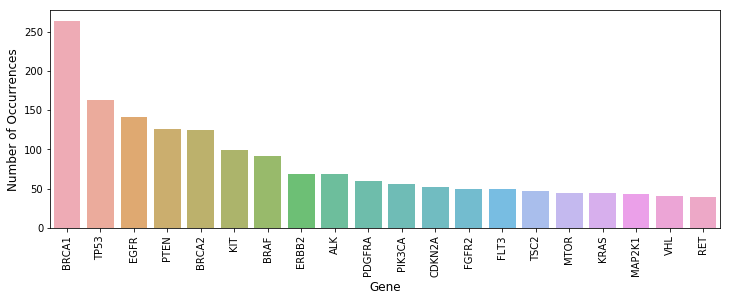

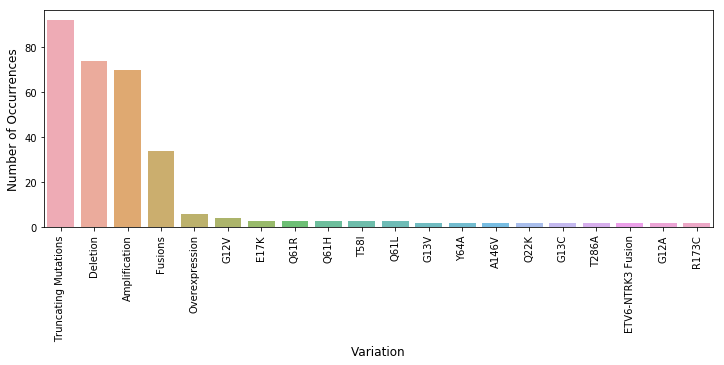

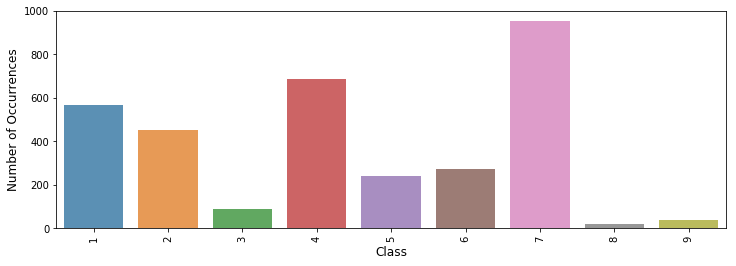

In [9]:
max_show = 20

cnt_pro = train_full_df['Gene'].value_counts()[:max_show]

plt.figure(figsize=(12,4))
sns.barplot(cnt_pro.index, cnt_pro.values, alpha=0.8)
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xlabel('Gene', fontsize=12)
plt.xticks(rotation=90)
plt.show();



cnt_pro = train_full_df['Variation'].value_counts()[:max_show]

plt.figure(figsize=(12,4))
sns.barplot(cnt_pro.index, cnt_pro.values, alpha=0.8)
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xlabel('Variation', fontsize=12)
plt.xticks(rotation=90)
plt.show();



cnt_pro = train_full_df['Class'].value_counts()[:max_show]

plt.figure(figsize=(12,4))
sns.barplot(cnt_pro.index, cnt_pro.values, alpha=0.8)
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xlabel('Class', fontsize=12)
plt.xticks(rotation=90)
plt.show();

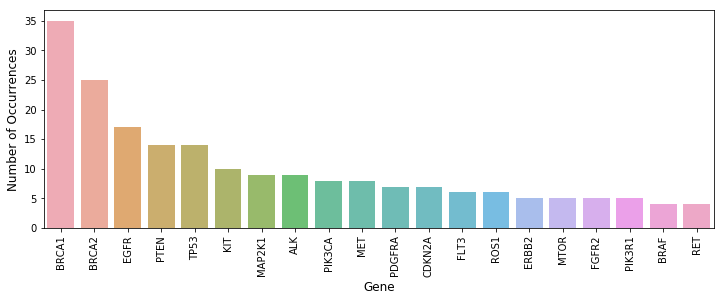

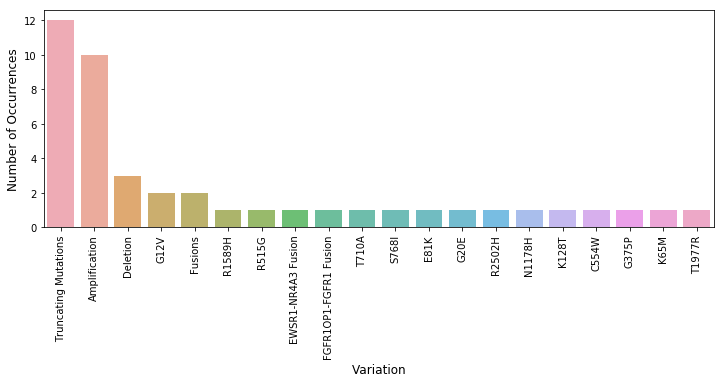

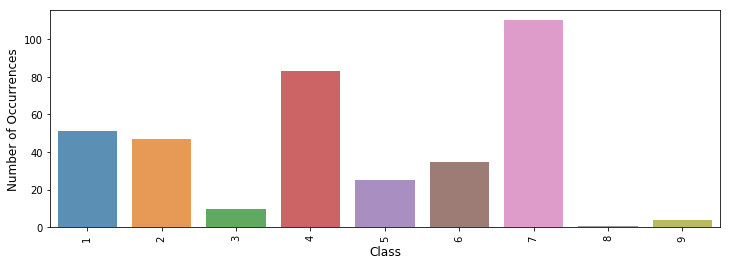

In [10]:
max_show = 20

cnt_pro = test_full_df['Gene'].value_counts()[:max_show]

plt.figure(figsize=(12,4))
sns.barplot(cnt_pro.index, cnt_pro.values, alpha=0.8)
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xlabel('Gene', fontsize=12)
plt.xticks(rotation=90)
plt.show();



cnt_pro = test_full_df['Variation'].value_counts()[:max_show]

plt.figure(figsize=(12,4))
sns.barplot(cnt_pro.index, cnt_pro.values, alpha=0.8)
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xlabel('Variation', fontsize=12)
plt.xticks(rotation=90)
plt.show();



cnt_pro = test_full_df['Class'].value_counts()[:max_show]

plt.figure(figsize=(12,4))
sns.barplot(cnt_pro.index, cnt_pro.values, alpha=0.8)
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xlabel('Class', fontsize=12)
plt.xticks(rotation=90)
plt.show();

In [11]:
# from spacy.lang.en import English
# nlp = English()
# nlp = spacy.load('./en_core_web_sm-2.1.0')
# doc = nlp('This is a sentance.')
# print(doc.text)
# print(doc.__repr__)

In [12]:
all_stop_words = set()

def get_spacy_doc_objects(words):
    nlp = spacy.load('./en_core_web_sm-2.1.0')
    doc = nlp(words)
    return doc

def get_spacy_doc_objects2(gene, variation):
    nlp = spacy.load('./en_core_web_sm-2.1.0')
    concated = gene + ' ' + variation
    #print(concated)
    doc = nlp(concated)
    return doc

def get_text_like_numbers(doc):
    res = []
    for token in doc:
        if token.like_num:
            res.append(token.text)
    return res
#train_full_df.loc[:, 'like_numbers']  = train_full_df["SpacyNlp"].apply(lambda x: do_work2(x))

def remove_stop_words(doc):
    global all_stop_words
    #print('doc', doc)
    res = []
    for token in doc:
        if token.is_stop or len(token)<2:
            all_stop_words.add(token.text)
        else:
            res.append(token.text)
    #print('remove_stop_words', res)
    return res
            

def get_like_percentage(doc):    
    res = []
    for token in doc:
        if token.like_num:
            #print('like_num: ', token)
            try:
                next_token=doc[token.i + 1]
            except:
                #print('whoops', token)
                return []
            if next_token.text == '%':
                res.append(token.text+next_token.text)
    return res
#train_full_df.loc[:, 'like_percentages']  = train_full_df["SpacyNlp"].apply(lambda x: do_work2(x))
#train_full_df

def get_named_entities(doc):
    res = []
    for ent in doc.ents:
        res.append((ent.text, ent.label_))
    return res
#train_full_df.loc[:, 'named_entities']  = train_full_df["SpacyNlp"].apply(lambda x: do_work(x))
#train_full_df




In [13]:
functions = [
             {'name':'get_spacy_doc_objects', 
              'fcn':get_spacy_doc_objects2, 
              'apply_to_columns':['Gene', 'Variation'], 
              'store_in_column':'Gene_Variation_SpacyNlpDoc'},
    
             {'name':'get_spacy_doc_objects', 
              'fcn':lambda x: get_spacy_doc_objects(x), 
              'apply_to_columns':['Text'], 
              'store_in_column':'Text_SpacyNlpDoc'},
        ]

for my_df in [train_full_df, test_full_df]:
    for func in functions:
        print('Running '+str(func))
        time.sleep(1)
        if func['store_in_column'] in my_df.columns:
            print(func['store_in_column'], ' already in df, skipping\n')
            continue

#         if func['store_in_column'] is None:
#             df[func['apply_to_columns']].swifter.apply(lambda x: func['fcn'](*x), axis=1)
        else:
#             dd.from_pandas(my_df,npartitions=nCores).\
#                map_partitions(
#                   lambda df : df.apply(lambda x : lambda row: func['fcn'](*row),axis=1)).\
#                    compute(scheduler='processes')
#                     #compute options
#                     #x.compute(scheduler='single-threaded')
#                     #x.compute(scheduler='threads')
#                     #x.compute(scheduler='processes') ​
            
            # non-parallel version
            my_df.loc[:, func['store_in_column']] = \
            my_df[func['apply_to_columns']].progress_apply(lambda x: func['fcn'](*x), axis=1)
            

#datetime_str = datetime.date.today().strftime("%B %d, %Y %I:%M%p")
#train_full_df.to_pickle('train_full_df '+datetime_str+str(time.time())+'.pickle')
#test_full_df.to_pickle('test_full_df '+datetime_str+str(time.time())+'.pickle')

Running {'name': 'get_spacy_doc_objects', 'fcn': <function get_spacy_doc_objects2 at 0x7f636a4c6d08>, 'apply_to_columns': ['Gene', 'Variation'], 'store_in_column': 'Gene_Variation_SpacyNlpDoc'}


progress-bar: 100%|██████████| 3316/3316 [14:17<00:00,  4.11it/s]


Running {'name': 'get_spacy_doc_objects', 'fcn': <function <lambda> at 0x7f636a499268>, 'apply_to_columns': ['Text'], 'store_in_column': 'Text_SpacyNlpDoc'}


progress-bar: 100%|██████████| 3316/3316 [1:27:57<00:00,  1.74s/it]  


Running {'name': 'get_spacy_doc_objects', 'fcn': <function get_spacy_doc_objects2 at 0x7f636a4c6d08>, 'apply_to_columns': ['Gene', 'Variation'], 'store_in_column': 'Gene_Variation_SpacyNlpDoc'}


progress-bar: 100%|██████████| 366/366 [01:33<00:00,  3.99it/s]


Running {'name': 'get_spacy_doc_objects', 'fcn': <function <lambda> at 0x7f636a499268>, 'apply_to_columns': ['Text'], 'store_in_column': 'Text_SpacyNlpDoc'}


progress-bar: 100%|██████████| 366/366 [10:02<00:00,  1.68s/it]


In [14]:
functions = [
#             {'name':'get_spacy_doc_objects', 
#              'fcn':get_spacy_doc_objects2, 
#              'apply_to_columns':['Gene', 'Variation'], 
#              'store_in_column':'Gene_Variation_SpacyNlpDoc'},
    
#             {'name':'get_spacy_doc_objects', 
#              'fcn':lambda x: get_spacy_doc_objects(x), 
#              'apply_to_columns':['Text'], 
#              'store_in_column':'Text_SpacyNlpDoc'},

            {'name':'remove_stop_words', 
             #'fcn':lambda words: [token.text for token in words if not (token.is_stop or len(token)<2)], 
             'fcn':lambda doc: remove_stop_words(doc),
             'apply_to_columns':['Text_SpacyNlpDoc'], 
             'store_in_column':'Text_spacy_stop_words_removed'},
    
            {'name':'remove_stop_words2', 
             'fcn':lambda words: [token.text for token in words if not (token.is_stop or len(token)<2)], 
             'apply_to_columns':['Gene_Variation_SpacyNlpDoc'], 
             'store_in_column':'Gene_Variation_spacy_stop_words_removed'},

            {'name':'like_numbers', 
             'fcn':lambda text: get_text_like_numbers(text),
             'apply_to_columns':['Text_SpacyNlpDoc'], 
             'store_in_column':'Text_like_numbers'},
    
            {'name':'like_percent', 
             'fcn':lambda text: get_like_percentage(text),
             'apply_to_columns':['Text_SpacyNlpDoc'], 
             'store_in_column':'Text_like_percentage'},
    
            {'name':'get_spacy_doc_objects', 
             'fcn':get_named_entities, 
             'apply_to_columns':['Text_SpacyNlpDoc'], 
             'store_in_column':'Text_named_entities'},
    
            {'name':'make_tagged_document', 
             'fcn':lambda text, tag: TaggedDocument(words=text, tags=[tag]),
             'apply_to_columns':['Text_spacy_stop_words_removed', 'Class'], 
             'store_in_column':'Text_Tagged_Document'},
    
            {'name':'make_tagged_document2', 
             'fcn':lambda text, tag: TaggedDocument(words=text, tags=[tag]),
             'apply_to_columns':['Gene_Variation_spacy_stop_words_removed', 'Class'], 
             'store_in_column':'Gene_Variation_Tagged_Document'},
        ]

for my_df in [train_full_df, test_full_df]:
    for func in functions:
        print('Running '+str(func))
        time.sleep(1)
        if func['store_in_column'] in my_df.columns:
            print(func['store_in_column'], ' already in df, skipping\n')
            continue

#         if func['store_in_column'] is None:
#             df[func['apply_to_columns']].swifter.apply(lambda x: func['fcn'](*x), axis=1)
        else:
#             dd.from_pandas(my_df,npartitions=nCores).\
#                map_partitions(
#                   lambda df : df.apply(lambda x : lambda row: func['fcn'](*row),axis=1)).\
#                    compute(scheduler='processes')
#                     #compute options
#                     #x.compute(scheduler='single-threaded')
#                     #x.compute(scheduler='threads')
#                     #x.compute(scheduler='processes') ​
            
            # non-parallel version
            my_df.loc[:, func['store_in_column']] = \
            my_df[func['apply_to_columns']].progress_apply(lambda x: func['fcn'](*x), axis=1)

Running {'name': 'remove_stop_words', 'fcn': <function <lambda> at 0x7f60b14f38c8>, 'apply_to_columns': ['Text_SpacyNlpDoc'], 'store_in_column': 'Text_spacy_stop_words_removed'}


progress-bar: 100%|██████████| 3316/3316 [00:51<00:00, 72.38it/s]


Running {'name': 'remove_stop_words2', 'fcn': <function <lambda> at 0x7f60b14f3378>, 'apply_to_columns': ['Gene_Variation_SpacyNlpDoc'], 'store_in_column': 'Gene_Variation_spacy_stop_words_removed'}


progress-bar: 100%|██████████| 3316/3316 [00:00<00:00, 8632.76it/s] 


Running {'name': 'like_numbers', 'fcn': <function <lambda> at 0x7f60b14f3730>, 'apply_to_columns': ['Text_SpacyNlpDoc'], 'store_in_column': 'Text_like_numbers'}


progress-bar: 100%|██████████| 3316/3316 [00:14<00:00, 227.96it/s]


Running {'name': 'like_percent', 'fcn': <function <lambda> at 0x7f60b14f36a8>, 'apply_to_columns': ['Text_SpacyNlpDoc'], 'store_in_column': 'Text_like_percentage'}


progress-bar: 100%|██████████| 3316/3316 [00:15<00:00, 229.95it/s]


Running {'name': 'get_spacy_doc_objects', 'fcn': <function get_named_entities at 0x7f636a4c6f28>, 'apply_to_columns': ['Text_SpacyNlpDoc'], 'store_in_column': 'Text_named_entities'}


progress-bar: 100%|██████████| 3316/3316 [00:22<00:00, 145.31it/s]


Running {'name': 'make_tagged_document', 'fcn': <function <lambda> at 0x7f60b14f3d90>, 'apply_to_columns': ['Text_spacy_stop_words_removed', 'Class'], 'store_in_column': 'Text_Tagged_Document'}


progress-bar: 100%|██████████| 3316/3316 [00:00<00:00, 24448.93it/s]


Running {'name': 'make_tagged_document2', 'fcn': <function <lambda> at 0x7f60b14f3f28>, 'apply_to_columns': ['Gene_Variation_spacy_stop_words_removed', 'Class'], 'store_in_column': 'Gene_Variation_Tagged_Document'}


progress-bar: 100%|██████████| 3316/3316 [00:00<00:00, 23035.55it/s]


Running {'name': 'remove_stop_words', 'fcn': <function <lambda> at 0x7f60b14f38c8>, 'apply_to_columns': ['Text_SpacyNlpDoc'], 'store_in_column': 'Text_spacy_stop_words_removed'}


progress-bar: 100%|██████████| 366/366 [00:05<00:00, 61.67it/s]


Running {'name': 'remove_stop_words2', 'fcn': <function <lambda> at 0x7f60b14f3378>, 'apply_to_columns': ['Gene_Variation_SpacyNlpDoc'], 'store_in_column': 'Gene_Variation_spacy_stop_words_removed'}


progress-bar: 100%|██████████| 366/366 [00:00<00:00, 6586.33it/s]


Running {'name': 'like_numbers', 'fcn': <function <lambda> at 0x7f60b14f3730>, 'apply_to_columns': ['Text_SpacyNlpDoc'], 'store_in_column': 'Text_like_numbers'}


progress-bar: 100%|██████████| 366/366 [00:01<00:00, 209.86it/s]


Running {'name': 'like_percent', 'fcn': <function <lambda> at 0x7f60b14f36a8>, 'apply_to_columns': ['Text_SpacyNlpDoc'], 'store_in_column': 'Text_like_percentage'}


progress-bar: 100%|██████████| 366/366 [00:01<00:00, 204.95it/s]


Running {'name': 'get_spacy_doc_objects', 'fcn': <function get_named_entities at 0x7f636a4c6f28>, 'apply_to_columns': ['Text_SpacyNlpDoc'], 'store_in_column': 'Text_named_entities'}


progress-bar: 100%|██████████| 366/366 [00:03<00:00, 107.78it/s]


Running {'name': 'make_tagged_document', 'fcn': <function <lambda> at 0x7f60b14f3d90>, 'apply_to_columns': ['Text_spacy_stop_words_removed', 'Class'], 'store_in_column': 'Text_Tagged_Document'}


progress-bar: 100%|██████████| 366/366 [00:00<00:00, 7128.20it/s]


Running {'name': 'make_tagged_document2', 'fcn': <function <lambda> at 0x7f60b14f3f28>, 'apply_to_columns': ['Gene_Variation_spacy_stop_words_removed', 'Class'], 'store_in_column': 'Gene_Variation_Tagged_Document'}


progress-bar: 100%|██████████| 366/366 [00:00<00:00, 21202.66it/s]


In [15]:
print(all_stop_words)

{'She', 'nevertheless', 'seems', 'Our', 'that', 'Amount', 'yet', 'Each', 'Amongst', 'Throughout', 'Against', 'Us', 'HER', 'Still', 'Fifty', 'four', 'X', 'however', 'Always', 'WITHIN', 'Along', 'Onto', 'KEEP', 'often', 'cALL', 'When', 'nine', 'TWO', 'Too', 'IS', 'Most', 'U', '*', 'an', '#', 'Thereby', 'meanwhile', 'somewhere', 'below', 'upon', 'Beyond', 'back', 'which', 'VIA', 'through', 'Whose', 'MORE', 'as', 'Their', 'Through', 'Next', 'Three', 'not', 'during', 'call', '3', 'side', 'f', 'Nine', 'NO', 'himself', 'Will', 'my', 'V', 'Whenever', 'twenty', "'S", 'IT', 'us', 'until', 'WE', 'Namely', 'Alone', 'anything', 'During', 'were', 'even', 'really', 'Front', 'THROUGH', 'whatever', 'j', '<', 'own', 'Whole', 'she', 'Serious', 'AS', 'seemed', 'Some', 'Z', 'Above', '9', '/', 's', 'BE', 'Whatever', 'several', 'Do', 'move', 'out', 'much', 'sixty', 'what', 'By', 'About', 'iT', 'Other', 'every', 'Under', 'Never', '\\', 'PLEASE', 'HIS', 'From', 'Over', 'HIM', 'is', 'Almost', 'ourselves', 'R', 

In [16]:
display(train_full_df.head())
display(test_full_df.head())

,ID,Gene,Variation,Class,Text,Text_count,Unique_words,Unique_words_count,Gene_Variation_SpacyNlpDoc,Text_SpacyNlpDoc,Text_spacy_stop_words_removed,Gene_Variation_spacy_stop_words_removed,Text_like_numbers,Text_like_percentage,Text_named_entities,Text_Tagged_Document,Gene_Variation_Tagged_Document
2773,2773,BRAF,G464E,5,"Recently, mutations in the B-Raf gene have bee...",16954,[],0,"(BRAF, G464E)","(Recently, ,, mutations, in, the, B, -, Raf, g...","[Recently, mutations, Raf, gene, identified, v...","[BRAF, G464E]","[80, 63, 8132, 8137, six, three, 1, 2, 3, 4, 5...","[80%, 80%, 10%, 5%, 0.1%, 0.1%, 5%, 1%, 0.3%, ...","[(more than 80%, PERCENT), (MEK/Erk, ORG), (NF...","([Recently, mutations, Raf, gene, identified, ...","([BRAF, G464E], [5])"
693,693,CDKN2A,V118D,4,Cell division is controlled by a series of pos...,228,[],0,"(CDKN2A, V118D)","(Cell, division, is, controlled, by, a, series...","[Cell, division, controlled, series, positive,...","[CDKN2A, V118D]","[1,2, 3, 4, eight, 18, five, two]",[],"[(Cell, ORG), (3, CARDINAL), (4, CARDINAL), (C...","([Cell, division, controlled, series, positive...","([CDKN2A, V118D], [4])"
493,493,TP53,R156C,1,Tumor suppressor p53-dependent apoptosis is th...,9408,[],0,"(TP53, R156C)","(Tumor, suppressor, p53-dependent, apoptosis, ...","[Tumor, suppressor, p53-dependent, apoptosis, ...","[TP53, R156C]","[one, 179, six, 17, 121, 290, 292, two, 17, 1,...","[50%, 74%, 30%, 10%, 1.42%, 0.5%, 1%, 70%, 1%,...","[(Tumor, ORG), (one, CARDINAL), (179, CARDINAL...","([Tumor, suppressor, p53-dependent, apoptosis,...","([TP53, R156C], [1])"
1514,1514,ALK,T1087I,3,"In the era of personalized medicine, understan...",7047,[],0,"(ALK, T1087I)","(In, the, era, of, personalized, medicine, ,, ...","[era, personalized, medicine, understanding, m...","[ALK, T1087I]","[two, 3, 20, 6,000, 2, 1, Five, eight, 1, 1, T...","[5%, 40%, 50%, 47%, 53%, 31%, 56%, 44%, 10%, 1...","[(billions, CARDINAL), (each month, DATE), (de...","([era, personalized, medicine, understanding, ...","([ALK, T1087I], [3])"
733,733,ERBB2,V773A,2,Overexpression of the ERBB2 kinase is observed...,12342,"[(SCCHN)., (EGFR:, HER1), (2���6),, CAAGTGCCGT...",46,"(ERBB2, V773A)","(Overexpression, of, the, ERBB2, kinase, is, o...","[Overexpression, ERBB2, kinase, observed, brea...","[ERBB2, V773A]","[one, 8, 30, 788, 1, 1, Four, 1, 1, 1, 1, six,...","[30%, 11%, 11%, 10%, 10%, 10%, 54.8%, 35%, 1.7...","[(about one-third, CARDINAL), (ERBB1/ERBB2, OR...","([Overexpression, ERBB2, kinase, observed, bre...","([ERBB2, V773A], [2])"


,ID,Gene,Variation,Class,Text,Text_count,Unique_words,Unique_words_count,Gene_Variation_SpacyNlpDoc,Text_SpacyNlpDoc,Text_spacy_stop_words_removed,Gene_Variation_spacy_stop_words_removed,Text_like_numbers,Text_like_percentage,Text_named_entities,Text_Tagged_Document,Gene_Variation_Tagged_Document
1984,1984,CTNNB1,N387K,7,We screened 75 primary hepatocellular carcinom...,11038,[],0,"(CTNNB1, N387, K)","(We, screened, 75, primary, hepatocellular, ca...","[screened, 75, primary, hepatocellular, carcin...","[CTNNB1, N387]","[75, 14, 12, 2, 51, 195, 3, 12, 6, 33, 41, 45,...","[5%, 10%, 1.5%, ~3%, 50%, 5%, 35%, 15%, 50%, 1...","[(75 primary, QUANTITY), (14, CARDINAL), (12, ...","([screened, 75, primary, hepatocellular, carci...","([CTNNB1, N387], [7])"
1471,1471,FGFR2,N549K,7,We sought to identify fibroblast growth factor...,14271,[],0,"(FGFR2, N549, K)","(We, sought, to, identify, fibroblast, growth,...","[sought, identify, fibroblast, growth, factor,...","[FGFR2, N549]","[2, 14, 25, three, seven, three, five, 2013, 1...","[25%, 50%, 1%, 4%, 12%, 0.01%, 41%, 20%, 68%, ...","[(2, CARDINAL), (14, CARDINAL), (N550K mutatio...","([sought, identify, fibroblast, growth, factor...","([FGFR2, N549], [7])"
1081,1081,EZH2,Y646N,9,"EZH2, the catalytic subunit of the PRC2 comple...",22066,[],0,"(EZH2, Y646N)","(EZH2, ,, the, catalytic, subunit, of, the, PR...","[EZH2, catalytic, subunit, PRC2, complex, cata...","[EZH2, Y646N]","[27, zero, 2, 4, 5, 27, 1, 1, 2, 3, 6, 7, 8, 1...","[7%, 1%, 20%, 30%, 400%, 50%, 95%, 0.002%, 0.0...","[(27, CARDINAL), (WT, ORG), (zero, CARDINAL), ...","([EZH2, catalytic, subunit, PRC2, complex, cat...","([EZH2, Y646N], [9])"
1513,1513,ALK,RANBP2-ALK Fusion,7,Introduction Chromosomal translocations invol...,3985,"[(IMTS), region.1,2, Lesional, metastases,1,2,...",42,"(ALK, RANBP2-ALK, Fusion)","(Introduction, , Chromosomal, translocations,...","[Introduction, Chromosomal, translocations, in...","[ALK, RANBP2-ALK, Fusion]","[1, 3, 3, 4, 5, 6, 7, 60, 9, 10, 23, 11, 1, 12...","[60%, 50%, 40%, 53%]","[(ALK, ORG), (ALCL, ORG), (NSCLC, ORG), (1, CA...","([Introduction, Chromosomal, translocations, i...","([ALK, RANBP2-ALK, Fusion], [7])"
780,780,ERBB3,R669C,6,Introduction Epidermal growth factor receptor ...,2161,[],0,"(ERBB3, R669C)","(Introduction, Epidermal, growth, factor, rece...","[Introduction, Epidermal, growth, factor, rece...","[ERBB3, R669C]","[four, four, four, 77, 20, three, 3.0, 15, sev...","[15%, 66%, 66%]","[(EGFR, ORG), (four, CARDINAL), (recent years,...","([Introduction, Epidermal, growth, factor, rec...","([ERBB3, R669C], [6])"


In [17]:
load = False

if load:
    train_full_df = pd.read_pickle('train_full_df May 03, 2019 12:00AM.pickle')
    test_full_df = pd.read_pickle('test_full_df May 04, 2019 12:00AM.pickle')

In [18]:
# datetime_str = datetime.date.today().strftime("%B %d, %Y %I:%M%p")
# train_full_df.to_pickle('train_full_df '+datetime_str+str(time.time())+'.pickle')
# test_full_df.to_pickle('test_full_df '+datetime_str+str(time.time())+'.pickle')

In [19]:
# [x for x in tqdm(train_full_df[source])]

In [36]:
def run_test(results_list, in_alpha=0.002, in_epochs=20):
    for source in ['Gene_Variation_Tagged_Document', 'Text_Tagged_Document']:
        model_dbow = Doc2Vec(dm=0, vector_size=300, negative=5, hs=0, min_count=2,
                             sample = 0, workers=cores)
        model_dbow.build_vocab([x for x in tqdm(train_full_df[source])])

        #model_dbow

        for epoch in range(in_epochs):
            model_dbow.train(utils.shuffle([x for x in tqdm(train_full_df[source])]), 
                             total_examples=len(train_full_df[source]), epochs=1)
            model_dbow.alpha -= in_alpha
            model_dbow.min_alpha = model_dbow.alpha

        def vec_for_learning(model, tagged_docs):
            sents = tagged_docs.values
            targets, regressors = zip(*[(doc.tags[0], model.infer_vector(doc.words, steps=20)) for doc in sents])
            return targets, regressors

        y_train, X_train = vec_for_learning(model_dbow, train_full_df[source])
        y_test, X_test = vec_for_learning(model_dbow, test_full_df[source])

        logreg = LogisticRegression(n_jobs=4, C=1e5)
        logreg.fit(X_train, y_train)
        y_pred = logreg.predict(X_test)

        from sklearn.metrics import accuracy_score, f1_score

        print('Source: ', source)
        print('Testing accuracy %s' % accuracy_score(y_test, y_pred))
        print('Testing F1 score: {}'.format(f1_score(y_test, y_pred, average='weighted')))
        
        ret_dict = {
            'alpha':in_alpha,
            'epochs':in_epochs,
            'source':source,
            'testing_accuracy':accuracy_score(y_test, y_pred),
            'testing_f1_score':f1_score(y_test, y_pred, average='weighted'),
        }
        
        results_list.append(ret_dict)
        
        #return ret_dict

In [ ]:
results_list = []

for alpha in [0.002, 0.001, 0.003, 0.004, 0.005]:
    for epochs in [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20,
                  30, 40, 60, 80, 100]:
        res = run_test(results_list, in_alpha=alpha, in_epochs=epochs)
        results_list.append(res)
        results_list = [x for x in results_list if x is not None]
        print(results_list)
        df = pd.DataFrame.from_dict(results_list)
        df.to_csv('test_results.csv')
        print('saved')

100%|██████████| 3316/3316 [00:00<00:00, 744755.67it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 867913.39it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.6147540983606558
Testing F1 score: 0.604295836858889



100%|██████████| 3316/3316 [00:00<00:00, 1070446.55it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1089224.85it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.8278688524590164
Testing F1 score: 0.8275150912463091
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}]
saved


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 849622.00it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.6229508196721312
Testing F1 score: 0.6129643261205283



100%|██████████| 3316/3316 [00:00<00:00, 978700.45it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1221420.22it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.7841530054644809
Testing F1 score: 0.7881055493649777
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}]
saved


100%|██████████| 3316/3316 [00:00<00:00, 1031467.82it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 918404.12it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.674863387978142
Testing F1 score: 0.6657908399977931



100%|██████████| 3316/3316 [00:00<00:00, 1000669.98it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1110710.12it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.8114754098360656
Testing F1 score: 0.8122892441707119
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}

100%|██████████| 3316/3316 [00:00<00:00, 1223138.87it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 944473.18it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.7021857923497268
Testing F1 score: 0.6925116553217956



100%|██████████| 3316/3316 [00:00<00:00, 924693.31it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1163972.89it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.7868852459016393
Testing F1 score: 0.7919135201407455
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}

100%|██████████| 3316/3316 [00:00<00:00, 1129104.73it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/usr/local/lib/python3.6/dist-packages/

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.7103825136612022
Testing F1 score: 0.7028012588649462



100%|██████████| 3316/3316 [00:00<00:00, 1023422.52it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 844617.24it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.7841530054644809
Testing F1 score: 0.7847971592615279
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}

100%|██████████| 3316/3316 [00:00<00:00, 1250297.74it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 649435.57it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.6721311475409836
Testing F1 score: 0.6659256518506457



100%|██████████| 3316/3316 [00:00<00:00, 956423.61it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1194564.29it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.7978142076502732
Testing F1 score: 0.8001864688354405
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}

100%|██████████| 3316/3316 [00:00<00:00, 1214487.61it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 919314.70it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.7076502732240437
Testing F1 score: 0.7002084417513225



100%|██████████| 3316/3316 [00:00<00:00, 1011807.95it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1286258.40it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.8005464480874317
Testing F1 score: 0.8046701524574174
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}

100%|██████████| 3316/3316 [00:00<00:00, 1225078.13it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 650985.82it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.6830601092896175
Testing F1 score: 0.6787416182565593



100%|██████████| 3316/3316 [00:00<00:00, 942042.27it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1061946.40it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.819672131147541
Testing F1 score: 0.8207659082414597
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119},

100%|██████████| 3316/3316 [00:00<00:00, 1209839.25it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 962579.56it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.6967213114754098
Testing F1 score: 0.6896282483257345



100%|██████████| 3316/3316 [00:00<00:00, 979527.58it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1146132.02it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.8333333333333334
Testing F1 score: 0.8320550322168615
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}

100%|██████████| 3316/3316 [00:00<00:00, 1188439.89it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 845798.59it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.6994535519125683
Testing F1 score: 0.6874434068318719



100%|██████████| 3316/3316 [00:00<00:00, 931318.61it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 939814.32it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.8497267759562842
Testing F1 score: 0.8489020271385038
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}

100%|██████████| 3316/3316 [00:00<00:00, 1231805.16it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/usr/local/lib/python3.6/dist-packages/

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.7213114754098361
Testing F1 score: 0.7128162047468714



100%|██████████| 3316/3316 [00:00<00:00, 960452.46it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1029406.56it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.8715846994535519
Testing F1 score: 0.8736742511644251
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}

100%|██████████| 3316/3316 [00:00<00:00, 1204600.04it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 884977.86it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.6693989071038251
Testing F1 score: 0.6550481892525868



100%|██████████| 3316/3316 [00:00<00:00, 889335.13it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 960585.13it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.8469945355191257
Testing F1 score: 0.8465699578728051
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}

100%|██████████| 3316/3316 [00:00<00:00, 1187526.64it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 631851.36it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.6885245901639344
Testing F1 score: 0.6798259500983077



100%|██████████| 3316/3316 [00:00<00:00, 986825.04it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1098516.08it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.48633879781420764
Testing F1 score: 0.481831049287546
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}

100%|██████████| 3316/3316 [00:00<00:00, 1066751.96it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/usr/local/lib/python3.6/dist-packages/

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.6830601092896175
Testing F1 score: 0.6736200717529973



100%|██████████| 3316/3316 [00:00<00:00, 967332.87it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 978081.02it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.5273224043715847
Testing F1 score: 0.5249103124619807
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}

100%|██████████| 3316/3316 [00:00<00:00, 1215230.41it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/usr/local/lib/python3.6/dist-packages/

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.6775956284153005
Testing F1 score: 0.6675881625461251



100%|██████████| 3316/3316 [00:00<00:00, 962779.46it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 915381.87it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.43989071038251365
Testing F1 score: 0.44175894707119434
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.812289244170711

100%|██████████| 3316/3316 [00:00<00:00, 1170634.80it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/usr/local/lib/python3.6/dist-packages/

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.6311475409836066
Testing F1 score: 0.6240127258513543



100%|██████████| 3316/3316 [00:00<00:00, 929265.19it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1194974.83it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.5355191256830601
Testing F1 score: 0.5313920789606188
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}

100%|██████████| 3316/3316 [00:00<00:00, 1166413.29it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 951320.93it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.639344262295082
Testing F1 score: 0.6324857898328583



100%|██████████| 3316/3316 [00:00<00:00, 913278.09it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 839671.10it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.4180327868852459
Testing F1 score: 0.4145624290424627
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}

100%|██████████| 3316/3316 [00:00<00:00, 1094884.05it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 246649.38it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.6010928961748634
Testing F1 score: 0.5988267916654846



100%|██████████| 3316/3316 [00:00<00:00, 976433.03it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/usr/local/lib/python3.6/dist-packages/

Source:  Text_Tagged_Document
Testing accuracy 0.3114754098360656
Testing F1 score: 0.31094365370306687
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119


100%|██████████| 3316/3316 [00:00<00:00, 1175979.71it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 934509.98it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.6229508196721312
Testing F1 score: 0.6161633574552734



100%|██████████| 3316/3316 [00:00<00:00, 867805.08it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1251873.27it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.41530054644808745
Testing F1 score: 0.4159652446214765
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119

100%|██████████| 3316/3316 [00:00<00:00, 1079921.74it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 621322.85it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.6038251366120219
Testing F1 score: 0.5956567836843488



100%|██████████| 3316/3316 [00:00<00:00, 880050.12it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1160476.60it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.46994535519125685
Testing F1 score: 0.4658054454210107
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119

100%|██████████| 3316/3316 [00:00<00:00, 1034921.65it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/usr/local/lib/python3.6/dist-packages/

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.5409836065573771
Testing F1 score: 0.5316006292349562



100%|██████████| 3316/3316 [00:00<00:00, 965251.72it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1083455.02it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.3797814207650273
Testing F1 score: 0.37378284130775385
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119

100%|██████████| 3316/3316 [00:00<00:00, 1108585.37it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 924324.59it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.5956284153005464
Testing F1 score: 0.5907118966393441



100%|██████████| 3316/3316 [00:00<00:00, 1027809.05it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1101299.55it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.39617486338797814
Testing F1 score: 0.3997661343704454
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119

100%|██████████| 3316/3316 [00:00<00:00, 1178271.10it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/usr/local/lib/python3.6/dist-packages/

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.5
Testing F1 score: 0.4887985561196785



100%|██████████| 3316/3316 [00:00<00:00, 883965.43it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))


Source:  Text_Tagged_Document
Testing accuracy 0.2978142076502732
Testing F1 score: 0.2954555466095295
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}

100%|██████████| 3316/3316 [00:00<00:00, 1118750.97it/s]

saved



100%|██████████| 3316/3316 [00:00<00:00, 1019820.51it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 425995.04it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.5300546448087432
Testing F1 score: 0.519209978068224



100%|██████████| 3316/3316 [00:00<00:00, 915984.72it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 969220.35it/s]

Source:  Text_Tagged_Document
Testing accuracy 0.31693989071038253
Testing F1 score: 0.31692087579457334
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.812289244170711


100%|██████████| 3316/3316 [00:00<00:00, 1183686.13it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/usr/local/lib/python3.6/dist-packages

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.42349726775956287
Testing F1 score: 0.4051942559774245



100%|██████████| 3316/3316 [00:00<00:00, 949761.82it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 1276460.36it/s]

Source:  Text_Tagged_Document
Testing accuracy 0.33879781420765026
Testing F1 score: 0.341880042156029
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 963379.65it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.6202185792349727
Testing F1 score: 0.6050232253234871



100%|██████████| 3316/3316 [00:00<00:00, 1219064.95it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1162513.55it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.8278688524590164
Testing F1 score: 0.827702260208826
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119},

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 937976.27it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.6311475409836066
Testing F1 score: 0.6204145769147255



100%|██████████| 3316/3316 [00:00<00:00, 1019222.63it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1190780.14it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.8114754098360656
Testing F1 score: 0.8119826356867919
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}

100%|██████████| 3316/3316 [00:00<00:00, 1184290.88it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 959061.65it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.6721311475409836
Testing F1 score: 0.6642253744739924



100%|██████████| 3316/3316 [00:00<00:00, 1042836.62it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1072262.13it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.7868852459016393
Testing F1 score: 0.7886244495244408
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}

100%|██████████| 3316/3316 [00:00<00:00, 998371.41it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 926973.61it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.7131147540983607
Testing F1 score: 0.7043549002283307



100%|██████████| 3316/3316 [00:00<00:00, 1054059.27it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 1316077.98it/s]

Source:  Text_Tagged_Document
Testing accuracy 0.7923497267759563
Testing F1 score: 0.7970704286903494
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}


100%|██████████| 3316/3316 [00:00<00:00, 1210787.16it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/usr/local/lib/python3.6/dist-packages

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.7021857923497268
Testing F1 score: 0.6959915362071307



100%|██████████| 3316/3316 [00:00<00:00, 1028949.62it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1116954.07it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.8060109289617486
Testing F1 score: 0.8085588952630096
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}

100%|██████████| 3316/3316 [00:00<00:00, 1019820.51it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 878050.00it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.6693989071038251
Testing F1 score: 0.663018794424621



100%|██████████| 3316/3316 [00:00<00:00, 975542.69it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 1194359.13it/s]

Source:  Text_Tagged_Document
Testing accuracy 0.7950819672131147
Testing F1 score: 0.7982821317984501
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}


100%|██████████| 3316/3316 [00:00<00:00, 1184593.48it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/usr/local/lib/python3.6/dist-packages

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.7158469945355191
Testing F1 score: 0.7076943121626461



100%|██████████| 3316/3316 [00:00<00:00, 859599.02it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 976364.48it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.819672131147541
Testing F1 score: 0.8219973632374068
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119},

100%|██████████| 3316/3316 [00:00<00:00, 1049367.14it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 930384.11it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.7021857923497268
Testing F1 score: 0.6972602804777813



100%|██████████| 3316/3316 [00:00<00:00, 1013356.07it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 951972.08it/s]

Source:  Text_Tagged_Document
Testing accuracy 0.7950819672131147
Testing F1 score: 0.8005945806492254
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}


100%|██████████| 3316/3316 [00:00<00:00, 998801.58it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 922607.77it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.6967213114754098
Testing F1 score: 0.688732180230156



100%|██████████| 3316/3316 [00:00<00:00, 963713.42it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 1007994.79it/s]

Source:  Text_Tagged_Document
Testing accuracy 0.7814207650273224
Testing F1 score: 0.7846957376190297
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}


100%|██████████| 3316/3316 [00:00<00:00, 1182780.17it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 913938.24it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.7158469945355191
Testing F1 score: 0.7096189780528035



100%|██████████| 3316/3316 [00:00<00:00, 797860.95it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 890759.07it/s]

Source:  Text_Tagged_Document
Testing accuracy 0.7814207650273224
Testing F1 score: 0.7813232625826673
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}


100%|██████████| 3316/3316 [00:00<00:00, 1107614.24it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/usr/local/lib/python3.6/dist-packages

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.7213114754098361
Testing F1 score: 0.714096362390772



100%|██████████| 3316/3316 [00:00<00:00, 929575.73it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 982364.18it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.8169398907103825
Testing F1 score: 0.8199844058927822
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}

100%|██████████| 3316/3316 [00:00<00:00, 1118121.40it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 639668.49it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.6775956284153005
Testing F1 score: 0.6665885955409928



100%|██████████| 3316/3316 [00:00<00:00, 949437.65it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 825664.12it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.8032786885245902
Testing F1 score: 0.8041084003055007
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}

100%|██████████| 3316/3316 [00:00<00:00, 1052065.97it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 912798.59it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.6912568306010929
Testing F1 score: 0.6844482993888855



100%|██████████| 3316/3316 [00:00<00:00, 976638.72it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 1142554.18it/s]

Source:  Text_Tagged_Document
Testing accuracy 0.8333333333333334
Testing F1 score: 0.83500842104404
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}, 


100%|██████████| 3316/3316 [00:00<00:00, 1190882.10it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 649041.58it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.7295081967213115
Testing F1 score: 0.724117340261581



100%|██████████| 3316/3316 [00:00<00:00, 1017805.49it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1173004.31it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.8360655737704918
Testing F1 score: 0.8371962496676199
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}

100%|██████████| 3316/3316 [00:00<00:00, 1139091.90it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/usr/local/lib/python3.6/dist-packages/

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.6967213114754098
Testing F1 score: 0.6903808410718965



100%|██████████| 3316/3316 [00:00<00:00, 969017.77it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1193334.37it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.819672131147541
Testing F1 score: 0.8215705989524985
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119},

100%|██████████| 3316/3316 [00:00<00:00, 1329920.83it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 878271.79it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.6967213114754098
Testing F1 score: 0.6907104513905351



100%|██████████| 3316/3316 [00:00<00:00, 988367.83it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 900972.47it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.825136612021858
Testing F1 score: 0.8253460707270961
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119},

100%|██████████| 3316/3316 [00:00<00:00, 1211525.44it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 934572.78it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.7185792349726776
Testing F1 score: 0.7096717246034505



100%|██████████| 3316/3316 [00:00<00:00, 1072179.47it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1197650.23it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.8333333333333334
Testing F1 score: 0.8330797900400152
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}

100%|██████████| 3316/3316 [00:00<00:00, 1112753.99it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 899283.08it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.7185792349726776
Testing F1 score: 0.7138505406365546



100%|██████████| 3316/3316 [00:00<00:00, 968208.29it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1125723.36it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.8442622950819673
Testing F1 score: 0.8458956677589226
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}

100%|██████████| 3316/3316 [00:00<00:00, 1177572.78it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/usr/local/lib/python3.6/dist-packages/

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.7131147540983607
Testing F1 score: 0.7047751791384084



100%|██████████| 3316/3316 [00:00<00:00, 983475.61it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1120914.90it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.8442622950819673
Testing F1 score: 0.8468667904731507
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}

100%|██████████| 3316/3316 [00:00<00:00, 1128188.84it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 639756.76it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.680327868852459
Testing F1 score: 0.6723691248026025



100%|██████████| 3316/3316 [00:00<00:00, 1031238.38it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 939496.90it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.8524590163934426
Testing F1 score: 0.8527653735607255
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}

100%|██████████| 3316/3316 [00:00<00:00, 832334.65it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 945307.69it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.6721311475409836
Testing F1 score: 0.6649213452622541



100%|██████████| 3316/3316 [00:00<00:00, 962379.74it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1289358.68it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.366120218579235
Testing F1 score: 0.36091250944421216
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}

100%|██████████| 3316/3316 [00:00<00:00, 1183383.99it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/usr/local/lib/python3.6/dist-packages/

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.6338797814207651
Testing F1 score: 0.6185555261143645



100%|██████████| 3316/3316 [00:00<00:00, 1017954.48it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1136207.18it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.36065573770491804
Testing F1 score: 0.36671125420236794
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.812289244170711

100%|██████████| 3316/3316 [00:00<00:00, 1263817.54it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/usr/local/lib/python3.6/dist-packages/

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.5409836065573771
Testing F1 score: 0.5244814685716988



100%|██████████| 3316/3316 [00:00<00:00, 1013282.24it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/usr/local/lib/python3.6/dist-packages

Source:  Text_Tagged_Document
Testing accuracy 0.3442622950819672
Testing F1 score: 0.3375415773879914
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}


100%|██████████| 3316/3316 [00:00<00:00, 1194461.70it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 922424.20it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.4890710382513661
Testing F1 score: 0.4747072091189928



100%|██████████| 3316/3316 [00:00<00:00, 917434.83it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1068637.12it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.4180327868852459
Testing F1 score: 0.4222122358216509
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}

100%|██████████| 3316/3316 [00:00<00:00, 1240705.80it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 937470.48it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.5300546448087432
Testing F1 score: 0.5208473630118063



100%|██████████| 3316/3316 [00:00<00:00, 975884.93it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 1287329.88it/s]

Source:  Text_Tagged_Document
Testing accuracy 0.3551912568306011
Testing F1 score: 0.3587359356612092
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 896558.50it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.6147540983606558
Testing F1 score: 0.6010033429160578



100%|██████████| 3316/3316 [00:00<00:00, 1004500.37it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 785070.67it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.825136612021858
Testing F1 score: 0.8256189261797546
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119},

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 940704.23it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.6256830601092896
Testing F1 score: 0.6138743706448214



100%|██████████| 3316/3316 [00:00<00:00, 875342.19it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1002111.97it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.8224043715846995
Testing F1 score: 0.8239894570295848
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}

100%|██████████| 3316/3316 [00:00<00:00, 1145471.26it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 951581.29it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.6666666666666666
Testing F1 score: 0.6571276534522308



100%|██████████| 3316/3316 [00:00<00:00, 1022670.00it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 977462.37it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.773224043715847
Testing F1 score: 0.7827266495229316
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119},

100%|██████████| 3316/3316 [00:00<00:00, 1023121.38it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/usr/local/lib/python3.6/dist-packages/

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.6775956284153005
Testing F1 score: 0.6674026098613407



100%|██████████| 3316/3316 [00:00<00:00, 1039562.90it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1014464.77it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.7950819672131147
Testing F1 score: 0.7988960720443478
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}

100%|██████████| 3316/3316 [00:00<00:00, 1106292.72it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/usr/local/lib/python3.6/dist-packages/

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.6912568306010929
Testing F1 score: 0.6784465328326841



100%|██████████| 3316/3316 [00:00<00:00, 954323.59it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1119471.35it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.825136612021858
Testing F1 score: 0.8264454737606497
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119},

100%|██████████| 3316/3316 [00:00<00:00, 1291393.88it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 870030.78it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.6584699453551912
Testing F1 score: 0.6519436423193077



100%|██████████| 3316/3316 [00:00<00:00, 1042445.82it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 831687.62it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.825136612021858
Testing F1 score: 0.829272063043524
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}, 

100%|██████████| 3316/3316 [00:00<00:00, 1077245.14it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 935767.48it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.7049180327868853
Testing F1 score: 0.6972604144959347



100%|██████████| 3316/3316 [00:00<00:00, 1031314.85it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1116416.12it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.8469945355191257
Testing F1 score: 0.8475409118695976
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}

100%|██████████| 3316/3316 [00:00<00:00, 1311981.14it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 946079.32it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.674863387978142
Testing F1 score: 0.6652857146969718



100%|██████████| 3316/3316 [00:00<00:00, 995655.53it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1098776.43it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.8743169398907104
Testing F1 score: 0.8745379530690354
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}

100%|██████████| 3316/3316 [00:00<00:00, 1227240.10it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 644888.58it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.6612021857923497
Testing F1 score: 0.6536306152949959



100%|██████████| 3316/3316 [00:00<00:00, 1037469.20it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1165143.01it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.4207650273224044
Testing F1 score: 0.4212381319984309
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}

100%|██████████| 3316/3316 [00:00<00:00, 1055739.49it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 739331.92it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.6775956284153005
Testing F1 score: 0.6700513005103107



100%|██████████| 3316/3316 [00:00<00:00, 923158.91it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 717626.13it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.4808743169398907
Testing F1 score: 0.4774807271867315
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}

100%|██████████| 3316/3316 [00:00<00:00, 1001751.08it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/usr/local/lib/python3.6/dist-packages/

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.6830601092896175
Testing F1 score: 0.6767661047564191



100%|██████████| 3316/3316 [00:00<00:00, 799604.01it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1134446.33it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.4972677595628415
Testing F1 score: 0.48606293797019295
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119

100%|██████████| 3316/3316 [00:00<00:00, 1084384.22it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 533069.34it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.5628415300546448
Testing F1 score: 0.5615770157038418



100%|██████████| 3316/3316 [00:00<00:00, 975542.69it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1215867.83it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.4344262295081967
Testing F1 score: 0.429653691514724
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119},

100%|██████████| 3316/3316 [00:00<00:00, 1006535.83it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 952297.98it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.6229508196721312
Testing F1 score: 0.6182149025316799



100%|██████████| 3316/3316 [00:00<00:00, 854791.47it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1096437.69it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.3825136612021858
Testing F1 score: 0.3891770151859631
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}

100%|██████████| 3316/3316 [00:00<00:00, 1196311.03it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/usr/local/lib/python3.6/dist-packages/

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.5601092896174863
Testing F1 score: 0.5558922512011842



100%|██████████| 3316/3316 [00:00<00:00, 1009165.00it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1206271.64it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.4016393442622951
Testing F1 score: 0.4010919460602713
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}

100%|██████████| 3316/3316 [00:00<00:00, 1033537.35it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/usr/local/lib/python3.6/dist-packages/

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.5846994535519126
Testing F1 score: 0.5795350925114876



100%|██████████| 3316/3316 [00:00<00:00, 945050.76it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1001462.56it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.38524590163934425
Testing F1 score: 0.38314227470159445
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.812289244170711

100%|██████████| 3316/3316 [00:00<00:00, 1016615.16it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 826645.59it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.5792349726775956
Testing F1 score: 0.5692164478325363



100%|██████████| 3316/3316 [00:00<00:00, 926047.81it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 882675.13it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.35792349726775957
Testing F1 score: 0.34829970457757503
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.812289244170711

100%|██████████| 3316/3316 [00:00<00:00, 1095056.46it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 637995.97it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.5846994535519126
Testing F1 score: 0.5817698590537681



100%|██████████| 3316/3316 [00:00<00:00, 963112.81it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1145754.35it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.3743169398907104
Testing F1 score: 0.37607456156966185
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119

100%|██████████| 3316/3316 [00:00<00:00, 988367.83it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 621045.41it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.5956284153005464
Testing F1 score: 0.5916274718045955



100%|██████████| 3316/3316 [00:00<00:00, 939179.69it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1209103.02it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.4344262295081967
Testing F1 score: 0.43117688694783624
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119

100%|██████████| 3316/3316 [00:00<00:00, 1044167.57it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/usr/local/lib/python3.6/dist-packages/

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.5901639344262295
Testing F1 score: 0.5826794916718634



100%|██████████| 3316/3316 [00:00<00:00, 932005.10it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 923649.36it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.33879781420765026
Testing F1 score: 0.3439921550246294
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119

100%|██████████| 3316/3316 [00:00<00:00, 1143211.58it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/usr/local/lib/python3.6/dist-packages/

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.6311475409836066
Testing F1 score: 0.624932694515731



100%|██████████| 3316/3316 [00:00<00:00, 947110.12it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1261868.27it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.31420765027322406
Testing F1 score: 0.310061128854624
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}

100%|██████████| 3316/3316 [00:00<00:00, 1018849.32it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 778697.28it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.5409836065573771
Testing F1 score: 0.5297122728584639



100%|██████████| 3316/3316 [00:00<00:00, 933318.49it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1250297.74it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.3087431693989071
Testing F1 score: 0.31135155883785565
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119

100%|██████████| 3316/3316 [00:00<00:00, 1245817.99it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 954258.12it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.5409836065573771
Testing F1 score: 0.5293659300797777



100%|██████████| 3316/3316 [00:00<00:00, 1001751.08it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 1140025.58it/s]

Source:  Text_Tagged_Document
Testing accuracy 0.23224043715846995
Testing F1 score: 0.2279405689102763
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119


100%|██████████| 3316/3316 [00:00<00:00, 1281163.60it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 979320.66it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.4098360655737705
Testing F1 score: 0.3837676058382561



100%|██████████| 3316/3316 [00:00<00:00, 990267.86it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 909932.09it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.3469945355191257
Testing F1 score: 0.34678582391427226
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119

100%|██████████| 3316/3316 [00:00<00:00, 1024327.00it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 1105325.60it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.5300546448087432
Testing F1 score: 0.5195380801680887



100%|██████████| 3316/3316 [00:00<00:00, 869052.24it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 1156135.67it/s]

Source:  Text_Tagged_Document
Testing accuracy 0.31420765027322406
Testing F1 score: 0.3107925941631104
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119


100%|██████████| 3316/3316 [00:00<00:00, 1104535.58it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/usr/local/lib/python3.6/dist-packages

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.41530054644808745
Testing F1 score: 0.39679086189003715



100%|██████████| 3316/3316 [00:00<00:00, 924140.34it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1091618.56it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.3251366120218579
Testing F1 score: 0.3233973707179683
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 892817.57it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.6202185792349727
Testing F1 score: 0.6089887197103738



100%|██████████| 3316/3316 [00:00<00:00, 1357570.72it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 982156.07it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.8442622950819673
Testing F1 score: 0.8431118399191131
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 911482.54it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.6229508196721312
Testing F1 score: 0.6131616006748211



100%|██████████| 3316/3316 [00:00<00:00, 913638.05it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1104360.18it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.7841530054644809
Testing F1 score: 0.7871143784238653
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}

100%|██████████| 3316/3316 [00:00<00:00, 954913.29it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 861942.99it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.6475409836065574
Testing F1 score: 0.6392339113633668



100%|██████████| 3316/3316 [00:00<00:00, 987876.42it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1123904.01it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.8087431693989071
Testing F1 score: 0.8068694526915889
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}

100%|██████████| 3316/3316 [00:00<00:00, 1176775.71it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 929078.96it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.6775956284153005
Testing F1 score: 0.6666760088110643



100%|██████████| 3316/3316 [00:00<00:00, 874571.59it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 941914.67it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.8278688524590164
Testing F1 score: 0.8285548922965521
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}

100%|██████████| 3316/3316 [00:00<00:00, 1281281.63it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/usr/local/lib/python3.6/dist-packages/

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.6639344262295082
Testing F1 score: 0.6533550695568914



100%|██████████| 3316/3316 [00:00<00:00, 981809.41it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1292353.84it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.8278688524590164
Testing F1 score: 0.8289726235344694
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}

100%|██████████| 3316/3316 [00:00<00:00, 934886.88it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 993308.96it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.6366120218579235
Testing F1 score: 0.6277505908193337



100%|██████████| 3316/3316 [00:00<00:00, 1043697.44it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 917132.35it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.8715846994535519
Testing F1 score: 0.8699312210097682
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}

100%|██████████| 3316/3316 [00:00<00:00, 1160282.98it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 917071.88it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.6775956284153005
Testing F1 score: 0.6706186599441468



100%|██████████| 3316/3316 [00:00<00:00, 962446.34it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1061379.13it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.4371584699453552
Testing F1 score: 0.42728788417111957
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119

100%|██████████| 3316/3316 [00:00<00:00, 1268659.31it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 646868.15it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.6530054644808743
Testing F1 score: 0.6491497197041388



100%|██████████| 3316/3316 [00:00<00:00, 953407.74it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 986195.28it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.4972677595628415
Testing F1 score: 0.498953889945709
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119},

100%|██████████| 3316/3316 [00:00<00:00, 1099210.63it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 635256.79it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.6366120218579235
Testing F1 score: 0.6304452766064019



100%|██████████| 3316/3316 [00:00<00:00, 920287.97it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1236074.66it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.44808743169398907
Testing F1 score: 0.4436034212430598
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119

100%|██████████| 3316/3316 [00:00<00:00, 1017061.21it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/usr/local/lib/python3.6/dist-packages/

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.639344262295082
Testing F1 score: 0.6361569266147044



100%|██████████| 3316/3316 [00:00<00:00, 995869.40it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 952493.64it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.3469945355191257
Testing F1 score: 0.34146885831297935
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119

100%|██████████| 3316/3316 [00:00<00:00, 1172509.87it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 951125.77it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.6229508196721312
Testing F1 score: 0.6167809541649916



100%|██████████| 3316/3316 [00:00<00:00, 922057.28it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1217464.29it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.5382513661202186
Testing F1 score: 0.5351328526111554
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}

100%|██████████| 3316/3316 [00:00<00:00, 1168274.85it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/usr/local/lib/python3.6/dist-packages/

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.6420765027322405
Testing F1 score: 0.6318735087997531



100%|██████████| 3316/3316 [00:00<00:00, 816790.70it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1253904.80it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.38524590163934425
Testing F1 score: 0.38255647906153567
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.812289244170711

100%|██████████| 3316/3316 [00:00<00:00, 1005444.38it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 544612.42it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.6830601092896175
Testing F1 score: 0.6775053131105289



100%|██████████| 3316/3316 [00:00<00:00, 932692.60it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1345097.88it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.3879781420765027
Testing F1 score: 0.38558466489498844
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119

100%|██████████| 3316/3316 [00:00<00:00, 1006244.54it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/usr/local/lib/python3.6/dist-packages/

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.6120218579234973
Testing F1 score: 0.6028600947061654



100%|██████████| 3316/3316 [00:00<00:00, 946981.14it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1010558.17it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.2978142076502732
Testing F1 score: 0.30376336075124893
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119

100%|██████████| 3316/3316 [00:00<00:00, 892874.88it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 923526.70it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.5710382513661202
Testing F1 score: 0.5573774373398797



100%|██████████| 3316/3316 [00:00<00:00, 957411.17it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 880663.08it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.33879781420765026
Testing F1 score: 0.33883564931151555
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.812289244170711

100%|██████████| 3316/3316 [00:00<00:00, 975200.68it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/usr/local/lib/python3.6/dist-packages/s

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.6475409836065574
Testing F1 score: 0.6394170956647355



100%|██████████| 3316/3316 [00:00<00:00, 937660.09it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1185603.28it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.37158469945355194
Testing F1 score: 0.3661495318841418
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119

100%|██████████| 3316/3316 [00:00<00:00, 989211.38it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/usr/local/lib/python3.6/dist-packages/s

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.644808743169399
Testing F1 score: 0.6395200046425238



100%|██████████| 3316/3316 [00:00<00:00, 913398.05it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1123904.01it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.4098360655737705
Testing F1 score: 0.4134078056533787
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}

100%|██████████| 3316/3316 [00:00<00:00, 1079921.74it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/usr/local/lib/python3.6/dist-packages/

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.5273224043715847
Testing F1 score: 0.518059074881385



100%|██████████| 3316/3316 [00:00<00:00, 808387.80it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1140212.50it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.34972677595628415
Testing F1 score: 0.348195210072389
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}

100%|██████████| 3316/3316 [00:00<00:00, 1080592.97it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/usr/local/lib/python3.6/dist-packages/

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.5956284153005464
Testing F1 score: 0.5872720671103299



100%|██████████| 3316/3316 [00:00<00:00, 1003558.13it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1091961.38it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.39617486338797814
Testing F1 score: 0.39064889979663003
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.812289244170711

100%|██████████| 3316/3316 [00:00<00:00, 1093334.81it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 858802.84it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.6284153005464481
Testing F1 score: 0.6181973128641755



100%|██████████| 3316/3316 [00:00<00:00, 907438.64it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.

Source:  Text_Tagged_Document
Testing accuracy 0.4371584699453552
Testing F1 score: 0.4408790184269113
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}

100%|██████████| 3316/3316 [00:00<00:00, 1182377.97it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 930010.84it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.4808743169398907
Testing F1 score: 0.4676294611400188



100%|██████████| 3316/3316 [00:00<00:00, 776610.20it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1238606.47it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.31693989071038253
Testing F1 score: 0.3115348153454412
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119

100%|██████████| 3316/3316 [00:00<00:00, 1115878.70it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 993663.79it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.5546448087431693
Testing F1 score: 0.5496009956897085



100%|██████████| 3316/3316 [00:00<00:00, 916165.74it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 475075.56it/s]

Source:  Text_Tagged_Document
Testing accuracy 0.273224043715847
Testing F1 score: 0.2701491519306257
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119},


100%|██████████| 3316/3316 [00:00<00:00, 942042.27it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 462839.00it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.42349726775956287
Testing F1 score: 0.3997195588729645



100%|██████████| 3316/3316 [00:00<00:00, 710586.63it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.

Source:  Text_Tagged_Document
Testing accuracy 0.34153005464480873
Testing F1 score: 0.3358268448287401
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119

100%|██████████| 3316/3316 [00:00<00:00, 947045.63it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 313116.28it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.5628415300546448
Testing F1 score: 0.5549798594493912



100%|██████████| 3316/3316 [00:00<00:00, 758028.78it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 957938.71it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.3770491803278688
Testing F1 score: 0.3768953306177882
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}

100%|██████████| 3316/3316 [00:00<00:00, 1140212.50it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/usr/local/lib/python3.6/dist-packages/

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.4180327868852459
Testing F1 score: 0.3998007009710811



100%|██████████| 3316/3316 [00:00<00:00, 919436.24it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1026974.23it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.33060109289617484
Testing F1 score: 0.33150000222694337
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.812289244170711

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 615466.50it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.6202185792349727
Testing F1 score: 0.6098283762415898



100%|██████████| 3316/3316 [00:00<00:00, 1104798.80it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1162610.72it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.8387978142076503
Testing F1 score: 0.8389350598983727
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 524011.46it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.6174863387978142
Testing F1 score: 0.607312898556059



100%|██████████| 3316/3316 [00:00<00:00, 921385.36it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
100%|██████████| 3316/3316 [00:00<00:00, 1228866.59it/s]


Source:  Text_Tagged_Document
Testing accuracy 0.8114754098360656
Testing F1 score: 0.8144618800618283
[{'alpha': 0.002, 'epochs': 1, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6147540983606558, 'testing_f1_score': 0.604295836858889}, {'alpha': 0.002, 'epochs': 1, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8278688524590164, 'testing_f1_score': 0.8275150912463091}, {'alpha': 0.002, 'epochs': 2, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.6229508196721312, 'testing_f1_score': 0.6129643261205283}, {'alpha': 0.002, 'epochs': 2, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.7841530054644809, 'testing_f1_score': 0.7881055493649777}, {'alpha': 0.002, 'epochs': 3, 'source': 'Gene_Variation_Tagged_Document', 'testing_accuracy': 0.674863387978142, 'testing_f1_score': 0.6657908399977931}, {'alpha': 0.002, 'epochs': 3, 'source': 'Text_Tagged_Document', 'testing_accuracy': 0.8114754098360656, 'testing_f1_score': 0.8122892441707119}

100%|██████████| 3316/3316 [00:00<00:00, 1241813.58it/s]
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
100%|██████████| 3316/3316 [00:00<00:00, 515772.16it/s]

Source:  Gene_Variation_Tagged_Document
Testing accuracy 0.639344262295082
Testing F1 score: 0.6301013022421769



100%|██████████| 3316/3316 [00:00<00:00, 1049921.65it/s]


In [ ]:
#2400 at 13:17